In [1]:
!pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 698.0/698.0 kB 11.0 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 95.6 MB/s eta 0:00:00:00:010:01
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.14.4
    Uninstalling statsmodels-0.14.4:
      Successfully uninstalled statsmodels-0.14.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
plotnine 0.14.5 requires matplotlib>=3.8.0, but you have matplotlib 3.7.2 which is incompatible.


In [2]:
pip install tbats

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 1.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


# tourism_final_version(22-10-25)

In [3]:
# ==========================================================
# TOURISM — PRE + SPLITS (FINAL, LOCKED)
# ==========================================================
# ✔ Correct date parsing (DE → EN safe)
# ✔ Austria holiday flags + names
# ✔ Consecutive-holiday centre construction
# ✔ Clean train / val / test splits
# ✔ No leakage, no empty splits
# ✔ Exports DF, splits, and ARTIFACTS
# ==========================================================

import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

# ---------------- CONFIG ----------------
TOURISM_CSV = globals().get(
    "TOURISM_CSV",
    "/kaggle/input/final-master-thesis-project/holiday.csv"
)
TARGET = "reported_guests"
DOMAIN = "tourism"

# ---------------- LOAD ----------------
df = pd.read_csv(TOURISM_CSV, delimiter=";")

if "date" not in df.columns:
    df = df.reset_index().rename(columns={"index": "date"})

# ---------------- DATE NORMALISATION ----------------
if not pd.api.types.is_datetime64_any_dtype(df["date"]):
    months = {
        "Januar":"January","Februar":"February","März":"March","Maerz":"March",
        "April":"April","Mai":"May","Juni":"June","Juli":"July",
        "August":"August","September":"September","Oktober":"October",
        "November":"November","Dezember":"December"
    }
    weekdays = {
        "Montag":"Monday","Dienstag":"Tuesday","Mittwoch":"Wednesday",
        "Donnerstag":"Thursday","Freitag":"Friday",
        "Samstag":"Saturday","Sonntag":"Sunday"
    }

    s = df["date"].astype(str)
    for k,v in months.items():   s = s.str.replace(k, v, regex=False)
    for k,v in weekdays.items(): s = s.str.replace(k, v, regex=False)

    parsed = pd.to_datetime(s, errors="coerce")
    df = df.loc[parsed.notna()].copy()
    df["date"] = parsed.loc[parsed.notna()]

df = df.sort_values("date").set_index("date")

# ---------------- BASIC CALENDAR FEATURES ----------------
df["weekday_name"] = df.index.day_name()
df["dayofweek"]    = df.index.dayofweek
df["month"]        = df.index.month
df["year"]         = df.index.year

# ---------------- AUSTRIA HOLIDAYS ----------------
def _austria_holidays(idx):
    try:
        import holidays
        years = sorted(pd.DatetimeIndex(idx).year.unique())
        at = holidays.Austria(years=years)
        names = pd.Series(
            [at.get(d.date()) for d in idx],
            index=idx, dtype=object
        )
        return names.notna().astype(int), names
    except Exception:
        return (
            pd.Series(0, index=idx, dtype=int),
            pd.Series([None]*len(idx), index=idx)
        )

df["is_holiday"], df["holiday_name"] = _austria_holidays(df.index)

# Tourism: holiday == occasion
df["is_occasion"]   = df["is_holiday"].astype(int)
df["occasion_name"] = df["holiday_name"]

# ---------------- HOLIDAY CENTRES ----------------
def _cluster_centers(idx, flag):
    flag = pd.Series(flag, index=idx).fillna(0).astype(bool)
    days = idx[flag.values]
    if len(days) == 0:
        return pd.DatetimeIndex([])
    days = pd.DatetimeIndex(sorted(days.normalize().unique()))

    blocks, s, e = [], days[0], days[0]
    for d in days[1:]:
        if (d - e).days == 1:
            e = d
        else:
            blocks.append((s, e))
            s = e = d
    blocks.append((s, e))

    centers = [
        s + pd.Timedelta(days=((e - s).days)//2)
        for s,e in blocks
    ]
    return pd.DatetimeIndex(centers)

centers_all = _cluster_centers(df.index, df["is_occasion"])

# ---------------- SPLITS (FIXED, SAFE) ----------------
start = df.index.min()
end   = df.index.max()

# 1 year test, 1 year val (if possible)
test_start = end - pd.DateOffset(years=1) + pd.Timedelta(days=1)
val_end    = test_start - pd.Timedelta(days=1)
val_start  = val_end - pd.DateOffset(years=1) + pd.Timedelta(days=1)

train = df.loc[:val_start - pd.Timedelta(days=1)].copy()
val   = df.loc[val_start:val_end].copy()
test  = df.loc[test_start:].copy()

# ---------------- PER-SPLIT CENTRES ----------------
centers_train = _cluster_centers(train.index, train["is_occasion"])
centers_val   = _cluster_centers(val.index,   val["is_occasion"])
centers_test  = _cluster_centers(test.index,  test["is_occasion"])

# ---------------- ARTIFACTS ----------------
ARTIFACTS = dict(globals().get("ARTIFACTS", {}))
ARTIFACTS.update({
    "centers_all":   list(centers_all),
    "centers_train": list(centers_train),
    "centers_val":   list(centers_val),
    "centers_test":  list(centers_test),
    "name_by_date": {
        pd.Timestamp(d).normalize(): n
        for d,n in df["occasion_name"].dropna().items()
    }
})

# ---------------- EXPORT GLOBALS ----------------
globals()["DF"]        = df
globals()["train"]     = train
globals()["val"]       = val
globals()["test"]      = test
globals()["ARTIFACTS"] = ARTIFACTS
globals()["TARGET"]    = TARGET
globals()["DOMAIN"]    = DOMAIN

# ---------------- SUMMARY ----------------
print("="*70)
print("TOURISM PRE + SPLITS SUMMARY (FINAL)")
print("="*70)
print("Date range:", df.index.min().date(), "→", df.index.max().date())
print("Rows:", len(df))
print("Holiday flags:", int(df["is_holiday"].sum()))
print("Centers (ALL):", len(centers_all))
print()
print("TRAIN:", train.index.min().date(), "→", train.index.max().date(),
      "| rows:", len(train), "| centers:", len(centers_train))
print("VAL  :", val.index.min().date(), "→", val.index.max().date(),
      "| rows:", len(val),   "| centers:", len(centers_val))
print("TEST :", test.index.min().date(), "→", test.index.max().date(),
      "| rows:", len(test),  "| centers:", len(centers_test))



TOURISM PRE + SPLITS SUMMARY (FINAL)
Date range: 2016-01-01 → 2024-04-30
Rows: 3043
Holiday flags: 107
Centers (ALL): 99

TRAIN: 2016-01-01 → 2022-04-30 | rows: 2312 | centers: 75
VAL  : 2022-05-01 → 2023-04-30 | rows: 365 | centers: 12
TEST : 2023-05-01 → 2024-04-30 | rows: 366 | centers: 12


In [19]:
print(df.columns)


Index(['reported_occupancy', 'reported_capacity', 'reported_guests',
       'weekday_name', 'dayofweek', 'month', 'year', 'is_holiday',
       'holiday_name', 'is_occasion', 'occasion_name'],
      dtype='object')


In [21]:
TARGET = "guests"
globals()["TARGET"] = TARGET


In [5]:
# ---------------- HOLIDAY SUMMARY TABLE (PANDAS-SAFE) ----------------
hn = DF["holiday_name"].dropna().astype(str).str.strip()

if hn.empty:
    holidays_summary = pd.DataFrame(
        columns=["Holiday", "Count", "FirstDate", "LastDate"]
    )
else:
    tmp = (
        DF.loc[hn.index, ["holiday_name"]]
        .assign(date=lambda x: x.index)
        .rename(columns={"holiday_name": "Holiday"})
    )

    holidays_summary = (
        tmp.groupby("Holiday")
        .agg(
            Count=("date", "size"),
            FirstDate=("date", lambda x: x.min().date()),
            LastDate=("date", lambda x: x.max().date()),
        )
        .reset_index()
        .sort_values("Holiday")
        .reset_index(drop=True)
    )

print(f"\nUnique holidays found: {len(holidays_summary)}")

try:
    display(holidays_summary)
except NameError:
    print(holidays_summary.to_string(index=False))



Unique holidays found: 13


,Holiday,Count,FirstDate,LastDate
0,All Saints' Day,8,2016-11-01,2023-11-01
1,Ascension Day,8,2016-05-05,2023-05-18
2,Assumption Day,8,2016-08-15,2023-08-15
3,Christmas Day,8,2016-12-25,2023-12-25
4,Corpus Christi,8,2016-05-26,2023-06-08
5,Easter Monday,9,2016-03-28,2024-04-01
6,Epiphany,9,2016-01-06,2024-01-06
7,Immaculate Conception,8,2016-12-08,2023-12-08
8,Labor Day,8,2016-05-01,2023-05-01
9,National Day,8,2016-10-26,2023-10-26


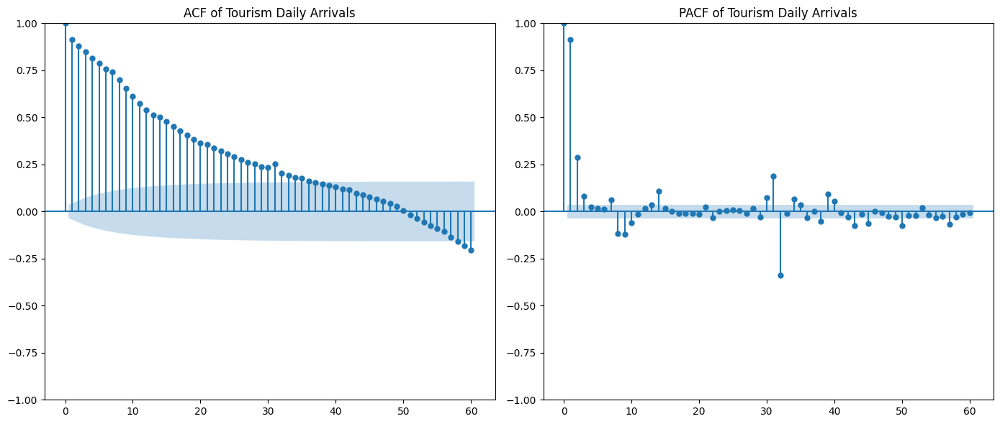

In [4]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

series = DF_sorted[TARGET].dropna()

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plot_acf(series, lags=60, ax=plt.gca())
plt.title("ACF of Tourism Daily Arrivals")

plt.subplot(1, 2, 2)
plot_pacf(series, lags=60, ax=plt.gca(), method="ywm")
plt.title("PACF of Tourism Daily Arrivals")

plt.tight_layout()
plt.savefig("acf_pacf_tourism.png", dpi=300)
plt.show()


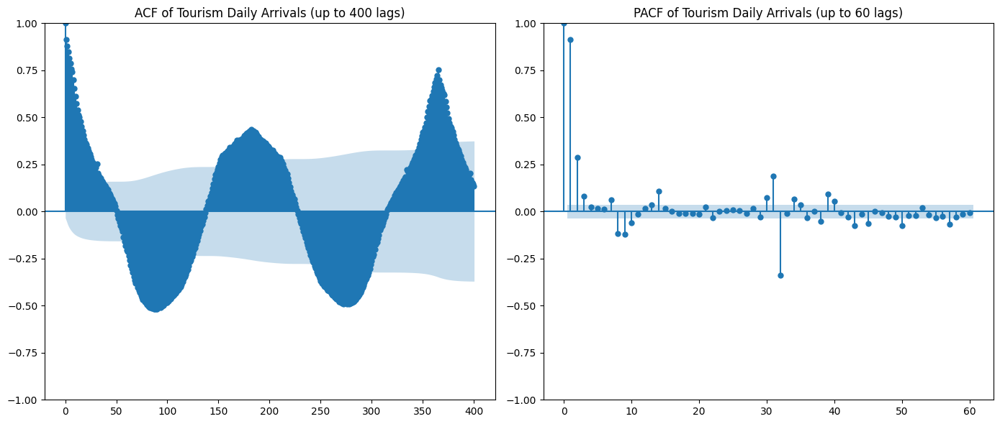

In [5]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

series = DF_sorted[TARGET].dropna()

plt.figure(figsize=(14, 6))

# ---- ACF: long lags (annual) ----
plt.subplot(1, 2, 1)
plot_acf(series, lags=400, ax=plt.gca())
plt.title("ACF of Tourism Daily Arrivals (up to 400 lags)")

# ---- PACF: short lags only ----
plt.subplot(1, 2, 2)
plot_pacf(series, lags=60, ax=plt.gca(), method="ywm")
plt.title("PACF of Tourism Daily Arrivals (up to 60 lags)")

plt.tight_layout()
plt.savefig("acf_pacf_tourism_long.png", dpi=300)
plt.show()


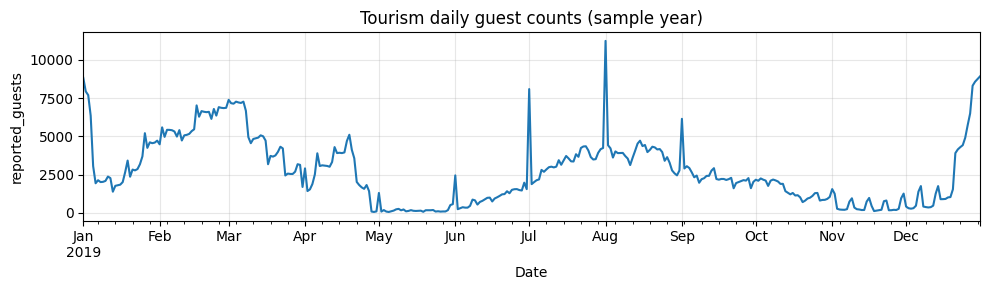

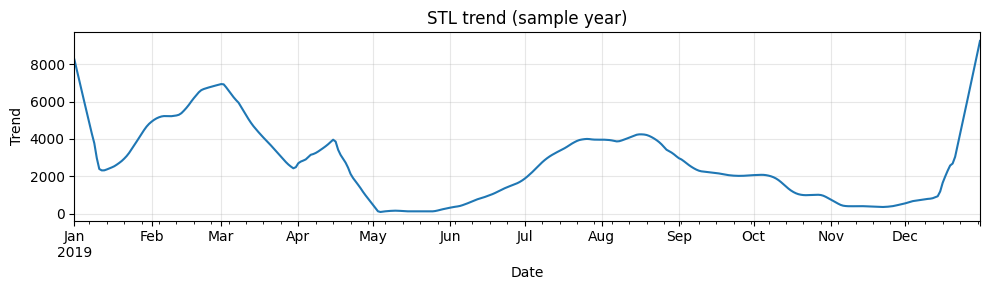

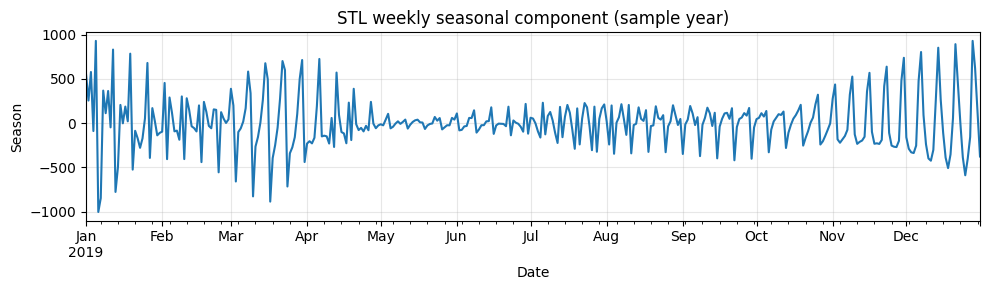

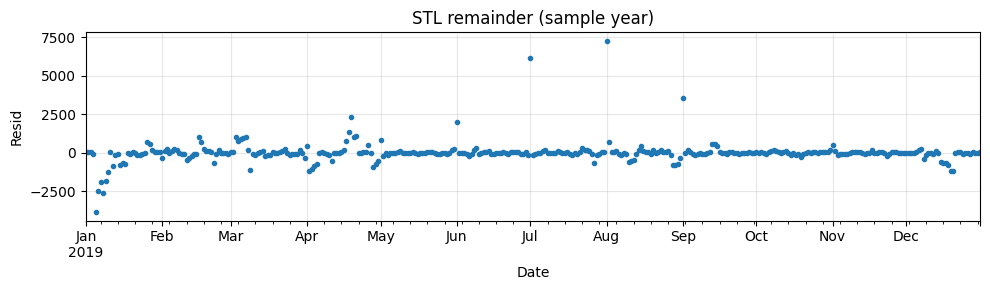

In [6]:
import os
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)

# --- 1) STL on a single representative year (2019) ---
sample = DF_sorted.loc["2019", TARGET].dropna()

stl = STL(sample, period=7, robust=True)
res = stl.fit()

def style_ax(ax, ylabel):
    ax.set_xlabel("Date")
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)
    ax.tick_params(labelsize=10)
    plt.tight_layout()

# -------- 1) Original series --------
fig, ax = plt.subplots(figsize=(10, 3))
sample.plot(ax=ax)
ax.set_title("Tourism daily guest counts (sample year)")
style_ax(ax, TARGET)
plt.savefig(os.path.join(out_dir, "stl_original.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 2) Trend component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.trend.plot(ax=ax)
ax.set_title("STL trend (sample year)")
style_ax(ax, "Trend")
plt.savefig(os.path.join(out_dir, "stl_trend.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 3) Weekly seasonal component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.seasonal.plot(ax=ax)
ax.set_title("STL weekly seasonal component (sample year)")
style_ax(ax, "Season")
plt.savefig(os.path.join(out_dir, "stl_seasonality_weekly.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 4) Remainder component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.resid.plot(ax=ax, style="o", markersize=3)
ax.set_title("STL remainder (sample year)")
style_ax(ax, "Resid")
plt.savefig(os.path.join(out_dir, "stl_residual.png"), dpi=300)
plt.show()
plt.close(fig)




In [7]:

# -------------------------------------------------------
# 1) Use DF_sorted + TARGET from your new pipeline
# -------------------------------------------------------
df_tourism = DF_sorted.copy()        # old code expected df_tourism
assert TARGET in df_tourism.columns, f"Column '{TARGET}' not found"

# -------------------------------------------------------
# 2) Prepare continuous daily index (same as old code)
# -------------------------------------------------------
y_raw = df_tourism[TARGET].astype(float)

full_idx = pd.date_range(
    y_raw.index.min().normalize(),
    y_raw.index.max().normalize(),
    freq='D'
)

# interpolate small gaps (does NOT overwrite original DF)
y = y_raw.reindex(full_idx).interpolate(limit_direction='both')

date_span = f"{y.index.min().date()} – {y.index.max().date()}"

# -------------------------------------------------------
# 3) Create output folder (LaTeX uses 'figures/')
# -------------------------------------------------------
out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)

# Common function for saving plots
def save_plot(series, title, fname, ylabel=TARGET):
    fig, ax = plt.subplots(figsize=(10, 3.4))
    ax.plot(series.index, series.values, linewidth=1.2)
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()

    path = os.path.join(out_dir, fname)
    fig.savefig(path, dpi=300)
    plt.close(fig)
    return path

# -------------------------------------------------------
# 4) MSTL approximation using two-pass STL (same as old)
# -------------------------------------------------------

# --- Pass 1: Weekly seasonality (m=7)
stl_weekly = STL(y, period=7, robust=True).fit()
S7 = pd.Series(stl_weekly.seasonal, index=full_idx)

# --- Remove weekly
y_no_weekly = y - S7

# --- Pass 2: Yearly seasonality (m=365)
stl_yearly = STL(y_no_weekly, period=365, robust=True).fit()
S365 = pd.Series(stl_yearly.seasonal, index=full_idx)
Trend = pd.Series(stl_yearly.trend, index=full_idx)

# Final residual
Resid = y - (S7 + S365 + Trend)

# -------------------------------------------------------
# 5) Save all MSTL figures
# -------------------------------------------------------
paths = []
paths.append(save_plot(y,     f"MSTL: original series (daily) [{date_span}]",           "mstl_original.png"))
paths.append(save_plot(S7,    f"MSTL weekly seasonal component (m = 7)",                "mstl_seasonal_weekly.png"))
paths.append(save_plot(S365,  f"MSTL yearly seasonal component (m ≈ 365)",              "mstl_seasonal_yearly.png"))
paths.append(save_plot(Trend, f"MSTL trend (after removing weekly + yearly)",           "mstl_trend.png"))
paths.append(save_plot(Resid, f"MSTL residual (after trend + weekly + yearly removed)", "mstl_residual.png"))

# -------------------------------------------------------
# 6) Summary
# -------------------------------------------------------
print("Saved MSTL figures:")
for p in paths:
    print(" -", os.path.abspath(p))

print("\nFigure mapping:")
print("  mstl_original         -> MSTL original")
print("  mstl_seasonal_weekly  -> Weekly seasonal")
print("  mstl_seasonal_yearly  -> Yearly seasonal")
print("  mstl_trend            -> Trend")
print("  mstl_residual         -> Residual")


Saved MSTL figures:
 - /kaggle/working/figures/mstl_original.png
 - /kaggle/working/figures/mstl_seasonal_weekly.png
 - /kaggle/working/figures/mstl_seasonal_yearly.png
 - /kaggle/working/figures/mstl_trend.png
 - /kaggle/working/figures/mstl_residual.png

Figure mapping:
  mstl_original         -> MSTL original
  mstl_seasonal_weekly  -> Weekly seasonal
  mstl_seasonal_yearly  -> Yearly seasonal
  mstl_trend            -> Trend
  mstl_residual         -> Residual


In [ ]:
import os
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)

# --- 1) STL on a single representative year (2019) ---
sample = DF_sorted.loc["2019", TARGET].dropna()

stl = STL(sample, period=7, robust=True)
res = stl.fit()

def style_ax(ax, ylabel):
    ax.set_xlabel("Date")
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)
    ax.tick_params(labelsize=10)
    plt.tight_layout()

# -------- 1) Original series --------
fig, ax = plt.subplots(figsize=(10, 3))
sample.plot(ax=ax)
ax.set_title("Tourism daily guest counts (sample year)")
style_ax(ax, TARGET)
plt.savefig(os.path.join(out_dir, "stl_original.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 2) Trend component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.trend.plot(ax=ax)
ax.set_title("STL trend (sample year)")
style_ax(ax, "Trend")
plt.savefig(os.path.join(out_dir, "stl_trend.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 3) Weekly seasonal component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.seasonal.plot(ax=ax)
ax.set_title("STL weekly seasonal component (sample year)")
style_ax(ax, "Season")
plt.savefig(os.path.join(out_dir, "stl_seasonality_weekly.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 4) Remainder component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.resid.plot(ax=ax, style="o", markersize=3)
ax.set_title("STL remainder (sample year)")
style_ax(ax, "Resid")
plt.savefig(os.path.join(out_dir, "stl_residual.png"), dpi=300)
plt.show()
plt.close(fig)




In [ ]:

# -------------------------------------------------------
# 1) Use DF_sorted + TARGET from your new pipeline
# -------------------------------------------------------
df_tourism = DF_sorted.copy()        # old code expected df_tourism
assert TARGET in df_tourism.columns, f"Column '{TARGET}' not found"

# -------------------------------------------------------
# 2) Prepare continuous daily index (same as old code)
# -------------------------------------------------------
y_raw = df_tourism[TARGET].astype(float)

full_idx = pd.date_range(
    y_raw.index.min().normalize(),
    y_raw.index.max().normalize(),
    freq='D'
)

# interpolate small gaps (does NOT overwrite original DF)
y = y_raw.reindex(full_idx).interpolate(limit_direction='both')

date_span = f"{y.index.min().date()} – {y.index.max().date()}"

# -------------------------------------------------------
# 3) Create output folder (LaTeX uses 'figures/')
# -------------------------------------------------------
out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)

# Common function for saving plots
def save_plot(series, title, fname, ylabel=TARGET):
    fig, ax = plt.subplots(figsize=(10, 3.4))
    ax.plot(series.index, series.values, linewidth=1.2)
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()

    path = os.path.join(out_dir, fname)
    fig.savefig(path, dpi=300)
    plt.close(fig)
    return path

# -------------------------------------------------------
# 4) MSTL approximation using two-pass STL (same as old)
# -------------------------------------------------------

# --- Pass 1: Weekly seasonality (m=7)
stl_weekly = STL(y, period=7, robust=True).fit()
S7 = pd.Series(stl_weekly.seasonal, index=full_idx)

# --- Remove weekly
y_no_weekly = y - S7

# --- Pass 2: Yearly seasonality (m=365)
stl_yearly = STL(y_no_weekly, period=365, robust=True).fit()
S365 = pd.Series(stl_yearly.seasonal, index=full_idx)
Trend = pd.Series(stl_yearly.trend, index=full_idx)

# Final residual
Resid = y - (S7 + S365 + Trend)

# -------------------------------------------------------
# 5) Save all MSTL figures
# -------------------------------------------------------
paths = []
paths.append(save_plot(y,     f"MSTL: original series (daily) [{date_span}]",           "mstl_original.png"))
paths.append(save_plot(S7,    f"MSTL weekly seasonal component (m = 7)",                "mstl_seasonal_weekly.png"))
paths.append(save_plot(S365,  f"MSTL yearly seasonal component (m ≈ 365)",              "mstl_seasonal_yearly.png"))
paths.append(save_plot(Trend, f"MSTL trend (after removing weekly + yearly)",           "mstl_trend.png"))
paths.append(save_plot(Resid, f"MSTL residual (after trend + weekly + yearly removed)", "mstl_residual.png"))

# -------------------------------------------------------
# 6) Summary
# -------------------------------------------------------
print("Saved MSTL figures:")
for p in paths:
    print(" -", os.path.abspath(p))

print("\nFigure mapping:")
print("  mstl_original         -> MSTL original")
print("  mstl_seasonal_weekly  -> Weekly seasonal")
print("  mstl_seasonal_yearly  -> Yearly seasonal")
print("  mstl_trend            -> Trend")
print("  mstl_residual         -> Residual")


# with k=1,2,3,5,7

In [4]:
# ==========================================================
# EXPERIMENT — Tourism (final): K ∈ {1,2,3,5,7}, STL+deseasonalize,
# SARIMA & Prophet & TBATS baselines, FE models (median/gaussian/
# trapezoid bumps, holiday one-hot, DOW×bump), with small hyperparam
# searches. Safe index alignment, robust centers and evaluation.
# Outputs: ARTIFACTS[K] with eval tables and metadata.
# ==========================================================
import numpy as np, pandas as pd, warnings, itertools, time
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
warnings.filterwarnings("ignore")

# Prophet optional
try:
    from prophet import Prophet
    _HAS_PROPHET = True
except Exception:
    _HAS_PROPHET = False

# TBATS optional
try:
    from tbats import TBATS
    _HAS_TBATS = True
except Exception:
    _HAS_TBATS = False

# ----------------- Guards / inputs -----------------
TARGET = str(globals().get("TARGET", "reported_guests"))
DF      = globals().get("DF", None)
train   = globals().get("train", None)
val     = globals().get("val", None)
test    = globals().get("test", None)
ART     = dict(globals().get("ARTIFACTS", {}))

assert isinstance(DF, pd.DataFrame), "DF missing — run tourism PREP first."

def _ensure_dt_index(df):
    out = df.copy()
    if not isinstance(out.index, pd.DatetimeIndex):
        if "date" in out.columns:
            out["date"] = pd.to_datetime(out["date"])
            out = out.set_index("date")
        else:
            out.index = pd.to_datetime(out.index)
    out = out.sort_index()
    if not out.index.is_unique:
        out = out[~out.index.duplicated(keep="first")]
    return out

DF   = _ensure_dt_index(DF)
train = _ensure_dt_index(train) if isinstance(train, pd.DataFrame) else None
val   = _ensure_dt_index(val)   if isinstance(val,   pd.DataFrame) else None
test  = _ensure_dt_index(test)  if isinstance(test,  pd.DataFrame) else None

# Fallback splits if PREP didn’t provide them
if any(x is None for x in [train, val, test]):
    idx = DF.index
    end = idx.max()
    test_start = (end - pd.DateOffset(years=1) + pd.DateOffset(days=1)).normalize()
    val_start  = (test_start - pd.DateOffset(years=1)).normalize()
    train = DF.loc[:val_start - pd.Timedelta(days=1)].copy()
    val   = DF.loc[val_start:test_start - pd.Timedelta(days=1)].copy()
    test  = DF.loc[test_start:].copy()

# Centers from ARTIFACTS if provided
centers_train = pd.DatetimeIndex(ART.get("centers_train", []))
centers_val   = pd.DatetimeIndex(ART.get("centers_val", []))
centers_test  = pd.DatetimeIndex(ART.get("centers_test", []))

def _cluster_centers(idx: pd.DatetimeIndex, flag_series: pd.Series) -> pd.DatetimeIndex:
    flag = pd.Series(flag_series, index=idx).fillna(0).astype(bool).values
    days = idx[flag]
    if len(days)==0: return pd.DatetimeIndex([])
    d = pd.DatetimeIndex(sorted(pd.to_datetime(days).normalize().unique()))
    blocks=[]; s=e=d[0]
    for nd in d[1:]:
        if (nd-e).days==1: e=nd
        else: blocks.append((s,e)); s=e=nd
    blocks.append((s,e))
    centers=[]
    for s,e in blocks:
        span=(e-s).days+1
        centers.append(s + pd.Timedelta(days=(span-1)//2))
    return pd.DatetimeIndex(centers)

if len(centers_train)==0 and "is_holiday" in train.columns:
    centers_train = _cluster_centers(train.index, train["is_holiday"])
if len(centers_val)==0 and "is_holiday" in val.columns:
    centers_val   = _cluster_centers(val.index, val["is_holiday"])
if len(centers_test)==0 and "is_holiday" in test.columns:
    centers_test  = _cluster_centers(test.index, test["is_holiday"])

print("SPLITS:")
print(f"  TRAIN: {train.index.min().date()} → {train.index.max().date()} | rows: {len(train)}")
print(f"  VAL  : {val.index.min().date()}   → {val.index.max().date()}   | rows: {len(val)}")
print(f"  TEST : {test.index.min().date()}  → {test.index.max().date()}  | rows: {len(test)}")
print(f"Centers in TRAIN: {len(centers_train)} | VAL: {len(centers_val)} | TEST: {len(centers_test)}")

# ----------------- Helpers -----------------
def _scores(y_true, y_pred):
    ys = pd.Series(y_true).astype(float)
    yp = pd.Series(y_pred).astype(float).reindex(ys.index)
    m = ys.notna() & yp.notna()
    if not m.any():
        return {"MAE": np.nan, "RMSE": np.nan, "R2": np.nan}
    y, p = ys[m], yp[m]
    return {
        "MAE": mean_absolute_error(y, p),
        "RMSE": mean_squared_error(y, p, squared=False),
        "R2": r2_score(y, p) if len(y)>=2 else np.nan
    }

def _window_mask(idx, centers, k):
    if centers is None or len(centers)==0:
        return pd.Series(False, index=idx)
    m = pd.Series(False, index=idx)
    for c in pd.DatetimeIndex(centers):
        m |= (idx >= c - pd.Timedelta(days=k)) & (idx <= c + pd.Timedelta(days=k))
    return m

def evaluate_models_by(df_like, model_cols, target_col, centers, k, tag="occ"):
    out=[]
    y = df_like[target_col].astype(float)
    mask_c0 = df_like.index.isin(centers)
    mask_wk = _window_mask(df_like.index, centers, k)
    mask_non = ~mask_wk
    for m in model_cols:
        if m not in df_like.columns:
            continue
        yp = pd.to_numeric(df_like[m], errors="coerce")
        sc_all = _scores(y, yp)
        sc_c0  = _scores(y[mask_c0],  yp[mask_c0])  if mask_c0.any()  else {"MAE":np.nan,"RMSE":np.nan,"R2":np.nan}
        sc_wk  = _scores(y[mask_wk],  yp[mask_wk])  if mask_wk.any()  else {"MAE":np.nan,"RMSE":np.nan,"R2":np.nan}
        sc_non = _scores(y[mask_non], yp[mask_non]) if mask_non.any() else {"MAE":np.nan,"RMSE":np.nan,"R2":np.nan}
        out.append({
            "Model": m,
            "MAE (all)": sc_all["MAE"], "RMSE (all)": sc_all["RMSE"], "R2 (all)": sc_all["R2"],
            f"MAE ({tag}0)": sc_c0["MAE"], f"RMSE ({tag}0)": sc_c0["RMSE"], f"R2 ({tag}0)": sc_c0["R2"],
            f"MAE (±{k}_{tag})": sc_wk["MAE"], f"RMSE (±{k}_{tag})": sc_wk["RMSE"], f"R2 (±{k}_{tag})": sc_wk["R2"],
            f"MAE (nonwin_{tag})": sc_non["MAE"], f"RMSE (nonwin_{tag})": sc_non["RMSE"], f"R2 (nonwin_{tag})": sc_non["R2"],
            "K": k
        })
    return pd.DataFrame(out)

# Safer STL settings so K=1,2 runs reliably (deseasonalizer independent of K, but this avoids edge cases)
def _stl_addback_from_series(series, period=7):
    y = pd.Series(series).astype(float)
    seasonal_len = max(7, period if period % 2 == 1 else period + 1)  # must be odd, >= 7
    stl = STL(y, period=period, seasonal=seasonal_len, robust=True).fit()
    s_by_dow = stl.seasonal.groupby(stl.seasonal.index.weekday).mean()
    def addback(idx):
        idx = pd.DatetimeIndex(idx)
        return pd.Series([s_by_dow[d] for d in idx.weekday], index=idx, dtype=float)
    return addback

def compute_local_grouped(df_like, y_ds_col, centers, k):
    offs = np.arange(-k, k+1)
    by_dow = {d: [] for d in range(7)}
    for c in pd.DatetimeIndex(centers):
        if c not in df_like.index:
            continue
        win = df_like[y_ds_col].loc[c - pd.Timedelta(days=k): c + pd.Timedelta(days=k)]
        if len(win) != 2*k+1:
            continue
        med = win.median()
        by_dow[c.weekday()].append(win.values - med)
    med_by_dow = {}
    for d in range(7):
        arr = np.vstack(by_dow[d]) if by_dow[d] else np.zeros((1, 2*k+1))
        med_by_dow[d] = np.median(arr, axis=0)
    return offs, by_dow, med_by_dow

def fit_gaussian_to_median(med_by_dow, offs, sigmas=np.linspace(0.8, 5.0, 18)):
    curves={}
    for d, beta in med_by_dow.items():
        best = (np.inf, 0.0, 1.0)
        for s in sigmas:
            w = np.exp(-(offs**2)/(2*s**2)); den = (w**2).sum()
            A = (beta*w).sum()/den if den>0 else 0.0
            g = A*np.exp(-(offs**2)/(2*s**2)); sse = ((beta - g)**2).sum()
            if sse < best[0]: best = (sse, A, s)
        curves[d] = best[1] * np.exp(-(offs**2)/(2*best[2]**2))
    return curves

def fit_trapezoid(by_dow, k):
    offs = np.arange(-k, k+1); curves={}
    for d in range(7):
        arr = np.vstack(by_dow[d]) if by_dow[d] else np.zeros((1, 2*k+1))
        best = (np.inf, 0, 0.0)
        for m in range(k+1):
            T = np.array([1 if abs(u)<=m else (k-abs(u))/(k-m) if (abs(u)<=k and k!=m) else 0 for u in offs])
            den = (T**2).sum(); A = (arr*T).sum()/den if den>0 else 0.0
            sse = ((arr - A*T)**2).sum()
            if sse < best[0]: best = (sse, m, A)
        m0, A = best[1], best[2]
        curves[d] = np.array([A if abs(u)<=m0 else A*(k-abs(u))/(k-m0) if (abs(u)<=k and k!=m0) else 0 for u in offs])
    return curves

def project_bump(index_like, curves_by_dow, centers, k):
    bump = pd.Series(0.0, index=index_like, dtype=float)
    if centers is None or len(centers)==0:
        return bump
    for c in pd.DatetimeIndex(centers):
        d = c.weekday()
        curve = curves_by_dow.get(d, None)
        if curve is None:
            continue
        dt = (index_like - c).days
        mask = (dt>=-k) & (dt<=k)
        if mask.any():
            idx = (dt[mask] + k).astype(int)
            bump.loc[mask] += curve[idx]
    return bump

def build_window_onehot(index_like, centers, k=7, prefix="H"):
    cols = [f"{prefix}_{u:+d}" for u in range(-k, k+1)]
    X = pd.DataFrame(0.0, index=index_like, columns=cols, dtype=float)
    if centers is None or len(centers)==0:
        return X
    col_pos = {c:i for i,c in enumerate(cols)}
    for c in pd.DatetimeIndex(centers):
        dt = (index_like - c).days
        mask = (dt>=-k) & (dt<=k)
        if not mask.any():
            continue
        offs = dt[mask].astype(int).to_numpy()
        col_idx = [col_pos[f"{prefix}_{int(o):+d}"] for o in offs]
        row_idx = np.where(mask.to_numpy() if hasattr(mask,"to_numpy") else mask)[0]
        X.iloc[row_idx, col_idx] = 1.0
    return X

def _dow_ohe(index_like, prefix="D"):
    d = pd.get_dummies(pd.Series(index_like.weekday, index=index_like), prefix=prefix, dtype=int)
    for j in range(7):
        c = f"{prefix}_{j}"
        if c not in d.columns: d[c] = 0
    return d[[f"{prefix}_{j}" for j in range(7)]]

def _addback_safe(pred_series, idx, addback_fn):
    pred = np.asarray(pred_series).reshape(-1)
    if len(pred) != len(idx):
        pred = pred[:len(idx)]
    seas = addback_fn(idx).to_numpy().reshape(-1)
    return pred + seas

# Small SARIMA param grids
SARIMA_RAW_GRID = list(itertools.product(
    [(1,0,1), (2,0,1)],
    [(0,1,1,7), (1,1,1,7)]
))
SARIMA_DS_GRID = list(itertools.product(
    [(1,0,1), (1,0,2)],
    [(0,0,1,7), (1,0,1,7)]
))

# Prophet grids (lightweight)
PROPHET_LIN_GRID = [
    dict(yearly_seasonality=True, weekly_seasonality=True, changepoint_prior_scale=cps)
    for cps in [0.05, 0.5]
]
PROPHET_LOG_GRID = [
    dict(growth="logistic", yearly_seasonality=True, weekly_seasonality=True, changepoint_prior_scale=cps)
    for cps in [0.05, 0.5]
]

def _fit_best_sarima(y, order_grid, seasonal_grid, exog=None):
    best = None
    for ord_ in order_grid:
        for sord in seasonal_grid:
            try:
                m = SARIMAX(
                    y.astype(float),
                    order=ord_,
                    seasonal_order=sord,
                    exog=(None if exog is None else exog.astype(float)),
                    enforce_stationarity=True,
                    enforce_invertibility=True
                ).fit(disp=False)
                aic = m.aic if np.isfinite(m.aic) else np.inf
                if (best is None) or (aic < best[0]):
                    best = (aic, ord_, sord, m)
            except Exception:
                continue
    return best

def _fit_prophet_linear(ds, y, params):
    m = Prophet(
        yearly_seasonality=params.get("yearly_seasonality", True),
        weekly_seasonality=params.get("weekly_seasonality", True),
        daily_seasonality=False,
        changepoint_prior_scale=params.get("changepoint_prior_scale", 0.05)
    )
    dfp = pd.DataFrame({"ds": ds, "y": y})
    m.fit(dfp)
    return m

def _fit_prophet_logistic(ds, y, params):
    capv = float(1.2 * float(np.nanmax(y)))
    dfp = pd.DataFrame({"ds": ds, "y": y, "cap": capv})
    m = Prophet(
        growth="logistic",
        yearly_seasonality=params.get("yearly_seasonality", True),
        weekly_seasonality=params.get("weekly_seasonality", True),
        daily_seasonality=False,
        changepoint_prior_scale=params.get("changepoint_prior_scale", 0.05),
    )
    m.fit(dfp)
    return m, capv

# ----------------- CORE RUN -----------------
K_LIST = [1, 2, 3, 5, 7]
ART_K = {}
start_all = time.time()

print(f"== Running with centers: train={len(centers_train)}, val={len(centers_val)}, test={len(centers_test)} ==")

for K in K_LIST:
    print(f"\n=== Running K={K} (window={2*K+1} days) (centers: train={len(centers_train)}, val={len(centers_val)}, test={len(centers_test)}) ===")

    # Deseasonalizers
    addback_TR  = _stl_addback_from_series(train[TARGET].astype(float), period=7)
    trval = pd.concat([train, val]).sort_index()
    addback_TRV = _stl_addback_from_series(trval[TARGET].astype(float), period=7)
    test_addback_fn = _stl_addback_from_series(trval[TARGET].astype(float), period=7)

    train_ds = train[TARGET].astype(float) - addback_TR(train.index)
    val_ds   = val[TARGET].astype(float)   - addback_TR(val.index)
    trval_ds = trval[TARGET].astype(float) - addback_TRV(trval.index)

    # Learn bump shapes
    offs_h, by_dow_h, med_h_by_dow = compute_local_grouped(
        trval.assign(y_ds=trval_ds), "y_ds", centers_train.union(centers_val), K
    )
    gauss_h_curves = fit_gaussian_to_median(med_h_by_dow, offs_h)
    trap_h_curves  = fit_trapezoid(by_dow_h, K)

    offs_v, by_dow_v, med_v_by_dow = compute_local_grouped(
        train.assign(y_ds=train_ds), "y_ds", centers_train, K
    )
    gauss_v_curves = fit_gaussian_to_median(med_v_by_dow, offs_v)
    trap_v_curves  = fit_trapezoid(by_dow_v, K)

    b_TR_med = project_bump(train.index, {d: med_v_by_dow[d] for d in range(7)}, centers_train, K)
    b_TR_gau = project_bump(train.index, gauss_v_curves, centers_train, K)
    b_TR_tra = project_bump(train.index, trap_v_curves,  centers_train, K)
    b_V_med  = project_bump(val.index,   {d: med_v_by_dow[d] for d in range(7)}, centers_val,   K)
    b_V_gau  = project_bump(val.index,   gauss_v_curves, centers_val, K)
    b_V_tra  = project_bump(val.index,   trap_v_curves,  centers_val, K)

    # One-hot windows
    X_TR_1H  = build_window_onehot(train.index, centers_train, k=K, prefix="H")
    X_V_1H   = build_window_onehot(val.index,   centers_val,   k=K, prefix="H")

    # DOW × bump (median)
    D_TR = _dow_ohe(train.index, "D")
    D_V  = _dow_ohe(val.index,   "D")

    def _dxi(bump, D):
        return pd.concat(
            [D.iloc[:, j].astype(float).mul(bump.values, axis=0).rename(f"D{j}*b")
             for j in range(D.shape[1])],
            axis=1
        )

    X_TR_dxi_med = _dxi(b_TR_med, D_TR)
    X_V_dxi_med  = _dxi(b_V_med,  D_V)

    # ----------------- VAL predictions -----------------
    val = val.copy()

    # SARIMA baseline (raw)
    best = _fit_best_sarima(
        train[TARGET],
        [o for o,_ in SARIMA_RAW_GRID],
        [s for _,s in SARIMA_RAW_GRID],
        exog=None
    )
    if best:
        _, ord_, sorder, model = best
        val["SARIMA_baseline"] = model.get_forecast(steps=len(val)).predicted_mean.to_numpy()

    # Holiday flag baseline (raw)
    if "is_holiday" in train.columns:
        best_h = _fit_best_sarima(
            train[TARGET],
            [o for o,_ in SARIMA_RAW_GRID],
            [s for _,s in SARIMA_RAW_GRID],
            exog=train[["is_holiday"]]
        )
        if best_h:
            _, _, _, model = best_h
            val["SARIMA_hol_flag"] = model.get_forecast(
                steps=len(val), exog=val[["is_holiday"]]
            ).predicted_mean.to_numpy()

    # Prophet baselines
    if _HAS_PROPHET:
        # linear
        best_lin = None
        for p in PROPHET_LIN_GRID:
            try:
                m = _fit_prophet_linear(train.index, train[TARGET].values, p)
                yhat = m.predict(pd.DataFrame({"ds": val.index}))["yhat"].values
                rmse = mean_squared_error(val[TARGET].values, yhat, squared=False)
                if (best_lin is None) or (rmse < best_lin[0]):
                    best_lin = (rmse, p, m)
            except Exception:
                continue
        if best_lin:
            val["Prophet_linear_baseline"] = best_lin[2].predict(
                pd.DataFrame({"ds": val.index})
            )["yhat"].values

        # logistic
        best_log = None
        for p in PROPHET_LOG_GRID:
            try:
                m, capv = _fit_prophet_logistic(train.index, train[TARGET].values, p)
                yhat = m.predict(pd.DataFrame({"ds": val.index, "cap": capv}))["yhat"].values
                rmse = mean_squared_error(val[TARGET].values, yhat, squared=False)
                if (best_log is None) or (rmse < best_log[0]):
                    best_log = (rmse, p, m, capv)
            except Exception:
                continue
        if best_log:
            _, _, mlog, capv = best_log
            val["Prophet_logistic_baseline"] = mlog.predict(
                pd.DataFrame({"ds": val.index, "cap": capv})
            )["yhat"].values

    # TBATS baseline (raw)
    if _HAS_TBATS:
        try:
            estimator = TBATS(seasonal_periods=[7])
            tb_model = estimator.fit(train[TARGET].astype(float).values)
            val["TBATS_baseline"] = tb_model.forecast(steps=len(val))
        except Exception as e:
            print(f"TBATS VAL failed (ignored): {e}")

    # FE models on deseasonalised y
    def _fit_sarima_ds_exog(y_ds, exog, order_grid, seas_grid):
        return _fit_best_sarima(y_ds, [o for o in order_grid], [s for s in seas_grid], exog=exog)

    ORD_DS  = [(1,0,1), (1,0,2)]
    SORD_DS = [(0,0,1,7), (1,0,1,7)]

    # median
    best_med = _fit_sarima_ds_exog(train_ds, b_TR_med.to_frame("b"), ORD_DS, SORD_DS)
    if best_med:
        _, _, _, model = best_med
        val["SARIMA_median_stl"] = _addback_safe(
            model.get_forecast(steps=len(val), exog=b_V_med.to_frame("b")).predicted_mean,
            val.index, addback_TR
        )

    # gaussian
    best_gau = _fit_sarima_ds_exog(train_ds, b_TR_gau.to_frame("b"), ORD_DS, SORD_DS)
    if best_gau:
        _, _, _, model = best_gau
        val["SARIMA_gaussian_stl"] = _addback_safe(
            model.get_forecast(steps=len(val), exog=b_V_gau.to_frame("b")).predicted_mean,
            val.index, addback_TR
        )

    # trapezoid
    best_tra = _fit_sarima_ds_exog(train_ds, b_TR_tra.to_frame("b"), ORD_DS, SORD_DS)
    if best_tra:
        _, _, _, model = best_tra
        val["SARIMA_trapezoid_stl"] = _addback_safe(
            model.get_forecast(steps=len(val), exog=b_V_tra.to_frame("b")).predicted_mean,
            val.index, addback_TR
        )

    # holiday one-hot (DS)
    best_1h = _fit_sarima_ds_exog(train_ds, X_TR_1H, ORD_DS, SORD_DS)
    if best_1h:
        _, _, _, model = best_1h
        val["SARIMA_onehot_stl"] = _addback_safe(
            model.get_forecast(steps=len(val), exog=X_V_1H).predicted_mean,
            val.index, addback_TR
        )

    # DOW × median bump (DS)
    best_dxi = _fit_sarima_ds_exog(train_ds, X_TR_dxi_med, ORD_DS, SORD_DS)
    if best_dxi:
        _, _, _, model = best_dxi
        val["SARIMA_days_interaction_stl"] = _addback_safe(
            model.get_forecast(steps=len(val), exog=X_V_dxi_med).predicted_mean,
            val.index, addback_TR
        )

    # Prophet DS + bump  (and Prophet DS + DOW×bump)  ✅ ADDED
    if _HAS_PROPHET:
        def _prophet_ds_train_predict(train_idx, y_ds, bump_hist, val_idx, bump_val, addback_fn):
            dfp = pd.DataFrame({"ds": train_idx, "y": y_ds.values, "b": bump_hist.values})
            m = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
            m.add_regressor("b")
            m.fit(dfp)
            dfv = pd.DataFrame({"ds": val_idx, "b": bump_val.values})
            yhat_ds = m.predict(dfv)["yhat"].values
            return np.asarray(yhat_ds) + addback_fn(val_idx).to_numpy()

        # ✅ ADDED: Prophet DS with DOW×bump regressors
        def _prophet_ds_train_predict_dxi(train_idx, y_ds, X_hist_dxi, val_idx, X_val_dxi, addback_fn):
            cols = list(X_hist_dxi.columns)
            dfp = pd.DataFrame({"ds": train_idx, "y": y_ds.values})
            for c in cols:
                dfp[c] = X_hist_dxi[c].values
            m = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
            for c in cols:
                m.add_regressor(c)
            m.fit(dfp)
            dfv = pd.DataFrame({"ds": val_idx})
            for c in cols:
                dfv[c] = X_val_dxi[c].values
            yhat_ds = m.predict(dfv)["yhat"].values
            return np.asarray(yhat_ds) + addback_fn(val_idx).to_numpy()

        try:
            val["Prophet_lin_median_stl"]    = _prophet_ds_train_predict(
                train.index, train_ds, b_TR_med, val.index, b_V_med, addback_TR)
            val["Prophet_lin_gaussian_stl"]  = _prophet_ds_train_predict(
                train.index, train_ds, b_TR_gau, val.index, b_V_gau, addback_TR)
            val["Prophet_lin_trapezoid_stl"] = _prophet_ds_train_predict(
                train.index, train_ds, b_TR_tra, val.index, b_V_tra, addback_TR)

            # ✅ ADDED: Prophet FE days interaction (DOW×median bump)
            val["Prophet_lin_days_interaction_stl"] = _prophet_ds_train_predict_dxi(
                train.index, train_ds, X_TR_dxi_med, val.index, X_V_dxi_med, addback_TR
            )
        except Exception:
            pass

    # ----------------- TEST predictions (refit on TRVAL) -----------------
    test = test.copy()

    # Baseline SARIMA on TRVAL
    best_raw_TRV = _fit_best_sarima(
        trval[TARGET],
        [o for o,_ in SARIMA_RAW_GRID],
        [s for _,s in SARIMA_RAW_GRID],
        exog=None
    )
    if best_raw_TRV:
        _, _, _, model = best_raw_TRV
        test["SARIMA_baseline"] = model.get_forecast(steps=len(test)).predicted_mean.to_numpy()

    if "is_holiday" in trval.columns:
        best_h_TRV = _fit_best_sarima(
            trval[TARGET],
            [o for o,_ in SARIMA_RAW_GRID],
            [s for _,s in SARIMA_RAW_GRID],
            exog=trval[["is_holiday"]]
        )
        if best_h_TRV:
            _, _, _, model = best_h_TRV
            test["SARIMA_hol_flag"] = model.get_forecast(
                steps=len(test), exog=test[["is_holiday"]]
            ).predicted_mean.to_numpy()

    if _HAS_PROPHET:
        # linear
        best_lin_TRV = None
        for p in PROPHET_LIN_GRID:
            try:
                m = _fit_prophet_linear(trval.index, trval[TARGET].values, p)
                yhat = m.predict(pd.DataFrame({"ds": test.index}))["yhat"].values
                rmse = mean_squared_error(test[TARGET].values, yhat, squared=False)
                if (best_lin_TRV is None) or (rmse < best_lin_TRV[0]):
                    best_lin_TRV = (rmse, p, m)
            except Exception:
                continue
        if best_lin_TRV:
            test["Prophet_linear_baseline"] = best_lin_TRV[2].predict(
                pd.DataFrame({"ds": test.index})
            )["yhat"].values

        # logistic
        best_log_TRV = None
        for p in PROPHET_LOG_GRID:
            try:
                m, capv = _fit_prophet_logistic(trval.index, trval[TARGET].values, p)
                yhat = m.predict(pd.DataFrame({"ds": test.index, "cap": capv}))["yhat"].values
                rmse = mean_squared_error(test[TARGET].values, yhat, squared=False)
                if (best_log_TRV is None) or (rmse < best_log_TRV[0]):
                    best_log_TRV = (rmse, p, m, capv)
            except Exception:
                continue
        if best_log_TRV:
            _, _, mlog, capv = best_log_TRV
            test["Prophet_logistic_baseline"] = mlog.predict(
                pd.DataFrame({"ds": test.index, "cap": capv})
            )["yhat"].values

    # TBATS baseline (TRVAL→TEST)
    if _HAS_TBATS:
        try:
            estimator = TBATS(seasonal_periods=[7])
            tb_model_trv = estimator.fit(trval[TARGET].astype(float).values)
            test["TBATS_baseline"] = tb_model_trv.forecast(steps=len(test))
        except Exception as e:
            print(f"TBATS TEST failed (ignored): {e}")

    # Refit DS+bump on TRVAL
    offs_h2, by_dow_h2, med_h2 = compute_local_grouped(
        trval.assign(y_ds=trval_ds), "y_ds", centers_train.union(centers_val), K
    )
    gauss_h2 = fit_gaussian_to_median(med_h2, offs_h2)
    trap_h2  = fit_trapezoid(by_dow_h2, K)

    b_TRV_med = project_bump(trval.index, {d: med_h2[d] for d in range(7)},
                             centers_train.union(centers_val), K)
    b_TRV_gau = project_bump(trval.index, gauss_h2, centers_train.union(centers_val), K)
    b_TRV_tra = project_bump(trval.index, trap_h2,  centers_train.union(centers_val), K)

    b_TE_med = project_bump(test.index, {d: med_h2[d] for d in range(7)}, centers_test, K)
    b_TE_gau = project_bump(test.index, gauss_h2, centers_test, K)
    b_TE_tra = project_bump(test.index, trap_h2,  centers_test, K)

    best_med_TRV = _fit_sarima_ds_exog(trval_ds, b_TRV_med.to_frame("b"), ORD_DS, SORD_DS)
    if best_med_TRV:
        _, _, _, model = best_med_TRV
        test["SARIMA_median_stl"] = _addback_safe(
            model.get_forecast(steps=len(test), exog=b_TE_med.to_frame("b")).predicted_mean,
            test.index, test_addback_fn
        )

    best_gau_TRV = _fit_sarima_ds_exog(trval_ds, b_TRV_gau.to_frame("b"), ORD_DS, SORD_DS)
    if best_gau_TRV:
        _, _, _, model = best_gau_TRV
        test["SARIMA_gaussian_stl"] = _addback_safe(
            model.get_forecast(steps=len(test), exog=b_TE_gau.to_frame("b")).predicted_mean,
            test.index, test_addback_fn
        )

    best_tra_TRV = _fit_sarima_ds_exog(trval_ds, b_TRV_tra.to_frame("b"), ORD_DS, SORD_DS)
    if best_tra_TRV:
        _, _, _, model = best_tra_TRV
        test["SARIMA_trapezoid_stl"] = _addback_safe(
            model.get_forecast(steps=len(test), exog=b_TE_tra.to_frame("b")).predicted_mean,
            test.index, test_addback_fn
        )

    # one-hot & D×bump on TRVAL
    X_TRV_1H  = build_window_onehot(trval.index, centers_train.union(centers_val), k=K, prefix="H")
    X_TE_1H   = build_window_onehot(test.index,  centers_test,  k=K, prefix="H")

    best_1h_TRV = _fit_sarima_ds_exog(trval_ds, X_TRV_1H, ORD_DS, SORD_DS)
    if best_1h_TRV:
        _, _, _, model = best_1h_TRV
        test["SARIMA_onehot_stl"] = _addback_safe(
            model.get_forecast(steps=len(test), exog=X_TE_1H).predicted_mean,
            test.index, test_addback_fn
        )

    D_TRV = _dow_ohe(trval.index, "D")
    D_TE  = _dow_ohe(test.index,  "D")

    def _dxi2(bump_hist, D_hist, bump_new, D_new):
        XH = pd.concat(
            [D_hist.iloc[:, j].astype(float).mul(bump_hist.values, axis=0).rename(f"D{j}*b")
             for j in range(D_hist.shape[1])],
            axis=1
        )
        XE = pd.concat(
            [D_new.iloc[:, j].astype(float).mul(bump_new.values, axis=0).rename(f"D{j}*b")
             for j in range(D_new.shape[1])],
            axis=1
        )
        XH = XH.reindex(trval.index).fillna(0.0)
        XE = XE.reindex(test.index).fillna(0.0)
        return XH, XE

    X_TRV_dxi_med, X_TE_dxi_med = _dxi2(b_TRV_med, D_TRV, b_TE_med, D_TE)

    best_dxi_TRV = _fit_sarima_ds_exog(trval_ds, X_TRV_dxi_med, ORD_DS, SORD_DS)
    if best_dxi_TRV:
        _, _, _, model = best_dxi_TRV
        test["SARIMA_days_interaction_stl"] = _addback_safe(
            model.get_forecast(steps=len(test), exog=X_TE_dxi_med).predicted_mean,
            test.index, test_addback_fn
        )

    # Prophet DS + bump (TRVAL→TEST) + Prophet DS + DOW×bump ✅ ADDED
    if _HAS_PROPHET:
        def _prophet_ds_trv_predict(trv_idx, y_ds_trv, bump_hist, test_idx, bump_test, addback_fn):
            dfp = pd.DataFrame({"ds": trv_idx, "y": y_ds_trv.values, "b": bump_hist.values})
            m = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
            m.add_regressor("b")
            m.fit(dfp)
            dft = pd.DataFrame({"ds": test_idx, "b": bump_test.values})
            yhat_ds = m.predict(dft)["yhat"].values
            return np.asarray(yhat_ds) + addback_fn(test_idx).to_numpy()

        # ✅ ADDED: Prophet DS with DOW×bump regressors
        def _prophet_ds_trv_predict_dxi(trv_idx, y_ds_trv, X_trv_dxi, test_idx, X_test_dxi, addback_fn):
            cols = list(X_trv_dxi.columns)
            dfp = pd.DataFrame({"ds": trv_idx, "y": y_ds_trv.values})
            for c in cols:
                dfp[c] = X_trv_dxi[c].values
            m = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
            for c in cols:
                m.add_regressor(c)
            m.fit(dfp)
            dft = pd.DataFrame({"ds": test_idx})
            for c in cols:
                dft[c] = X_test_dxi[c].values
            yhat_ds = m.predict(dft)["yhat"].values
            return np.asarray(yhat_ds) + addback_fn(test_idx).to_numpy()

        try:
            test["Prophet_lin_median_stl"]    = _prophet_ds_trv_predict(
                trval.index, trval_ds, b_TRV_med, test.index, b_TE_med, test_addback_fn)
            test["Prophet_lin_gaussian_stl"]  = _prophet_ds_trv_predict(
                trval.index, trval_ds, b_TRV_gau, test.index, b_TE_gau, test_addback_fn)
            test["Prophet_lin_trapezoid_stl"] = _prophet_ds_trv_predict(
                trval.index, trval_ds, b_TRV_tra, test.index, b_TE_tra, test_addback_fn)

            # ✅ ADDED: Prophet FE days interaction (DOW×median bump)
            test["Prophet_lin_days_interaction_stl"] = _prophet_ds_trv_predict_dxi(
                trval.index, trval_ds, X_TRV_dxi_med, test.index, X_TE_dxi_med, test_addback_fn
            )
        except Exception:
            pass

    # ----------------- EVALUATE -----------------
    test_cols0 = set(DF.columns)
    models_on_test = [c for c in test.columns if c not in test_cols0 and c != TARGET]

    eval_test = evaluate_models_by(test, models_on_test, TARGET, centers_test, K, tag="occ")
    eval_val  = evaluate_models_by(val,  [c for c in val.columns if c in models_on_test],
                                   TARGET, centers_val, K, tag="occ")

    eval_test = eval_test.sort_values("RMSE (all)").reset_index(drop=True)
    eval_val  = eval_val.sort_values("RMSE (all)").reset_index(drop=True)

    # Pick best baseline by window metric if available
    def _pick_best_baseline(scores_tbl, k):
        if scores_tbl.empty:
            return None
        pref = ["SARIMA_baseline","Prophet_linear_baseline",
                "Prophet_logistic_baseline","TBATS_baseline"]
        cand = [p for p in pref if p in set(scores_tbl["Model"])]
        win = f"RMSE (±{k}_occ)"
        if cand:
            sub = scores_tbl.set_index("Model").loc[cand]
            if win in sub and sub[win].notna().any():
                return sub[win].astype(float).idxmin()
            return sub["RMSE (all)"].astype(float).idxmin()
        return scores_tbl.sort_values("RMSE (all)").iloc[0]["Model"]

    best_baseline_test = _pick_best_baseline(eval_test, K)
    champion_test      = eval_test.iloc[0]["Model"] if not eval_test.empty else None

    print(f"K={K} | metric used: RMSE (±{K}_occ)")
    if not eval_test.empty:
        disp = eval_test[["Model", f"RMSE (±{K}_occ)", "RMSE (all)"]].copy()
        print(disp.to_string(index=False))
    print("best_baseline_test:", best_baseline_test)
    print("champion_test     :", champion_test)

    ART_K[K] = {
        "eval_test": eval_test,
        "eval_val":  eval_val,
        "models_on_test": models_on_test,
        "best_baseline_test": best_baseline_test,
        "champion_test": champion_test,
    }

ART.update(ART_K)
globals()["ARTIFACTS"] = ART

elapsed = time.time() - start_all
print(f"\nDone. K present: {sorted([k for k in ART_K])} | Total time: {elapsed:.1f}s")


SPLITS:
  TRAIN: 2016-01-01 → 2022-04-30 | rows: 2312
  VAL  : 2022-05-01   → 2023-04-30   | rows: 365
  TEST : 2023-05-01  → 2024-04-30  | rows: 366
Centers in TRAIN: 75 | VAL: 12 | TEST: 12
== Running with centers: train=75, val=12, test=12 ==

=== Running K=1 (window=3 days) (centers: train=75, val=12, test=12) ===


00:03:57 - cmdstanpy - INFO - Chain [1] start processing
00:03:58 - cmdstanpy - INFO - Chain [1] done processing
00:03:58 - cmdstanpy - INFO - Chain [1] start processing
00:03:59 - cmdstanpy - INFO - Chain [1] done processing
00:03:59 - cmdstanpy - INFO - Chain [1] start processing
00:03:59 - cmdstanpy - INFO - Chain [1] done processing
00:04:02 - cmdstanpy - INFO - Chain [1] start processing
00:04:02 - cmdstanpy - INFO - Chain [1] done processing
00:15:51 - cmdstanpy - INFO - Chain [1] start processing
00:15:51 - cmdstanpy - INFO - Chain [1] done processing
00:15:51 - cmdstanpy - INFO - Chain [1] start processing
00:15:51 - cmdstanpy - INFO - Chain [1] done processing
00:15:52 - cmdstanpy - INFO - Chain [1] start processing
00:15:52 - cmdstanpy - INFO - Chain [1] done processing
00:15:52 - cmdstanpy - INFO - Chain [1] start processing
00:15:52 - cmdstanpy - INFO - Chain [1] done processing
00:18:27 - cmdstanpy - INFO - Chain [1] start processing
00:18:27 - cmdstanpy - INFO - Chain [1]

K=1 | metric used: RMSE (±1_occ)
                           Model  RMSE (±1_occ)  RMSE (all)
        Prophet_lin_gaussian_stl    1043.209875  980.976466
Prophet_lin_days_interaction_stl    1078.865256  984.775454
       Prophet_lin_trapezoid_stl    1085.927201  985.386048
          Prophet_lin_median_stl    1135.114493  992.658493
         Prophet_linear_baseline    1158.628791  995.149704
       Prophet_logistic_baseline    1150.987976  996.770081
                 SARIMA_hol_flag    2096.906411 1973.318611
                 SARIMA_baseline    2117.967703 1976.634167
     SARIMA_days_interaction_stl    2147.603005 2066.359496
                  TBATS_baseline    3351.388368 3254.937007
               SARIMA_onehot_stl    3446.281265 3255.724939
               SARIMA_median_stl    3420.072732 3345.908344
             SARIMA_gaussian_stl    3424.355376 3346.448583
            SARIMA_trapezoid_stl    3490.367060 3352.941191
best_baseline_test: Prophet_logistic_baseline
champion_test     : P

00:30:45 - cmdstanpy - INFO - Chain [1] start processing
00:30:45 - cmdstanpy - INFO - Chain [1] done processing
00:30:45 - cmdstanpy - INFO - Chain [1] start processing
00:30:46 - cmdstanpy - INFO - Chain [1] done processing
00:30:46 - cmdstanpy - INFO - Chain [1] start processing
00:30:47 - cmdstanpy - INFO - Chain [1] done processing
00:30:49 - cmdstanpy - INFO - Chain [1] start processing
00:30:50 - cmdstanpy - INFO - Chain [1] done processing
00:42:32 - cmdstanpy - INFO - Chain [1] start processing
00:42:32 - cmdstanpy - INFO - Chain [1] done processing
00:42:32 - cmdstanpy - INFO - Chain [1] start processing
00:42:32 - cmdstanpy - INFO - Chain [1] done processing
00:42:33 - cmdstanpy - INFO - Chain [1] start processing
00:42:33 - cmdstanpy - INFO - Chain [1] done processing
00:42:33 - cmdstanpy - INFO - Chain [1] start processing
00:42:33 - cmdstanpy - INFO - Chain [1] done processing
00:45:06 - cmdstanpy - INFO - Chain [1] start processing
00:45:06 - cmdstanpy - INFO - Chain [1]

K=2 | metric used: RMSE (±2_occ)
                           Model  RMSE (±2_occ)  RMSE (all)
       Prophet_lin_trapezoid_stl    1011.994361  979.745577
        Prophet_lin_gaussian_stl    1028.301633  983.650284
Prophet_lin_days_interaction_stl    1063.324588  988.704622
          Prophet_lin_median_stl    1068.783740  992.689968
         Prophet_linear_baseline    1083.753984  995.149704
       Prophet_logistic_baseline    1076.514136  996.770081
                 SARIMA_hol_flag    2152.847541 1973.318611
                 SARIMA_baseline    2168.784725 1976.634167
                  TBATS_baseline    3376.618174 3254.937007
               SARIMA_median_stl    3441.350475 3345.040049
     SARIMA_days_interaction_stl    3445.410637 3345.299338
             SARIMA_gaussian_stl    3460.889668 3348.495607
               SARIMA_onehot_stl    3473.445754 3352.157657
            SARIMA_trapezoid_stl    3486.197691 3352.650336
best_baseline_test: Prophet_logistic_baseline
champion_test     : P

00:57:24 - cmdstanpy - INFO - Chain [1] start processing
00:57:25 - cmdstanpy - INFO - Chain [1] done processing
00:57:25 - cmdstanpy - INFO - Chain [1] start processing
00:57:25 - cmdstanpy - INFO - Chain [1] done processing
00:57:26 - cmdstanpy - INFO - Chain [1] start processing
00:57:26 - cmdstanpy - INFO - Chain [1] done processing
00:57:28 - cmdstanpy - INFO - Chain [1] start processing
00:57:29 - cmdstanpy - INFO - Chain [1] done processing
01:09:18 - cmdstanpy - INFO - Chain [1] start processing
01:09:18 - cmdstanpy - INFO - Chain [1] done processing
01:09:18 - cmdstanpy - INFO - Chain [1] start processing
01:09:18 - cmdstanpy - INFO - Chain [1] done processing
01:09:19 - cmdstanpy - INFO - Chain [1] start processing
01:09:19 - cmdstanpy - INFO - Chain [1] done processing
01:09:19 - cmdstanpy - INFO - Chain [1] start processing
01:09:19 - cmdstanpy - INFO - Chain [1] done processing
01:11:51 - cmdstanpy - INFO - Chain [1] start processing
01:11:51 - cmdstanpy - INFO - Chain [1]

K=3 | metric used: RMSE (±3_occ)
                           Model  RMSE (±3_occ)  RMSE (all)
       Prophet_lin_trapezoid_stl    1033.242783  973.821954
        Prophet_lin_gaussian_stl    1040.032211  979.303848
Prophet_lin_days_interaction_stl    1098.586196  990.907943
          Prophet_lin_median_stl    1088.398012  991.697116
         Prophet_linear_baseline    1096.722830  995.149704
       Prophet_logistic_baseline    1091.744532  996.770081
                 SARIMA_hol_flag    2101.033555 1973.318611
                 SARIMA_baseline    2115.186140 1976.634167
                  TBATS_baseline    3284.283999 3254.937007
             SARIMA_gaussian_stl    3340.395330 3344.192669
     SARIMA_days_interaction_stl    3348.331003 3346.086354
               SARIMA_median_stl    3357.828260 3347.603511
            SARIMA_trapezoid_stl    3373.452189 3351.254293
               SARIMA_onehot_stl    3401.266277 3358.652366
best_baseline_test: Prophet_logistic_baseline
champion_test     : P

01:24:16 - cmdstanpy - INFO - Chain [1] start processing
01:24:17 - cmdstanpy - INFO - Chain [1] done processing
01:24:17 - cmdstanpy - INFO - Chain [1] start processing
01:24:17 - cmdstanpy - INFO - Chain [1] done processing
01:24:18 - cmdstanpy - INFO - Chain [1] start processing
01:24:18 - cmdstanpy - INFO - Chain [1] done processing
01:24:20 - cmdstanpy - INFO - Chain [1] start processing
01:24:21 - cmdstanpy - INFO - Chain [1] done processing
01:36:48 - cmdstanpy - INFO - Chain [1] start processing
01:36:49 - cmdstanpy - INFO - Chain [1] done processing
01:36:49 - cmdstanpy - INFO - Chain [1] start processing
01:36:49 - cmdstanpy - INFO - Chain [1] done processing
01:36:49 - cmdstanpy - INFO - Chain [1] start processing
01:36:49 - cmdstanpy - INFO - Chain [1] done processing
01:36:49 - cmdstanpy - INFO - Chain [1] start processing
01:36:50 - cmdstanpy - INFO - Chain [1] done processing
01:39:26 - cmdstanpy - INFO - Chain [1] start processing
01:39:26 - cmdstanpy - INFO - Chain [1]

K=5 | metric used: RMSE (±5_occ)
                           Model  RMSE (±5_occ)  RMSE (all)
       Prophet_lin_trapezoid_stl     989.791812  974.800573
        Prophet_lin_gaussian_stl     983.367827  979.839628
Prophet_lin_days_interaction_stl    1003.954751  984.348561
          Prophet_lin_median_stl    1011.498531  990.752074
         Prophet_linear_baseline    1025.134777  995.149704
       Prophet_logistic_baseline    1022.017245  996.770081
                 SARIMA_hol_flag    1943.098625 1973.318611
                 SARIMA_baseline    1958.782895 1976.634167
                  TBATS_baseline    2974.757428 3254.937007
            SARIMA_trapezoid_stl    2966.471629 3326.116949
             SARIMA_gaussian_stl    3026.146772 3342.266593
               SARIMA_onehot_stl    3046.353971 3349.085938
               SARIMA_median_stl    3061.219720 3351.440117
     SARIMA_days_interaction_stl    3046.369052 3355.109377
best_baseline_test: Prophet_logistic_baseline
champion_test     : P

01:52:07 - cmdstanpy - INFO - Chain [1] start processing
01:52:07 - cmdstanpy - INFO - Chain [1] done processing
01:52:07 - cmdstanpy - INFO - Chain [1] start processing
01:52:08 - cmdstanpy - INFO - Chain [1] done processing
01:52:08 - cmdstanpy - INFO - Chain [1] start processing
01:52:08 - cmdstanpy - INFO - Chain [1] done processing
01:52:10 - cmdstanpy - INFO - Chain [1] start processing
01:52:11 - cmdstanpy - INFO - Chain [1] done processing
02:04:45 - cmdstanpy - INFO - Chain [1] start processing
02:04:45 - cmdstanpy - INFO - Chain [1] done processing
02:04:45 - cmdstanpy - INFO - Chain [1] start processing
02:04:45 - cmdstanpy - INFO - Chain [1] done processing
02:04:45 - cmdstanpy - INFO - Chain [1] start processing
02:04:46 - cmdstanpy - INFO - Chain [1] done processing
02:04:46 - cmdstanpy - INFO - Chain [1] start processing
02:04:46 - cmdstanpy - INFO - Chain [1] done processing
02:07:17 - cmdstanpy - INFO - Chain [1] start processing
02:07:17 - cmdstanpy - INFO - Chain [1]

K=7 | metric used: RMSE (±7_occ)
                           Model  RMSE (±7_occ)  RMSE (all)
        Prophet_lin_gaussian_stl     934.041978  979.309947
       Prophet_lin_trapezoid_stl     959.278136  985.001776
Prophet_lin_days_interaction_stl     957.141385  990.361563
          Prophet_lin_median_stl     955.406089  991.485203
         Prophet_linear_baseline     970.133742  995.149704
       Prophet_logistic_baseline     968.800856  996.770081
                 SARIMA_hol_flag    1858.179605 1973.318611
                 SARIMA_baseline    1872.566380 1976.634167
                  TBATS_baseline    2859.491217 3254.937007
     SARIMA_days_interaction_stl    2929.107190 3311.657163
             SARIMA_gaussian_stl    2897.889672 3335.713949
            SARIMA_trapezoid_stl    2913.924012 3340.606452
               SARIMA_onehot_stl    2964.419975 3357.171386
               SARIMA_median_stl    2966.454784 3357.241038
best_baseline_test: Prophet_logistic_baseline
champion_test     : P

TEST range: 2023-05-01 → 2024-04-30 | rows: 366
Centers in TEST: 12

=== Leaderboards by K (TEST) ===

K=1


,Model,RMSE (all),RMSE (±1_occ),RMSE (nonwin_occ),R2 (all)
0,Prophet_lin_gaussian_stl,980.976466,1043.209875,974.163499,0.777883
1,Prophet_lin_days_interaction_stl,984.775454,1078.865256,974.295327,0.776159
2,Prophet_lin_trapezoid_stl,985.386048,1085.927201,974.148364,0.775882
3,Prophet_lin_median_stl,992.658493,1135.114493,976.380844,0.772561
4,Prophet_linear_baseline,995.149704,1158.628791,976.264336,0.771418
5,Prophet_logistic_baseline,996.770081,1150.987976,979.043943,0.770673
6,SARIMA_hol_flag,1973.318611,2096.906411,1959.794846,0.101209
7,SARIMA_baseline,1976.634167,2117.967703,1961.094160,0.098186
8,SARIMA_days_interaction_stl,2066.359496,2147.603005,2057.581266,0.014456
9,TBATS_baseline,3254.937007,3351.388368,3244.570608,-1.445398



K=2


,Model,RMSE (all),RMSE (±2_occ),RMSE (nonwin_occ),R2 (all)
0,Prophet_lin_trapezoid_stl,979.745577,1011.994361,973.553241,0.778440
1,Prophet_lin_gaussian_stl,983.650284,1028.301633,975.013151,0.776671
2,Prophet_lin_days_interaction_stl,988.704622,1063.324588,974.013399,0.774370
3,Prophet_lin_median_stl,992.689968,1068.783740,977.698216,0.772547
4,Prophet_linear_baseline,995.149704,1083.753984,977.566347,0.771418
5,Prophet_logistic_baseline,996.770081,1076.514136,981.028353,0.770673
6,SARIMA_hol_flag,1973.318611,2152.847541,1937.651002,0.101209
7,SARIMA_baseline,1976.634167,2168.784725,1938.319886,0.098186
8,TBATS_baseline,3254.937007,3376.618174,3231.510414,-1.445398
9,SARIMA_median_stl,3345.040049,3441.350475,3326.591706,-1.582659



K=3


,Model,RMSE (all),RMSE (±3_occ),RMSE (nonwin_occ),R2 (all)
0,Prophet_lin_trapezoid_stl,973.821954,1033.242783,957.094155,0.781111
1,Prophet_lin_gaussian_stl,979.303848,1040.032211,962.197210,0.778640
2,Prophet_lin_days_interaction_stl,990.907943,1098.586196,959.668133,0.773363
3,Prophet_lin_median_stl,991.697116,1088.398012,963.839115,0.773002
4,Prophet_linear_baseline,995.149704,1096.722830,965.803706,0.771418
5,Prophet_logistic_baseline,996.770081,1091.744532,969.447938,0.770673
6,SARIMA_hol_flag,1973.318611,2101.033555,1937.280744,0.101209
7,SARIMA_baseline,1976.634167,2115.186140,1937.405262,0.098186
8,TBATS_baseline,3254.937007,3284.283999,3246.943216,-1.445398
9,SARIMA_gaussian_stl,3344.192669,3340.395330,3345.220373,-1.581350



K=5


,Model,RMSE (all),RMSE (±5_occ),RMSE (nonwin_occ),R2 (all)
0,Prophet_lin_trapezoid_stl,974.800573,989.791812,968.202467,0.780671
1,Prophet_lin_gaussian_stl,979.839628,983.367827,978.299849,0.778398
2,Prophet_lin_days_interaction_stl,984.348561,1003.954751,975.691035,0.776353
3,Prophet_lin_median_stl,990.752074,1011.498531,981.584294,0.773434
4,Prophet_linear_baseline,995.149704,1025.134777,981.811347,0.771418
5,Prophet_logistic_baseline,996.770081,1022.017245,985.578124,0.770673
6,SARIMA_hol_flag,1973.318611,1943.098625,1986.329573,0.101209
7,SARIMA_baseline,1976.634167,1958.782895,1984.354555,0.098186
8,TBATS_baseline,3254.937007,2974.757428,3369.627829,-1.445398
9,SARIMA_trapezoid_stl,3326.116949,2966.471629,3471.047118,-1.553521



K=7


,Model,RMSE (all),RMSE (±7_occ),RMSE (nonwin_occ),R2 (all)
0,Prophet_lin_gaussian_stl,979.309947,934.041978,1005.417732,0.778637
1,Prophet_lin_trapezoid_stl,985.001776,959.278136,1000.074753,0.776057
2,Prophet_lin_days_interaction_stl,990.361563,957.141385,1009.713254,0.773613
3,Prophet_lin_median_stl,991.485203,955.406089,1012.455175,0.773099
4,Prophet_linear_baseline,995.149704,970.133742,1009.819355,0.771418
5,Prophet_logistic_baseline,996.770081,968.800856,1013.133686,0.770673
6,SARIMA_hol_flag,1973.318611,1858.179605,2039.095069,0.101209
7,SARIMA_baseline,1976.634167,1872.566380,2036.352032,0.098186
8,TBATS_baseline,3254.937007,2859.491217,3470.035505,-1.445398
9,SARIMA_days_interaction_stl,3311.657163,2929.107190,3520.702425,-1.531367



=== Leaderboards by K (VALIDATION) ===

K=1


,Model,RMSE (all),RMSE (±1_occ),RMSE (nonwin_occ),R2 (all)
0,Prophet_logistic_baseline,927.790801,1065.616580,911.951956,0.801156
1,Prophet_lin_median_stl,1163.682981,740.884460,1199.817988,0.687189
2,Prophet_linear_baseline,1172.673778,828.495572,1203.417622,0.682337
3,Prophet_lin_trapezoid_stl,1181.444986,877.554977,1209.204443,0.677567
4,Prophet_lin_gaussian_stl,1184.537621,837.373266,1215.556279,0.675877
5,Prophet_lin_days_interaction_stl,1185.454379,851.863729,1215.476896,0.675375
6,SARIMA_hol_flag,1968.848674,2180.657880,1945.031631,0.104559
7,SARIMA_baseline,1969.467256,2205.696653,1942.728512,0.103996
8,TBATS_baseline,3347.803796,3581.778283,3322.021882,-1.589001
9,SARIMA_median_stl,3393.546935,3622.227960,3368.382380,-1.660235



K=2


,Model,RMSE (all),RMSE (±2_occ),RMSE (nonwin_occ),R2 (all)
0,Prophet_logistic_baseline,927.790801,1129.857654,884.445600,0.801156
1,Prophet_lin_trapezoid_stl,1164.465107,989.976260,1194.571401,0.686769
2,Prophet_lin_median_stl,1168.425427,995.376094,1198.315451,0.684634
3,Prophet_lin_days_interaction_stl,1168.564626,962.318966,1203.566832,0.684559
4,Prophet_linear_baseline,1172.673778,969.048916,1207.292643,0.682337
5,Prophet_lin_gaussian_stl,1178.660949,991.959184,1210.704402,0.679085
6,SARIMA_hol_flag,1968.848674,2198.140211,1922.460828,0.104559
7,SARIMA_baseline,1969.467256,2218.893002,1918.706360,0.103996
8,SARIMA_days_interaction_stl,2358.190426,2586.209655,2312.588268,-0.284606
9,TBATS_baseline,3347.803796,3572.323777,3303.673116,-1.589001



K=3


,Model,RMSE (all),RMSE (±3_occ),RMSE (nonwin_occ),R2 (all)
0,Prophet_logistic_baseline,927.790801,1135.453316,862.757564,0.801156
1,Prophet_lin_days_interaction_stl,1161.795013,1012.021088,1199.271892,0.688203
2,Prophet_lin_trapezoid_stl,1168.269993,1046.790667,1199.160390,0.684718
3,Prophet_linear_baseline,1172.673778,1034.307060,1207.541745,0.682337
4,Prophet_lin_median_stl,1176.029202,1046.465559,1208.844117,0.680516
5,Prophet_lin_gaussian_stl,1184.564120,1044.926247,1219.754944,0.675862
6,SARIMA_hol_flag,1968.848674,2153.249985,1915.667471,0.104559
7,SARIMA_baseline,1969.467256,2173.703326,1910.190483,0.103996
8,SARIMA_days_interaction_stl,2459.739470,2566.650863,2429.870608,-0.397624
9,TBATS_baseline,3347.803796,3459.370821,3316.833961,-1.589001



K=5


,Model,RMSE (all),RMSE (±5_occ),RMSE (nonwin_occ),R2 (all)
0,Prophet_logistic_baseline,927.790801,1114.568477,833.121622,0.801156
1,Prophet_lin_trapezoid_stl,1131.050633,1102.061047,1143.488568,0.704487
2,Prophet_lin_days_interaction_stl,1159.633185,1086.785723,1190.068770,0.689363
3,Prophet_linear_baseline,1172.673778,1122.150410,1194.081850,0.682337
4,Prophet_lin_gaussian_stl,1177.321458,1117.388514,1202.575133,0.679814
5,Prophet_lin_median_stl,1179.494209,1108.316728,1209.284591,0.678631
6,SARIMA_hol_flag,1968.848674,1992.567386,1958.393214,0.104559
7,SARIMA_baseline,1969.467256,2012.177151,1950.509070,0.103996
8,SARIMA_days_interaction_stl,2089.555093,2051.855305,2105.818286,-0.008602
9,TBATS_baseline,3347.803796,3161.189869,3426.165513,-1.589001



K=7


,Model,RMSE (all),RMSE (±7_occ),RMSE (nonwin_occ),R2 (all)
0,Prophet_logistic_baseline,927.790801,1065.560237,834.134980,0.801156
1,Prophet_lin_days_interaction_stl,1170.846684,1119.326783,1200.741090,0.683326
2,Prophet_lin_median_stl,1172.331423,1123.841597,1200.526239,0.682522
3,Prophet_linear_baseline,1172.673778,1146.318307,1188.229052,0.682337
4,Prophet_lin_trapezoid_stl,1196.785711,1180.912863,1206.222887,0.669139
5,Prophet_lin_gaussian_stl,1205.203366,1164.590544,1228.961346,0.664469
6,SARIMA_hol_flag,1968.848674,1910.277475,2003.219271,0.104559
7,SARIMA_baseline,1969.467256,1927.051542,1994.520099,0.103996
8,TBATS_baseline,3347.803796,3015.969583,3532.233469,-1.589001
9,SARIMA_trapezoid_stl,3361.239014,2967.547841,3577.019126,-1.609823



=== Cross-K summary (TEST) ===


,K,Champion,BestBaseline,Champion RMSE(all),Δwindow (±1)% vs baseline,Δwindow (±2)% vs baseline,Δwindow (±3)% vs baseline,Δwindow (±5)% vs baseline,Δwindow (±7)% vs baseline
0,1,Prophet_lin_gaussian_stl,Prophet_logistic_baseline,980.976466,9.363964,NaN,NaN,NaN,NaN
1,2,Prophet_lin_trapezoid_stl,Prophet_logistic_baseline,979.745577,NaN,5.993398,NaN,NaN,NaN
2,3,Prophet_lin_trapezoid_stl,Prophet_logistic_baseline,973.821954,NaN,NaN,5.358557,NaN,NaN
3,5,Prophet_lin_trapezoid_stl,Prophet_logistic_baseline,974.800573,NaN,NaN,NaN,3.15312,NaN
4,7,Prophet_lin_gaussian_stl,Prophet_logistic_baseline,979.309947,NaN,NaN,NaN,NaN,3.587825



Deep-dive K selected: 1

=== Generalization gap (Test − Val RMSE) — lower is better ===


,Model,Role,Gap Test-VAL (RMSE)
0,Prophet_lin_gaussian_stl,Champion,-203.561155
1,Prophet_logistic_baseline,BestBaseline,68.979279



=== FE effectiveness (TEST, each K) — positive % means FE beats best baseline ===

K=1


,FE Model,Δ(±1)% vs baseline,Δ(all)% vs baseline
0,Prophet_lin_gaussian_stl,9.363964,1.584479
1,Prophet_lin_days_interaction_stl,6.266158,1.203349
2,Prophet_lin_trapezoid_stl,5.652603,1.142092
3,Prophet_lin_median_stl,1.379118,0.412491
4,SARIMA_days_interaction_stl,-86.587788,-107.305530
5,SARIMA_onehot_stl,-199.419398,-226.627474
6,SARIMA_median_stl,-197.142351,-235.675038
7,SARIMA_gaussian_stl,-197.514435,-235.729237
8,SARIMA_trapezoid_stl,-203.249654,-236.380601



K=2


,FE Model,Δ(±2)% vs baseline,Δ(all)% vs baseline
0,Prophet_lin_trapezoid_stl,5.993398,1.707967
1,Prophet_lin_gaussian_stl,4.478576,1.316231
2,Prophet_lin_days_interaction_stl,1.225209,0.809159
3,Prophet_lin_median_stl,0.718095,0.409333
4,SARIMA_median_stl,-219.675363,-235.587927
5,SARIMA_days_interaction_stl,-220.052522,-235.613940
6,SARIMA_gaussian_stl,-221.490406,-235.934602
7,SARIMA_onehot_stl,-222.656771,-236.301994
8,SARIMA_trapezoid_stl,-223.841330,-236.351422



K=3


,FE Model,Δ(±3)% vs baseline,Δ(all)% vs baseline
0,Prophet_lin_trapezoid_stl,5.358557,2.302249
1,Prophet_lin_gaussian_stl,4.736669,1.752283
2,Prophet_lin_days_interaction_stl,-0.626673,0.588113
3,Prophet_lin_median_stl,0.306530,0.508940
4,SARIMA_gaussian_stl,-205.968588,-235.502914
5,SARIMA_days_interaction_stl,-206.695468,-235.692896
6,SARIMA_median_stl,-207.565384,-235.845104
7,SARIMA_trapezoid_stl,-208.996481,-236.211365
8,SARIMA_onehot_stl,-211.544155,-236.953569



K=5


,FE Model,Δ(±5)% vs baseline,Δ(all)% vs baseline
0,Prophet_lin_trapezoid_stl,3.153120,2.204070
1,Prophet_lin_gaussian_stl,3.781680,1.698531
2,Prophet_lin_days_interaction_stl,1.767337,1.246177
3,Prophet_lin_median_stl,1.029211,0.603751
4,SARIMA_trapezoid_stl,-190.256514,-233.689485
5,SARIMA_gaussian_stl,-196.095471,-235.309682
6,SARIMA_onehot_stl,-198.072658,-235.993827
7,SARIMA_median_stl,-199.527208,-236.230007
8,SARIMA_days_interaction_stl,-198.074134,-236.598122



K=7


,FE Model,Δ(±7)% vs baseline,Δ(all)% vs baseline
0,Prophet_lin_gaussian_stl,3.587825,1.751671
1,Prophet_lin_trapezoid_stl,0.982939,1.180644
2,Prophet_lin_days_interaction_stl,1.203495,0.642928
3,Prophet_lin_median_stl,1.382613,0.530200
4,SARIMA_days_interaction_stl,-202.343580,-232.238821
5,SARIMA_gaussian_stl,-199.121296,-234.652295
6,SARIMA_trapezoid_stl,-200.776367,-235.143130
7,SARIMA_onehot_stl,-205.988579,-236.804991
8,SARIMA_median_stl,-206.198613,-236.811979



FE summary — average Δ(all)% over FE models (by K):


,Avg Δ(all)%
K,
1,-115.263941
2,-130.616355
3,-130.561585
5,-130.229844
7,-130.171753



=== Per-window comparison (TEST, K=1) — Champion vs Baseline ===


,date,Holiday,ΔRMSE (±1)%,RMSE (Prophet_logistic_baseline),RMSE (Prophet_lin_gaussian_stl)
0,2023-05-01,Labor Day,51.766545,667.671714,322.041139
1,2023-05-18,Ascension Day,38.427794,128.120321,78.886508
2,2024-04-01,Easter Monday,32.735182,1510.204772,1015.836490
3,2024-01-01,New Year's Day,24.092510,2456.213469,1864.449998
4,2023-12-08,Immaculate Conception,23.933641,1432.458811,1089.619265
5,2023-12-25,Christmas Day,16.156082,582.973885,488.788147
6,2024-01-06,Epiphany,-10.372256,1839.054947,2029.806440
7,2023-08-15,Assumption Day,-35.668895,631.644966,856.945745
8,2023-06-08,Corpus Christi,-45.180701,352.547742,511.831281
9,2023-10-26,National Day,-60.954518,517.101889,832.298853


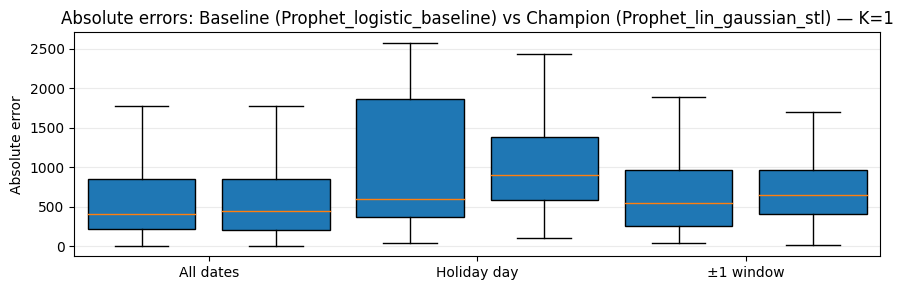

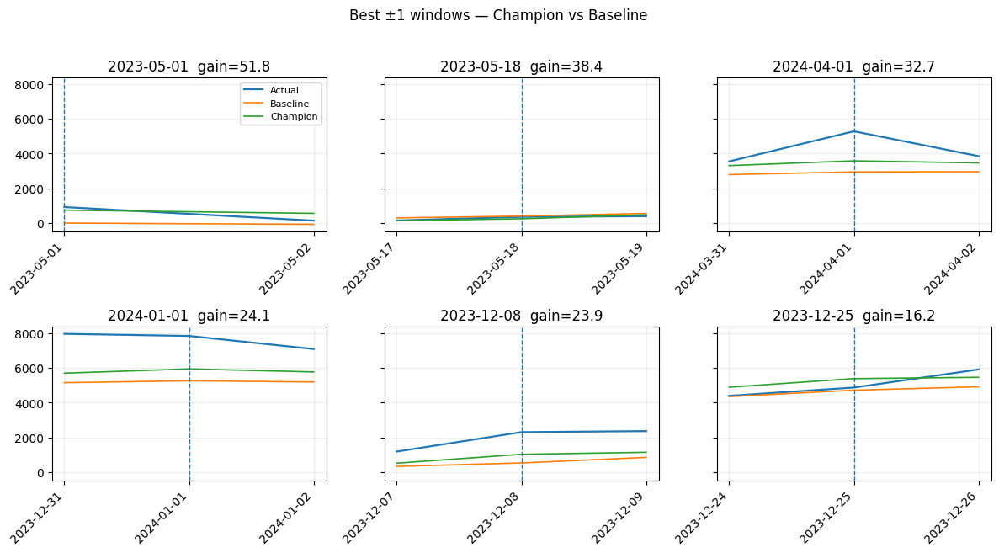

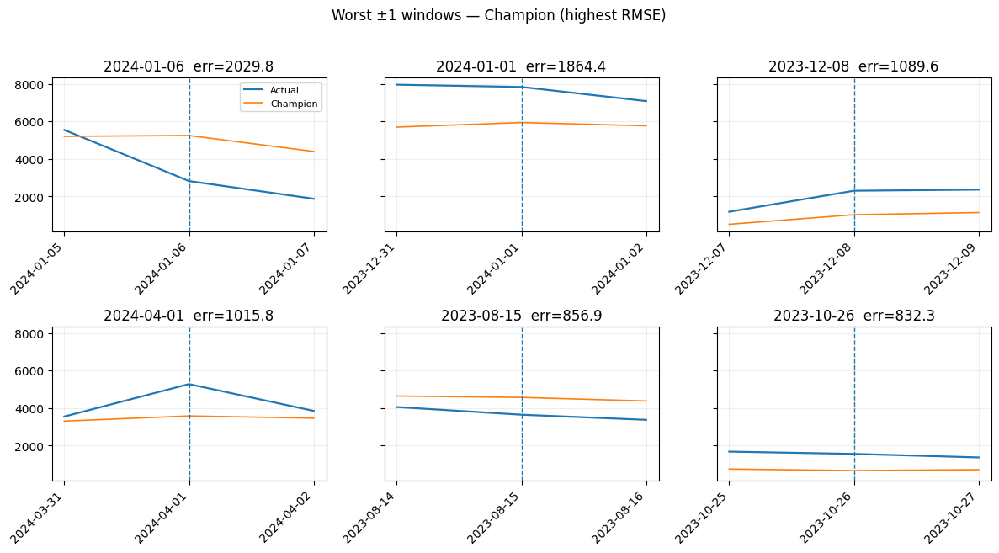


=== Per-window comparison (TEST, K=2) — Champion vs Baseline ===


,date,Holiday,ΔRMSE (±2)%,RMSE (Prophet_logistic_baseline),RMSE (Prophet_lin_gaussian_stl)
0,2023-05-01,Labor Day,52.496563,561.926515,266.934406
1,2024-04-01,Easter Monday,31.131732,1262.058149,869.157591
2,2023-12-08,Immaculate Conception,23.121901,1126.313912,865.888726
3,2024-01-01,New Year's Day,21.475452,2293.349168,1800.842057
4,2023-05-18,Ascension Day,12.499676,246.084419,215.324664
5,2023-12-25,Christmas Day,4.690403,899.964222,857.752272
6,2024-01-06,Epiphany,-6.340443,1815.138225,1930.226037
7,2023-08-15,Assumption Day,-26.470823,665.002493,841.034128
8,2023-06-08,Corpus Christi,-42.471215,317.327850,452.100842
9,2023-10-26,National Day,-57.358855,473.946532,745.796839


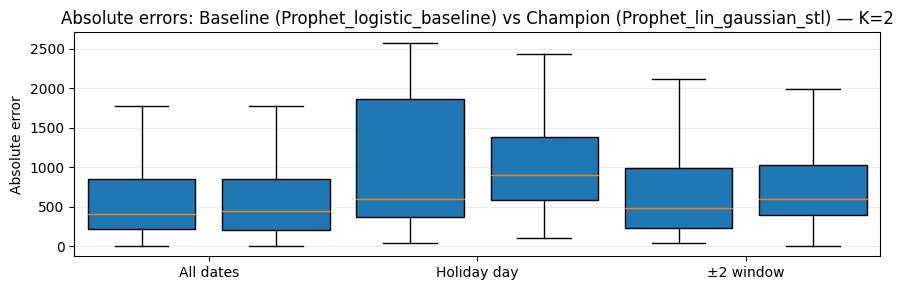

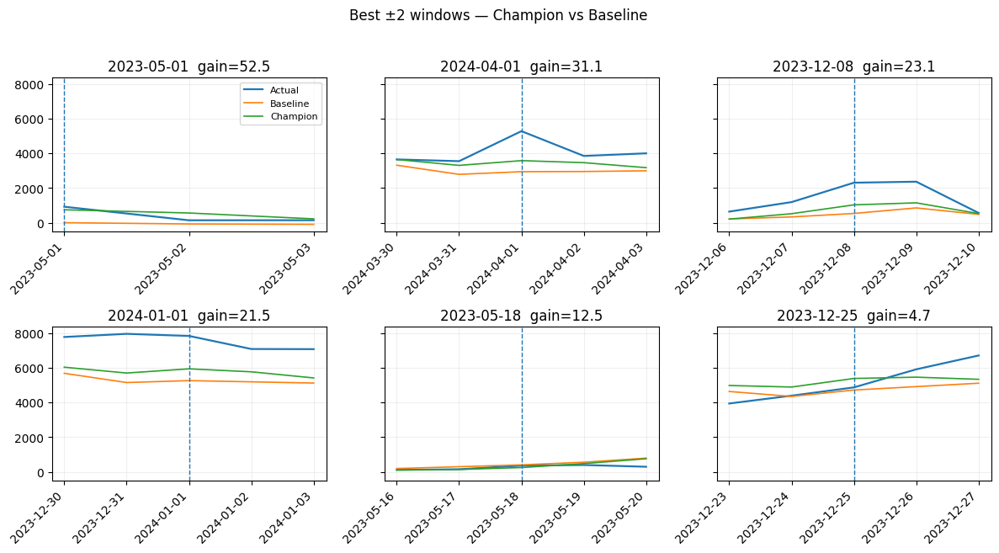

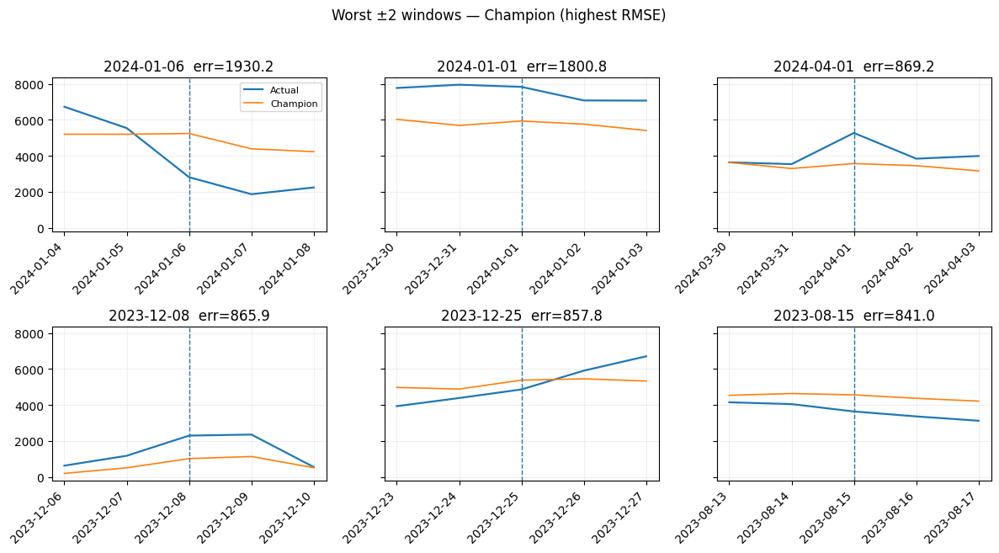


=== Per-window comparison (TEST, K=3) — Champion vs Baseline ===


,date,Holiday,ΔRMSE (±3)%,RMSE (Prophet_logistic_baseline),RMSE (Prophet_lin_gaussian_stl)
0,2023-05-01,Labor Day,53.125604,495.340252,232.187749
1,2023-12-08,Immaculate Conception,22.262659,969.441176,753.617794
2,2024-04-01,Easter Monday,20.777586,1319.735973,1045.526698
3,2024-01-01,New Year's Day,19.574616,2116.198973,1701.961155
4,2023-05-18,Ascension Day,16.316496,229.768162,192.278049
5,2023-12-25,Christmas Day,-0.136181,1419.754076,1421.687508
6,2024-01-06,Epiphany,-2.975046,1801.386979,1854.979067
7,2023-05-29,Whit Monday,-12.704216,915.130491,1031.390648
8,2023-08-15,Assumption Day,-25.304522,628.348654,787.349276
9,2023-06-08,Corpus Christi,-41.686338,302.654716,428.820383


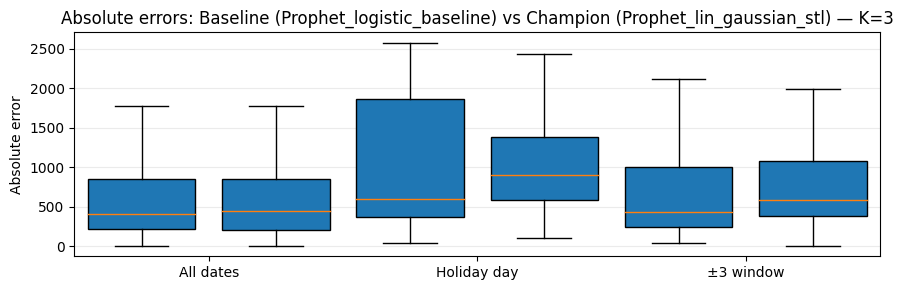

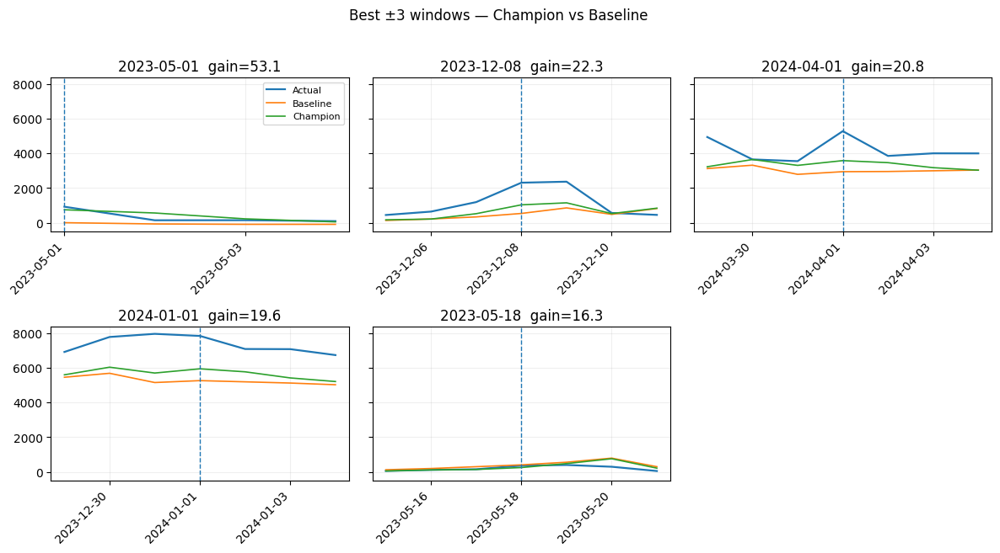

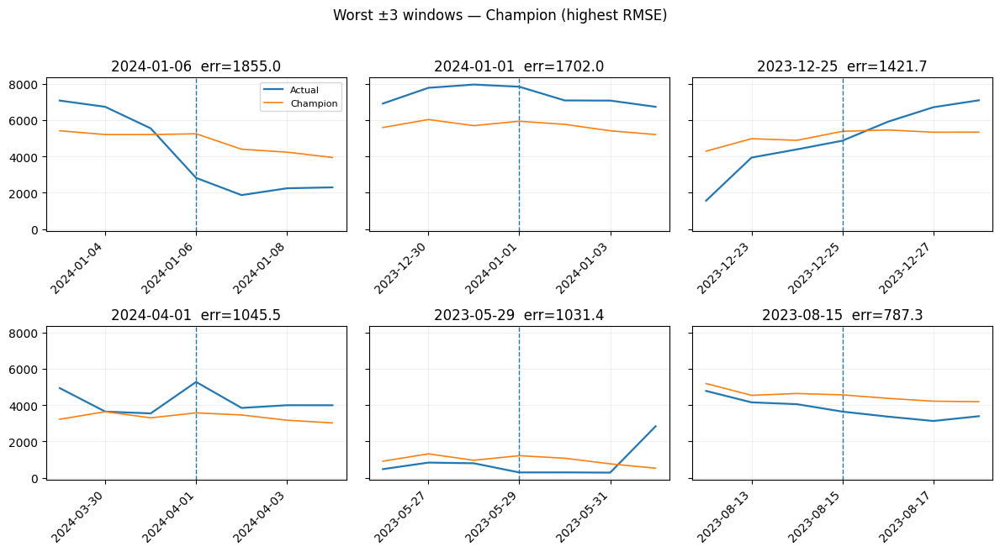


=== Per-window comparison (TEST, K=5) — Champion vs Baseline ===


,date,Holiday,ΔRMSE (±5)%,RMSE (Prophet_logistic_baseline),RMSE (Prophet_lin_gaussian_stl)
0,2023-05-01,Labor Day,51.157378,409.580764,200.049982
1,2023-12-08,Immaculate Conception,18.627518,851.254600,692.686998
2,2024-04-01,Easter Monday,13.920182,1216.365754,1047.045423
3,2024-01-01,New Year's Day,13.794401,1954.493784,1684.883077
4,2023-05-18,Ascension Day,10.381037,260.286515,233.266075
5,2024-01-06,Epiphany,5.102413,1802.667156,1710.687639
6,2023-12-25,Christmas Day,3.342968,1724.135327,1666.498030
7,2023-05-29,Whit Monday,-11.211281,761.063269,846.388210
8,2023-08-15,Assumption Day,-20.781513,591.602969,714.547018
9,2023-06-08,Corpus Christi,-31.961860,309.374078,408.255788


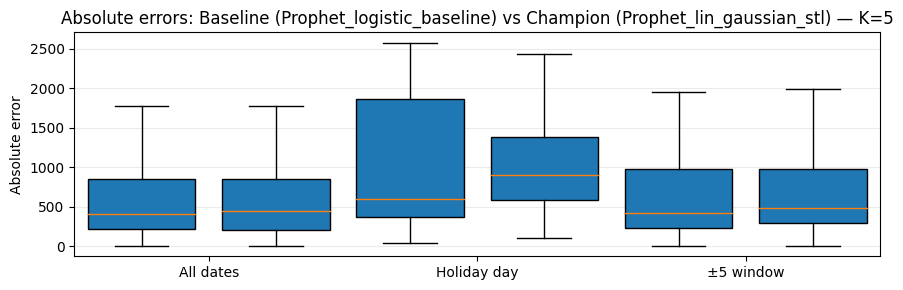

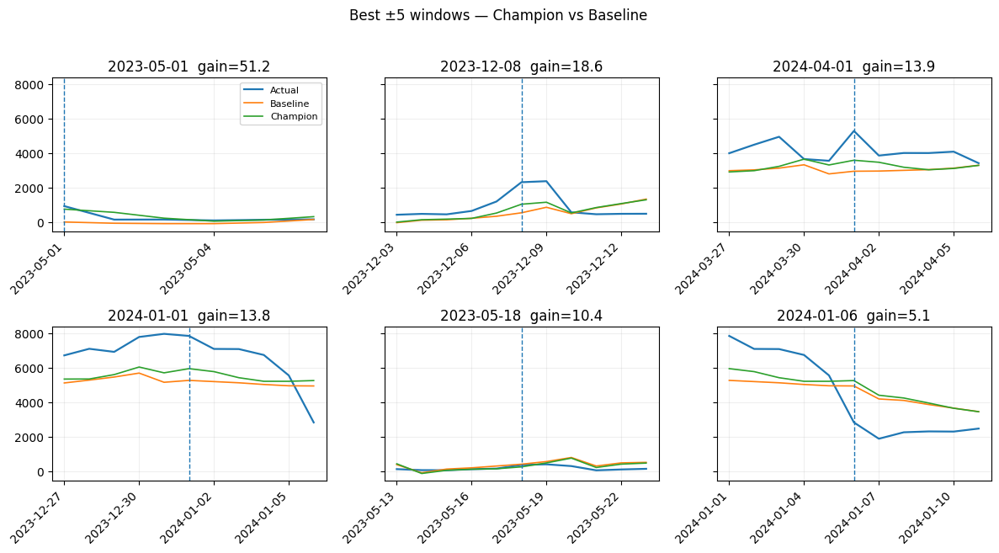

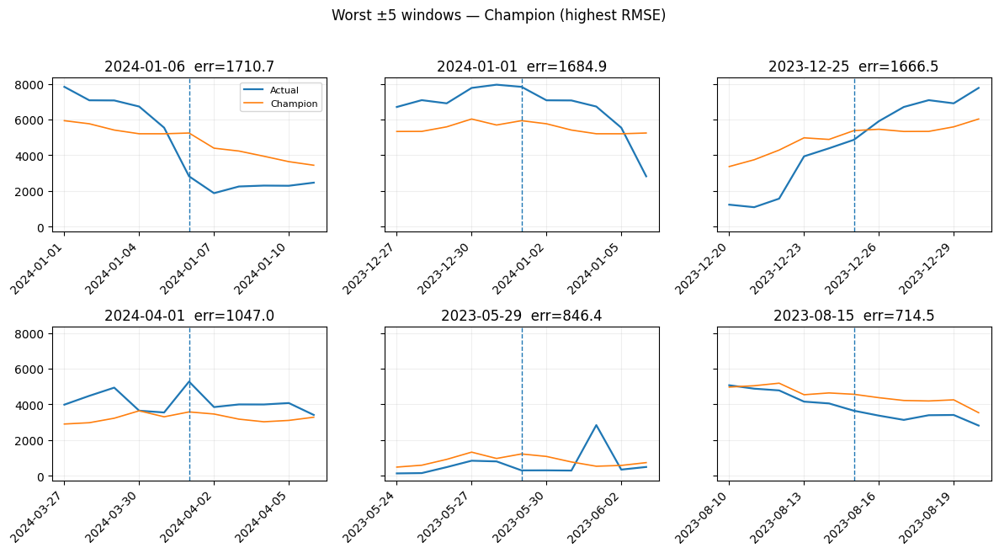


=== Per-window comparison (TEST, K=7) — Champion vs Baseline ===


,date,Holiday,ΔRMSE (±7)%,RMSE (Prophet_logistic_baseline),RMSE (Prophet_lin_gaussian_stl)
0,2023-05-01,Labor Day,45.040212,399.973063,219.824350
1,2023-12-08,Immaculate Conception,15.452210,835.160263,706.109549
2,2024-04-01,Easter Monday,12.300308,1119.420713,981.728518
3,2023-05-18,Ascension Day,10.134076,279.302538,250.997807
4,2024-01-01,New Year's Day,9.922179,1857.589702,1673.276328
5,2024-01-06,Epiphany,8.084520,1796.247060,1651.029108
6,2023-12-25,Christmas Day,7.905144,1872.908038,1724.851959
7,2023-06-08,Corpus Christi,-4.679412,668.710186,700.001892
8,2023-05-29,Whit Monday,-10.814236,671.620362,744.250971
9,2023-08-15,Assumption Day,-17.557813,559.393259,657.610483


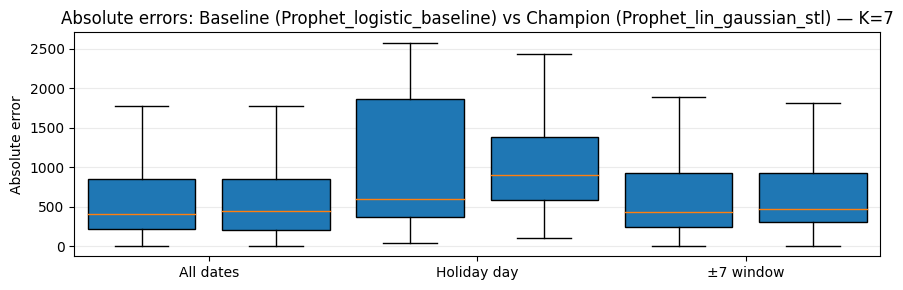

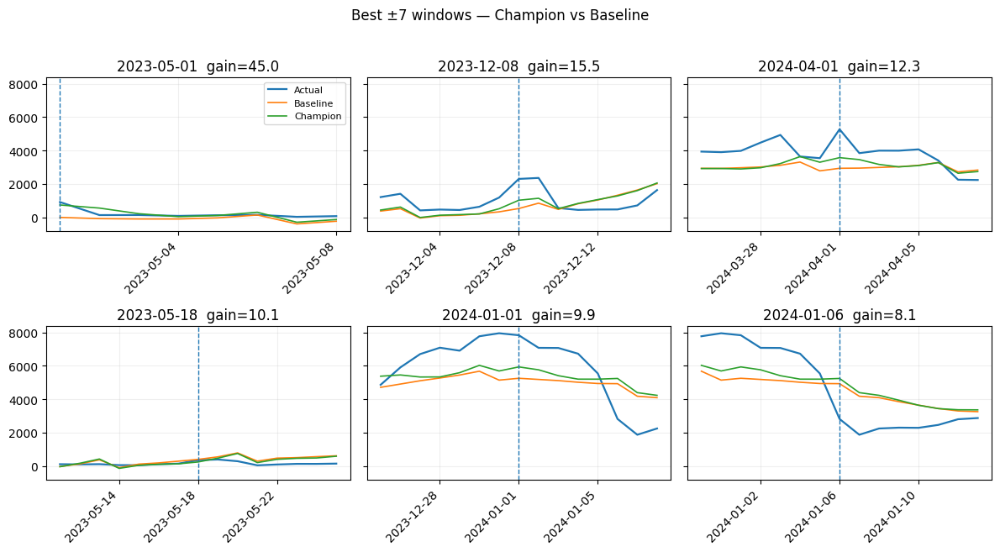

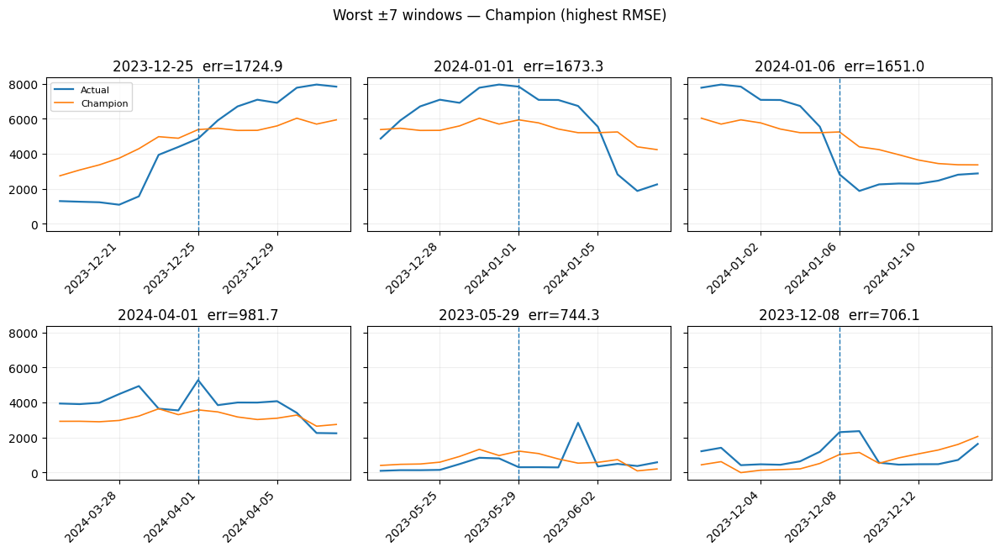


Insights complete.


In [8]:
# ======================================================================
# INSIGHTS — Tourism (All-K, +Validation, +FE effectiveness) — ONE CELL
# Supports K ∈ {1,2,3,5,7}
# ======================================================================

import numpy as np, pandas as pd, matplotlib.pyplot as plt, matplotlib.dates as mdates
from sklearn.metrics import r2_score
from IPython.display import display

# ---------- Guards ----------
TARGET     = str(globals().get("TARGET","reported_guests"))
DF         = globals().get("DF", None)
train      = globals().get("train", None)
val        = globals().get("val", None)
test       = globals().get("test", None)
ARTIFACTS  = dict(globals().get("ARTIFACTS", {}))

assert isinstance(DF, pd.DataFrame),   "DF missing — run PRE first."
assert isinstance(test, pd.DataFrame), "test missing — run EXPERIMENT first."

# ---------- Helpers ----------
def _ensure_dt(df):
    out = df.copy()
    if not isinstance(out.index, pd.DatetimeIndex):
        if "date" in out.columns:
            out["date"] = pd.to_datetime(out["date"])
            out = out.set_index("date")
        else:
            out.index = pd.to_datetime(out.index)
    out = out.sort_index()
    if not out.index.is_unique:
        out = out[~out.index.duplicated(keep="first")]
    return out

DF    = _ensure_dt(DF)
train = _ensure_dt(train) if isinstance(train, pd.DataFrame) else pd.DataFrame()
val   = _ensure_dt(val)   if isinstance(val,   pd.DataFrame) else pd.DataFrame()
test  = _ensure_dt(test)

def _cluster_centers(idx: pd.DatetimeIndex, flag_series: pd.Series) -> pd.DatetimeIndex:
    """Cluster consecutive flagged days into blocks, return midpoint day for each block."""
    flag = pd.Series(flag_series, index=idx).fillna(0).astype(bool).values
    days = idx[flag]
    if len(days) == 0:
        return pd.DatetimeIndex([])
    d = pd.DatetimeIndex(sorted(pd.to_datetime(days).normalize().unique()))

    blocks = []
    s = e = d[0]
    for nd in d[1:]:
        if (nd - e).days == 1:
            e = nd
        else:
            blocks.append((s, e))
            s = e = nd
    blocks.append((s, e))

    centers = []
    for s, e in blocks:
        span = (e - s).days + 1
        centers.append(s + pd.Timedelta(days=(span - 1)//2))
    return pd.DatetimeIndex(centers)

# ---------- Centers ----------
centers_test = pd.DatetimeIndex(ARTIFACTS.get("centers_test", []))
if len(centers_test) == 0:
    if "is_occasion" in test.columns:
        centers_test = _cluster_centers(test.index, test["is_occasion"])
    elif "is_holiday" in test.columns:
        centers_test = _cluster_centers(test.index, test["is_holiday"])
    else:
        centers_test = pd.DatetimeIndex([])

centers_val = pd.DatetimeIndex(ARTIFACTS.get("centers_val", []))
if len(centers_val) == 0 and isinstance(val, pd.DataFrame) and len(val) > 0:
    if "is_occasion" in val.columns:
        centers_val = _cluster_centers(val.index, val["is_occasion"])
    elif "is_holiday" in val.columns:
        centers_val = _cluster_centers(val.index, val["is_holiday"])
    else:
        centers_val = pd.DatetimeIndex([])

name_by_date = ARTIFACTS.get("name_by_date", {})
name_by_date = {pd.Timestamp(k).normalize(): v for k, v in name_by_date.items()} if isinstance(name_by_date, dict) else {}

def _name_for(d):
    try:
        return name_by_date.get(pd.Timestamp(d).normalize(), None)
    except Exception:
        return None

print("TEST range:", test.index.min().date(), "→", test.index.max().date(), "| rows:", len(test))
print("Centers in TEST:", len(centers_test))

def _align(y, yhat):
    ys = pd.Series(y).astype(float)
    yh = pd.Series(yhat).astype(float).reindex(ys.index)
    m = ys.notna() & yh.notna()
    return ys[m], yh[m]

def _rmse(y, yhat):
    ys, yh = _align(y, yhat)
    return float(np.sqrt(np.mean((ys - yh)**2))) if len(ys) else np.nan

def _r2(y, yhat):
    ys, yh = _align(y, yhat)
    return float(r2_score(ys, yh)) if len(ys) > 1 else np.nan

def _seg_masks(idx, centers, k):
    m0 = idx.isin(centers)
    if centers is None or len(centers) == 0:
        mK = pd.Series(False, index=idx); mN = ~mK
    else:
        mK = pd.Series(False, index=idx)
        for h in pd.DatetimeIndex(centers):
            mK |= (idx >= h - pd.Timedelta(days=k)) & (idx <= h + pd.Timedelta(days=k))
        mN = ~mK
    return m0, mK, mN

def _present_models(df):
    banned = {TARGET, "is_holiday", "is_occasion", "is_event"}
    num_cols = [c for c in df.columns if np.issubdtype(df[c].dtype, np.number)]
    return [c for c in num_cols if c not in banned]

BASELINES_ORDER = [
    "SARIMA_baseline",
    "Prophet_linear_baseline",
    "Prophet_logistic_baseline",
    "TBATS_baseline"
]

def _pick_best_baseline(scores_tbl, k, tag="occ"):
    if scores_tbl is None or scores_tbl.empty:
        return None
    cand = [b for b in BASELINES_ORDER if b in set(scores_tbl["Model"])]
    win = f"RMSE (±{k}_{tag})"
    if cand:
        sub = scores_tbl.set_index("Model").loc[cand]
        if win in sub and sub[win].notna().any():
            return sub[win].astype(float).idxmin()
        return sub["RMSE (all)"].astype(float).idxmin()
    return scores_tbl.sort_values("RMSE (all)").iloc[0]["Model"]

def _evaluate(df_like, model_cols, centers, k, tag="occ"):
    out=[]
    if df_like is None or len(df_like)==0:
        return pd.DataFrame()
    y = df_like[TARGET].astype(float)
    m0, mK, mN = _seg_masks(df_like.index, centers, k)
    for m in model_cols:
        if m not in df_like.columns:
            continue
        yp = pd.to_numeric(df_like[m], errors="coerce").astype(float)
        out.append({
            "Model": m,
            "RMSE (all)": _rmse(y, yp),
            f"RMSE ({tag}0)": _rmse(y[m0], yp[m0]) if m0.any() else np.nan,
            f"RMSE (±{k}_{tag})": _rmse(y[mK], yp[mK]) if mK.any() else np.nan,
            f"RMSE (nonwin_{tag})": _rmse(y[mN], yp[mN]) if mN.any() else np.nan,
            "R2 (all)": _r2(y, yp),
        })
    return pd.DataFrame(out).sort_values("RMSE (all)").reset_index(drop=True)

# ---------- Collect/compute evals ----------
K_LIST = [1, 2, 3, 5, 7]   # UPDATED
all_evals_test = {}
all_evals_val  = {}

for K in K_LIST:
    art = ARTIFACTS.get(K, {}) if isinstance(ARTIFACTS, dict) else {}
    evT = art.get("eval_test", pd.DataFrame()) if isinstance(art, dict) else pd.DataFrame()
    evV = art.get("eval_val",  pd.DataFrame()) if isinstance(art, dict) else pd.DataFrame()

    if evT is None or evT.empty:
        evT = _evaluate(test, _present_models(test), centers_test, K, tag="occ")

    if isinstance(val, pd.DataFrame) and len(val) > 0:
        if evV is None or evV.empty:
            test_models = set(evT["Model"]) if (evT is not None and not evT.empty) else set(_present_models(val))
            evV = _evaluate(val,
                            [m for m in _present_models(val) if m in test_models],
                            centers_val, K, tag="occ")
    else:
        evV = pd.DataFrame()

    all_evals_test[K] = evT
    all_evals_val[K]  = evV

# ---------- Show per-K leaderboards ----------
print("\n=== Leaderboards by K (TEST) ===")
for K in K_LIST:
    ev = all_evals_test.get(K, pd.DataFrame())
    print(f"\nK={K}")
    if ev is None or ev.empty:
        print("  (no models found on TEST)")
        continue
    cols = [c for c in ["Model","RMSE (all)",f"RMSE (±{K}_occ)",f"RMSE (nonwin_occ)","R2 (all)"] if c in ev.columns]
    display(ev[cols].reset_index(drop=True))

print("\n=== Leaderboards by K (VALIDATION) ===")
if not (isinstance(val, pd.DataFrame) and len(val) > 0):
    print("No validation split available.")
else:
    for K in K_LIST:
        ev = all_evals_val.get(K, pd.DataFrame())
        print(f"\nK={K}")
        if ev is None or ev.empty:
            print("  (no models found on VAL)")
            continue
        cols = [c for c in ["Model","RMSE (all)",f"RMSE (±{K}_occ)",f"RMSE (nonwin_occ)","R2 (all)"] if c in ev.columns]
        display(ev[cols].reset_index(drop=True))

# ---------- Cross-K summary (TEST) ----------
summary_rows=[]
for K in K_LIST:
    ev = all_evals_test.get(K, pd.DataFrame())
    if ev is None or ev.empty:
        continue
    champ = ev.iloc[0]["Model"]
    base  = _pick_best_baseline(ev, K, tag="occ")
    met   = f"RMSE (±{K}_occ)"

    row = {
        "K": K,
        "Champion": champ,
        "BestBaseline": base,
        "Champion RMSE(all)": float(ev.set_index("Model").at[champ, "RMSE (all)"])
    }

    try:
        if base in ev["Model"].values and met in ev.columns and pd.notna(ev.set_index("Model").at[base, met]):
            row[f"Δwindow (±{K})% vs baseline"] = 100.0 * (
                1.0 - float(ev.set_index("Model").at[champ, met]) / float(ev.set_index("Model").at[base, met])
            )
        else:
            row[f"Δwindow (±{K})% vs baseline"] = np.nan
    except Exception:
        row[f"Δwindow (±{K})% vs baseline"] = np.nan

    summary_rows.append(row)

summary = pd.DataFrame(summary_rows).sort_values("K").reset_index(drop=True)
print("\n=== Cross-K summary (TEST) ===")
display(summary if not summary.empty else pd.DataFrame({"note":["No eval_test found."]}))

# ---------- Choose best K for deep-dive ----------
if summary.empty:
    K_USE = 5
else:
    gain_cols = [c for c in summary.columns if "Δwindow" in c]
    if gain_cols and np.isfinite(summary[gain_cols].to_numpy()).any() and (summary[gain_cols].max(axis=1).max() > 0):
        K_USE = int(summary.loc[summary[gain_cols].max(axis=1).idxmax(), "K"])
    else:
        K_USE = int(summary.loc[summary["Champion RMSE(all)"].idxmin(), "K"])

print(f"\nDeep-dive K selected: {K_USE}")

evT = all_evals_test.get(K_USE, pd.DataFrame())
evV = all_evals_val.get(K_USE,  pd.DataFrame()) if (isinstance(val, pd.DataFrame) and len(val) > 0) else pd.DataFrame()
champion = evT.iloc[0]["Model"] if (evT is not None and not evT.empty) else None
baseline = _pick_best_baseline(evT, K_USE, "occ") if (evT is not None and not evT.empty) else None

# ---------- Validation → Test generalization check ----------
def _gap(ev_val, ev_test, model):
    try:
        v = float(ev_val.set_index("Model").at[model, "RMSE (all)"])
        t = float(ev_test.set_index("Model").at[model, "RMSE (all)"])
        return t - v
    except Exception:
        return np.nan

gen_rows=[]
if champion:
    gen_rows.append({"Model": champion, "Role": "Champion", "Gap Test-VAL (RMSE)": _gap(evV, evT, champion)})
if baseline:
    gen_rows.append({"Model": baseline, "Role": "BestBaseline", "Gap Test-VAL (RMSE)": _gap(evV, evT, baseline)})

print("\n=== Generalization gap (Test − Val RMSE) — lower is better ===")
display(pd.DataFrame(gen_rows) if gen_rows else pd.DataFrame({"note":["Validation split not available or models missing."]}))

# ---------- FE effectiveness ----------
def _is_baseline(name):
    return name in {
        "SARIMA_baseline","SARIMA_hol_flag",
        "Prophet_linear_baseline","Prophet_logistic_baseline",
        "TBATS_baseline"
    }

def _is_fe(name):
    return (("_stl" in name) or ("onehot" in name) or ("days_interaction" in name)) and not _is_baseline(name)

def _fe_effect_table(ev, K):
    if ev is None or ev.empty:
        return pd.DataFrame()
    met = f"RMSE (±{K}_occ)"
    base = _pick_best_baseline(ev, K, "occ")
    if base is None or base not in ev["Model"].values:
        return pd.DataFrame()

    ref_all = float(ev.set_index("Model").at[base, "RMSE (all)"])
    ref_win = np.nan
    try:
        if met in ev.columns and pd.notna(ev.set_index("Model").at[base, met]):
            ref_win = float(ev.set_index("Model").at[base, met])
    except Exception:
        ref_win = np.nan

    rows=[]
    for m in ev["Model"]:
        if not _is_fe(m):
            continue
        a = float(ev.set_index("Model").at[m, "RMSE (all)"])
        w = np.nan
        if met in ev.columns:
            try:
                w = float(ev.set_index("Model").at[m, met])
            except Exception:
                w = np.nan

        rows.append({
            "FE Model": m,
            f"Δ(±{K})% vs baseline": (100.0*(1.0 - w/ref_win) if (pd.notna(ref_win) and pd.notna(w) and ref_win>0) else np.nan),
            "Δ(all)% vs baseline":  (100.0*(1.0 - a/ref_all) if (pd.notna(ref_all) and ref_all>0) else np.nan)
        })

    return pd.DataFrame(rows).sort_values("Δ(all)% vs baseline", ascending=False, na_position="last")

print("\n=== FE effectiveness (TEST, each K) — positive % means FE beats best baseline ===")
fe_agg=[]
for K in K_LIST:
    tbl = _fe_effect_table(all_evals_test.get(K, pd.DataFrame()), K)
    print(f"\nK={K}")
    if tbl is None or tbl.empty:
        print("(no FE comparisons available)")
    else:
        display(tbl)
        fe_agg.append(tbl.assign(K=K))

if fe_agg:
    fe_agg = pd.concat(fe_agg, ignore_index=True)
    print("\nFE summary — average Δ(all)% over FE models (by K):")
    display(fe_agg.groupby("K")[["Δ(all)% vs baseline"]].mean()
            .rename(columns={"Δ(all)% vs baseline":"Avg Δ(all)%"}))

# ---------- Per-window comparison + plots for each K ----------
def _per_window_comp(df, centers, k, baseline, champion):
    if (baseline not in df.columns) or (champion not in df.columns):
        return pd.DataFrame()
    y  = df[TARGET].astype(float)
    yb = df[baseline].astype(float)
    yc = df[champion].astype(float)
    rows=[]
    for h in pd.DatetimeIndex(centers):
        m = (df.index >= h - pd.Timedelta(days=k)) & (df.index <= h + pd.Timedelta(days=k))
        if m.sum() < 2:
            continue
        rm_b = _rmse(y[m], yb[m])
        rm_c = _rmse(y[m], yc[m])
        gain = 100.0*(1.0 - rm_c/rm_b) if (pd.notna(rm_b) and rm_b>0) else np.nan
        rows.append({"date": h, "Holiday": _name_for(h), f"ΔRMSE (±{k})%": gain,
                     f"RMSE ({baseline})": rm_b, f"RMSE ({champion})": rm_c})
    if not rows:
        return pd.DataFrame()
    return pd.DataFrame(rows).sort_values(f"ΔRMSE (±{k})%", ascending=False).reset_index(drop=True)

def _error_boxplots(df, centers, k, baseline, champion, title):
    if (baseline not in df.columns) or (champion not in df.columns):
        return
    y=df[TARGET].astype(float); idx=df.index
    m0,mK,_ = _seg_masks(idx, centers, k)
    segs=[("All dates", pd.Series(True,index=idx))]
    if m0.any(): segs.append(("Holiday day", pd.Series(m0,index=idx)))
    if mK.any(): segs.append((f"±{k} window", pd.Series(mK,index=idx)))
    yb=df[baseline].astype(float); yc=df[champion].astype(float)
    data_b=[(y-yb).abs()[m].dropna().values for _,m in segs]
    data_c=[(y-yc).abs()[m].dropna().values for _,m in segs]
    fig,ax=plt.subplots(figsize=(9,3))
    pos_b=np.arange(1,2*len(segs)+1,2); pos_c=pos_b+1
    ax.boxplot(data_b,positions=pos_b,widths=0.8,patch_artist=True,showfliers=False)
    ax.boxplot(data_c,positions=pos_c,widths=0.8,patch_artist=True,showfliers=False)
    ax.set_xticks((pos_b+pos_c)/2); ax.set_xticklabels([s for s,_ in segs])
    ax.set_ylabel("Absolute error"); ax.set_title(title)
    ax.grid(alpha=.25,axis='y')
    plt.tight_layout(); plt.show()

def _panel_windows(df, centers, k, series_dict, title, top=True, nmax=6):
    y = df[TARGET].astype(float)
    stats=[]
    for h in pd.DatetimeIndex(centers):
        m=(df.index >= h - pd.Timedelta(days=k)) & (df.index <= h + pd.Timedelta(days=k))
        if m.sum()<2:
            continue

        if "Champion" in series_dict and "Baseline" in series_dict:
            rm_b = _rmse(y[m], series_dict["Baseline"][m])
            rm_c = _rmse(y[m], series_dict["Champion"][m])
            g = 100*(1 - rm_c/rm_b) if (pd.notna(rm_b) and rm_b>0) else np.nan
            stats.append((h, g))
        else:
            rm = _rmse(y[m], series_dict.get("Champion", y)[m])
            stats.append((h, rm))

    if not stats:
        print("No windows to plot.")
        return

    if top:
        stats = [r for r in stats if pd.notna(r[1]) and r[1] > 0]
        if not stats:
            print("No positive-gain windows to plot.")
            return
        rows = sorted(stats, key=lambda x: x[1], reverse=True)[:min(nmax, len(stats))]
    else:
        rows = sorted(stats, key=lambda x: x[1], reverse=True)[:min(nmax, len(stats))]

    ncols=3; nrows=int(np.ceil(len(rows)/ncols))
    fig,axes=plt.subplots(nrows,ncols,figsize=(12,3.2*nrows),sharey=True)
    axes=np.ravel(axes) if isinstance(axes,np.ndarray) else [axes]

    for ax,(h,g) in zip(axes,rows):
        t=pd.date_range(h-pd.Timedelta(days=k), h+pd.Timedelta(days=k), freq="D")
        ax.plot(t, y.reindex(t), lw=1.6, label="Actual")
        for name,ser in series_dict.items():
            if name=="Actual":
                continue
            ax.plot(t, ser.reindex(t), lw=1.2, label=name)
        ax.axvline(h, ls="--", lw=1)
        ax.set_title(f"{h.date()}  {'gain' if top else 'err'}={g:.1f}")
        ax.grid(alpha=.2)
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=max(1, (2*k)//3 or 1)))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        for tick in ax.get_xticklabels():
            tick.set_rotation(45); tick.set_ha('right')

    for ax in axes[len(rows):]:
        ax.axis("off")
    axes[0].legend(fontsize=8)
    plt.suptitle(title, y=1.02)
    plt.tight_layout(); plt.show()

if champion and baseline and len(centers_test) > 0:
    for K in K_LIST:
        comp = _per_window_comp(test, centers_test, K, baseline, champion)
        print(f"\n=== Per-window comparison (TEST, K={K}) — Champion vs Baseline ===")
        display(comp.head(10) if not comp.empty else pd.DataFrame({"note":["No windows available."]}))

        _error_boxplots(
            test, centers_test, K, baseline, champion,
            title=f"Absolute errors: Baseline ({baseline}) vs Champion ({champion}) — K={K}"
        )

        _panel_windows(
            test, centers_test, K,
            {"Actual": test[TARGET].astype(float),
             "Baseline": test[baseline].astype(float),
             "Champion": test[champion].astype(float)},
            title=f"Best ±{K} windows — Champion vs Baseline", top=True
        )

        _panel_windows(
            test, centers_test, K,
            {"Actual": test[TARGET].astype(float),
             "Champion": test[champion].astype(float)},
            title=f"Worst ±{K} windows — Champion (highest RMSE)", top=False
        )
else:
    print("\nSkipping per-window plots: missing baseline/champion or no centers.")

print("\nInsights complete.")



=== Line plots for K = 1 (Best / Median / Worst) ===
  [warn] ARTIFACTS[K]['test_df'] missing; using global test (may be last-K only).


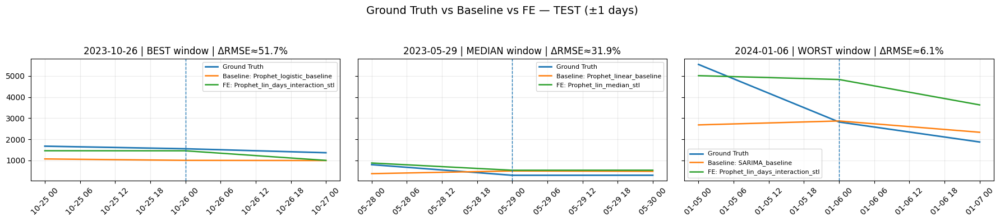


=== Line plots for K = 2 (Best / Median / Worst) ===
  [warn] ARTIFACTS[K]['test_df'] missing; using global test (may be last-K only).


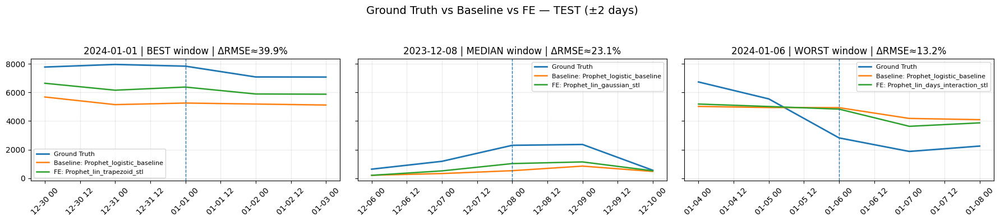


=== Line plots for K = 3 (Best / Median / Worst) ===
  [warn] ARTIFACTS[K]['test_df'] missing; using global test (may be last-K only).


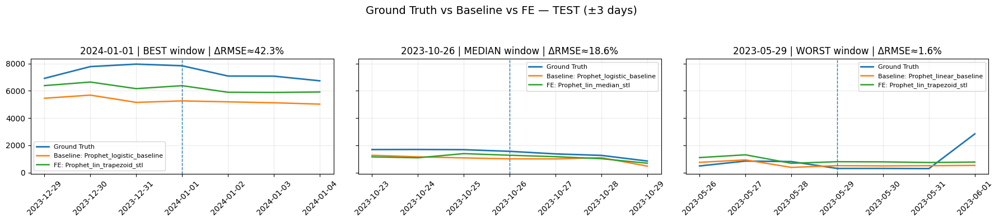


=== Line plots for K = 5 (Best / Median / Worst) ===
  [warn] ARTIFACTS[K]['test_df'] missing; using global test (may be last-K only).


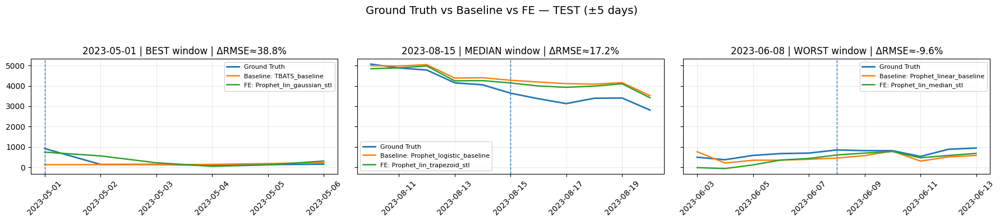


=== Line plots for K = 7 (Best / Median / Worst) ===
  [warn] ARTIFACTS[K]['test_df'] missing; using global test (may be last-K only).


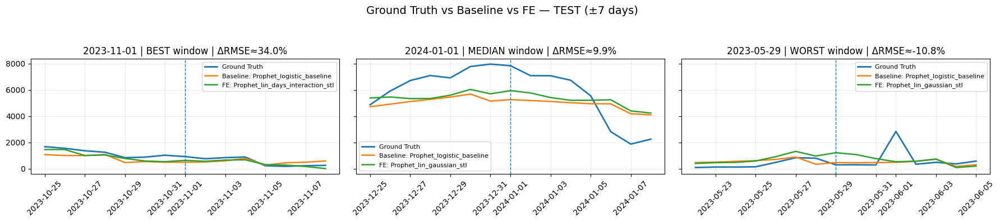

In [9]:
# ============================================================
# FEEDBACK ADD-ON (TOURISM): 3 line plots PER K (Best/Median/Worst)
# Ground Truth vs Baseline vs FE on TEST windows
#
# REQUIREMENT:
#   Your EXPERIMENT must have stored per-K frames:
#     ARTIFACTS[K]["test_df"] = test.copy()
#     ARTIFACTS[K]["val_df"]  = val.copy()
#
# If you didn't store them yet, add these two lines inside the EXPERIMENT
# loop right after you finish computing predictions for that K:
#     ART_K.setdefault(K, {})
#     ART_K[K]["test_df"] = test.copy()
# ============================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- guards ----------
need = ["ARTIFACTS", "TARGET", "K_LIST"]
for v in need:
    assert v in globals(), f"{v} missing — run EXPERIMENT + INSIGHTS first."

ARTIFACTS = globals()["ARTIFACTS"]
TARGET    = str(globals()["TARGET"])
K_LIST    = globals()["K_LIST"]

# Global test (fallback only)
test_global = globals().get("test", None)
assert isinstance(test_global, pd.DataFrame), "test missing — run EXPERIMENT first."

# ---------- helpers ----------
def _align(y, yhat):
    ys = pd.Series(y).astype(float)
    yh = pd.Series(yhat).astype(float).reindex(ys.index)
    m = ys.notna() & yh.notna()
    return ys[m], yh[m]

def _rmse(y, yhat):
    ys, yh = _align(y, yhat)
    if len(ys) == 0:
        return np.nan
    return float(np.sqrt(np.mean((ys - yh) ** 2)))

def _seg_mask(idx, center, k):
    c = pd.Timestamp(center).normalize()
    return (idx >= c - pd.Timedelta(days=k)) & (idx <= c + pd.Timedelta(days=k))

BASELINE_PREF = [
    "SARIMA_baseline",
    "Prophet_linear_baseline",
    "Prophet_logistic_baseline",
    "TBATS_baseline",
]

# ✅ robust: include numeric-looking object cols (so Prophet_lin_days_interaction_stl never disappears)
def _present_models(df):
    banned = {TARGET, "is_holiday", "is_event", "is_occasion"}
    cols = []
    for c in df.columns:
        if c in banned:
            continue
        s = df[c]
        if np.issubdtype(s.dtype, np.number):
            cols.append(c)
        else:
            sc = pd.to_numeric(s, errors="coerce")
            if sc.notna().any():
                df[c] = sc.astype(float)
                cols.append(c)

    # remove internal helper-like columns if present
    cols = [c for c in cols if not (str(c).startswith(("b_","cap_")) or str(c).endswith(("_ds","_trend")))]
    return cols

def _is_baseline(col):
    return (col in BASELINE_PREF) or (col == "SARIMA_hol_flag")

def _best_baseline_and_fe(df, mask):
    models = _present_models(df)
    y = df.loc[mask, TARGET]

    baselines = [m for m in models if _is_baseline(m)]
    fe_models = [m for m in models if not _is_baseline(m)]

    # If you only want FE models with "_stl" you can uncomment:
    # fe_models = [m for m in fe_models if "_stl" in m]

    if not baselines or not fe_models:
        return None, None, np.nan

    # best baseline
    b_rmse = {b: _rmse(y, df.loc[mask, b]) for b in baselines}
    b_best = min(b_rmse, key=b_rmse.get)

    # best FE
    f_rmse = {f: _rmse(y, df.loc[mask, f]) for f in fe_models}
    f_best = min(f_rmse, key=f_rmse.get)

    gain = 100.0 * (1.0 - f_rmse[f_best] / b_rmse[b_best]) if (pd.notna(b_rmse[b_best]) and b_rmse[b_best] > 0) else np.nan
    return b_best, f_best, gain

def _rank_windows(df, centers, k):
    rows = []
    idx = df.index
    # centers might include dates not in df index; normalize + intersect safely
    for c in pd.DatetimeIndex(centers).normalize().intersection(idx.normalize()):
        # find the exact timestamp in df index that matches this normalized date (if daily, it's direct)
        center = pd.Timestamp(c).normalize()
        m = _seg_mask(idx, center, k)
        if m.sum() < 3:
            continue
        base, fe, gain = _best_baseline_and_fe(df, m)
        if base is None or fe is None:
            continue
        rows.append({"center": center, "gain": gain})
    return pd.DataFrame(rows).sort_values("gain", ascending=False).reset_index(drop=True)

def _plot_window(df, center, k, title_suffix):
    m = _seg_mask(df.index, center, k)
    seg = df.loc[m]
    base, fe, gain = _best_baseline_and_fe(df, m)

    if base is None or fe is None:
        plt.text(0.5, 0.5, "Missing baseline/FE in this window",
                 ha="center", va="center", transform=plt.gca().transAxes)
        plt.title(f"{center.date()} | {title_suffix}")
        plt.axis("off")
        return

    plt.plot(seg.index, seg[TARGET], label="Ground Truth", lw=2)
    plt.plot(seg.index, seg[base],   label=f"Baseline: {base}", lw=1.8)
    plt.plot(seg.index, seg[fe],     label=f"FE: {fe}", lw=1.8)
    plt.axvline(pd.Timestamp(center), ls="--", lw=1)

    gtxt = f"{gain:.1f}%" if pd.notna(gain) else "NA"
    plt.title(f"{pd.Timestamp(center).date()} | {title_suffix} | ΔRMSE≈{gtxt}")
    plt.xticks(rotation=45)
    plt.grid(alpha=0.25)
    plt.legend(frameon=True, fontsize=8)

# ---------- centers ----------
# ✅ Tourism insights uses centers_test; use that (NOT centers_all)
centers_occ = pd.DatetimeIndex(ARTIFACTS.get("centers_test", []))

# ---------- MAIN LOOP ----------
for K in K_LIST:
    print(f"\n=== Line plots for K = {K} (Best / Median / Worst) ===")

    # ✅ Use the per-K prediction frame if available (correct for tourism experiment)
    dfK = ARTIFACTS.get(K, {}).get("test_df", None)
    if dfK is None or not isinstance(dfK, pd.DataFrame) or dfK.empty:
        # fallback: global test (but this is usually only last-K in your experiment)
        dfK = test_global.copy()
        print("  [warn] ARTIFACTS[K]['test_df'] missing; using global test (may be last-K only).")
    else:
        dfK = dfK.copy()

    # keep centers aligned to this df
    centersK = pd.DatetimeIndex(centers_occ).intersection(dfK.index)

    ranked = _rank_windows(dfK, centersK, K)
    if ranked.empty or len(ranked) < 3:
        print("Not enough valid windows for this K.")
        continue

    best   = ranked.iloc[0]["center"]
    worst  = ranked.iloc[-1]["center"]
    median = ranked.iloc[len(ranked)//2]["center"]

    fig, axes = plt.subplots(1, 3, figsize=(18, 4), sharey=True)

    plt.sca(axes[0])
    _plot_window(dfK, best, K, "BEST window")

    plt.sca(axes[1])
    _plot_window(dfK, median, K, "MEDIAN window")

    plt.sca(axes[2])
    _plot_window(dfK, worst, K, "WORST window")

    fig.suptitle(f"Ground Truth vs Baseline vs FE — TEST (±{K} days)", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()


# Retail final version(28-10-25)

In [4]:
# ============================================
# RETAIL — PRE (FINAL, STANDALONE, SAFE)
# Builds DF from M5 (sales + calendar),
# enriches calendar flags/names, creates splits,
# and exports ARTIFACTS for experiments.
# ============================================

import pandas as pd, numpy as np, warnings
from pathlib import Path
warnings.filterwarnings("ignore")

# ----------------------------
# CONFIG
# ----------------------------
TARGET = "daily_units"
DOMAIN = "retail"

CAL_PATH   = Path("/kaggle/input/final-master-thesis-project-retail/calendar.csv")
SALES_PATH = Path("/kaggle/input/final-master-thesis-project-retail/sales_train_validation.csv")

TRAIN_END  = "2014-06-18"
VAL_START  = "2014-06-19"
VAL_END    = "2015-06-18"
TEST_START = "2015-06-19"
TEST_END   = "2016-06-19"

# ----------------------------
# HELPERS
# ----------------------------
def _norm_any(x):
    dt = pd.to_datetime(x)
    return dt.dt.normalize() if isinstance(dt, pd.Series) else dt.normalize()

def _cluster_centers(idx, flag):
    mask = pd.Series(flag, index=idx).fillna(0).astype(bool).values
    if not mask.any():
        return pd.DatetimeIndex([])
    days = pd.DatetimeIndex(sorted(_norm_any(idx[mask]).unique()))
    blocks, s, e = [], days[0], days[0]
    for d in days[1:]:
        if (d - e).days == 1:
            e = d
        else:
            blocks.append((s, e))
            s = e = d
    blocks.append((s, e))
    return pd.DatetimeIndex([s + pd.Timedelta(days=((e - s).days)//2) for s, e in blocks])

# ----------------------------
# LOAD M5
# ----------------------------
cal = pd.read_csv(CAL_PATH)
sales = pd.read_csv(SALES_PATH)

day_cols = [c for c in sales.columns if c.startswith("d_")]

daily_units = (
    sales.melt(
        id_vars=[c for c in sales.columns if c not in day_cols],
        value_vars=day_cols,
        var_name="d",
        value_name=TARGET
    )
    .groupby("d", as_index=False)[TARGET].sum()
)

keep_cal = [
    "d","date","weekday","wday","month","year",
    "event_name_1","event_type_1","event_name_2","event_type_2"
]
cal_small = cal[keep_cal].copy()

df = daily_units.merge(cal_small, on="d", how="left")
df["date"] = pd.to_datetime(df["date"])
df = df.sort_values("date").set_index("date")

# ----------------------------
# FLAGS
# ----------------------------
df["is_event"] = df[["event_name_1","event_name_2"]].notna().any(axis=1).astype(int)

def _us_holiday_flag(idx):
    try:
        import holidays
        us = holidays.UnitedStates(years=sorted(idx.year.unique()))
        return pd.Series([int(us.get(d.date()) is not None) for d in idx], index=idx)
    except Exception:
        out = pd.Series(0, index=idx)
        nat = (cal["event_type_1"].eq("National")) | (cal["event_type_2"].eq("National"))
        nat_dates = _norm_any(cal.loc[nat, "date"])
        out.loc[out.index.normalize().isin(nat_dates)] = 1

        tg = (cal["event_name_1"].eq("Thanksgiving")) | (cal["event_name_2"].eq("Thanksgiving"))
        bf = (_norm_any(cal.loc[tg, "date"]) + pd.Timedelta(days=1)).unique()
        out.loc[out.index.normalize().isin(bf)] = 1
        return out

df["is_holiday"]  = _us_holiday_flag(df.index).astype(int)
df["is_occasion"] = ((df["is_event"] == 1) | (df["is_holiday"] == 1)).astype(int)

# ----------------------------
# NAMES
# ----------------------------
def _combine_events(r):
    a = str(r["event_name_1"] or "").strip()
    b = str(r["event_name_2"] or "").strip()
    return f"{a} | {b}" if a and b and a.lower()!=b.lower() else a or b or None

df["event_name"] = df.apply(_combine_events, axis=1)

try:
    import holidays
    us = holidays.UnitedStates(years=sorted(df.index.year.unique()))
    df["holiday_name"] = [us.get(d.date()) for d in df.index]
except Exception:
    df["holiday_name"] = None

def _occasion(r):
    a = str(r["event_name"] or "").strip()
    b = str(r["holiday_name"] or "").strip()
    return f"{a} | {b}" if a and b and a.lower()!=b.lower() else a or b or None

df["occasion_name"] = df.apply(_occasion, axis=1)

# ----------------------------
# SPLITS
# ----------------------------
train = df.loc[:TRAIN_END]
val   = df.loc[VAL_START:VAL_END]
test  = df.loc[TEST_START:TEST_END]

print("SPLITS:")
print(" Train:", train.index.min().date(), "→", train.index.max().date(), "|", len(train))
print(" Val  :", val.index.min().date(),   "→", val.index.max().date(),   "|", len(val))
print(" Test :", test.index.min().date(),  "→", test.index.max().date(),  "|", len(test))

# ----------------------------
# CENTERS (NO LEAKAGE)
# ----------------------------
centers_train = _cluster_centers(train.index, train["is_occasion"])
centers_trval = _cluster_centers(train.index.append(val.index),
                                 pd.concat([train["is_occasion"], val["is_occasion"]]))
centers_test  = _cluster_centers(test.index, test["is_occasion"])

# ----------------------------
# ARTIFACTS
# ----------------------------
ARTIFACTS = {
    "centers_trainonly": list(centers_train),
    "centers_trvalonly": list(centers_trval),
    "centers_test":      list(centers_test),
    "name_by_date": {
        d.normalize(): n for d, n in df["occasion_name"].dropna().items()
    }
}

globals().update({
    "DF": df,
    "train": train,
    "val": val,
    "test": test,
    "ARTIFACTS": ARTIFACTS,
    "TARGET": TARGET,
    "DOMAIN": DOMAIN,
    "cal": cal
})

# ----------------------------
# SANITY
# ----------------------------
print("\nTEST FLAGS:",
      "event =", int(test["is_event"].sum()),
      "| holiday =", int(test["is_holiday"].sum()),
      "| occasion =", int(test["is_occasion"].sum()))

print("Centers:", len(centers_test))
print("Retail PRE complete. Proceed to EXPERIMENT.")


SPLITS:
 Train: 2011-01-29 → 2014-06-18 | 1237
 Val  : 2014-06-19 → 2015-06-18 | 365
 Test : 2015-06-19 → 2016-04-24 | 311

TEST FLAGS: event = 22 | holiday = 10 | occasion = 23
Centers: 21
Retail PRE complete. Proceed to EXPERIMENT.


In [2]:
def summarize(split_name, dfx, centers):
    return {
        "split": split_name,
        "span": f"{dfx.index.min().date()} → {dfx.index.max().date()}",
        "days": len(dfx),
        "holidays": int(dfx["is_holiday"].sum()),
        "events": int(dfx["is_event"].sum()),
        "occasions": int(dfx["is_occasion"].sum()),
        "centers": len(centers),
    }

print(summarize("train", train, ARTIFACTS["centers_trainonly"]))
print(summarize("val",   val,   []))  # centers not stored for val-only in your artifacts
print(summarize("test",  test,  ARTIFACTS["centers_test"]))
print(summarize("tr+val", DF.loc[train.index.min():val.index.max()], ARTIFACTS["centers_trvalonly"]))


{'split': 'train', 'span': '2011-01-29 → 2014-06-18', 'days': 1237, 'holidays': 35, 'events': 102, 'occasions': 105, 'centers': 96}
{'split': 'val', 'span': '2014-06-19 → 2015-06-18', 'days': 365, 'holidays': 10, 'events': 30, 'occasions': 30, 'centers': 0}
{'split': 'test', 'span': '2015-06-19 → 2016-04-24', 'days': 311, 'holidays': 10, 'events': 22, 'occasions': 23, 'centers': 21}
{'split': 'tr+val', 'span': '2011-01-29 → 2015-06-18', 'days': 1602, 'holidays': 45, 'events': 132, 'occasions': 135, 'centers': 124}


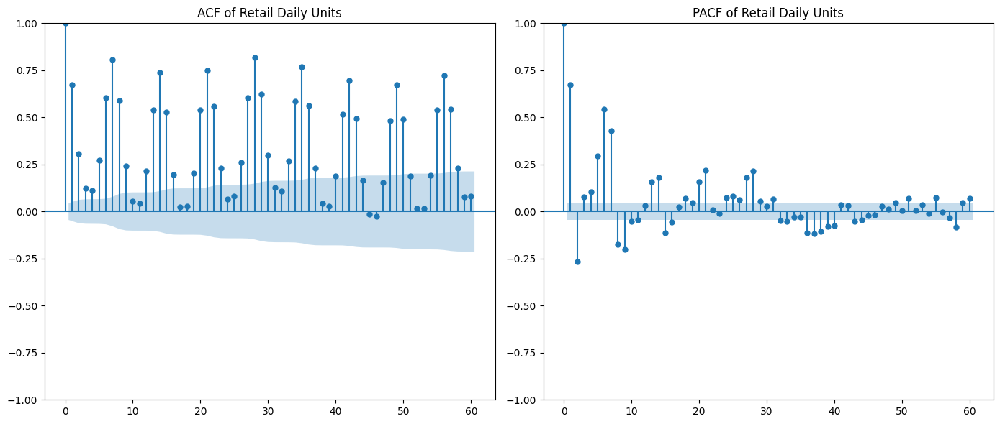

In [11]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

series = DF_sorted[TARGET].dropna()

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plot_acf(series, lags=60, ax=plt.gca())
plt.title("ACF of Retail Daily Units")

plt.subplot(1, 2, 2)
plot_pacf(series, lags=60, ax=plt.gca(), method="ywm")
plt.title("PACF of Retail Daily Units")

plt.tight_layout()
plt.savefig("acf_pacf_retail.png", dpi=300)
plt.show()


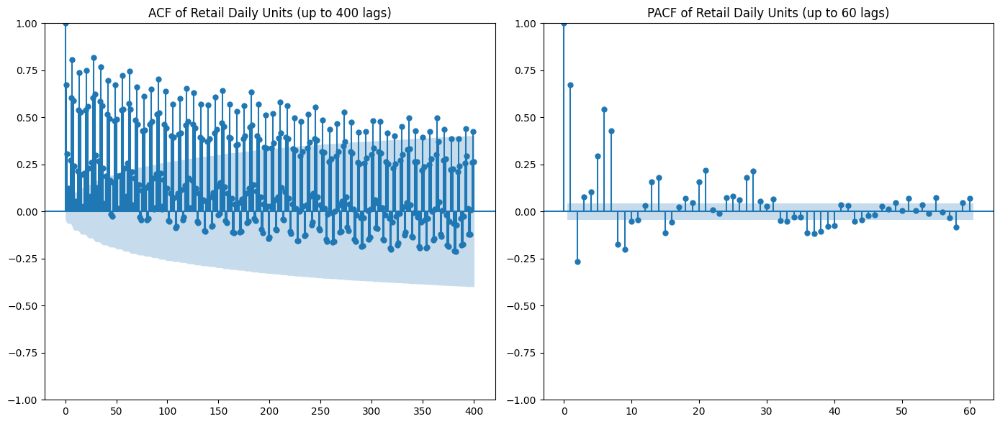

In [12]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

series = DF_sorted[TARGET].dropna()

plt.figure(figsize=(14, 6))

# ---- ACF: long lags (annual-ish) ----
plt.subplot(1, 2, 1)
plot_acf(series, lags=400, ax=plt.gca())
plt.title("ACF of Retail Daily Units (up to 400 lags)")

# ---- PACF: short lags only ----
plt.subplot(1, 2, 2)
plot_pacf(series, lags=60, ax=plt.gca(), method="ywm")
plt.title("PACF of Retail Daily Units (up to 60 lags)")

plt.tight_layout()
plt.savefig("acf_pacf_retail_long.png", dpi=300)
plt.show()


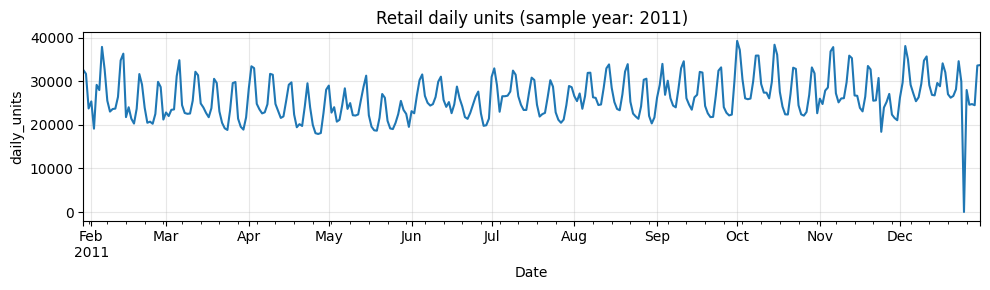

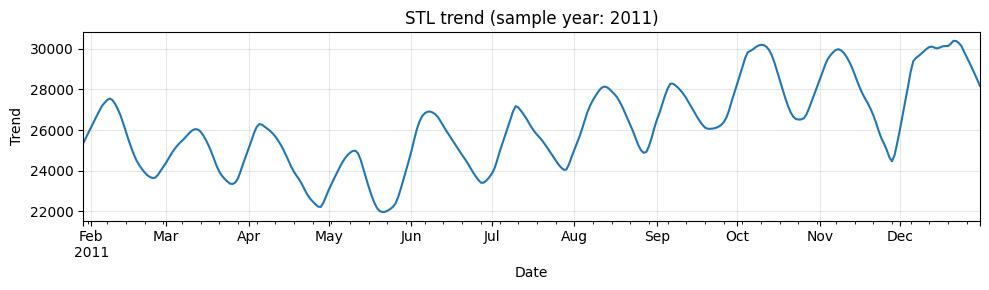

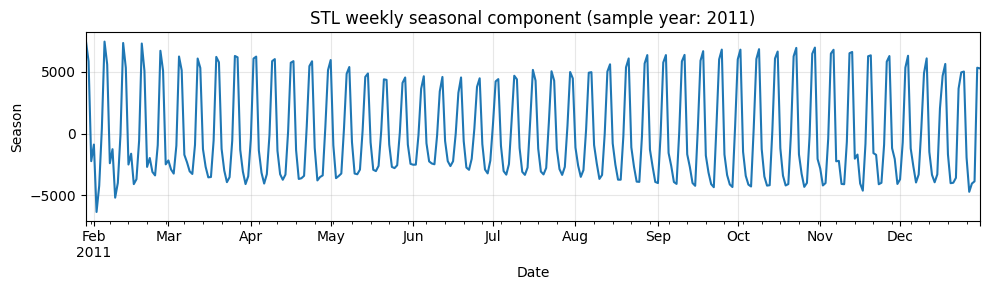

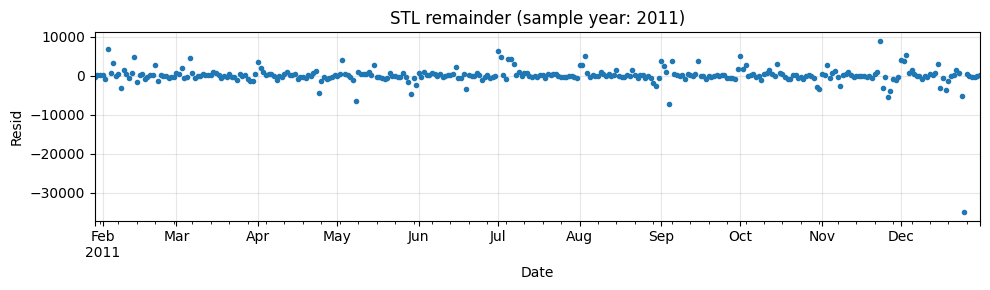

In [13]:
import os
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)

# --- 1) pick one representative year (auto: first full year available) ---
years = sorted(DF_sorted.index.year.unique())
rep_year = years[0]
for y in years:
    # choose first year with most observations (near full year)
    n = DF_sorted.loc[str(y), TARGET].dropna().shape[0]
    if n >= 330:
        rep_year = y
        break

sample = DF_sorted.loc[str(rep_year), TARGET].dropna()

stl = STL(sample, period=7, robust=True)
res = stl.fit()

def style_ax(ax, ylabel):
    ax.set_xlabel("Date")
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)
    ax.tick_params(labelsize=10)
    plt.tight_layout()

# -------- 1) Original series --------
fig, ax = plt.subplots(figsize=(10, 3))
sample.plot(ax=ax)
ax.set_title(f"Retail daily units (sample year: {rep_year})")
style_ax(ax, TARGET)
plt.savefig(os.path.join(out_dir, f"stl_retail_original_{rep_year}.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 2) Trend component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.trend.plot(ax=ax)
ax.set_title(f"STL trend (sample year: {rep_year})")
style_ax(ax, "Trend")
plt.savefig(os.path.join(out_dir, f"stl_retail_trend_{rep_year}.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 3) Weekly seasonal component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.seasonal.plot(ax=ax)
ax.set_title(f"STL weekly seasonal component (sample year: {rep_year})")
style_ax(ax, "Season")
plt.savefig(os.path.join(out_dir, f"stl_retail_seasonality_weekly_{rep_year}.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 4) Remainder component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.resid.plot(ax=ax, style="o", markersize=3)
ax.set_title(f"STL remainder (sample year: {rep_year})")
style_ax(ax, "Resid")
plt.savefig(os.path.join(out_dir, f"stl_retail_residual_{rep_year}.png"), dpi=300)
plt.show()
plt.close(fig)


In [14]:
# ============================================
# RETAIL — MSTL DECOMPOSITION (same style as tourism code)
# Generates 5 plots in figures/:
# - mstl_retail_original.png
# - mstl_retail_seasonal_weekly.png
# - mstl_retail_seasonal_yearly.png
# - mstl_retail_trend.png
# - mstl_retail_residual.png
# ============================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# -------------------------------------------------------
# 1) Use DF + TARGET from your retail pipeline (safe fallback)
# -------------------------------------------------------
TARGET = str(globals().get("TARGET", "daily_units"))
if "DF_sorted" in globals():
    df_retail = globals()["DF_sorted"].copy()
else:
    assert "DF" in globals(), "DF_sorted not found and DF missing — run RETAIL PRE first."
    df_retail = globals()["DF"].copy()

assert TARGET in df_retail.columns, f"Column '{TARGET}' not found"

# -------------------------------------------------------
# 2) Prepare continuous daily index (same as tourism code)
# -------------------------------------------------------
# Ensure datetime index
if not isinstance(df_retail.index, pd.DatetimeIndex):
    if "date" in df_retail.columns:
        df_retail["date"] = pd.to_datetime(df_retail["date"])
        df_retail = df_retail.set_index("date")
    else:
        df_retail.index = pd.to_datetime(df_retail.index)

df_retail = df_retail.sort_index()
y_raw = df_retail[TARGET].astype(float)

full_idx = pd.date_range(
    y_raw.index.min().normalize(),
    y_raw.index.max().normalize(),
    freq="D"
)

# interpolate small gaps (does NOT overwrite original DF)
y = y_raw.reindex(full_idx).interpolate(limit_direction="both")

date_span = f"{y.index.min().date()} – {y.index.max().date()}"

# -------------------------------------------------------
# 3) Create output folder (LaTeX uses 'figures/')
# -------------------------------------------------------
out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)

def save_plot(series, title, fname, ylabel=TARGET):
    fig, ax = plt.subplots(figsize=(10, 3.4))
    ax.plot(series.index, series.values, linewidth=1.2)
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    path = os.path.join(out_dir, fname)
    fig.savefig(path, dpi=300)
    plt.close(fig)
    return path

# -------------------------------------------------------
# 4) MSTL approximation using two-pass STL (same as tourism)
# -------------------------------------------------------

# Pass 1: Weekly seasonality (m=7)
stl_weekly = STL(y, period=7, seasonal=7, robust=True).fit()
S7 = pd.Series(stl_weekly.seasonal, index=full_idx, dtype=float)

# Remove weekly
y_no_weekly = y - S7

# Pass 2: Yearly seasonality (m≈365)
# Use an odd seasonal smoother length to avoid STL edge cases
seasonal_len_year = 365 if 365 % 2 == 1 else 366
stl_yearly = STL(y_no_weekly, period=365, seasonal=seasonal_len_year, robust=True).fit()
S365  = pd.Series(stl_yearly.seasonal, index=full_idx, dtype=float)
Trend = pd.Series(stl_yearly.trend,   index=full_idx, dtype=float)

# Final residual
Resid = y - (S7 + S365 + Trend)

# -------------------------------------------------------
# 5) Save all MSTL figures
# -------------------------------------------------------
paths = []
paths.append(save_plot(y,     f"MSTL: original series (daily) [{date_span}]",           "mstl_retail_original.png"))
paths.append(save_plot(S7,    "MSTL weekly seasonal component (m = 7)",                 "mstl_retail_seasonal_weekly.png"))
paths.append(save_plot(S365,  "MSTL yearly seasonal component (m ≈ 365)",               "mstl_retail_seasonal_yearly.png"))
paths.append(save_plot(Trend, "MSTL trend (after removing weekly + yearly)",            "mstl_retail_trend.png"))
paths.append(save_plot(Resid, "MSTL residual (after trend + weekly + yearly removed)",  "mstl_retail_residual.png"))

# -------------------------------------------------------
# 6) Summary
# -------------------------------------------------------
print("Saved Retail MSTL figures:")
for p in paths:
    print(" -", os.path.abspath(p))

print("\nFigure mapping:")
print("  mstl_retail_original         -> MSTL original")
print("  mstl_retail_seasonal_weekly  -> Weekly seasonal")
print("  mstl_retail_seasonal_yearly  -> Yearly seasonal")
print("  mstl_retail_trend            -> Trend")
print("  mstl_retail_residual         -> Residual")


Saved Retail MSTL figures:
 - /kaggle/working/figures/mstl_retail_original.png
 - /kaggle/working/figures/mstl_retail_seasonal_weekly.png
 - /kaggle/working/figures/mstl_retail_seasonal_yearly.png
 - /kaggle/working/figures/mstl_retail_trend.png
 - /kaggle/working/figures/mstl_retail_residual.png

Figure mapping:
  mstl_retail_original         -> MSTL original
  mstl_retail_seasonal_weekly  -> Weekly seasonal
  mstl_retail_seasonal_yearly  -> Yearly seasonal
  mstl_retail_trend            -> Trend
  mstl_retail_residual         -> Residual


# with prophet FE variant included with k= 1,2,3,5,7

In [16]:
# ============================================
# RETAIL — EXPERIMENT (full, with TBATS, FE bumps, hyperparams, window gains)
# Requires PRE to have exported: DF, train, val, test, ARTIFACTS, TARGET, DOMAIN, cal
# ============================================
import numpy as np, pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")

# Prophet optional
try:
    from prophet import Prophet
    _HAS_PROPHET = True
except Exception:
    _HAS_PROPHET = False

# TBATS optional
try:
    from tbats import TBATS
    _HAS_TBATS = True
except Exception:
    _HAS_TBATS = False

# --------- guards ---------
need_vars = ["DF","train","val","test","ARTIFACTS","TARGET","DOMAIN"]
for v in need_vars:
    assert v in globals(), f"{v} missing — run the RETAIL PRE cell first."
TARGET   = str(globals()["TARGET"])
DF       = globals()["DF"]
train    = globals()["train"].copy()
val      = globals()["val"].copy()
test     = globals()["test"].copy()
ARTIFACTS = dict(globals()["ARTIFACTS"])
DOMAIN   = str(globals()["DOMAIN"]).upper()

# Centers: we evaluate on TEST, so base centers from TEST is_occasion
def _cluster_centers(idx: pd.DatetimeIndex, flag_series: pd.Series) -> pd.DatetimeIndex:
    flag = pd.Series(flag_series, index=idx).fillna(0).astype(bool).values
    if not flag.any(): return pd.DatetimeIndex([])
    days = idx[flag]
    d = pd.DatetimeIndex(sorted(pd.to_datetime(days).normalize().unique()))
    if len(d)==0: return pd.DatetimeIndex([])
    blocks=[]; s=e=d[0]
    for nd in d[1:]:
        if (nd-e).days==1: e=nd
        else: blocks.append((s,e)); s=e=nd
    blocks.append((s,e))
    centers=[ s + pd.Timedelta(days=((e-s).days)//2) for s,e in blocks ]
    return pd.DatetimeIndex(centers)

centers_test = _cluster_centers(test.index, test.get("is_occasion", 0))
if not ARTIFACTS.get("centers_all"):
    ARTIFACTS["centers_all"] = list(pd.DatetimeIndex(centers_test))

# name_by_date (for per-window tables)
name_by_date = ARTIFACTS.get("name_by_date", {})
name_by_date = {pd.Timestamp(k).normalize(): v for k,v in name_by_date.items()}

# ---------------- helpers ----------------
def _stl_addback_from_series(series, period=7):
    stl = STL(pd.Series(series).astype(float), period=period, seasonal=period, robust=True).fit()
    # seasonal template by weekday to avoid leakage
    s_by_dow = stl.seasonal.groupby(stl.seasonal.index.weekday).mean()
    def addback(idx):
        return pd.Series([float(s_by_dow[d]) for d in pd.Index(idx).weekday], index=idx, dtype=float)
    return addback

def _rmse(y, yhat):
    ys = pd.Series(y).astype(float)
    yh = pd.Series(yhat).astype(float).reindex(ys.index)
    m = ys.notna() & yh.notna()
    if not m.any(): return np.nan
    return float(np.sqrt(np.mean((ys[m]-yh[m])**2)))

def _window_mask(idx, centers, k):
    m = pd.Series(False, index=idx)
    for c in pd.DatetimeIndex(centers):
        m |= (idx >= c - pd.Timedelta(days=k)) & (idx <= c + pd.Timedelta(days=k))
    return m

def _eval_table(df_like, model_cols, target_col, centers, k, tag="occ"):
    out=[]
    y = df_like[target_col].astype(float)
    m0 = df_like.index.isin(centers)
    mK = _window_mask(df_like.index, centers, k)
    mN = ~mK
    for m in model_cols:
        if m not in df_like.columns: continue
        yp = pd.to_numeric(df_like[m], errors="coerce")
        out.append({
            "Model": m,
            "RMSE (all)": _rmse(y, yp),
            f"RMSE ({tag}0)": _rmse(y[m0], yp[m0]) if m0.any() else np.nan,
            f"RMSE (±{k}_{tag})": _rmse(y[mK], yp[mK]) if mK.any() else np.nan,
            f"RMSE (nonwin_{tag})": _rmse(y[mN], yp[mN]),
            "R2 (all)": r2_score(y.dropna().reindex(yp.index).fillna(method='ffill'),
                                 yp.dropna().reindex(y.index).fillna(method='ffill')) if len(y.dropna())>=2 else np.nan,
            "K": k
        })
    return pd.DataFrame(out)

# ---- FE bumps (median/gaussian/trapezoid) learned from de-seasonalized series
def compute_local_grouped(df_like, series_col, centers, k):
    offs = np.arange(-k, k+1)
    by_dow = {d: [] for d in range(7)}
    for c in pd.DatetimeIndex(centers):
        if c not in df_like.index: continue
        win = df_like[series_col].loc[c - pd.Timedelta(days=k): c + pd.Timedelta(days=k)]
        if len(win) != 2*k+1: continue
        med = float(win.median())
        by_dow[c.weekday()].append(win.values - med)
    med_by_dow = {}
    for d in range(7):
        arr = np.vstack(by_dow[d]) if by_dow[d] else np.zeros((1, 2*k+1))
        med_by_dow[d] = np.median(arr, axis=0)
    return offs, by_dow, med_by_dow

def fit_gaussian_to_median(med_by_dow, offs, sigmas=np.linspace(0.5, 5.0, 21)):
    curves={}
    for d, beta in med_by_dow.items():
        best = (np.inf, 0.0, 1.0)
        for s in sigmas:
            w = np.exp(-(offs**2)/(2*s**2)); den = (w**2).sum()
            A = (beta*w).sum()/den if den>0 else 0.0
            g = A*np.exp(-(offs**2)/(2*s**2)); sse = ((beta - g)**2).sum()
            if sse < best[0]: best = (sse, A, s)
        A, s = best[1], best[2]
        curves[d] = A * np.exp(-(offs**2)/(2*s**2))
    return curves

def fit_trapezoid(by_dow, k):
    offs = np.arange(-k, k+1); curves={}
    for d in range(7):
        arr = np.vstack(by_dow[d]) if by_dow[d] else np.zeros((1, 2*k+1))
        best = (np.inf, 0, 0.0)
        for m in range(k+1):
            T = np.array([1 if abs(u)<=m else (k-abs(u))/(k-m) if (abs(u)<=k and k!=m) else 0 for u in offs])
            den = (T**2).sum(); A = (arr*T).sum()/den if den>0 else 0.0
            sse = ((arr - A*T)**2).sum()
            if sse < best[0]: best = (sse, m, A)
        m0, A = best[1], best[2]
        curves[d] = np.array([A if abs(u)<=m0 else A*(k-abs(u))/(k-m0) if (abs(u)<=k and k!=m0) else 0 for u in offs])
    return curves

def project_bump(index_like, curves_by_dow, centers, k):
    bump = pd.Series(0.0, index=index_like, dtype=float)
    for d, curve in curves_by_dow.items():
        for c in pd.DatetimeIndex(centers):
            if c.weekday()!=d: continue
            dt = (index_like - c).days
            mask = (dt>=-k) & (dt<=k)
            if not mask.any(): continue
            idx = (dt[mask] + k).astype(int)
            bump.loc[mask] += curve[idx]
    return bump

# ---- One-hot ±K windows & weekday-interaction matrices
def build_window_onehot(index_like, centers, k, prefix="H"):
    cols=[f"{prefix}_{i:+d}" for i in range(-k,k+1)]
    X = pd.DataFrame(0.0, index=index_like, columns=cols, dtype=float)
    for c in pd.DatetimeIndex(centers):
        dt = (index_like - c).days
        mask = (dt>=-k) & (dt<=k)
        if mask.any():
            offs = (dt[mask]).astype(int)
            assign_cols = [f"{prefix}_{int(o):+d}" for o in offs]
            X.loc[mask, assign_cols] = 1.0
    return X

def build_weekday_interactions(index_like, centers, k, base_col="H"):
    offs = range(-k, k+1)
    cols=[f"{base_col}_{o:+d}_d{d}" for o in offs for d in range(7)]
    X = pd.DataFrame(0.0, index=index_like, columns=cols, dtype=float)
    dow = index_like.weekday
    for c in pd.DatetimeIndex(centers):
        dt = (index_like - c).days
        mask = (dt>=-k) & (dt<=k)
        if not mask.any(): continue
        o = dt[mask].astype(int)
        d = dow[mask]
        for off, day in zip(o, d):
            X.loc[mask & (dt==off), f"{base_col}_{off:+d}_d{day}"] = 1.0
    return X

# ---- TBATS helpers
def _tbats_periods(idx):
    per=[7]
    if (idx.max()-idx.min()).days >= 540:
        per.append(365.25)
    return per

def fit_tbats_series(y, seasonal_periods, grid=None, max_len=2000):
    if not _HAS_TBATS: return None
    y = pd.Series(y).astype(float).dropna().values
    if len(y) > max_len:
        y = y[-max_len:]
    grid = grid or [
        dict(use_arma_errors=True,  use_box_cox=False, use_trend=True,  use_damped_trend=True),
        dict(use_arma_errors=False, use_box_cox=False, use_trend=True,  use_damped_trend=True),
        dict(use_arma_errors=True,  use_box_cox=False, use_trend=False, use_damped_trend=False),
    ]
    best = (np.inf, None)
    for cfg in grid:
        try:
            est = TBATS(seasonal_periods=seasonal_periods, **cfg)
            m = est.fit(y)
            aic = getattr(m,"aic", np.inf)
            if aic < best[0]: best=(aic,m)
        except Exception:
            continue
    return best[1]

def tbats_forecast(model, steps):
    if (not _HAS_TBATS) or (model is None): return None
    try: return np.asarray(model.forecast(steps=steps), dtype=float)
    except Exception: return None

# ---------------- core run ----------------
K_LIST = [1,2,3,5,7]
BEST_PARAMS = {"SARIMA":{}, "SARIMAX_FE":{}, "Prophet":{}, "TBATS":{}}
TOP_GAINS_BY_K = {}   # dict K -> per-window table
TOP_GAINS_ALLK = []   # long

# hyperparam grids
SARIMA_RAW_GRID = [
    dict(order=(1,0,1), seasonal_order=(0,1,1,7)),
    dict(order=(2,0,1), seasonal_order=(0,1,1,7)),
    dict(order=(1,0,2), seasonal_order=(1,1,1,7)),
]
SARIMA_DS_GRID = [
    dict(order=(1,0,1), seasonal_order=(0,0,1,7)),
    dict(order=(2,0,1), seasonal_order=(0,0,1,7)),
    dict(order=(1,0,2), seasonal_order=(1,0,1,7)),
]

# Deseasonalizers based on availability window
addback_TR  = _stl_addback_from_series(train[TARGET], period=7)
trval = pd.concat([train[[TARGET]], val[[TARGET]]]).sort_index()
addback_TRV = _stl_addback_from_series(trval[TARGET], period=7)
addback_TE  = _stl_addback_from_series(trval[TARGET], period=7)  # for TEST (no leakage)

train_ds = train[TARGET].astype(float) - addback_TR(train.index)
val_ds   = val[TARGET].astype(float)   - addback_TR(val.index)
trval_ds = trval[TARGET].astype(float) - addback_TRV(trval.index)

# Centers for VAL (learn bumps from TRAIN only), and for TEST (learn from TR+VAL)
centers_val   = _cluster_centers(val.index, val.get("is_occasion",0))
centers_trval = _cluster_centers(trval.index, trval.get("is_occasion",0))
centers_test  = _cluster_centers(test.index, test.get("is_occasion",0))

print("SPLITS:")
print("  TRAIN:", train.index.min().date(), "→", train.index.max().date(), "| rows:", len(train))
print("  VAL  :", val.index.min().date(),   "→", val.index.max().date(),   "| rows:", len(val))
print("  TEST :", test.index.min().date(),  "→", test.index.max().date(),  "| rows:", len(test))
print(f"Centers in TRAIN: {sum(train.index.isin(centers_trval))} | VAL: {sum(val.index.isin(centers_val))} | TEST: {len(centers_test)}")

for K in K_LIST:
    print(f"\n=== Running K={K} (centers: train={sum(train.index.isin(centers_trval))}, val={sum(val.index.isin(centers_val))}, test={len(centers_test)}) ===")

    # ----- learn bump shapes -----
    # For VAL: learn from TRAIN only (avoid leakage)
    offs_v, by_dow_v, med_v   = compute_local_grouped(train.assign(y_ds=train_ds), "y_ds", centers_trval, K)
    gau_v = fit_gaussian_to_median(med_v, offs_v)
    tra_v = fit_trapezoid(by_dow_v, K)
    # For TEST: learn from TR+VAL
    offs_h, by_dow_h, med_h   = compute_local_grouped(trval.assign(y_ds=trval_ds), "y_ds", centers_trval, K)
    gau_h = fit_gaussian_to_median(med_h, offs_h)
    tra_h = fit_trapezoid(by_dow_h, K)

    # build FE regressors
    b_TR_med = project_bump(train.index, med_v, centers_trval, K)
    b_TR_gau = project_bump(train.index, gau_v, centers_trval, K)
    b_TR_tra = project_bump(train.index, tra_v, centers_trval, K)

    b_V_med  = project_bump(val.index,   med_v, centers_val, K)
    b_V_gau  = project_bump(val.index,   gau_v, centers_val, K)
    b_V_tra  = project_bump(val.index,   tra_v, centers_val, K)

    b_TRV_med= project_bump(trval.index, med_h, centers_trval, K)
    b_TRV_gau= project_bump(trval.index, gau_h, centers_trval, K)
    b_TRV_tra= project_bump(trval.index, tra_h, centers_trval, K)

    b_TE_med = project_bump(test.index,  med_h, centers_test,  K)
    b_TE_gau = project_bump(test.index,  gau_h, centers_test,  K)
    b_TE_tra = project_bump(test.index,  tra_h, centers_test,  K)

    # Window one-hot & weekday interactions (VAL learned from centers_val, TEST from centers_test)
    X_TR_1H  = build_window_onehot(train.index, centers_val, k=K, prefix="H")
    X_V_1H   = build_window_onehot(val.index,   centers_val, k=K, prefix="H")
    X_TRV_1H = build_window_onehot(trval.index, centers_test, k=K, prefix="H")
    X_TE_1H  = build_window_onehot(test.index,  centers_test, k=K, prefix="H")

    X_TR_INT = build_weekday_interactions(train.index, centers_val, k=K, base_col="H")
    X_V_INT  = build_weekday_interactions(val.index,   centers_val, k=K, base_col="H")
    X_TRV_INT= build_weekday_interactions(trval.index, centers_test, k=K, base_col="H")
    X_TE_INT = build_weekday_interactions(test.index,  centers_test, k=K, base_col="H")

    # ---------------- Baselines on VAL ----------------
    val = val.copy()
    # SARIMA raw — choose best by RMSE(all) on VAL
    cand=[]
    for g in SARIMA_RAW_GRID:
        try:
            m = SARIMAX(train[TARGET].astype(float), **g, enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
            yhat = m.get_forecast(steps=len(val)).predicted_mean.values
            cand.append(( _rmse(val[TARGET], yhat), g, m))
        except Exception: pass
    if cand:
        best = sorted(cand, key=lambda x: x[0])[0]
        val["SARIMA_baseline"] = best[2].get_forecast(steps=len(val)).predicted_mean.values
        BEST_PARAMS["SARIMA"]["baseline_K{}".format(K)] = best[1]

    # SARIMA with holiday flag (raw)
    if "is_holiday" in train.columns:
        try:
            m = SARIMAX(train[TARGET].astype(float), order=(1,0,1), seasonal_order=(0,1,1,7),
                        exog=train[["is_holiday"]].astype(float),
                        enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
            val["SARIMA_hol_flag"] = m.get_forecast(steps=len(val), exog=val[["is_holiday"]].astype(float)).predicted_mean.values
        except Exception: pass

    # Prophet baselines on VAL
    if _HAS_PROPHET:
        try:
            df_lin = pd.DataFrame({"ds": train.index, "y": train[TARGET].values})
            mp = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
            mp.fit(df_lin)
            val["Prophet_linear_baseline"] = mp.predict(pd.DataFrame({"ds": val.index}))["yhat"].values
        except Exception: pass
        try:
            capv = float(1.2 * max(train[TARGET].max(), val[TARGET].max()))
            df_log = pd.DataFrame({"ds": train.index, "y": train[TARGET].values, "cap": capv})
            mpl = Prophet(growth="logistic", yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
            mpl.fit(df_log)
            val["Prophet_logistic_baseline"] = mpl.predict(pd.DataFrame({"ds": val.index, "cap": capv}))["yhat"].values
        except Exception: pass

    # TBATS baseline on VAL
    if _HAS_TBATS:
        try:
            tb_tr = fit_tbats_series(train[TARGET], _tbats_periods(train.index))
            pred = tbats_forecast(tb_tr, len(val))
            if pred is not None and len(pred)==len(val):
                val["TBATS_baseline"] = pred
                BEST_PARAMS["TBATS"]["VAL"] = {"seasonal_periods": _tbats_periods(train.index),
                                               "AIC": getattr(tb_tr, "aic", None)}
        except Exception: pass

    # ---------------- FE (DS + bump) on VAL ----------------
    # DS orders — grid search (exog=bump variant)
    def _fit_ds(train_ds, exog_hist, val_idx, exog_val, addback_fn, grid):
        best=None
        for g in grid:
            try:
                m = SARIMAX(train_ds, exog=exog_hist.to_frame("b"), **g, enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
                yh = m.get_forecast(steps=len(val_idx), exog=exog_val.to_frame("b")).predicted_mean.values + addback_fn(val_idx)
                rm = _rmse(val.loc[val_idx, TARGET], yh)
                if (best is None) or (rm < best[0]): best=(rm, g, m, yh)
            except Exception: pass
        return best

    best_med = _fit_ds(train_ds, b_TR_med, val.index, b_V_med, addback_TR, SARIMA_DS_GRID)
    best_gau = _fit_ds(train_ds, b_TR_gau, val.index, b_V_gau, addback_TR, SARIMA_DS_GRID)
    best_tra = _fit_ds(train_ds, b_TR_tra, val.index, b_V_tra, addback_TR, SARIMA_DS_GRID)

    if best_med: 
        val["SARIMA_median_stl"] = best_med[3]; BEST_PARAMS["SARIMAX_FE"][f"median_K{K}"]=best_med[1]
    if best_gau: 
        val["SARIMA_gaussian_stl"] = best_gau[3]; BEST_PARAMS["SARIMAX_FE"][f"gaussian_K{K}"]=best_gau[1]
    if best_tra: 
        val["SARIMA_trapezoid_stl"] = best_tra[3]; BEST_PARAMS["SARIMAX_FE"][f"trapezoid_K{K}"]=best_tra[1]

    # DS + window one-hot (compact) and weekday interactions (wide)
    try:
        m = SARIMAX(train_ds, exog=X_TR_1H, order=(1,0,1), seasonal_order=(0,0,1,7), 
                    enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
        val["SARIMA_onehot_stl"] = m.get_forecast(steps=len(val), exog=X_V_1H).predicted_mean.values + addback_TR(val.index)
    except Exception: pass

    try:
        m = SARIMAX(train_ds, exog=X_TR_INT, order=(1,0,1), seasonal_order=(0,0,1,7), 
                    enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
        val["SARIMA_days_interaction_stl"] = m.get_forecast(steps=len(val), exog=X_V_INT).predicted_mean.values + addback_TR(val.index)
    except Exception: pass

    # Prophet DS + bump (linear only, for comparability) — VAL
    def _prophet_ds(train_idx, y_ds, bump_hist, val_idx, bump_val, addback_fn):
        if not _HAS_PROPHET: return None
        try:
            dfp = pd.DataFrame({"ds": train_idx, "y": y_ds.values, "b": bump_hist.values})
            mp = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
            mp.add_regressor("b")
            mp.fit(dfp)
            yhat_ds = mp.predict(pd.DataFrame({"ds": val_idx, "b": bump_val.values}))["yhat"].values
            return yhat_ds + addback_fn(val_idx)
        except Exception:
            return None

    yhat = _prophet_ds(train.index, train_ds, b_TR_med, val.index, b_V_med, addback_TR)
    if yhat is not None: val["Prophet_lin_median_stl"] = yhat
    yhat = _prophet_ds(train.index, train_ds, b_TR_gau, val.index, b_V_gau, addback_TR)
    if yhat is not None: val["Prophet_lin_gaussian_stl"] = yhat
    yhat = _prophet_ds(train.index, train_ds, b_TR_tra, val.index, b_V_tra, addback_TR)
    if yhat is not None: val["Prophet_lin_trapezoid_stl"] = yhat

    # ---------------- Refit on TRVAL -> TEST ----------------
    test = test.copy()
    # baselines
    cand=[]
    for g in SARIMA_RAW_GRID:
        try:
            m = SARIMAX(trval[TARGET].astype(float), **g, enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
            yhat = m.get_forecast(steps=len(test)).predicted_mean.values
            cand.append(( _rmse(test[TARGET], yhat), g, m))
        except Exception: pass
    if cand:
        best = sorted(cand, key=lambda x: x[0])[0]
        test["SARIMA_baseline"] = best[2].get_forecast(steps=len(test)).predicted_mean.values
        BEST_PARAMS["SARIMA"]["baseline_TRV_K{}".format(K)] = best[1]

    if "is_holiday" in trval.columns:
        try:
            m = SARIMAX(trval[TARGET].astype(float), order=(1,0,1), seasonal_order=(0,1,1,7),
                        exog=trval[["is_holiday"]].astype(float),
                        enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
            test["SARIMA_hol_flag"] = m.get_forecast(steps=len(test), exog=test[["is_holiday"]].astype(float)).predicted_mean.values
        except Exception: pass

    if _HAS_PROPHET:
        try:
            df_lin_trv = pd.DataFrame({"ds": trval.index, "y": trval[TARGET].values})
            mp2 = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
            mp2.fit(df_lin_trv)
            test["Prophet_linear_baseline"] = mp2.predict(pd.DataFrame({"ds": test.index}))["yhat"].values
        except Exception: pass
        try:
            cap2 = float(1.2 * max(trval[TARGET].max(), test[TARGET].max()))
            df_log_trv = pd.DataFrame({"ds": trval.index, "y": trval[TARGET].values, "cap": cap2})
            mpl2 = Prophet(growth="logistic", yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
            mpl2.fit(df_log_trv)
            test["Prophet_logistic_baseline"] = mpl2.predict(pd.DataFrame({"ds": test.index, "cap": cap2}))["yhat"].values
        except Exception: pass

    if _HAS_TBATS:
        try:
            tb_trv = fit_tbats_series(trval[TARGET], _tbats_periods(trval.index))
            pred = tbats_forecast(tb_trv, len(test))
            if pred is not None and len(pred)==len(test):
                test["TBATS_baseline"] = pred
                BEST_PARAMS["TBATS"]["TEST"] = {"seasonal_periods": _tbats_periods(trval.index),
                                                "AIC": getattr(tb_trv, "aic", None)}
        except Exception: pass

    # FE (DS+bump) TRV->TEST using the shapes learned on TRV (med_h/gau_h/tra_h)
    def _predict_ds(trval_ds, exog_hist, test_idx, exog_test, addback_fn, grid):
        best=None
        for g in grid:
            try:
                m = SARIMAX(trval_ds, exog=exog_hist.to_frame("b"), **g, enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
                yh = m.get_forecast(steps=len(test_idx), exog=exog_test.to_frame("b")).predicted_mean.values + addback_fn(test_idx)
                rm = _rmse(test.loc[test_idx, TARGET], yh)
                if (best is None) or (rm < best[0]): best=(rm, g, m, yh)
            except Exception: pass
        return best

    best_med_te = _predict_ds(trval_ds, b_TRV_med, test.index, b_TE_med, addback_TE, SARIMA_DS_GRID)
    best_gau_te = _predict_ds(trval_ds, b_TRV_gau, test.index, b_TE_gau, addback_TE, SARIMA_DS_GRID)
    best_tra_te = _predict_ds(trval_ds, b_TRV_tra, test.index, b_TE_tra, addback_TE, SARIMA_DS_GRID)

    if best_med_te: 
        test["SARIMA_median_stl"] = best_med_te[3]; BEST_PARAMS["SARIMAX_FE"][f"median_TRV_K{K}"]=best_med_te[1]
    if best_gau_te: 
        test["SARIMA_gaussian_stl"] = best_gau_te[3]; BEST_PARAMS["SARIMAX_FE"][f"gaussian_TRV_K{K}"]=best_gau_te[1]
    if best_tra_te: 
        test["SARIMA_trapezoid_stl"] = best_tra_te[3]; BEST_PARAMS["SARIMAX_FE"][f"trapezoid_TRV_K{K}"]=best_tra_te[1]

    # DS + onehot / interactions to TEST
    try:
        m = SARIMAX(trval_ds, exog=X_TRV_1H, order=(1,0,1), seasonal_order=(0,0,1,7),
                    enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
        test["SARIMA_onehot_stl"] = m.get_forecast(steps=len(test), exog=X_TE_1H).predicted_mean.values + addback_TE(test.index)
    except Exception: pass

    try:
        m = SARIMAX(trval_ds, exog=X_TRV_INT, order=(1,0,1), seasonal_order=(0,0,1,7),
                    enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
        test["SARIMA_days_interaction_stl"] = m.get_forecast(steps=len(test), exog=X_TE_INT).predicted_mean.values + addback_TE(test.index)
    except Exception: pass

    # ---- Prophet FE (DS + bump) TRV -> TEST ----
    if _HAS_PROPHET:
        def _prophet_ds_trv_to_test(trv_idx, y_ds_trv, bump_trv, te_idx, bump_te, addback_fn):
            try:
                dfp = pd.DataFrame({"ds": trv_idx, "y": y_ds_trv.values, "b": bump_trv.values})
                mp = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
                mp.add_regressor("b")
                mp.fit(dfp)
                yhat_ds = mp.predict(pd.DataFrame({"ds": te_idx, "b": bump_te.values}))["yhat"].values
                return yhat_ds + addback_fn(te_idx)
            except Exception:
                return None

        yhat = _prophet_ds_trv_to_test(trval.index, trval_ds, b_TRV_med, test.index, b_TE_med, addback_TE)
        if yhat is not None:
            test["Prophet_lin_median_stl"] = yhat

        yhat = _prophet_ds_trv_to_test(trval.index, trval_ds, b_TRV_gau, test.index, b_TE_gau, addback_TE)
        if yhat is not None:
            test["Prophet_lin_gaussian_stl"] = yhat

        yhat = _prophet_ds_trv_to_test(trval.index, trval_ds, b_TRV_tra, test.index, b_TE_tra, addback_TE)
        if yhat is not None:
            test["Prophet_lin_trapezoid_stl"] = yhat

    # ---------------- Evaluation & window gains ----------------
    test_cols0 = set(DF.columns) | {TARGET}
    models_on_test = [c for c in test.columns if c not in test_cols0 and c != TARGET]
    eval_test = _eval_table(test, models_on_test, TARGET, centers_test, K, tag="occ").sort_values("RMSE (all)").reset_index(drop=True)
    eval_val  = _eval_table(val,  [c for c in val.columns if c in models_on_test], TARGET, centers_val,  K, tag="occ").sort_values("RMSE (all)").reset_index(drop=True)

    # pick best baseline by window metric if available, else all
    def _pick_best_baseline(scores_tbl, k):
        if scores_tbl.empty: return None
        pref = ["SARIMA_baseline","Prophet_linear_baseline","Prophet_logistic_baseline","TBATS_baseline"]
        cand = [p for p in pref if p in set(scores_tbl["Model"])]
        win = f"RMSE (±{k}_occ)"
        if cand:
            sub = scores_tbl.set_index("Model").loc[cand]
            if win in sub and sub[win].notna().any():
                return sub[win].astype(float).idxmin()
            return sub["RMSE (all)"].astype(float).idxmin()
        return scores_tbl.sort_values("RMSE (all)").iloc[0]["Model"]

    base_test  = _pick_best_baseline(eval_test, K)
    champ_test = eval_test.iloc[0]["Model"] if not eval_test.empty else None

    print(f"K={K} | metric used: RMSE (±{K}_occ)")
    print("models_on_test={} | eval_test_rows={} | eval_val_rows={}".format(len(models_on_test), len(eval_test), len(eval_val)))
    print("best_baseline_test:", base_test)
    print("champion_test     :", champ_test)

    # Per-window ΔRMSE% (Champion vs Best Baseline) on TEST
    def _per_window(df_like, centers, k, base, champ):
        if (base is None) or (champ is None) or base not in df_like.columns or champ not in df_like.columns:
            return pd.DataFrame()
        rows=[]
        y  = df_like[TARGET].astype(float)
        yb = pd.to_numeric(df_like[base],  errors="coerce")
        yc = pd.to_numeric(df_like[champ], errors="coerce")
        for h in pd.DatetimeIndex(centers):
            m = (df_like.index >= h - pd.Timedelta(days=k)) & (df_like.index <= h + pd.Timedelta(days=k))
            if m.sum()<2: continue
            rm_b = mean_squared_error(y[m], yb[m], squared=False)
            rm_c = mean_squared_error(y[m], yc[m], squared=False)
            gain = 100.0*(1.0 - rm_c/rm_b) if (rm_b and rm_b>0) else np.nan
            nm = name_by_date.get(pd.Timestamp(h.normalize()), None)
            rows.append({"Date": h.date(), "Occasion": nm, f"Gain(±{k})%": gain,
                         "Baseline": base, "Champion": champ,
                         f"Baseline RMSE(±{k})": rm_b, f"RMSE(FE±{k})": rm_c})
        return pd.DataFrame(rows).sort_values(f"Gain(±{k})%", ascending=False)

    tg = _per_window(test, centers_test, K, base_test, champ_test)
    TOP_GAINS_BY_K[K] = tg
    if tg is not None and len(tg):
        tgc = tg.copy()
        tgc["K"] = K
        TOP_GAINS_ALLK.append(tgc)

    # Save artifacts for this K
    ARTIFACTS[K] = {
        "eval_test": eval_test,
        "eval_val":  eval_val,
        "best_baseline_test": base_test,
        "champion_test": champ_test,
        "models_on_test": models_on_test,
    }

# finalize combined gains
TOP_GAINS_ALLK = (pd.concat(TOP_GAINS_ALLK, ignore_index=True) if TOP_GAINS_ALLK else pd.DataFrame())

# Export globals
globals()["ARTIFACTS"] = ARTIFACTS
globals()["BEST_PARAMS"] = BEST_PARAMS
globals()["TOP_GAINS_BY_K"] = TOP_GAINS_BY_K
globals()["TOP_GAINS_ALLK"] = TOP_GAINS_ALLK

print("\nArtifacts r  eady:")
print("  K present:", sorted([k for k in ARTIFACTS.keys() if isinstance(k,int)]))
print("  BEST_PARAMS keys:", list(BEST_PARAMS.keys()))
print("  Top-Gains rows:", len(TOP_GAINS_ALLK))
print("FE predictions present on TEST:", any(c.startswith("SARIMA_") and c.endswith("_stl") for c in ARTIFACTS[max(K_LIST)]["models_on_test"]) if ARTIFACTS.get(max(K_LIST)) else "n/a")


SPLITS:
  TRAIN: 2011-01-29 → 2014-06-18 | rows: 1237
  VAL  : 2014-06-19 → 2015-06-18 | rows: 365
  TEST : 2015-06-19 → 2016-04-24 | rows: 311
Centers in TRAIN: 0 | VAL: 28 | TEST: 21

=== Running K=1 (centers: train=0, val=28, test=21) ===


20:40:56 - cmdstanpy - INFO - Chain [1] start processing
20:40:56 - cmdstanpy - INFO - Chain [1] done processing
20:40:56 - cmdstanpy - INFO - Chain [1] start processing
20:40:56 - cmdstanpy - INFO - Chain [1] done processing
20:45:15 - cmdstanpy - INFO - Chain [1] start processing
20:45:15 - cmdstanpy - INFO - Chain [1] done processing
20:45:16 - cmdstanpy - INFO - Chain [1] start processing
20:45:16 - cmdstanpy - INFO - Chain [1] done processing
20:45:16 - cmdstanpy - INFO - Chain [1] start processing
20:45:16 - cmdstanpy - INFO - Chain [1] done processing
20:45:25 - cmdstanpy - INFO - Chain [1] start processing
20:45:25 - cmdstanpy - INFO - Chain [1] done processing
20:45:25 - cmdstanpy - INFO - Chain [1] start processing
20:45:25 - cmdstanpy - INFO - Chain [1] done processing
20:49:28 - cmdstanpy - INFO - Chain [1] start processing
20:49:28 - cmdstanpy - INFO - Chain [1] done processing
20:49:28 - cmdstanpy - INFO - Chain [1] start processing
20:49:29 - cmdstanpy - INFO - Chain [1]

K=1 | metric used: RMSE (±1_occ)
models_on_test=12 | eval_test_rows=12 | eval_val_rows=12
best_baseline_test: Prophet_linear_baseline
champion_test     : SARIMA_gaussian_stl

=== Running K=2 (centers: train=0, val=28, test=21) ===


20:49:37 - cmdstanpy - INFO - Chain [1] start processing
20:49:37 - cmdstanpy - INFO - Chain [1] done processing
20:49:37 - cmdstanpy - INFO - Chain [1] start processing
20:49:37 - cmdstanpy - INFO - Chain [1] done processing
20:53:55 - cmdstanpy - INFO - Chain [1] start processing
20:53:55 - cmdstanpy - INFO - Chain [1] done processing
20:53:55 - cmdstanpy - INFO - Chain [1] start processing
20:53:56 - cmdstanpy - INFO - Chain [1] done processing
20:53:56 - cmdstanpy - INFO - Chain [1] start processing
20:53:56 - cmdstanpy - INFO - Chain [1] done processing
20:54:05 - cmdstanpy - INFO - Chain [1] start processing
20:54:05 - cmdstanpy - INFO - Chain [1] done processing
20:54:05 - cmdstanpy - INFO - Chain [1] start processing
20:54:05 - cmdstanpy - INFO - Chain [1] done processing
20:58:08 - cmdstanpy - INFO - Chain [1] start processing
20:58:08 - cmdstanpy - INFO - Chain [1] done processing
20:58:08 - cmdstanpy - INFO - Chain [1] start processing
20:58:08 - cmdstanpy - INFO - Chain [1]

K=2 | metric used: RMSE (±2_occ)
models_on_test=12 | eval_test_rows=12 | eval_val_rows=12
best_baseline_test: Prophet_linear_baseline
champion_test     : SARIMA_gaussian_stl

=== Running K=3 (centers: train=0, val=28, test=21) ===


20:58:16 - cmdstanpy - INFO - Chain [1] start processing
20:58:17 - cmdstanpy - INFO - Chain [1] done processing
20:58:17 - cmdstanpy - INFO - Chain [1] start processing
20:58:17 - cmdstanpy - INFO - Chain [1] done processing
21:02:36 - cmdstanpy - INFO - Chain [1] start processing
21:02:36 - cmdstanpy - INFO - Chain [1] done processing
21:02:36 - cmdstanpy - INFO - Chain [1] start processing
21:02:37 - cmdstanpy - INFO - Chain [1] done processing
21:02:37 - cmdstanpy - INFO - Chain [1] start processing
21:02:37 - cmdstanpy - INFO - Chain [1] done processing
21:02:46 - cmdstanpy - INFO - Chain [1] start processing
21:02:46 - cmdstanpy - INFO - Chain [1] done processing
21:02:46 - cmdstanpy - INFO - Chain [1] start processing
21:02:46 - cmdstanpy - INFO - Chain [1] done processing
21:06:49 - cmdstanpy - INFO - Chain [1] start processing
21:06:49 - cmdstanpy - INFO - Chain [1] done processing
21:06:50 - cmdstanpy - INFO - Chain [1] start processing
21:06:50 - cmdstanpy - INFO - Chain [1]

K=3 | metric used: RMSE (±3_occ)
models_on_test=12 | eval_test_rows=12 | eval_val_rows=12
best_baseline_test: Prophet_linear_baseline
champion_test     : SARIMA_gaussian_stl

=== Running K=5 (centers: train=0, val=28, test=21) ===


21:06:58 - cmdstanpy - INFO - Chain [1] start processing
21:06:58 - cmdstanpy - INFO - Chain [1] done processing
21:06:58 - cmdstanpy - INFO - Chain [1] start processing
21:06:58 - cmdstanpy - INFO - Chain [1] done processing
21:11:18 - cmdstanpy - INFO - Chain [1] start processing
21:11:18 - cmdstanpy - INFO - Chain [1] done processing
21:11:18 - cmdstanpy - INFO - Chain [1] start processing
21:11:18 - cmdstanpy - INFO - Chain [1] done processing
21:11:18 - cmdstanpy - INFO - Chain [1] start processing
21:11:19 - cmdstanpy - INFO - Chain [1] done processing
21:11:27 - cmdstanpy - INFO - Chain [1] start processing
21:11:27 - cmdstanpy - INFO - Chain [1] done processing
21:11:27 - cmdstanpy - INFO - Chain [1] start processing
21:11:28 - cmdstanpy - INFO - Chain [1] done processing
21:15:42 - cmdstanpy - INFO - Chain [1] start processing
21:15:42 - cmdstanpy - INFO - Chain [1] done processing
21:15:42 - cmdstanpy - INFO - Chain [1] start processing
21:15:42 - cmdstanpy - INFO - Chain [1]

K=5 | metric used: RMSE (±5_occ)
models_on_test=12 | eval_test_rows=12 | eval_val_rows=12
best_baseline_test: Prophet_linear_baseline
champion_test     : SARIMA_gaussian_stl

=== Running K=7 (centers: train=0, val=28, test=21) ===


21:15:50 - cmdstanpy - INFO - Chain [1] start processing
21:15:50 - cmdstanpy - INFO - Chain [1] done processing
21:15:50 - cmdstanpy - INFO - Chain [1] start processing
21:15:51 - cmdstanpy - INFO - Chain [1] done processing
21:20:22 - cmdstanpy - INFO - Chain [1] start processing
21:20:22 - cmdstanpy - INFO - Chain [1] done processing
21:20:23 - cmdstanpy - INFO - Chain [1] start processing
21:20:23 - cmdstanpy - INFO - Chain [1] done processing
21:20:23 - cmdstanpy - INFO - Chain [1] start processing
21:20:23 - cmdstanpy - INFO - Chain [1] done processing
21:20:32 - cmdstanpy - INFO - Chain [1] start processing
21:20:32 - cmdstanpy - INFO - Chain [1] done processing
21:20:32 - cmdstanpy - INFO - Chain [1] start processing
21:20:32 - cmdstanpy - INFO - Chain [1] done processing
21:24:46 - cmdstanpy - INFO - Chain [1] start processing
21:24:46 - cmdstanpy - INFO - Chain [1] done processing
21:24:46 - cmdstanpy - INFO - Chain [1] start processing
21:24:47 - cmdstanpy - INFO - Chain [1]

K=7 | metric used: RMSE (±7_occ)
models_on_test=12 | eval_test_rows=12 | eval_val_rows=12
best_baseline_test: Prophet_linear_baseline
champion_test     : SARIMA_gaussian_stl

Artifacts r  eady:
  K present: [1, 2, 3, 5, 7]
  BEST_PARAMS keys: ['SARIMA', 'SARIMAX_FE', 'Prophet', 'TBATS']
  Top-Gains rows: 105
FE predictions present on TEST: True


# retail_days_interaction_added with k=1,2,3,5,7

In [5]:
# ============================================
# RETAIL — EXPERIMENT (full, with TBATS, FE bumps, hyperparams, window gains)
# NOW INCLUDES: Prophet_lin_days_interaction_stl
# Requires PRE to have exported: DF, train, val, test, ARTIFACTS, TARGET, DOMAIN, cal
# ============================================
import numpy as np, pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")

# Prophet optional
try:
    from prophet import Prophet
    _HAS_PROPHET = True
except Exception:
    _HAS_PROPHET = False

# TBATS optional
try:
    from tbats import TBATS
    _HAS_TBATS = True
except Exception:
    _HAS_TBATS = False

# --------- guards ---------
need_vars = ["DF","train","val","test","ARTIFACTS","TARGET","DOMAIN"]
for v in need_vars:
    assert v in globals(), f"{v} missing — run the RETAIL PRE cell first."
TARGET   = str(globals()["TARGET"])
DF       = globals()["DF"]
train    = globals()["train"].copy()
val      = globals()["val"].copy()
test     = globals()["test"].copy()
ARTIFACTS = dict(globals()["ARTIFACTS"])
DOMAIN   = str(globals()["DOMAIN"]).upper()

# Ensure datetime index (safe)
def _ensure_dt(df):
    out = df.copy()
    if not isinstance(out.index, pd.DatetimeIndex):
        if "date" in out.columns:
            out["date"] = pd.to_datetime(out["date"])
            out = out.set_index("date")
        else:
            out.index = pd.to_datetime(out.index)
    out = out.sort_index()
    if not out.index.is_unique:
        out = out[~out.index.duplicated(keep="first")]
    return out

DF    = _ensure_dt(DF)
train = _ensure_dt(train)
val   = _ensure_dt(val)
test  = _ensure_dt(test)

# Centers: we evaluate on TEST, so base centers from TEST is_occasion
def _cluster_centers(idx: pd.DatetimeIndex, flag_series: pd.Series) -> pd.DatetimeIndex:
    flag = pd.Series(flag_series, index=idx).fillna(0).astype(bool).values
    if not flag.any(): return pd.DatetimeIndex([])
    days = idx[flag]
    d = pd.DatetimeIndex(sorted(pd.to_datetime(days).normalize().unique()))
    if len(d)==0: return pd.DatetimeIndex([])
    blocks=[]; s=e=d[0]
    for nd in d[1:]:
        if (nd-e).days==1: e=nd
        else: blocks.append((s,e)); s=e=nd
    blocks.append((s,e))
    centers=[ s + pd.Timedelta(days=((e-s).days)//2) for s,e in blocks ]
    return pd.DatetimeIndex(centers)

centers_test = _cluster_centers(test.index, test.get("is_occasion", 0))
if not ARTIFACTS.get("centers_all"):
    ARTIFACTS["centers_all"] = list(pd.DatetimeIndex(centers_test))

# name_by_date (for per-window tables)
name_by_date = ARTIFACTS.get("name_by_date", {})
name_by_date = {pd.Timestamp(k).normalize(): v for k,v in name_by_date.items()} if isinstance(name_by_date, dict) else {}

# ---------------- helpers ----------------
def _stl_addback_from_series(series, period=7):
    y = pd.Series(series).astype(float)
    seasonal_len = max(7, period if period % 2 == 1 else period + 1)  # must be odd, >=7
    stl = STL(y, period=period, seasonal=seasonal_len, robust=True).fit()
    # seasonal template by weekday to avoid leakage
    s_by_dow = stl.seasonal.groupby(stl.seasonal.index.weekday).mean()
    def addback(idx):
        idx = pd.DatetimeIndex(idx)
        return pd.Series([float(s_by_dow[d]) for d in idx.weekday], index=idx, dtype=float)
    return addback

def _rmse(y, yhat):
    ys = pd.Series(y).astype(float)
    yh = pd.Series(yhat).astype(float).reindex(ys.index)
    m = ys.notna() & yh.notna()
    if not m.any(): return np.nan
    return float(np.sqrt(np.mean((ys[m]-yh[m])**2)))

def _window_mask(idx, centers, k):
    m = pd.Series(False, index=idx)
    for c in pd.DatetimeIndex(centers):
        m |= (idx >= c - pd.Timedelta(days=k)) & (idx <= c + pd.Timedelta(days=k))
    return m

def _eval_table(df_like, model_cols, target_col, centers, k, tag="occ"):
    out=[]
    y = df_like[target_col].astype(float)
    m0 = df_like.index.isin(centers)
    mK = _window_mask(df_like.index, centers, k)
    mN = ~mK
    for m in model_cols:
        if m not in df_like.columns: continue
        yp = pd.to_numeric(df_like[m], errors="coerce")
        out.append({
            "Model": m,
            "RMSE (all)": _rmse(y, yp),
            f"RMSE ({tag}0)": _rmse(y[m0], yp[m0]) if m0.any() else np.nan,
            f"RMSE (±{k}_{tag})": _rmse(y[mK], yp[mK]) if mK.any() else np.nan,
            f"RMSE (nonwin_{tag})": _rmse(y[mN], yp[mN]),
            "R2 (all)": (r2_score(
                y.dropna().reindex(yp.index).fillna(method='ffill'),
                yp.dropna().reindex(y.index).fillna(method='ffill')
            ) if len(y.dropna())>=2 else np.nan),
            "K": k
        })
    return pd.DataFrame(out)

# ---- FE bumps (median/gaussian/trapezoid) learned from de-seasonalized series
def compute_local_grouped(df_like, series_col, centers, k):
    offs = np.arange(-k, k+1)
    by_dow = {d: [] for d in range(7)}
    for c in pd.DatetimeIndex(centers):
        if c not in df_like.index: continue
        win = df_like[series_col].loc[c - pd.Timedelta(days=k): c + pd.Timedelta(days=k)]
        if len(win) != 2*k+1: continue
        med = float(win.median())
        by_dow[c.weekday()].append(win.values - med)
    med_by_dow = {}
    for d in range(7):
        arr = np.vstack(by_dow[d]) if by_dow[d] else np.zeros((1, 2*k+1))
        med_by_dow[d] = np.median(arr, axis=0)
    return offs, by_dow, med_by_dow

def fit_gaussian_to_median(med_by_dow, offs, sigmas=np.linspace(0.5, 5.0, 21)):
    curves={}
    for d, beta in med_by_dow.items():
        best = (np.inf, 0.0, 1.0)
        for s in sigmas:
            w = np.exp(-(offs**2)/(2*s**2)); den = (w**2).sum()
            A = (beta*w).sum()/den if den>0 else 0.0
            g = A*np.exp(-(offs**2)/(2*s**2)); sse = ((beta - g)**2).sum()
            if sse < best[0]: best = (sse, A, s)
        A, s = best[1], best[2]
        curves[d] = A * np.exp(-(offs**2)/(2*s**2))
    return curves

def fit_trapezoid(by_dow, k):
    offs = np.arange(-k, k+1); curves={}
    for d in range(7):
        arr = np.vstack(by_dow[d]) if by_dow[d] else np.zeros((1, 2*k+1))
        best = (np.inf, 0, 0.0)
        for m in range(k+1):
            T = np.array([1 if abs(u)<=m else (k-abs(u))/(k-m) if (abs(u)<=k and k!=m) else 0 for u in offs])
            den = (T**2).sum(); A = (arr*T).sum()/den if den>0 else 0.0
            sse = ((arr - A*T)**2).sum()
            if sse < best[0]: best = (sse, m, A)
        m0, A = best[1], best[2]
        curves[d] = np.array([A if abs(u)<=m0 else A*(k-abs(u))/(k-m0) if (abs(u)<=k and k!=m0) else 0 for u in offs])
    return curves

def project_bump(index_like, curves_by_dow, centers, k):
    bump = pd.Series(0.0, index=index_like, dtype=float)
    for c in pd.DatetimeIndex(centers):
        d = c.weekday()
        curve = curves_by_dow.get(d, None)
        if curve is None:
            continue
        dt = (index_like - c).days
        mask = (dt>=-k) & (dt<=k)
        if not mask.any(): 
            continue
        idx = (dt[mask] + k).astype(int)
        bump.loc[mask] += curve[idx]
    return bump

# ---- One-hot ±K windows & weekday-interaction matrices
def build_window_onehot(index_like, centers, k, prefix="H"):
    cols=[f"{prefix}_{i:+d}" for i in range(-k,k+1)]
    X = pd.DataFrame(0.0, index=index_like, columns=cols, dtype=float)
    for c in pd.DatetimeIndex(centers):
        dt = (index_like - c).days
        mask = (dt>=-k) & (dt<=k)
        if mask.any():
            offs = (dt[mask]).astype(int)
            assign_cols = [f"{prefix}_{int(o):+d}" for o in offs]
            X.loc[mask, assign_cols] = 1.0
    return X

def build_weekday_interactions(index_like, centers, k, base_col="H"):
    offs = range(-k, k+1)
    cols=[f"{base_col}_{o:+d}_d{d}" for o in offs for d in range(7)]
    X = pd.DataFrame(0.0, index=index_like, columns=cols, dtype=float)
    dow = pd.Index(index_like).weekday
    for c in pd.DatetimeIndex(centers):
        dt = (pd.Index(index_like) - c).days
        mask = (dt>=-k) & (dt<=k)
        if not np.any(mask): 
            continue
        for off in offs:
            mask_off = mask & (dt == off)
            if not np.any(mask_off):
                continue
            # set the column corresponding to offset and weekday for those rows
            for day in range(7):
                mask_day = mask_off & (dow == day)
                if np.any(mask_day):
                    X.loc[pd.Index(index_like)[mask_day], f"{base_col}_{off:+d}_d{day}"] = 1.0
    return X

# ---- TBATS helpers
def _tbats_periods(idx):
    per=[7]
    if (idx.max()-idx.min()).days >= 540:
        per.append(365.25)
    return per

def fit_tbats_series(y, seasonal_periods, grid=None, max_len=2000):
    if not _HAS_TBATS: return None
    y = pd.Series(y).astype(float).dropna().values
    if len(y) > max_len:
        y = y[-max_len:]
    grid = grid or [
        dict(use_arma_errors=True,  use_box_cox=False, use_trend=True,  use_damped_trend=True),
        dict(use_arma_errors=False, use_box_cox=False, use_trend=True,  use_damped_trend=True),
        dict(use_arma_errors=True,  use_box_cox=False, use_trend=False, use_damped_trend=False),
    ]
    best = (np.inf, None)
    for cfg in grid:
        try:
            est = TBATS(seasonal_periods=seasonal_periods, **cfg)
            m = est.fit(y)
            aic = getattr(m,"aic", np.inf)
            if aic < best[0]: best=(aic,m)
        except Exception:
            continue
    return best[1]

def tbats_forecast(model, steps):
    if (not _HAS_TBATS) or (model is None): return None
    try: return np.asarray(model.forecast(steps=steps), dtype=float)
    except Exception: return None

# ---------- Prophet DS helpers ----------
def _prophet_ds_single(train_idx, y_ds, bump_hist, pred_idx, bump_pred, addback_fn):
    """Prophet on deseasonalised target with a single regressor 'b'."""
    if not _HAS_PROPHET: 
        return None
    try:
        dfp = pd.DataFrame({"ds": train_idx, "y": y_ds.values, "b": bump_hist.values})
        mp = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
        mp.add_regressor("b")
        mp.fit(dfp)
        df_pred = pd.DataFrame({"ds": pred_idx, "b": bump_pred.values})
        yhat_ds = mp.predict(df_pred)["yhat"].values
        return yhat_ds + addback_fn(pred_idx)
    except Exception:
        return None

def _prophet_ds_multi(train_idx, y_ds, X_hist, pred_idx, X_pred, addback_fn):
    """
    Prophet on deseasonalised target with MULTI regressors (e.g., weekday interactions one-hot).
    """
    if not _HAS_PROPHET:
        return None
    try:
        Xh = X_hist.reindex(train_idx).fillna(0.0)
        Xp = X_pred.reindex(pred_idx).fillna(0.0)

        dfp = pd.DataFrame({"ds": train_idx, "y": y_ds.values})
        dfp = pd.concat([dfp.reset_index(drop=True), Xh.reset_index(drop=True)], axis=1)

        mp = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
        for col in Xh.columns:
            mp.add_regressor(col)
        mp.fit(dfp)

        df_pred = pd.DataFrame({"ds": pred_idx})
        df_pred = pd.concat([df_pred.reset_index(drop=True), Xp.reset_index(drop=True)], axis=1)

        yhat_ds = mp.predict(df_pred)["yhat"].values
        return yhat_ds + addback_fn(pred_idx)
    except Exception:
        return None

# ---------------- core run ----------------
K_LIST = [1,2,3,5,7]
BEST_PARAMS = {"SARIMA":{}, "SARIMAX_FE":{}, "Prophet":{}, "TBATS":{}}
TOP_GAINS_BY_K = {}
TOP_GAINS_ALLK = []

# hyperparam grids
SARIMA_RAW_GRID = [
    dict(order=(1,0,1), seasonal_order=(0,1,1,7)),
    dict(order=(2,0,1), seasonal_order=(0,1,1,7)),
    dict(order=(1,0,2), seasonal_order=(1,1,1,7)),
]
SARIMA_DS_GRID = [
    dict(order=(1,0,1), seasonal_order=(0,0,1,7)),
    dict(order=(2,0,1), seasonal_order=(0,0,1,7)),
    dict(order=(1,0,2), seasonal_order=(1,0,1,7)),
]

# Deseasonalizers
addback_TR  = _stl_addback_from_series(train[TARGET], period=7)
trval = pd.concat([train[[TARGET]], val[[TARGET]]]).sort_index()
addback_TRV = _stl_addback_from_series(trval[TARGET], period=7)
addback_TE  = _stl_addback_from_series(trval[TARGET], period=7)  # for TEST

train_ds = train[TARGET].astype(float) - addback_TR(train.index)
val_ds   = val[TARGET].astype(float)   - addback_TR(val.index)
trval_ds = trval[TARGET].astype(float) - addback_TRV(trval.index)

# Centers for VAL and TEST
centers_val   = _cluster_centers(val.index,   val.get("is_occasion",0))
centers_trval = _cluster_centers(trval.index, trval.get("is_occasion",0))
centers_test  = _cluster_centers(test.index,  test.get("is_occasion",0))

print("SPLITS:")
print("  TRAIN:", train.index.min().date(), "→", train.index.max().date(), "| rows:", len(train))
print("  VAL  :", val.index.min().date(),   "→", val.index.max().date(),   "| rows:", len(val))
print("  TEST :", test.index.min().date(),  "→", test.index.max().date(),  "| rows:", len(test))
print(f"Centers in TRVAL: {len(centers_trval)} | VAL: {len(centers_val)} | TEST: {len(centers_test)}")

for K in K_LIST:
    print(f"\n=== Running K={K} (centers: trval={len(centers_trval)}, val={len(centers_val)}, test={len(centers_test)}) ===")

    # ----- learn bump shapes -----
    # For VAL: learn from TRAIN only
    offs_v, by_dow_v, med_v = compute_local_grouped(train.assign(y_ds=train_ds), "y_ds", centers_trval, K)
    gau_v = fit_gaussian_to_median(med_v, offs_v)
    tra_v = fit_trapezoid(by_dow_v, K)

    # For TEST: learn from TR+VAL
    offs_h, by_dow_h, med_h = compute_local_grouped(trval.assign(y_ds=trval_ds), "y_ds", centers_trval, K)
    gau_h = fit_gaussian_to_median(med_h, offs_h)
    tra_h = fit_trapezoid(by_dow_h, K)

    # build FE bumps
    b_TR_med = project_bump(train.index, med_v, centers_trval, K)
    b_TR_gau = project_bump(train.index, gau_v, centers_trval, K)
    b_TR_tra = project_bump(train.index, tra_v, centers_trval, K)

    b_V_med  = project_bump(val.index, med_v, centers_val, K)
    b_V_gau  = project_bump(val.index, gau_v, centers_val, K)
    b_V_tra  = project_bump(val.index, tra_v, centers_val, K)

    b_TRV_med = project_bump(trval.index, med_h, centers_trval, K)
    b_TRV_gau = project_bump(trval.index, gau_h, centers_trval, K)
    b_TRV_tra = project_bump(trval.index, tra_h, centers_trval, K)

    b_TE_med = project_bump(test.index, med_h, centers_test, K)
    b_TE_gau = project_bump(test.index, gau_h, centers_test, K)
    b_TE_tra = project_bump(test.index, tra_h, centers_test, K)

    # Window one-hot & weekday interactions
    X_TR_1H   = build_window_onehot(train.index, centers_val,  k=K, prefix="H")
    X_V_1H    = build_window_onehot(val.index,   centers_val,  k=K, prefix="H")
    X_TRV_1H  = build_window_onehot(trval.index, centers_test, k=K, prefix="H")
    X_TE_1H   = build_window_onehot(test.index,  centers_test, k=K, prefix="H")

    X_TR_INT  = build_weekday_interactions(train.index, centers_val,  k=K, base_col="H")
    X_V_INT   = build_weekday_interactions(val.index,   centers_val,  k=K, base_col="H")
    X_TRV_INT = build_weekday_interactions(trval.index, centers_test, k=K, base_col="H")
    X_TE_INT  = build_weekday_interactions(test.index,  centers_test, k=K, base_col="H")

    # ---------------- Baselines on VAL ----------------
    valK = val.copy()
    testK = test.copy()

    # SARIMA raw — choose best by RMSE(all) on VAL
    cand=[]
    for g in SARIMA_RAW_GRID:
        try:
            m = SARIMAX(train[TARGET].astype(float), **g,
                        enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
            yhat = m.get_forecast(steps=len(valK)).predicted_mean.values
            cand.append((_rmse(valK[TARGET], yhat), g, m))
        except Exception:
            pass
    if cand:
        best = sorted(cand, key=lambda x: x[0])[0]
        valK["SARIMA_baseline"] = best[2].get_forecast(steps=len(valK)).predicted_mean.values
        BEST_PARAMS["SARIMA"][f"baseline_K{K}"] = best[1]

    # SARIMA with holiday flag (raw)
    if "is_holiday" in train.columns:
        try:
            m = SARIMAX(train[TARGET].astype(float),
                        order=(1,0,1), seasonal_order=(0,1,1,7),
                        exog=train[["is_holiday"]].astype(float),
                        enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
            valK["SARIMA_hol_flag"] = m.get_forecast(steps=len(valK),
                                                     exog=valK[["is_holiday"]].astype(float)).predicted_mean.values
        except Exception:
            pass

    # Prophet baselines on VAL
    if _HAS_PROPHET:
        try:
            df_lin = pd.DataFrame({"ds": train.index, "y": train[TARGET].values})
            mp = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
            mp.fit(df_lin)
            valK["Prophet_linear_baseline"] = mp.predict(pd.DataFrame({"ds": valK.index}))["yhat"].values
        except Exception:
            pass
        try:
            capv = float(1.2 * max(train[TARGET].max(), valK[TARGET].max()))
            df_log = pd.DataFrame({"ds": train.index, "y": train[TARGET].values, "cap": capv})
            mpl = Prophet(growth="logistic", yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
            mpl.fit(df_log)
            valK["Prophet_logistic_baseline"] = mpl.predict(pd.DataFrame({"ds": valK.index, "cap": capv}))["yhat"].values
        except Exception:
            pass

    # TBATS baseline on VAL
    if _HAS_TBATS:
        try:
            tb_tr = fit_tbats_series(train[TARGET], _tbats_periods(train.index))
            pred = tbats_forecast(tb_tr, len(valK))
            if pred is not None and len(pred)==len(valK):
                valK["TBATS_baseline"] = pred
                BEST_PARAMS["TBATS"]["VAL"] = {"seasonal_periods": _tbats_periods(train.index),
                                               "AIC": getattr(tb_tr, "aic", None)}
        except Exception:
            pass

    # ---------------- FE (DS + bump) on VAL ----------------
    def _fit_ds(train_ds_series, exog_hist, val_idx, exog_val, addback_fn, grid):
        best=None
        for g in grid:
            try:
                m = SARIMAX(train_ds_series, exog=exog_hist.to_frame("b"), **g,
                            enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
                yh = (m.get_forecast(steps=len(val_idx), exog=exog_val.to_frame("b"))
                        .predicted_mean.values + addback_fn(val_idx).values)
                rm = _rmse(valK.loc[val_idx, TARGET], yh)
                if (best is None) or (rm < best[0]):
                    best=(rm, g, m, yh)
            except Exception:
                pass
        return best

    best_med = _fit_ds(train_ds, b_TR_med, valK.index, b_V_med, addback_TR, SARIMA_DS_GRID)
    best_gau = _fit_ds(train_ds, b_TR_gau, valK.index, b_V_gau, addback_TR, SARIMA_DS_GRID)
    best_tra = _fit_ds(train_ds, b_TR_tra, valK.index, b_V_tra, addback_TR, SARIMA_DS_GRID)

    if best_med:
        valK["SARIMA_median_stl"] = best_med[3]
        BEST_PARAMS["SARIMAX_FE"][f"median_K{K}"] = best_med[1]
    if best_gau:
        valK["SARIMA_gaussian_stl"] = best_gau[3]
        BEST_PARAMS["SARIMAX_FE"][f"gaussian_K{K}"] = best_gau[1]
    if best_tra:
        valK["SARIMA_trapezoid_stl"] = best_tra[3]
        BEST_PARAMS["SARIMAX_FE"][f"trapezoid_K{K}"] = best_tra[1]

    # DS + onehot / interactions (SARIMA) on VAL
    try:
        m = SARIMAX(train_ds, exog=X_TR_1H, order=(1,0,1), seasonal_order=(0,0,1,7),
                    enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
        valK["SARIMA_onehot_stl"] = m.get_forecast(steps=len(valK), exog=X_V_1H).predicted_mean.values + addback_TR(valK.index).values
    except Exception:
        pass

    try:
        m = SARIMAX(train_ds, exog=X_TR_INT, order=(1,0,1), seasonal_order=(0,0,1,7),
                    enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
        valK["SARIMA_days_interaction_stl"] = m.get_forecast(steps=len(valK), exog=X_V_INT).predicted_mean.values + addback_TR(valK.index).values
    except Exception:
        pass

    # Prophet FE (DS + bump) on VAL
    yhat = _prophet_ds_single(train.index, train_ds, b_TR_med, valK.index, b_V_med, addback_TR)
    if yhat is not None: valK["Prophet_lin_median_stl"] = yhat
    yhat = _prophet_ds_single(train.index, train_ds, b_TR_gau, valK.index, b_V_gau, addback_TR)
    if yhat is not None: valK["Prophet_lin_gaussian_stl"] = yhat
    yhat = _prophet_ds_single(train.index, train_ds, b_TR_tra, valK.index, b_V_tra, addback_TR)
    if yhat is not None: valK["Prophet_lin_trapezoid_stl"] = yhat

    # ✅ Prophet FE (DS + DAYS INTERACTIONS) on VAL
    yhat = _prophet_ds_multi(train.index, train_ds, X_TR_INT, valK.index, X_V_INT, addback_TR)
    if yhat is not None: valK["Prophet_lin_days_interaction_stl"] = yhat

    # ---------------- Refit on TRVAL -> TEST ----------------
    # baselines SARIMA
    cand=[]
    for g in SARIMA_RAW_GRID:
        try:
            m = SARIMAX(trval[TARGET].astype(float), **g,
                        enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
            yhat = m.get_forecast(steps=len(testK)).predicted_mean.values
            cand.append((_rmse(testK[TARGET], yhat), g, m))
        except Exception:
            pass
    if cand:
        best = sorted(cand, key=lambda x: x[0])[0]
        testK["SARIMA_baseline"] = best[2].get_forecast(steps=len(testK)).predicted_mean.values
        BEST_PARAMS["SARIMA"][f"baseline_TRV_K{K}"] = best[1]

    if "is_holiday" in trval.columns:
        try:
            m = SARIMAX(trval[TARGET].astype(float),
                        order=(1,0,1), seasonal_order=(0,1,1,7),
                        exog=trval[["is_holiday"]].astype(float),
                        enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
            testK["SARIMA_hol_flag"] = m.get_forecast(steps=len(testK),
                                                      exog=testK[["is_holiday"]].astype(float)).predicted_mean.values
        except Exception:
            pass

    # Prophet baselines TRV->TEST
    if _HAS_PROPHET:
        try:
            df_lin_trv = pd.DataFrame({"ds": trval.index, "y": trval[TARGET].values})
            mp2 = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
            mp2.fit(df_lin_trv)
            testK["Prophet_linear_baseline"] = mp2.predict(pd.DataFrame({"ds": testK.index}))["yhat"].values
        except Exception:
            pass
        try:
            cap2 = float(1.2 * max(trval[TARGET].max(), testK[TARGET].max()))
            df_log_trv = pd.DataFrame({"ds": trval.index, "y": trval[TARGET].values, "cap": cap2})
            mpl2 = Prophet(growth="logistic", yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)
            mpl2.fit(df_log_trv)
            testK["Prophet_logistic_baseline"] = mpl2.predict(pd.DataFrame({"ds": testK.index, "cap": cap2}))["yhat"].values
        except Exception:
            pass

    # TBATS TRV->TEST
    if _HAS_TBATS:
        try:
            tb_trv = fit_tbats_series(trval[TARGET], _tbats_periods(trval.index))
            pred = tbats_forecast(tb_trv, len(testK))
            if pred is not None and len(pred)==len(testK):
                testK["TBATS_baseline"] = pred
                BEST_PARAMS["TBATS"]["TEST"] = {"seasonal_periods": _tbats_periods(trval.index),
                                                "AIC": getattr(tb_trv, "aic", None)}
        except Exception:
            pass

    # FE (DS+bump) TRV->TEST using shapes learned on TRV (med_h/gau_h/tra_h)
    def _predict_ds(trval_ds_series, exog_hist, test_idx, exog_test, addback_fn, grid):
        best=None
        for g in grid:
            try:
                m = SARIMAX(trval_ds_series, exog=exog_hist.to_frame("b"), **g,
                            enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
                yh = (m.get_forecast(steps=len(test_idx), exog=exog_test.to_frame("b"))
                        .predicted_mean.values + addback_fn(test_idx).values)
                rm = _rmse(testK.loc[test_idx, TARGET], yh)
                if (best is None) or (rm < best[0]):
                    best=(rm, g, m, yh)
            except Exception:
                pass
        return best

    best_med_te = _predict_ds(trval_ds, b_TRV_med, testK.index, b_TE_med, addback_TE, SARIMA_DS_GRID)
    best_gau_te = _predict_ds(trval_ds, b_TRV_gau, testK.index, b_TE_gau, addback_TE, SARIMA_DS_GRID)
    best_tra_te = _predict_ds(trval_ds, b_TRV_tra, testK.index, b_TE_tra, addback_TE, SARIMA_DS_GRID)

    if best_med_te:
        testK["SARIMA_median_stl"] = best_med_te[3]
        BEST_PARAMS["SARIMAX_FE"][f"median_TRV_K{K}"] = best_med_te[1]
    if best_gau_te:
        testK["SARIMA_gaussian_stl"] = best_gau_te[3]
        BEST_PARAMS["SARIMAX_FE"][f"gaussian_TRV_K{K}"] = best_gau_te[1]
    if best_tra_te:
        testK["SARIMA_trapezoid_stl"] = best_tra_te[3]
        BEST_PARAMS["SARIMAX_FE"][f"trapezoid_TRV_K{K}"] = best_tra_te[1]

    # DS + onehot / interactions (SARIMA) on TEST
    try:
        m = SARIMAX(trval_ds, exog=X_TRV_1H, order=(1,0,1), seasonal_order=(0,0,1,7),
                    enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
        testK["SARIMA_onehot_stl"] = m.get_forecast(steps=len(testK), exog=X_TE_1H).predicted_mean.values + addback_TE(testK.index).values
    except Exception:
        pass

    try:
        m = SARIMAX(trval_ds, exog=X_TRV_INT, order=(1,0,1), seasonal_order=(0,0,1,7),
                    enforce_stationarity=True, enforce_invertibility=True).fit(disp=False)
        testK["SARIMA_days_interaction_stl"] = m.get_forecast(steps=len(testK), exog=X_TE_INT).predicted_mean.values + addback_TE(testK.index).values
    except Exception:
        pass

    # Prophet FE TRV->TEST (DS + bump)
    yhat = _prophet_ds_single(trval.index, trval_ds, b_TRV_med, testK.index, b_TE_med, addback_TE)
    if yhat is not None: testK["Prophet_lin_median_stl"] = yhat
    yhat = _prophet_ds_single(trval.index, trval_ds, b_TRV_gau, testK.index, b_TE_gau, addback_TE)
    if yhat is not None: testK["Prophet_lin_gaussian_stl"] = yhat
    yhat = _prophet_ds_single(trval.index, trval_ds, b_TRV_tra, testK.index, b_TE_tra, addback_TE)
    if yhat is not None: testK["Prophet_lin_trapezoid_stl"] = yhat

    # ✅ Prophet FE TRV->TEST (DS + DAYS INTERACTIONS)
    yhat = _prophet_ds_multi(trval.index, trval_ds, X_TRV_INT, testK.index, X_TE_INT, addback_TE)
    if yhat is not None: testK["Prophet_lin_days_interaction_stl"] = yhat

    # ---------------- Evaluation & window gains ----------------
    test_cols0 = set(DF.columns) | {TARGET}
    models_on_test = [c for c in testK.columns if c not in test_cols0 and c != TARGET]

    eval_test = (_eval_table(testK, models_on_test, TARGET, centers_test, K, tag="occ")
                 .sort_values("RMSE (all)").reset_index(drop=True))
    eval_val  = (_eval_table(valK,  [c for c in valK.columns if c in models_on_test], TARGET, centers_val, K, tag="occ")
                 .sort_values("RMSE (all)").reset_index(drop=True))

    def _pick_best_baseline(scores_tbl, k):
        if scores_tbl.empty: return None
        pref = ["SARIMA_baseline","Prophet_linear_baseline","Prophet_logistic_baseline","TBATS_baseline"]
        cand = [p for p in pref if p in set(scores_tbl["Model"])]
        win = f"RMSE (±{k}_occ)"
        if cand:
            sub = scores_tbl.set_index("Model").loc[cand]
            if win in sub and sub[win].notna().any():
                return sub[win].astype(float).idxmin()
            return sub["RMSE (all)"].astype(float).idxmin()
        return scores_tbl.sort_values("RMSE (all)").iloc[0]["Model"]

    base_test  = _pick_best_baseline(eval_test, K)
    champ_test = eval_test.iloc[0]["Model"] if not eval_test.empty else None

    print(f"K={K} | metric used: RMSE (±{K}_occ)")
    print("models_on_test={} | eval_test_rows={} | eval_val_rows={}".format(len(models_on_test), len(eval_test), len(eval_val)))
    print("best_baseline_test:", base_test)
    print("champion_test     :", champ_test)

    # Per-window ΔRMSE% (Champion vs Best Baseline) on TEST
    def _per_window(df_like, centers, k, base, champ):
        if (base is None) or (champ is None) or base not in df_like.columns or champ not in df_like.columns:
            return pd.DataFrame()
        rows=[]
        y  = df_like[TARGET].astype(float)
        yb = pd.to_numeric(df_like[base],  errors="coerce")
        yc = pd.to_numeric(df_like[champ], errors="coerce")
        for h in pd.DatetimeIndex(centers):
            m = (df_like.index >= h - pd.Timedelta(days=k)) & (df_like.index <= h + pd.Timedelta(days=k))
            if m.sum()<2: continue
            rm_b = mean_squared_error(y[m], yb[m], squared=False)
            rm_c = mean_squared_error(y[m], yc[m], squared=False)
            gain = 100.0*(1.0 - rm_c/rm_b) if (rm_b and rm_b>0) else np.nan
            nm = name_by_date.get(pd.Timestamp(h).normalize(), None)
            rows.append({"Date": pd.Timestamp(h).date(), "Occasion": nm, f"Gain(±{k})%": gain,
                         "Baseline": base, "Champion": champ,
                         f"Baseline RMSE(±{k})": rm_b, f"RMSE(FE±{k})": rm_c})
        return pd.DataFrame(rows).sort_values(f"Gain(±{k})%", ascending=False)

    tg = _per_window(testK, centers_test, K, base_test, champ_test)
    TOP_GAINS_BY_K[K] = tg
    if tg is not None and len(tg):
        tgc = tg.copy()
        tgc["K"] = K
        TOP_GAINS_ALLK.append(tgc)

    # Save artifacts for this K (including per-K frames for plotting/insight)
    ARTIFACTS[K] = {
        "eval_test": eval_test,
        "eval_val":  eval_val,
        "best_baseline_test": base_test,
        "champion_test": champ_test,
        "models_on_test": models_on_test,
        "test_df": testK.copy(),
        "val_df":  valK.copy(),
    }

# finalize combined gains
TOP_GAINS_ALLK = (pd.concat(TOP_GAINS_ALLK, ignore_index=True) if TOP_GAINS_ALLK else pd.DataFrame())

# Export globals
globals()["ARTIFACTS"] = ARTIFACTS
globals()["BEST_PARAMS"] = BEST_PARAMS
globals()["TOP_GAINS_BY_K"] = TOP_GAINS_BY_K
globals()["TOP_GAINS_ALLK"] = TOP_GAINS_ALLK
globals()["K_LIST"] = K_LIST

print("\nArtifacts ready:")
print("  K present:", sorted([k for k in ARTIFACTS.keys() if isinstance(k,int)]))
print("  BEST_PARAMS keys:", list(BEST_PARAMS.keys()))
print("  Top-Gains rows:", len(TOP_GAINS_ALLK))
print("  Prophet days-interaction present on TEST (last K):",
      ("Prophet_lin_days_interaction_stl" in ARTIFACTS[max(K_LIST)]["models_on_test"]) if ARTIFACTS.get(max(K_LIST)) else "n/a")


SPLITS:
  TRAIN: 2011-01-29 → 2014-06-18 | rows: 1237
  VAL  : 2014-06-19 → 2015-06-18 | rows: 365
  TEST : 2015-06-19 → 2016-04-24 | rows: 311
Centers in TRVAL: 0 | VAL: 28 | TEST: 21

=== Running K=1 (centers: trval=0, val=28, test=21) ===


18:20:05 - cmdstanpy - INFO - Chain [1] start processing
18:20:06 - cmdstanpy - INFO - Chain [1] done processing
18:20:06 - cmdstanpy - INFO - Chain [1] start processing
18:20:06 - cmdstanpy - INFO - Chain [1] done processing
18:24:30 - cmdstanpy - INFO - Chain [1] start processing
18:24:30 - cmdstanpy - INFO - Chain [1] done processing
18:24:30 - cmdstanpy - INFO - Chain [1] start processing
18:24:30 - cmdstanpy - INFO - Chain [1] done processing
18:24:30 - cmdstanpy - INFO - Chain [1] start processing
18:24:30 - cmdstanpy - INFO - Chain [1] done processing
18:24:31 - cmdstanpy - INFO - Chain [1] start processing
18:24:31 - cmdstanpy - INFO - Chain [1] done processing
18:24:40 - cmdstanpy - INFO - Chain [1] start processing
18:24:40 - cmdstanpy - INFO - Chain [1] done processing
18:24:40 - cmdstanpy - INFO - Chain [1] start processing
18:24:40 - cmdstanpy - INFO - Chain [1] done processing
18:28:50 - cmdstanpy - INFO - Chain [1] start processing
18:28:51 - cmdstanpy - INFO - Chain [1]

K=1 | metric used: RMSE (±1_occ)
models_on_test=13 | eval_test_rows=13 | eval_val_rows=13
best_baseline_test: Prophet_linear_baseline
champion_test     : Prophet_lin_days_interaction_stl

=== Running K=2 (centers: trval=0, val=28, test=21) ===


18:29:00 - cmdstanpy - INFO - Chain [1] start processing
18:29:00 - cmdstanpy - INFO - Chain [1] done processing
18:29:00 - cmdstanpy - INFO - Chain [1] start processing
18:29:00 - cmdstanpy - INFO - Chain [1] done processing
18:33:25 - cmdstanpy - INFO - Chain [1] start processing
18:33:25 - cmdstanpy - INFO - Chain [1] done processing
18:33:25 - cmdstanpy - INFO - Chain [1] start processing
18:33:25 - cmdstanpy - INFO - Chain [1] done processing
18:33:25 - cmdstanpy - INFO - Chain [1] start processing
18:33:25 - cmdstanpy - INFO - Chain [1] done processing
18:33:25 - cmdstanpy - INFO - Chain [1] start processing
18:33:26 - cmdstanpy - INFO - Chain [1] done processing
18:33:35 - cmdstanpy - INFO - Chain [1] start processing
18:33:35 - cmdstanpy - INFO - Chain [1] done processing
18:33:35 - cmdstanpy - INFO - Chain [1] start processing
18:33:35 - cmdstanpy - INFO - Chain [1] done processing
18:37:39 - cmdstanpy - INFO - Chain [1] start processing
18:37:39 - cmdstanpy - INFO - Chain [1]

K=2 | metric used: RMSE (±2_occ)
models_on_test=13 | eval_test_rows=13 | eval_val_rows=13
best_baseline_test: Prophet_linear_baseline
champion_test     : Prophet_lin_days_interaction_stl

=== Running K=3 (centers: trval=0, val=28, test=21) ===


18:37:48 - cmdstanpy - INFO - Chain [1] start processing
18:37:49 - cmdstanpy - INFO - Chain [1] done processing
18:37:49 - cmdstanpy - INFO - Chain [1] start processing
18:37:49 - cmdstanpy - INFO - Chain [1] done processing
18:42:15 - cmdstanpy - INFO - Chain [1] start processing
18:42:15 - cmdstanpy - INFO - Chain [1] done processing
18:42:15 - cmdstanpy - INFO - Chain [1] start processing
18:42:15 - cmdstanpy - INFO - Chain [1] done processing
18:42:15 - cmdstanpy - INFO - Chain [1] start processing
18:42:16 - cmdstanpy - INFO - Chain [1] done processing
18:42:16 - cmdstanpy - INFO - Chain [1] start processing
18:42:16 - cmdstanpy - INFO - Chain [1] done processing
18:42:25 - cmdstanpy - INFO - Chain [1] start processing
18:42:25 - cmdstanpy - INFO - Chain [1] done processing
18:42:25 - cmdstanpy - INFO - Chain [1] start processing
18:42:26 - cmdstanpy - INFO - Chain [1] done processing
18:46:38 - cmdstanpy - INFO - Chain [1] start processing
18:46:38 - cmdstanpy - INFO - Chain [1]

K=3 | metric used: RMSE (±3_occ)
models_on_test=13 | eval_test_rows=13 | eval_val_rows=13
best_baseline_test: Prophet_linear_baseline
champion_test     : Prophet_lin_gaussian_stl

=== Running K=5 (centers: trval=0, val=28, test=21) ===


18:46:47 - cmdstanpy - INFO - Chain [1] start processing
18:46:47 - cmdstanpy - INFO - Chain [1] done processing
18:46:48 - cmdstanpy - INFO - Chain [1] start processing
18:46:48 - cmdstanpy - INFO - Chain [1] done processing
18:51:16 - cmdstanpy - INFO - Chain [1] start processing
18:51:17 - cmdstanpy - INFO - Chain [1] done processing
18:51:17 - cmdstanpy - INFO - Chain [1] start processing
18:51:17 - cmdstanpy - INFO - Chain [1] done processing
18:51:17 - cmdstanpy - INFO - Chain [1] start processing
18:51:17 - cmdstanpy - INFO - Chain [1] done processing
18:51:17 - cmdstanpy - INFO - Chain [1] start processing
18:51:18 - cmdstanpy - INFO - Chain [1] done processing
18:51:27 - cmdstanpy - INFO - Chain [1] start processing
18:51:27 - cmdstanpy - INFO - Chain [1] done processing
18:51:27 - cmdstanpy - INFO - Chain [1] start processing
18:51:27 - cmdstanpy - INFO - Chain [1] done processing
18:55:40 - cmdstanpy - INFO - Chain [1] start processing
18:55:40 - cmdstanpy - INFO - Chain [1]

K=5 | metric used: RMSE (±5_occ)
models_on_test=13 | eval_test_rows=13 | eval_val_rows=13
best_baseline_test: Prophet_linear_baseline
champion_test     : Prophet_lin_gaussian_stl

=== Running K=7 (centers: trval=0, val=28, test=21) ===


18:55:49 - cmdstanpy - INFO - Chain [1] start processing
18:55:50 - cmdstanpy - INFO - Chain [1] done processing
18:55:50 - cmdstanpy - INFO - Chain [1] start processing
18:55:50 - cmdstanpy - INFO - Chain [1] done processing
19:00:20 - cmdstanpy - INFO - Chain [1] start processing
19:00:20 - cmdstanpy - INFO - Chain [1] done processing
19:00:20 - cmdstanpy - INFO - Chain [1] start processing
19:00:20 - cmdstanpy - INFO - Chain [1] done processing
19:00:20 - cmdstanpy - INFO - Chain [1] start processing
19:00:20 - cmdstanpy - INFO - Chain [1] done processing
19:00:21 - cmdstanpy - INFO - Chain [1] start processing
19:00:21 - cmdstanpy - INFO - Chain [1] done processing
19:00:30 - cmdstanpy - INFO - Chain [1] start processing
19:00:30 - cmdstanpy - INFO - Chain [1] done processing
19:00:30 - cmdstanpy - INFO - Chain [1] start processing
19:00:30 - cmdstanpy - INFO - Chain [1] done processing
19:04:44 - cmdstanpy - INFO - Chain [1] start processing
19:04:44 - cmdstanpy - INFO - Chain [1]

K=7 | metric used: RMSE (±7_occ)
models_on_test=13 | eval_test_rows=13 | eval_val_rows=13
best_baseline_test: Prophet_linear_baseline
champion_test     : Prophet_lin_gaussian_stl

Artifacts ready:
  K present: [1, 2, 3, 5, 7]
  BEST_PARAMS keys: ['SARIMA', 'SARIMAX_FE', 'Prophet', 'TBATS']
  Top-Gains rows: 105
  Prophet days-interaction present on TEST (last K): True


Using K_LIST=[1, 2, 3, 5, 7] (present in ARTIFACTS=[1, 2, 3, 5, 7])
 Context: RETAIL (M5-style)  |  Holidays flagged: 55  |  Events flagged: 154
 TARGET: daily_units
Selected K* (Occasions): 3

=== OCCASIONS (HOLIDAY ∪ EVENT) — K in [1, 2, 3, 5, 7] | centers in TEST: 21 ===

Leaderboard — K=1 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±1_occ),R2 (all),R2 (±1_occ)
0,SARIMA_gaussian_stl,4363.724743,6989.019424,0.586290,0.261720
1,SARIMA_trapezoid_stl,4363.724743,6989.019424,0.586290,0.261720
2,SARIMA_median_stl,4363.724743,6989.019424,0.586290,0.261720
3,Prophet_lin_median_stl,5013.514715,7027.079688,0.453908,0.253657
4,Prophet_lin_gaussian_stl,5013.514715,7027.079688,0.453908,0.253657
5,Prophet_lin_trapezoid_stl,5013.514715,7027.079688,0.453908,0.253657
6,Prophet_linear_baseline,5051.116330,7032.565983,0.445686,0.252491
7,SARIMA_baseline,5057.190718,7240.110869,0.444352,0.207719
8,Prophet_logistic_baseline,5224.651077,7140.139929,0.406944,0.229448
9,TBATS_baseline,6433.338258,8210.229517,0.100805,-0.018824



ΔRMSE(±1) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±1),ΔRMSE (±1)%
0,SARIMA_gaussian_stl,6989.019424,0.619213
1,SARIMA_trapezoid_stl,6989.019424,0.619213
2,SARIMA_median_stl,6989.019424,0.619213
3,Prophet_lin_median_stl,7027.079688,0.078013
4,Prophet_lin_trapezoid_stl,7027.079688,0.078013
5,Prophet_lin_gaussian_stl,7027.079688,0.078013
6,Prophet_linear_baseline,7032.565983,0.000000
7,Prophet_logistic_baseline,7140.139929,-1.529654
8,SARIMA_baseline,7240.110869,-2.951197
9,TBATS_baseline,8210.229517,-16.745858



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±1):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±1)%
0,2016-02-17,LentWeek2 | nan,2976.615840,674.959340,77.324607
1,2016-03-17,StPatricksDay | nan,3068.414789,850.485978,72.282562
2,2015-10-12,ColumbusDay | nan | Columbus Day,5662.015500,2053.472528,63.732481
3,2015-12-14,Chanukah End | nan,4416.490847,1985.445047,55.044738
4,2015-07-18,Eid al-Fitr | nan,3133.608405,1601.319832,48.898534
5,2016-01-07,OrthodoxChristmas | nan,4145.522753,2159.991515,47.895799
6,2016-02-14,ValentinesDay | nan,7839.566548,5219.422313,33.422055
7,2016-02-10,LentStart | nan,7772.414976,5267.131433,32.233013
8,2016-02-07,SuperBowl | nan,6437.924627,4430.593807,31.179781
9,2015-09-07,LaborDay | nan | Labor Day,5775.668484,4017.037443,30.448961



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±1)%
20,2015-09-24,EidAlAdha | nan,615.652314,2318.385301,-276.573798
19,2015-11-11,VeteransDay | nan | Veterans Day,1714.801534,2948.559350,-71.947557
18,2015-06-21,Father's day | nan,2568.378590,4089.997533,-59.244340
17,2015-11-26,Thanksgiving | nan | Thanksgiving Day,7979.648319,10581.359762,-32.604337
16,2015-12-25,Christmas | nan | Christmas Day,20246.993549,23925.399732,-18.167666
15,2016-01-18,MartinLutherKingDay | nan | Martin Luther King...,3062.343818,3101.939016,-1.292970



Leaderboard — K=2 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±2_occ),R2 (all),R2 (±2_occ)
0,SARIMA_gaussian_stl,4363.724743,6095.845191,0.586290,0.307962
1,SARIMA_trapezoid_stl,4363.724743,6095.845191,0.586290,0.307962
2,SARIMA_median_stl,4363.724743,6095.845191,0.586290,0.307962
3,Prophet_lin_median_stl,5013.514715,6238.797991,0.453908,0.275124
4,Prophet_lin_gaussian_stl,5013.514715,6238.797991,0.453908,0.275124
5,Prophet_lin_trapezoid_stl,5013.514715,6238.797991,0.453908,0.275124
6,Prophet_linear_baseline,5051.116330,6211.617805,0.445686,0.281426
7,SARIMA_baseline,5057.190718,6335.602117,0.444352,0.252454
8,Prophet_logistic_baseline,5224.651077,6334.097822,0.406944,0.252809
9,TBATS_baseline,6433.338258,7474.241752,0.100805,-0.040390



ΔRMSE(±2) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±2),ΔRMSE (±2)%
0,SARIMA_gaussian_stl,6095.845191,1.863808
1,SARIMA_trapezoid_stl,6095.845191,1.863808
2,SARIMA_median_stl,6095.845191,1.863808
3,Prophet_linear_baseline,6211.617805,0.000000
4,Prophet_lin_trapezoid_stl,6238.797991,-0.437570
5,Prophet_lin_gaussian_stl,6238.797991,-0.437570
6,Prophet_lin_median_stl,6238.797991,-0.437570
7,Prophet_logistic_baseline,6334.097822,-1.971789
8,SARIMA_baseline,6335.602117,-1.996007
9,TBATS_baseline,7474.241752,-20.326813



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±2):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±2)%
0,2015-10-12,ColumbusDay | nan | Columbus Day,4943.253866,1835.062172,62.877444
1,2016-03-17,StPatricksDay | nan,4091.782486,1854.823886,54.669538
2,2016-01-07,OrthodoxChristmas | nan,6199.149892,2857.226432,53.909383
3,2015-12-14,Chanukah End | nan,4194.176694,1971.361557,52.997651
4,2015-07-18,Eid al-Fitr | nan,3007.671502,1733.334465,42.369555
5,2016-02-17,LentWeek2 | nan,4974.271928,3117.906855,37.319332
6,2016-02-07,SuperBowl | nan,5601.466804,3532.641032,36.933643
7,2015-09-07,LaborDay | nan | Labor Day,5126.294064,3277.100660,36.072714
8,2016-02-14,ValentinesDay | nan,6902.510273,4428.268484,35.845536
9,2016-03-24,Purim End | nan,5716.935684,3836.838838,32.886444



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±2)%
20,2015-09-24,EidAlAdha | nan,870.482141,2245.275682,-157.934721
19,2015-11-11,VeteransDay | nan | Veterans Day,1750.413298,3127.742517,-78.685944
18,2015-06-21,Father's day | nan,2130.037907,3401.494775,-59.691748
17,2015-11-26,Thanksgiving | nan | Thanksgiving Day,7190.724682,10272.339022,-42.855407
16,2015-12-25,Christmas | nan | Christmas Day,16323.605423,19407.179308,-18.890275



Leaderboard — K=3 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±3_occ),R2 (all),R2 (±3_occ)
0,SARIMA_gaussian_stl,4363.724743,5577.318772,0.586290,0.362625
1,SARIMA_trapezoid_stl,4363.724743,5577.318772,0.586290,0.362625
2,SARIMA_median_stl,4363.724743,5577.318772,0.586290,0.362625
3,Prophet_lin_median_stl,5013.514715,5762.527526,0.453908,0.319591
4,Prophet_lin_gaussian_stl,5013.514715,5762.527526,0.453908,0.319591
5,Prophet_lin_trapezoid_stl,5013.514715,5762.527526,0.453908,0.319591
6,Prophet_linear_baseline,5051.116330,5740.238825,0.445686,0.324845
7,SARIMA_baseline,5057.190718,5811.602301,0.444352,0.307953
8,Prophet_logistic_baseline,5224.651077,5873.440722,0.406944,0.293147
9,TBATS_baseline,6433.338258,7097.199245,0.100805,-0.032091



ΔRMSE(±3) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±3),ΔRMSE (±3)%
0,SARIMA_gaussian_stl,5577.318772,2.838210
1,SARIMA_trapezoid_stl,5577.318772,2.838210
2,SARIMA_median_stl,5577.318772,2.838210
3,Prophet_linear_baseline,5740.238825,0.000000
4,Prophet_lin_trapezoid_stl,5762.527526,-0.388289
5,Prophet_lin_gaussian_stl,5762.527526,-0.388289
6,Prophet_lin_median_stl,5762.527526,-0.388289
7,SARIMA_baseline,5811.602301,-1.243214
8,Prophet_logistic_baseline,5873.440722,-2.320494
9,TBATS_baseline,7097.199245,-23.639442



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±3):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±3)%
0,2015-10-12,ColumbusDay | nan | Columbus Day,5078.166596,2024.430256,60.134623
1,2016-03-17,StPatricksDay | nan,4564.483477,1899.558056,58.383943
2,2016-01-07,OrthodoxChristmas | nan,5856.979896,2627.516045,55.138722
3,2015-12-14,Chanukah End | nan,4034.731379,2267.892570,43.790742
4,2016-02-17,LentWeek2 | nan,4951.349196,2874.248361,41.950199
5,2016-02-07,SuperBowl | nan,5332.172988,3243.741047,39.166620
6,2015-09-07,LaborDay | nan | Labor Day,4463.178673,2782.479217,37.657006
7,2015-07-18,Eid al-Fitr | nan,3043.582333,1911.311297,37.201919
8,2016-02-10,LentStart | nan,6648.181311,4474.474096,32.696269
9,2016-02-14,ValentinesDay | nan,7247.603299,4890.921869,32.516700



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±3)%
20,2015-09-24,EidAlAdha | nan,1395.803930,2236.588391,-60.236574
19,2015-11-26,Thanksgiving | nan | Thanksgiving Day,6242.479019,9630.454209,-54.272913
18,2015-06-21,Father's day | nan,2210.494591,3408.368112,-54.190294
17,2015-12-25,Christmas | nan | Christmas Day,14023.237973,16782.913702,-19.679305


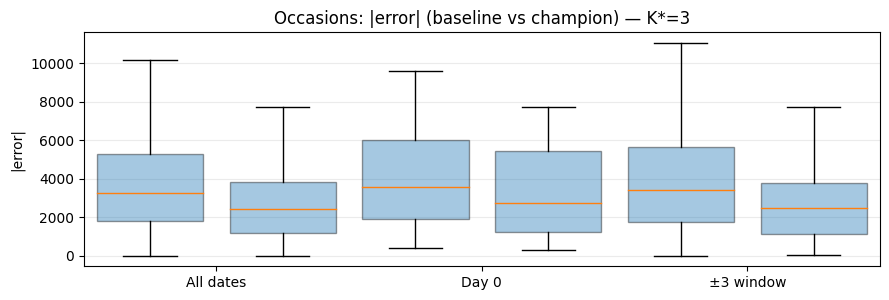


Leaderboard — K=5 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±5_occ),R2 (all),R2 (±5_occ)
0,SARIMA_gaussian_stl,4363.724743,5009.489266,0.586290,0.449045
1,SARIMA_trapezoid_stl,4363.724743,5009.489266,0.586290,0.449045
2,SARIMA_median_stl,4363.724743,5009.489266,0.586290,0.449045
3,Prophet_lin_median_stl,5013.514715,5270.430766,0.453908,0.390152
4,Prophet_lin_gaussian_stl,5013.514715,5270.430766,0.453908,0.390152
5,Prophet_lin_trapezoid_stl,5013.514715,5270.430766,0.453908,0.390152
6,Prophet_linear_baseline,5051.116330,5264.255995,0.445686,0.391580
7,SARIMA_baseline,5057.190718,5296.031434,0.444352,0.384213
8,Prophet_logistic_baseline,5224.651077,5409.958358,0.406944,0.357435
9,TBATS_baseline,6433.338258,6737.339240,0.100805,0.003434



ΔRMSE(±5) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±5),ΔRMSE (±5)%
0,SARIMA_gaussian_stl,5009.489266,4.839558
1,SARIMA_trapezoid_stl,5009.489266,4.839558
2,SARIMA_median_stl,5009.489266,4.839558
3,Prophet_linear_baseline,5264.255995,0.000000
4,Prophet_lin_trapezoid_stl,5270.430766,-0.117296
5,Prophet_lin_gaussian_stl,5270.430766,-0.117296
6,Prophet_lin_median_stl,5270.430766,-0.117296
7,SARIMA_baseline,5296.031434,-0.603607
8,Prophet_logistic_baseline,5409.958358,-2.767767
9,TBATS_baseline,6737.339240,-27.982743



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±5):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±5)%
0,2015-10-12,ColumbusDay | nan | Columbus Day,4621.827492,1792.003216,61.227389
1,2016-03-17,StPatricksDay | nan,5196.139058,2452.468581,52.802099
2,2016-01-07,OrthodoxChristmas | nan,5185.379608,2624.769893,49.381336
3,2015-09-07,LaborDay | nan | Labor Day,4491.213927,2643.069529,41.150220
4,2016-02-17,LentWeek2 | nan,5617.032022,3413.169422,39.235358
5,2015-11-11,VeteransDay | nan | Veterans Day,3954.799293,2461.492188,37.759365
6,2015-07-18,Eid al-Fitr | nan,2678.587303,1704.674070,36.359212
7,2016-02-14,ValentinesDay | nan,6314.886787,4062.181656,35.672930
8,2016-02-07,SuperBowl | nan,6101.190967,3947.512345,35.299315
9,2016-02-10,LentStart | nan,7007.860929,4661.760595,33.478123



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±5)%
20,2015-11-26,Thanksgiving | nan | Thanksgiving Day,5262.611395,8209.584099,-55.998296
19,2015-06-21,Father's day | nan,2208.349946,3295.702579,-49.238239
18,2016-01-01,NewYear | nan | New Year's Day,5109.035504,6208.268313,-21.515466
17,2015-12-25,Christmas | nan | Christmas Day,11297.542274,13611.499847,-20.481955
16,2015-10-31,Halloween | nan,2812.716312,3319.612379,-18.021585
15,2015-09-24,EidAlAdha | nan,2652.806346,3007.346172,-13.364708



Leaderboard — K=7 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±7_occ),R2 (all),R2 (±7_occ)
0,SARIMA_gaussian_stl,4363.724743,4762.759223,0.586290,0.498788
1,SARIMA_trapezoid_stl,4363.724743,4762.759223,0.586290,0.498788
2,SARIMA_median_stl,4363.724743,4762.759223,0.586290,0.498788
3,Prophet_lin_median_stl,5013.514715,5115.353068,0.453908,0.421830
4,Prophet_lin_gaussian_stl,5013.514715,5115.353068,0.453908,0.421830
5,Prophet_lin_trapezoid_stl,5013.514715,5115.353068,0.453908,0.421830
6,Prophet_linear_baseline,5051.116330,5132.035100,0.445686,0.418053
7,SARIMA_baseline,5057.190718,5138.221671,0.444352,0.416649
8,Prophet_logistic_baseline,5224.651077,5285.693801,0.406944,0.382683
9,TBATS_baseline,6433.338258,6657.940038,0.100805,0.020546



ΔRMSE(±7) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±7),ΔRMSE (±7)%
0,SARIMA_gaussian_stl,4762.759223,7.195506
1,SARIMA_trapezoid_stl,4762.759223,7.195506
2,SARIMA_median_stl,4762.759223,7.195506
3,Prophet_lin_median_stl,5115.353068,0.325057
4,Prophet_lin_trapezoid_stl,5115.353068,0.325057
5,Prophet_lin_gaussian_stl,5115.353068,0.325057
6,Prophet_linear_baseline,5132.035100,0.000000
7,SARIMA_baseline,5138.221671,-0.120548
8,Prophet_logistic_baseline,5285.693801,-2.994109
9,TBATS_baseline,6657.940038,-29.732940



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±7):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±7)%
0,2015-10-12,ColumbusDay | nan | Columbus Day,4775.248116,2140.987497,55.164895
1,2016-03-17,StPatricksDay | nan,4819.731945,2266.663198,52.971177
2,2015-09-07,LaborDay | nan | Labor Day,4445.535034,2654.327837,40.292275
3,2016-02-07,SuperBowl | nan,6323.722999,3827.974454,39.466443
4,2016-02-14,ValentinesDay | nan,5987.344255,3786.096179,36.765016
5,2016-01-07,OrthodoxChristmas | nan,5702.076917,3622.219066,36.475444
6,2016-02-10,LentStart | nan,6379.270592,4094.723388,35.812044
7,2016-02-17,LentWeek2 | nan,5802.085876,3820.566596,34.151843
8,2016-03-27,Easter | nan,5617.808887,3979.849237,29.156557
9,2016-01-18,MartinLutherKingDay | nan | Martin Luther King...,4157.153188,3000.738586,27.817464



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±7)%
20,2015-06-21,Father's day | nan,2305.516782,3520.517558,-52.699715
19,2015-11-26,Thanksgiving | nan | Thanksgiving Day,5073.854724,7158.031882,-41.076800
18,2016-01-01,NewYear | nan | New Year's Day,10092.701644,11953.652620,-18.438581
17,2015-12-25,Christmas | nan | Christmas Day,10248.490712,12094.453973,-18.012050
16,2015-09-24,EidAlAdha | nan,2586.474740,2937.185099,-13.559396
15,2015-12-14,Chanukah End | nan,3121.711020,3446.220093,-10.395231



=== HOLIDAYS — K in [1, 2, 3, 5, 7] | centers in TEST: 10 ===

Leaderboard — K=1 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±1_hol),R2 (all),R2 (±1_hol)
0,SARIMA_gaussian_stl,4363.724743,9820.063431,0.586290,0.028870
1,SARIMA_trapezoid_stl,4363.724743,9820.063431,0.586290,0.028870
2,SARIMA_median_stl,4363.724743,9820.063431,0.586290,0.028870
3,Prophet_lin_median_stl,5013.514715,9095.811593,0.453908,0.166834
4,Prophet_lin_gaussian_stl,5013.514715,9095.811593,0.453908,0.166834
5,Prophet_lin_trapezoid_stl,5013.514715,9095.811593,0.453908,0.166834
6,Prophet_linear_baseline,5051.116330,9117.600755,0.445686,0.162838
7,SARIMA_baseline,5057.190718,9403.384445,0.444352,0.109535
8,Prophet_logistic_baseline,5224.651077,9171.807672,0.406944,0.152854
9,TBATS_baseline,6433.338258,9979.235969,0.100805,-0.002867



ΔRMSE(±1) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±1),ΔRMSE (±1)%
0,Prophet_lin_trapezoid_stl,9095.811593,0.238979
1,Prophet_lin_median_stl,9095.811593,0.238979
2,Prophet_lin_gaussian_stl,9095.811593,0.238979
3,Prophet_linear_baseline,9117.600755,0.000000
4,Prophet_logistic_baseline,9171.807672,-0.594531
5,SARIMA_baseline,9403.384445,-3.134418
6,SARIMA_gaussian_stl,9820.063431,-7.704468
7,SARIMA_median_stl,9820.063431,-7.704468
8,SARIMA_trapezoid_stl,9820.063431,-7.704468
9,SARIMA_onehot_stl,9961.666206,-9.257539



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±1):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±1)%
0,2015-10-12,ColumbusDay | nan | Columbus Day,5662.015500,2053.472528,63.732481
1,2016-02-15,PresidentsDay | nan | Washington's Birthday,6324.157816,4021.094266,36.416921
2,2015-09-07,LaborDay | nan | Labor Day,5775.668484,4017.037443,30.448961
3,2016-01-01,NewYear | nan | New Year's Day,7723.344250,6205.630927,19.650986
4,2015-07-03,nan | Independence Day (observed),11154.545343,10874.569419,2.509972



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±1)%
9,2015-11-11,VeteransDay | nan | Veterans Day,1714.801534,2948.559350,-71.947557
8,2015-11-26,Thanksgiving | nan | Thanksgiving Day,7979.648319,10581.359762,-32.604337
7,2015-12-25,Christmas | nan | Christmas Day,20246.993549,23925.399732,-18.167666
6,2016-01-18,MartinLutherKingDay | nan | Martin Luther King...,3062.343818,3101.939016,-1.292970
5,2015-07-04,IndependenceDay | nan | Independence Day,10245.262119,10318.211571,-0.712031



Leaderboard — K=2 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±2_hol),R2 (all),R2 (±2_hol)
0,SARIMA_gaussian_stl,4363.724743,8315.085876,0.586290,0.099843
1,SARIMA_trapezoid_stl,4363.724743,8315.085876,0.586290,0.099843
2,SARIMA_median_stl,4363.724743,8315.085876,0.586290,0.099843
3,Prophet_lin_median_stl,5013.514715,7801.925848,0.453908,0.207520
4,Prophet_lin_gaussian_stl,5013.514715,7801.925848,0.453908,0.207520
5,Prophet_lin_trapezoid_stl,5013.514715,7801.925848,0.453908,0.207520
6,Prophet_linear_baseline,5051.116330,7783.213096,0.445686,0.211317
7,SARIMA_baseline,5057.190718,8025.903508,0.444352,0.161365
8,Prophet_logistic_baseline,5224.651077,7863.686745,0.406944,0.194923
9,TBATS_baseline,6433.338258,8855.568461,0.100805,-0.020981



ΔRMSE(±2) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±2),ΔRMSE (±2)%
0,Prophet_linear_baseline,7783.213096,0.000000
1,Prophet_lin_median_stl,7801.925848,-0.240425
2,Prophet_lin_trapezoid_stl,7801.925848,-0.240425
3,Prophet_lin_gaussian_stl,7801.925848,-0.240425
4,Prophet_logistic_baseline,7863.686745,-1.033939
5,SARIMA_baseline,8025.903508,-3.118126
6,SARIMA_gaussian_stl,8315.085876,-6.833589
7,SARIMA_median_stl,8315.085876,-6.833589
8,SARIMA_trapezoid_stl,8315.085876,-6.833589
9,SARIMA_onehot_stl,8711.292593,-11.924118



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±2):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±2)%
0,2015-10-12,ColumbusDay | nan | Columbus Day,4943.253866,1835.062172,62.877444
1,2016-02-15,PresidentsDay | nan | Washington's Birthday,6396.428690,4075.860071,36.279129
2,2015-09-07,LaborDay | nan | Labor Day,5126.294064,3277.100660,36.072714
3,2016-01-18,MartinLutherKingDay | nan | Martin Luther King...,4520.543403,3206.120862,29.076649
4,2016-01-01,NewYear | nan | New Year's Day,6430.628608,5155.359081,19.831180
5,2015-07-04,IndependenceDay | nan | Independence Day,8911.233040,8652.593979,2.902394
6,2015-07-03,nan | Independence Day (observed),8842.938916,8665.638308,2.004996



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±2)%
9,2015-11-11,VeteransDay | nan | Veterans Day,1750.413298,3127.742517,-78.685944
8,2015-11-26,Thanksgiving | nan | Thanksgiving Day,7190.724682,10272.339022,-42.855407
7,2015-12-25,Christmas | nan | Christmas Day,16323.605423,19407.179308,-18.890275



Leaderboard — K=3 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±3_hol),R2 (all),R2 (±3_hol)
0,SARIMA_gaussian_stl,4363.724743,7379.242451,0.586290,0.133311
1,SARIMA_trapezoid_stl,4363.724743,7379.242451,0.586290,0.133311
2,SARIMA_median_stl,4363.724743,7379.242451,0.586290,0.133311
3,Prophet_lin_median_stl,5013.514715,6979.588658,0.453908,0.224647
4,Prophet_lin_gaussian_stl,5013.514715,6979.588658,0.453908,0.224647
5,Prophet_lin_trapezoid_stl,5013.514715,6979.588658,0.453908,0.224647
6,Prophet_linear_baseline,5051.116330,6945.946822,0.445686,0.232103
7,SARIMA_baseline,5057.190718,7186.068080,0.444352,0.178093
8,Prophet_logistic_baseline,5224.651077,7041.960574,0.406944,0.210727
9,TBATS_baseline,6433.338258,8190.145535,0.100805,-0.067636



ΔRMSE(±3) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±3),ΔRMSE (±3)%
0,Prophet_linear_baseline,6945.946822,0.000000
1,Prophet_lin_median_stl,6979.588658,-0.484338
2,Prophet_lin_trapezoid_stl,6979.588658,-0.484338
3,Prophet_lin_gaussian_stl,6979.588658,-0.484338
4,Prophet_logistic_baseline,7041.960574,-1.382299
5,SARIMA_baseline,7186.068080,-3.456998
6,SARIMA_gaussian_stl,7379.242451,-6.238107
7,SARIMA_median_stl,7379.242451,-6.238107
8,SARIMA_trapezoid_stl,7379.242451,-6.238107
9,SARIMA_onehot_stl,7865.213526,-13.234577



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±3):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±3)%
0,2015-10-12,ColumbusDay | nan | Columbus Day,5078.166596,2024.430256,60.134623
1,2015-09-07,LaborDay | nan | Labor Day,4463.178673,2782.479217,37.657006
2,2016-02-15,PresidentsDay | nan | Washington's Birthday,6002.044699,3747.008195,37.571138
3,2016-01-18,MartinLutherKingDay | nan | Martin Luther King...,4509.984690,3242.979488,28.093337
4,2015-11-11,VeteransDay | nan | Veterans Day,3264.058227,2656.282104,18.620260
5,2016-01-01,NewYear | nan | New Year's Day,5627.428782,4821.380214,14.323568
6,2015-07-04,IndependenceDay | nan | Independence Day,7769.292916,7423.479147,4.451033
7,2015-07-03,nan | Independence Day (observed),7732.043247,7505.711145,2.927197



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±3)%
9,2015-11-26,Thanksgiving | nan | Thanksgiving Day,6242.479019,9630.454209,-54.272913
8,2015-12-25,Christmas | nan | Christmas Day,14023.237973,16782.913702,-19.679305



Leaderboard — K=5 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±5_hol),R2 (all),R2 (±5_hol)
0,SARIMA_gaussian_stl,4363.724743,6331.479826,0.586290,0.235787
1,SARIMA_trapezoid_stl,4363.724743,6331.479826,0.586290,0.235787
2,SARIMA_median_stl,4363.724743,6331.479826,0.586290,0.235787
3,Prophet_lin_median_stl,5013.514715,6219.074881,0.453908,0.262681
4,Prophet_lin_gaussian_stl,5013.514715,6219.074881,0.453908,0.262681
5,Prophet_lin_trapezoid_stl,5013.514715,6219.074881,0.453908,0.262681
6,Prophet_linear_baseline,5051.116330,6188.367793,0.445686,0.269944
7,SARIMA_baseline,5057.190718,6402.038728,0.444352,0.218659
8,Prophet_logistic_baseline,5224.651077,6310.462527,0.406944,0.240852
9,TBATS_baseline,6433.338258,7699.600710,0.100805,-0.130161



ΔRMSE(±5) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±5),ΔRMSE (±5)%
0,Prophet_linear_baseline,6188.367793,0.000000
1,Prophet_lin_median_stl,6219.074881,-0.496207
2,Prophet_lin_trapezoid_stl,6219.074881,-0.496207
3,Prophet_lin_gaussian_stl,6219.074881,-0.496207
4,Prophet_logistic_baseline,6310.462527,-1.972972
5,SARIMA_trapezoid_stl,6331.479826,-2.312597
6,SARIMA_gaussian_stl,6331.479826,-2.312597
7,SARIMA_median_stl,6331.479826,-2.312597
8,SARIMA_baseline,6402.038728,-3.452783
9,SARIMA_onehot_stl,7136.431571,-15.320094



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±5):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±5)%
0,2015-10-12,ColumbusDay | nan | Columbus Day,4621.827492,1792.003216,61.227389
1,2015-09-07,LaborDay | nan | Labor Day,4491.213927,2643.069529,41.150220
2,2015-11-11,VeteransDay | nan | Veterans Day,3954.799293,2461.492188,37.759365
3,2016-02-15,PresidentsDay | nan | Washington's Birthday,6378.852766,4124.317260,35.343903
4,2016-01-18,MartinLutherKingDay | nan | Martin Luther King...,4250.999678,3110.439166,26.830407
5,2015-07-04,IndependenceDay | nan | Independence Day,6459.302364,6260.372053,3.079749
6,2015-07-03,nan | Independence Day (observed),6358.629076,6303.073040,0.873711



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±5)%
9,2015-11-26,Thanksgiving | nan | Thanksgiving Day,5262.611395,8209.584099,-55.998296
8,2016-01-01,NewYear | nan | New Year's Day,5109.035504,6208.268313,-21.515466
7,2015-12-25,Christmas | nan | Christmas Day,11297.542274,13611.499847,-20.481955



Leaderboard — K=7 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±7_hol),R2 (all),R2 (±7_hol)
0,SARIMA_gaussian_stl,4363.724743,5708.025182,0.586290,0.309507
1,SARIMA_trapezoid_stl,4363.724743,5708.025182,0.586290,0.309507
2,SARIMA_median_stl,4363.724743,5708.025182,0.586290,0.309507
3,Prophet_lin_median_stl,5013.514715,5720.160213,0.453908,0.306568
4,Prophet_lin_gaussian_stl,5013.514715,5720.160213,0.453908,0.306568
5,Prophet_lin_trapezoid_stl,5013.514715,5720.160213,0.453908,0.306568
6,Prophet_linear_baseline,5051.116330,5707.384383,0.445686,0.309662
7,SARIMA_baseline,5057.190718,5817.829787,0.444352,0.282685
8,Prophet_logistic_baseline,5224.651077,5841.022149,0.406944,0.276955
9,TBATS_baseline,6433.338258,7331.835743,0.100805,-0.139234



ΔRMSE(±7) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±7),ΔRMSE (±7)%
0,Prophet_linear_baseline,5707.384383,0.000000
1,SARIMA_trapezoid_stl,5708.025182,-0.011228
2,SARIMA_gaussian_stl,5708.025182,-0.011228
3,SARIMA_median_stl,5708.025182,-0.011228
4,Prophet_lin_trapezoid_stl,5720.160213,-0.223847
5,Prophet_lin_gaussian_stl,5720.160213,-0.223847
6,Prophet_lin_median_stl,5720.160213,-0.223847
7,SARIMA_baseline,5817.829787,-1.935132
8,Prophet_logistic_baseline,5841.022149,-2.341489
9,SARIMA_onehot_stl,6614.464327,-15.893094



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±7):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±7)%
0,2015-10-12,ColumbusDay | nan | Columbus Day,4775.248116,2140.987497,55.164895
1,2015-09-07,LaborDay | nan | Labor Day,4445.535034,2654.327837,40.292275
2,2016-02-15,PresidentsDay | nan | Washington's Birthday,5937.894414,3808.656657,35.858464
3,2016-01-18,MartinLutherKingDay | nan | Martin Luther King...,4157.153188,3000.738586,27.817464
4,2015-11-11,VeteransDay | nan | Veterans Day,3524.625145,3212.733207,8.848939
5,2015-07-04,IndependenceDay | nan | Independence Day,5663.070523,5588.841397,1.310758
6,2015-07-03,nan | Independence Day (observed),5670.176282,5653.757995,0.289555



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±7)%
9,2015-11-26,Thanksgiving | nan | Thanksgiving Day,5073.854724,7158.031882,-41.076800
8,2016-01-01,NewYear | nan | New Year's Day,10092.701644,11953.652620,-18.438581
7,2015-12-25,Christmas | nan | Christmas Day,10248.490712,12094.453973,-18.012050



=== EVENTS — K in [1, 2, 3, 5, 7] | centers in TEST: 13 ===

Leaderboard — K=1 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±1_ev),R2 (all),R2 (±1_ev)
0,SARIMA_gaussian_stl,4363.724743,3350.646706,0.586290,0.683586
1,SARIMA_trapezoid_stl,4363.724743,3350.646706,0.586290,0.683586
2,SARIMA_median_stl,4363.724743,3350.646706,0.586290,0.683586
3,Prophet_lin_median_stl,5013.514715,4845.418361,0.453908,0.338300
4,Prophet_lin_gaussian_stl,5013.514715,4845.418361,0.453908,0.338300
5,Prophet_lin_trapezoid_stl,5013.514715,4845.418361,0.453908,0.338300
6,Prophet_linear_baseline,5051.116330,4829.173740,0.445686,0.342730
7,SARIMA_baseline,5057.190718,4942.775592,0.444352,0.311442
8,Prophet_logistic_baseline,5224.651077,5026.538666,0.406944,0.287907
9,TBATS_baseline,6433.338258,6622.987136,0.100805,-0.236250



ΔRMSE(±1) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±1),ΔRMSE (±1)%
0,SARIMA_gaussian_stl,3350.646706,30.616563
1,SARIMA_trapezoid_stl,3350.646706,30.616563
2,SARIMA_median_stl,3350.646706,30.616563
3,Prophet_linear_baseline,4829.173740,0.000000
4,Prophet_lin_trapezoid_stl,4845.418361,-0.336385
5,Prophet_lin_gaussian_stl,4845.418361,-0.336385
6,Prophet_lin_median_stl,4845.418361,-0.336385
7,SARIMA_baseline,4942.775592,-2.352408
8,Prophet_logistic_baseline,5026.538666,-4.086930
9,TBATS_baseline,6622.987136,-37.145348



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±1):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±1)%
0,2016-02-17,LentWeek2 | nan,2976.615840,674.959340,77.324607
1,2016-03-17,StPatricksDay | nan,3068.414789,850.485978,72.282562
2,2015-12-14,Chanukah End | nan,4416.490847,1985.445047,55.044738
3,2015-07-18,Eid al-Fitr | nan,3133.608405,1601.319832,48.898534
4,2016-01-07,OrthodoxChristmas | nan,4145.522753,2159.991515,47.895799
5,2016-02-14,ValentinesDay | nan,7839.566548,5219.422313,33.422055
6,2016-02-10,LentStart | nan,7772.414976,5267.131433,32.233013
7,2016-02-07,SuperBowl | nan,6437.924627,4430.593807,31.179781
8,2016-03-24,Purim End | nan,4878.112965,3428.191310,29.723003
9,2016-03-27,Easter | nan,5572.715322,4046.098770,27.394483



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±1)%
12,2015-09-24,EidAlAdha | nan,615.652314,2318.385301,-276.573798
11,2015-06-21,Father's day | nan,2568.378590,4089.997533,-59.244340



Leaderboard — K=2 | baseline(±K)=Prophet_linear_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±2_ev),R2 (all),R2 (±2_ev)
0,SARIMA_gaussian_stl,4363.724743,3083.932808,0.586290,0.723646
1,SARIMA_trapezoid_stl,4363.724743,3083.932808,0.586290,0.723646
2,SARIMA_median_stl,4363.724743,3083.932808,0.586290,0.723646
3,Prophet_lin_median_stl,5013.514715,4623.281819,0.453908,0.378908
4,Prophet_lin_gaussian_stl,5013.514715,4623.281819,0.453908,0.378908
5,Prophet_lin_trapezoid_stl,5013.514715,4623.281819,0.453908,0.378908
6,Prophet_linear_baseline,5051.116330,4589.335083,0.445686,0.387995
7,SARIMA_baseline,5057.190718,4589.991153,0.444352,0.387820
8,Prophet_logistic_baseline,5224.651077,4788.621330,0.406944,0.333690
9,TBATS_baseline,6433.338258,6323.425724,0.100805,-0.161877



ΔRMSE(±2) — vs best window baseline (Prophet_linear_baseline)


,Model,RMSE(±2),ΔRMSE (±2)%
0,SARIMA_gaussian_stl,3083.932808,32.802187
1,SARIMA_trapezoid_stl,3083.932808,32.802187
2,SARIMA_median_stl,3083.932808,32.802187
3,Prophet_linear_baseline,4589.335083,0.000000
4,SARIMA_baseline,4589.991153,-0.014296
5,Prophet_lin_gaussian_stl,4623.281819,-0.739687
6,Prophet_lin_trapezoid_stl,4623.281819,-0.739687
7,Prophet_lin_median_stl,4623.281819,-0.739687
8,Prophet_logistic_baseline,4788.621330,-4.342377
9,TBATS_baseline,6323.425724,-37.785226



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±2):


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±2)%
0,2016-03-17,StPatricksDay | nan,4091.782486,1854.823886,54.669538
1,2016-01-07,OrthodoxChristmas | nan,6199.149892,2857.226432,53.909383
2,2015-12-14,Chanukah End | nan,4194.176694,1971.361557,52.997651
3,2015-07-18,Eid al-Fitr | nan,3007.671502,1733.334465,42.369555
4,2016-02-17,LentWeek2 | nan,4974.271928,3117.906855,37.319332
5,2016-02-07,SuperBowl | nan,5601.466804,3532.641032,36.933643
6,2016-02-14,ValentinesDay | nan,6902.510273,4428.268484,35.845536
7,2016-03-24,Purim End | nan,5716.935684,3836.838838,32.886444
8,2016-02-10,LentStart | nan,6678.801726,4574.443730,31.508017
9,2016-03-27,Easter | nan,5669.035073,4128.841198,27.168537



Per-window — toughest windows:


,date,Occasion,RMSE (Prophet_linear_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±2)%
12,2015-09-24,EidAlAdha | nan,870.482141,2245.275682,-157.934721
11,2015-06-21,Father's day | nan,2130.037907,3401.494775,-59.691748



Leaderboard — K=3 | baseline(±K)=SARIMA_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±3_ev),R2 (all),R2 (±3_ev)
0,SARIMA_gaussian_stl,4363.724743,2982.433643,0.586290,0.746923
1,SARIMA_trapezoid_stl,4363.724743,2982.433643,0.586290,0.746923
2,SARIMA_median_stl,4363.724743,2982.433643,0.586290,0.746923
3,Prophet_lin_median_stl,5013.514715,4436.945030,0.453908,0.439882
4,Prophet_lin_gaussian_stl,5013.514715,4436.945030,0.453908,0.439882
5,Prophet_lin_trapezoid_stl,5013.514715,4436.945030,0.453908,0.439882
6,Prophet_linear_baseline,5051.116330,4427.239003,0.445686,0.442330
7,SARIMA_baseline,5057.190718,4337.547128,0.444352,0.464697
8,Prophet_logistic_baseline,5224.651077,4628.471427,0.406944,0.390482
9,TBATS_baseline,6433.338258,6150.221506,0.100805,-0.076200



ΔRMSE(±3) — vs best window baseline (SARIMA_baseline)


,Model,RMSE(±3),ΔRMSE (±3)%
0,SARIMA_gaussian_stl,2982.433643,31.241470
1,SARIMA_trapezoid_stl,2982.433643,31.241470
2,SARIMA_median_stl,2982.433643,31.241470
3,SARIMA_baseline,4337.547128,0.000000
4,Prophet_linear_baseline,4427.239003,-2.067802
5,Prophet_lin_gaussian_stl,4436.945030,-2.291569
6,Prophet_lin_trapezoid_stl,4436.945030,-2.291569
7,Prophet_lin_median_stl,4436.945030,-2.291569
8,Prophet_logistic_baseline,4628.471427,-6.707116
9,TBATS_baseline,6150.221506,-41.790310



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±3):


,date,Occasion,RMSE (SARIMA_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±3)%
0,2016-03-17,StPatricksDay | nan,4280.339168,1899.558056,55.621319
1,2015-07-18,Eid al-Fitr | nan,3787.627834,1911.311297,49.538039
2,2016-02-17,LentWeek2 | nan,5577.439912,2874.248361,48.466529
3,2016-02-07,SuperBowl | nan,5656.878899,3243.741047,42.658468
4,2016-02-10,LentStart | nan,7443.805963,4474.474096,39.889969
5,2016-02-14,ValentinesDay | nan,7975.332136,4890.921869,38.674380
6,2016-03-24,Purim End | nan,5227.466471,3363.681620,35.653693
7,2016-01-07,OrthodoxChristmas | nan,3970.922261,2627.516045,33.831088
8,2016-03-27,Easter | nan,5090.610175,3843.186540,24.504403



Per-window — toughest windows:


,date,Occasion,RMSE (SARIMA_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±3)%
12,2015-06-21,Father's day | nan,2155.112044,3408.368112,-58.152711
11,2015-09-24,EidAlAdha | nan,1809.498550,2236.588391,-23.602663
10,2015-10-31,Halloween | nan,2752.436566,3107.844223,-12.912474
9,2015-12-14,Chanukah End | nan,2033.515196,2267.892570,-11.525725



Leaderboard — K=5 | baseline(±K)=SARIMA_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±5_ev),R2 (all),R2 (±5_ev)
0,SARIMA_gaussian_stl,4363.724743,3101.777053,0.586290,0.746907
1,SARIMA_trapezoid_stl,4363.724743,3101.777053,0.586290,0.746907
2,SARIMA_median_stl,4363.724743,3101.777053,0.586290,0.746907
3,Prophet_lin_median_stl,5013.514715,4287.027689,0.453908,0.516528
4,Prophet_lin_gaussian_stl,5013.514715,4287.027689,0.453908,0.516528
5,Prophet_lin_trapezoid_stl,5013.514715,4287.027689,0.453908,0.516528
6,Prophet_linear_baseline,5051.116330,4308.968321,0.445686,0.511567
7,SARIMA_baseline,5057.190718,4183.038662,0.444352,0.539698
8,Prophet_logistic_baseline,5224.651077,4506.047860,0.406944,0.465866
9,TBATS_baseline,6433.338258,5958.357335,0.100805,0.066075



ΔRMSE(±5) — vs best window baseline (SARIMA_baseline)


,Model,RMSE(±5),ΔRMSE (±5)%
0,SARIMA_gaussian_stl,3101.777053,25.848712
1,SARIMA_trapezoid_stl,3101.777053,25.848712
2,SARIMA_median_stl,3101.777053,25.848712
3,SARIMA_baseline,4183.038662,0.000000
4,Prophet_lin_trapezoid_stl,4287.027689,-2.485969
5,Prophet_lin_gaussian_stl,4287.027689,-2.485969
6,Prophet_lin_median_stl,4287.027689,-2.485969
7,Prophet_linear_baseline,4308.968321,-3.010483
8,Prophet_logistic_baseline,4506.047860,-7.721879
9,TBATS_baseline,5958.357335,-42.440886



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±5):


,date,Occasion,RMSE (SARIMA_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±5)%
0,2015-07-18,Eid al-Fitr | nan,3376.114067,1704.674070,49.507806
1,2016-03-17,StPatricksDay | nan,4836.958862,2452.468581,49.297303
2,2016-02-17,LentWeek2 | nan,6208.490231,3413.169422,45.024164
3,2016-02-14,ValentinesDay | nan,7103.676999,4062.181656,42.815789
4,2016-02-07,SuperBowl | nan,6658.297613,3947.512345,40.712888
5,2016-02-10,LentStart | nan,7501.777296,4661.760595,37.857918
6,2016-03-24,Purim End | nan,4357.656797,2995.769782,31.252737
7,2016-03-27,Easter | nan,5020.699213,3524.866505,29.793315
8,2016-01-07,OrthodoxChristmas | nan,3259.188744,2624.769893,19.465545



Per-window — toughest windows:


,date,Occasion,RMSE (SARIMA_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±5)%
12,2015-12-14,Chanukah End | nan,1773.180257,3145.859678,-77.413417
11,2015-06-21,Father's day | nan,1924.168831,3295.702579,-71.279283
10,2015-10-31,Halloween | nan,2411.453716,3319.612379,-37.660215
9,2015-09-24,EidAlAdha | nan,2749.953627,3007.346172,-9.359887



Leaderboard — K=7 | baseline(±K)=SARIMA_baseline | champion=SARIMA_gaussian_stl


,Model,RMSE (all),RMSE (±7_ev),R2 (all),R2 (±7_ev)
0,SARIMA_gaussian_stl,4363.724743,3258.970092,0.586290,0.728186
1,SARIMA_trapezoid_stl,4363.724743,3258.970092,0.586290,0.728186
2,SARIMA_median_stl,4363.724743,3258.970092,0.586290,0.728186
3,Prophet_lin_median_stl,5013.514715,4382.953792,0.453908,0.508362
4,Prophet_lin_gaussian_stl,5013.514715,4382.953792,0.453908,0.508362
5,Prophet_lin_trapezoid_stl,5013.514715,4382.953792,0.453908,0.508362
6,Prophet_linear_baseline,5051.116330,4424.509046,0.445686,0.498995
7,SARIMA_baseline,5057.190718,4264.747459,0.444352,0.534523
8,Prophet_logistic_baseline,5224.651077,4619.570278,0.406944,0.453846
9,TBATS_baseline,6433.338258,6019.809205,0.100805,0.072578



ΔRMSE(±7) — vs best window baseline (SARIMA_baseline)


,Model,RMSE(±7),ΔRMSE (±7)%
0,SARIMA_gaussian_stl,3258.970092,23.583515
1,SARIMA_trapezoid_stl,3258.970092,23.583515
2,SARIMA_median_stl,3258.970092,23.583515
3,SARIMA_baseline,4264.747459,0.000000
4,Prophet_lin_trapezoid_stl,4382.953792,-2.771708
5,Prophet_lin_gaussian_stl,4382.953792,-2.771708
6,Prophet_lin_median_stl,4382.953792,-2.771708
7,Prophet_linear_baseline,4424.509046,-3.746097
8,Prophet_logistic_baseline,4619.570278,-8.319902
9,TBATS_baseline,6019.809205,-41.152771



ΔRMSE(all) — vs best ALL baseline (Prophet_linear_baseline)


,Model,RMSE (all),R2 (all),ΔRMSE(all)%
0,SARIMA_gaussian_stl,4363.724743,0.586290,13.608706
1,SARIMA_trapezoid_stl,4363.724743,0.586290,13.608706
2,SARIMA_median_stl,4363.724743,0.586290,13.608706
3,Prophet_lin_median_stl,5013.514715,0.453908,0.744422
4,Prophet_lin_trapezoid_stl,5013.514715,0.453908,0.744422
5,Prophet_lin_gaussian_stl,5013.514715,0.453908,0.744422
6,Prophet_linear_baseline,5051.116330,0.445686,0.000000
7,SARIMA_baseline,5057.190718,0.444352,-0.120258
8,Prophet_logistic_baseline,5224.651077,0.406944,-3.435572
9,TBATS_baseline,6433.338258,0.100805,-27.364682



Per-window — top gains (±7):


,date,Occasion,RMSE (SARIMA_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±7)%
0,2016-03-17,StPatricksDay | nan,4637.448721,2266.663198,51.122625
1,2016-02-14,ValentinesDay | nan,6661.298766,3786.096179,43.162793
2,2016-02-07,SuperBowl | nan,6630.428088,3827.974454,42.266557
3,2016-02-17,LentWeek2 | nan,6485.862836,3820.566596,41.093935
4,2016-02-10,LentStart | nan,6900.853183,4094.723388,40.663520
5,2015-07-18,Eid al-Fitr | nan,3341.107010,2002.561266,40.062941
6,2016-03-27,Easter | nan,5814.856188,3979.849237,31.557220
7,2016-03-24,Purim End | nan,3947.385058,2782.590472,29.508005
8,2016-01-07,OrthodoxChristmas | nan,4250.878645,3622.219066,14.788933



Per-window — toughest windows:


,date,Occasion,RMSE (SARIMA_baseline),RMSE (SARIMA_gaussian_stl),ΔRMSE (±7)%
12,2015-12-14,Chanukah End | nan,1638.491560,3446.220093,-110.328828
11,2015-06-21,Father's day | nan,1971.425724,3520.517558,-78.577235
10,2015-10-31,Halloween | nan,2394.263181,2969.719950,-24.034817
9,2015-09-24,EidAlAdha | nan,2888.101904,2937.185099,-1.699497



=== Best/Worst panels for ALL domains — K=1 ===


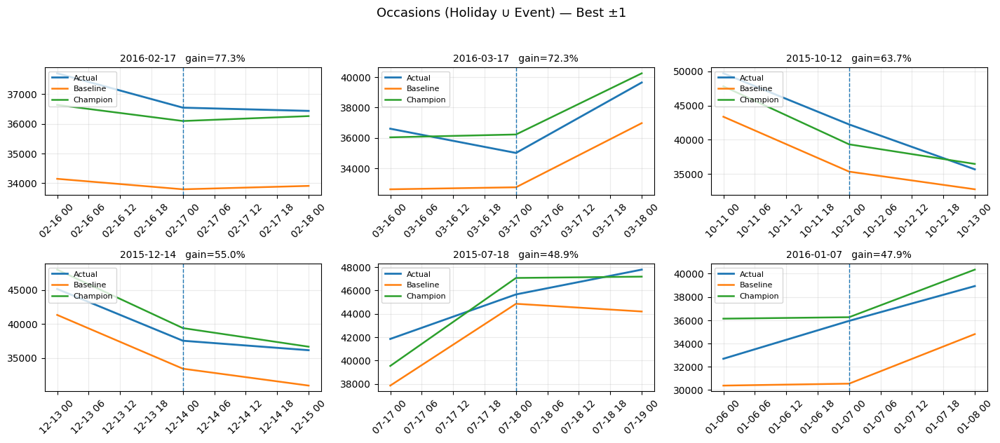

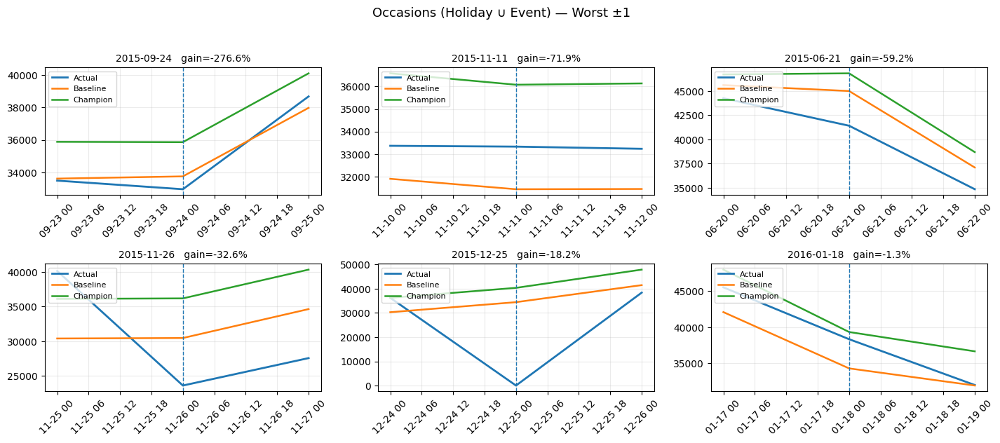

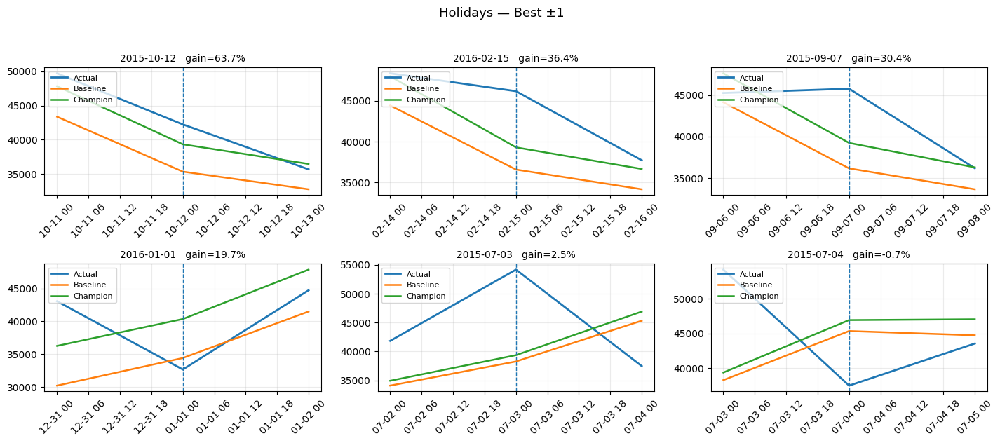

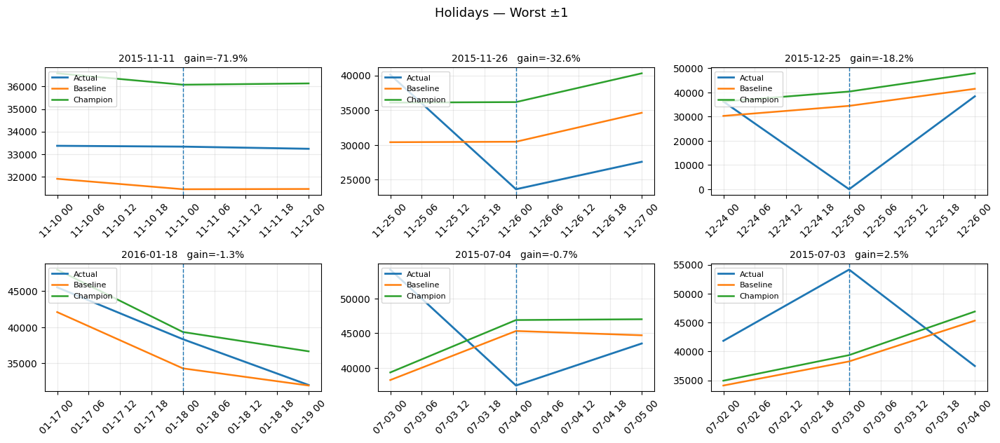

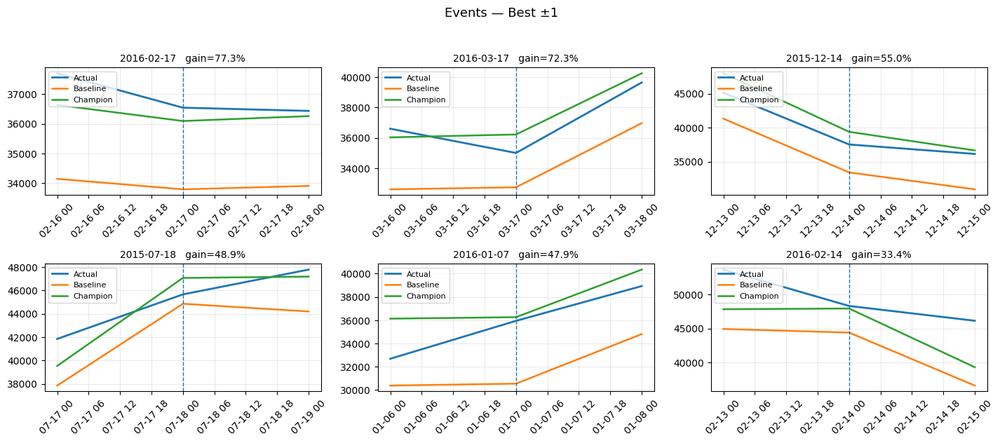

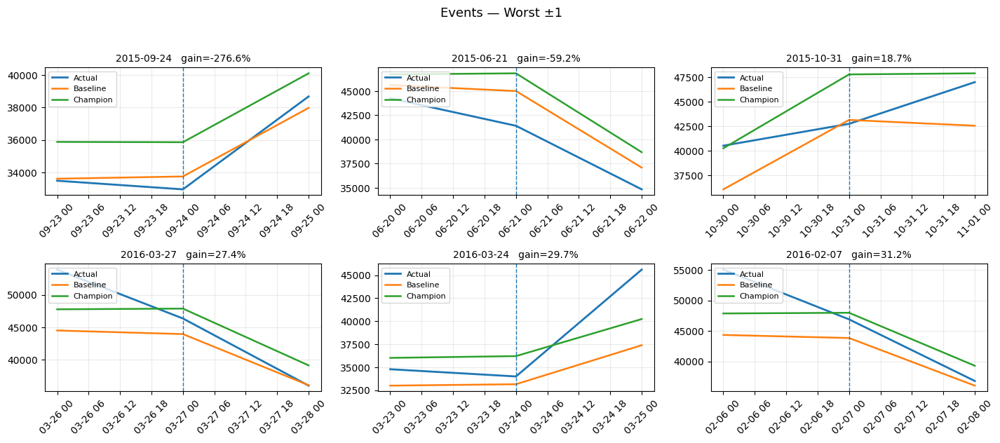


=== Best/Worst panels for ALL domains — K=2 ===


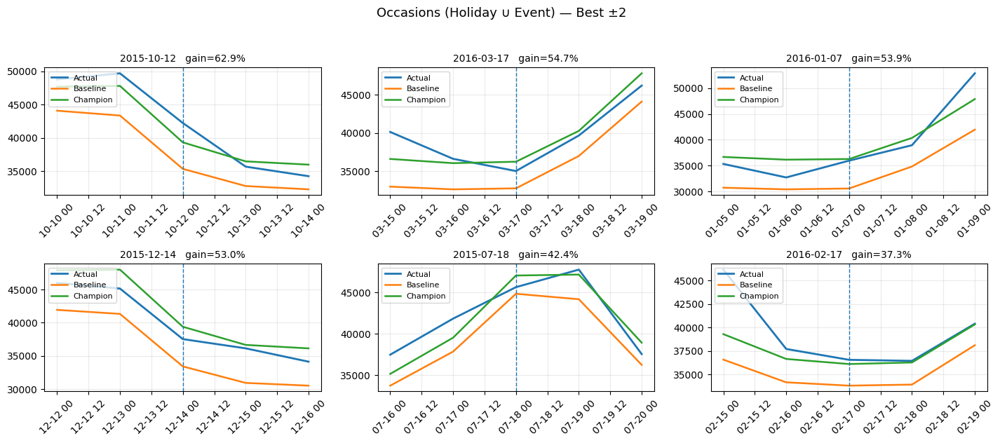

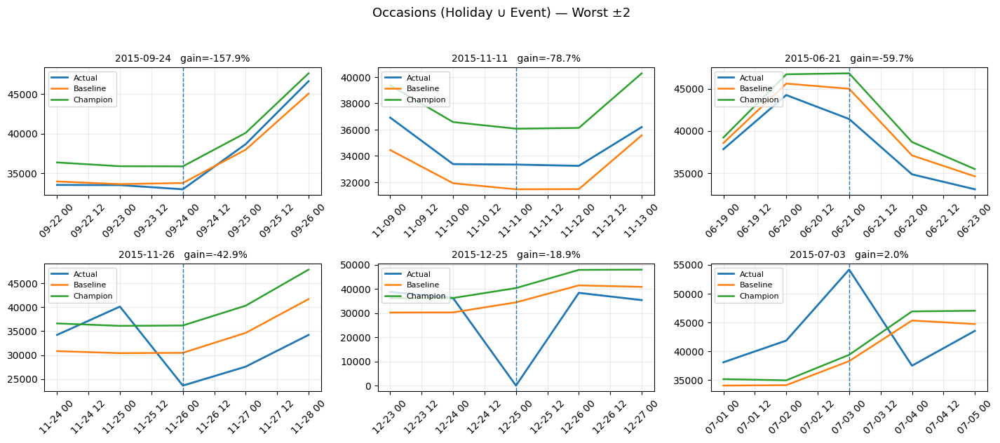

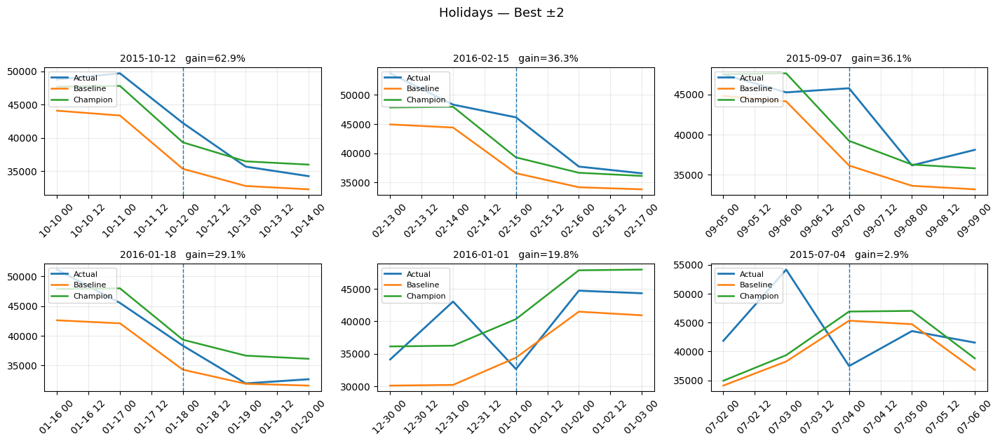

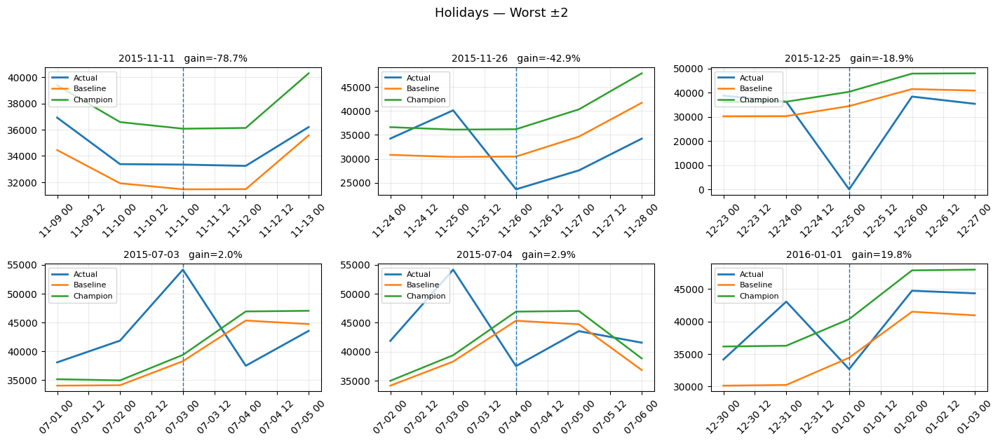

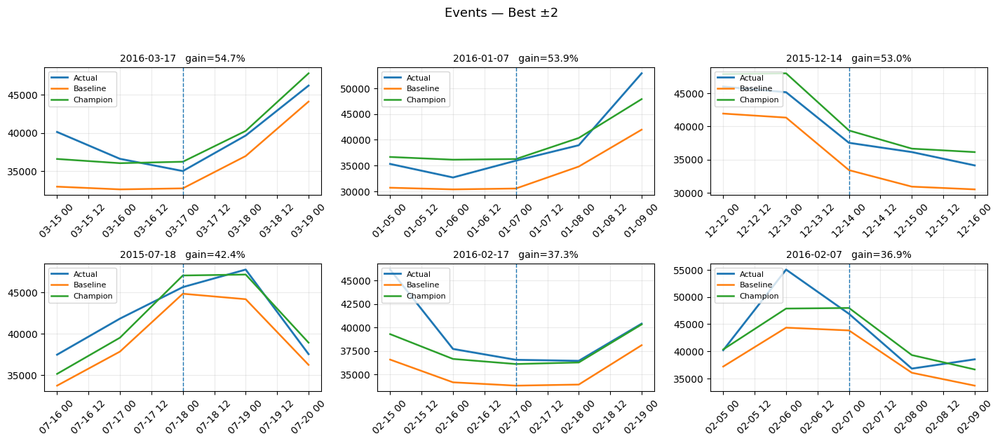

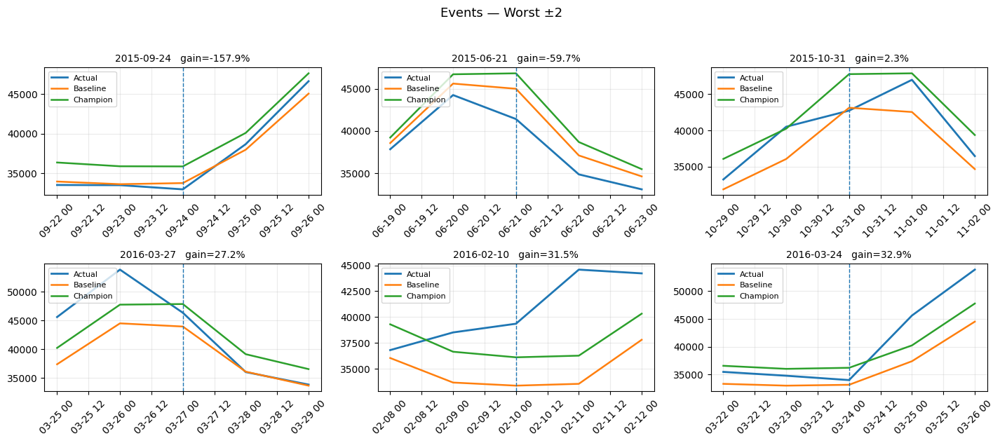


=== Best/Worst panels for ALL domains — K=3 ===


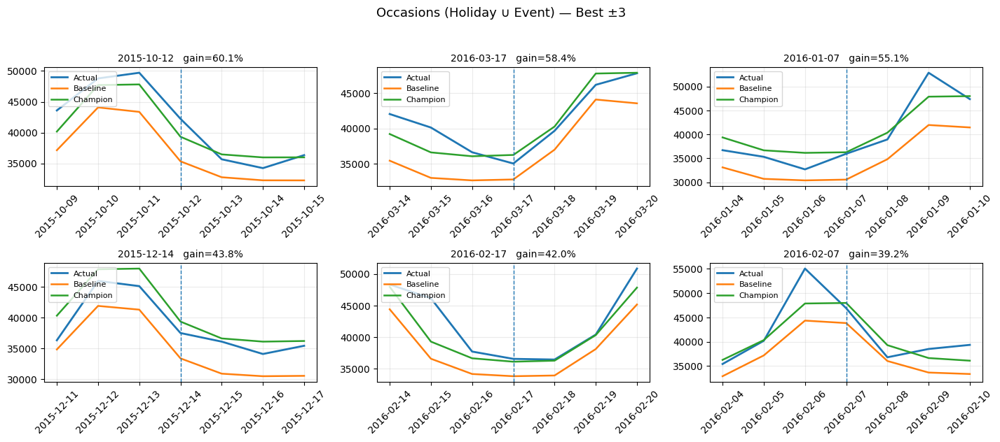

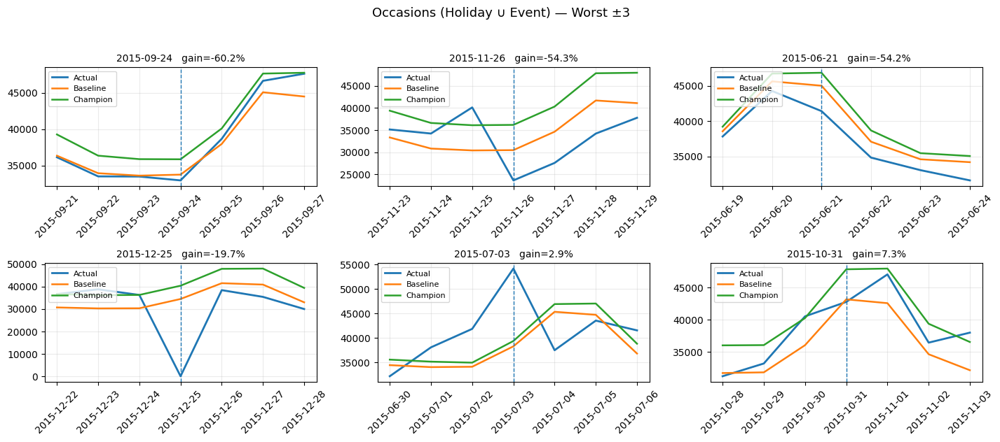

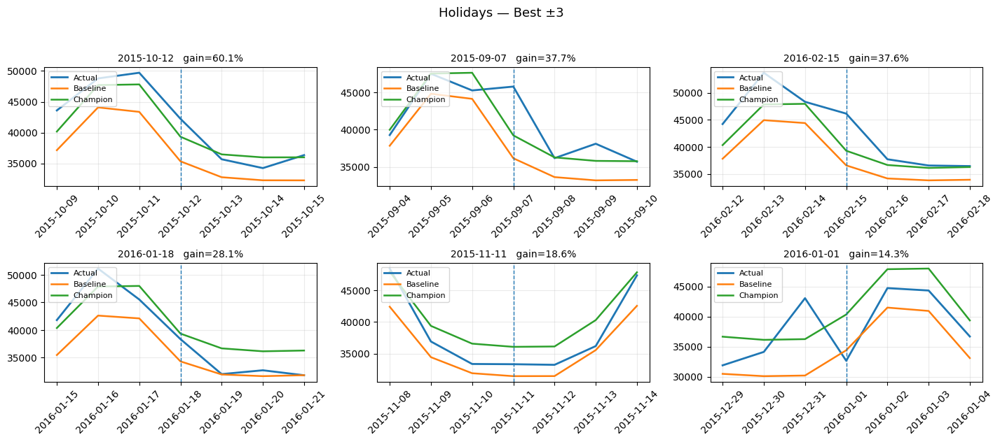

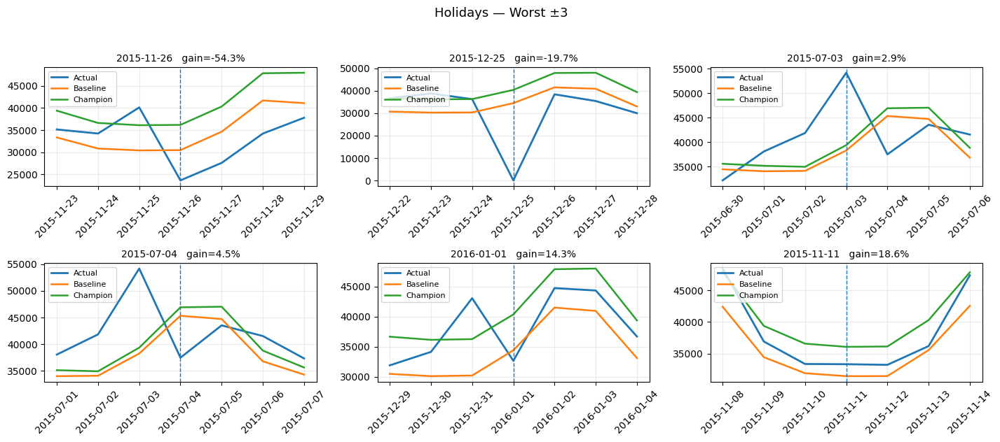

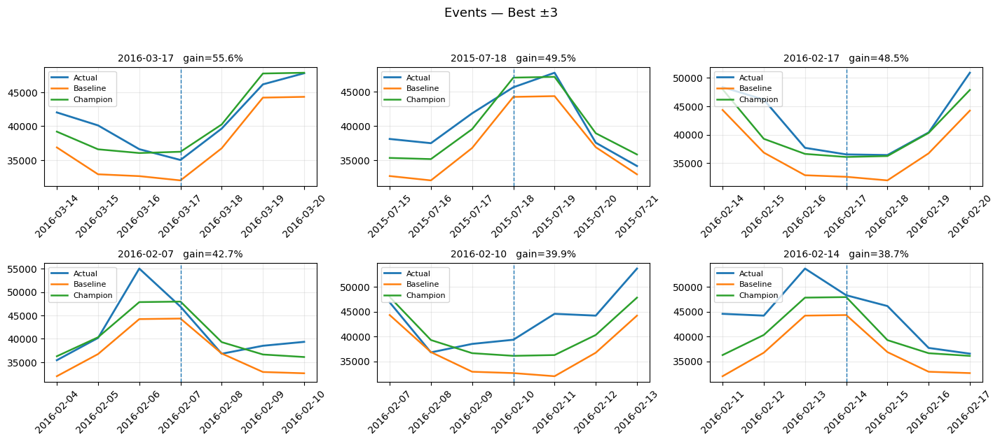

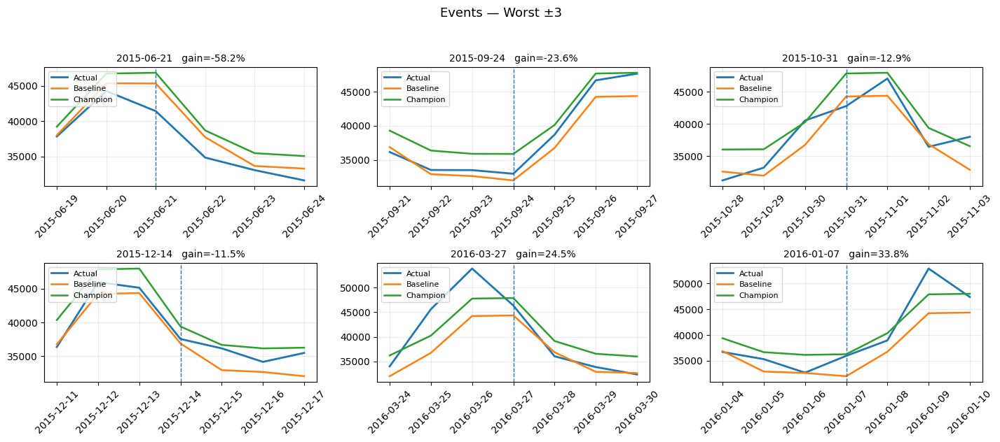


=== Best/Worst panels for ALL domains — K=5 ===


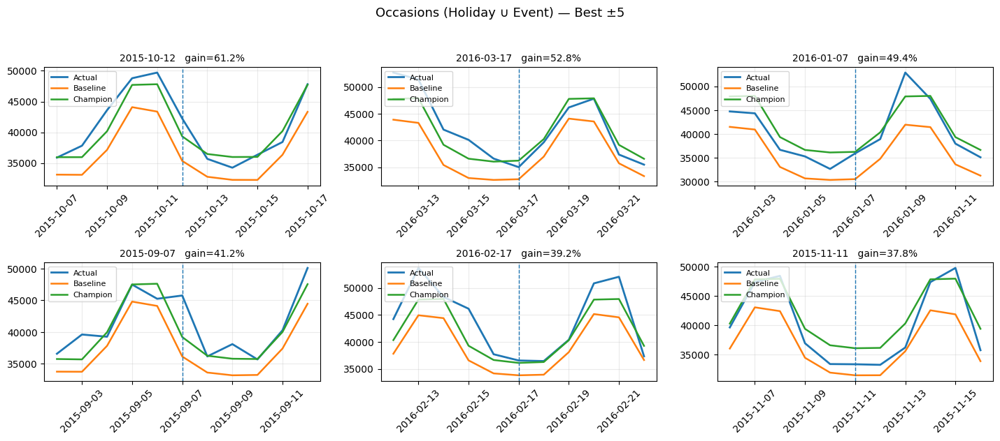

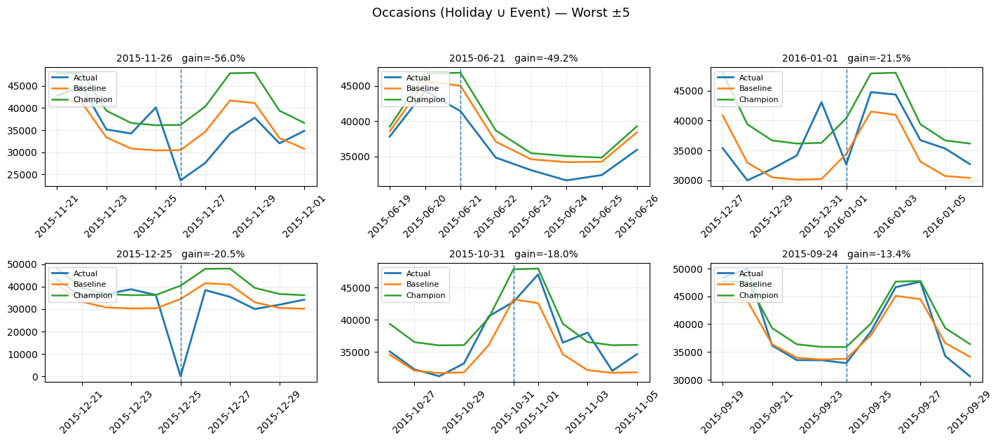

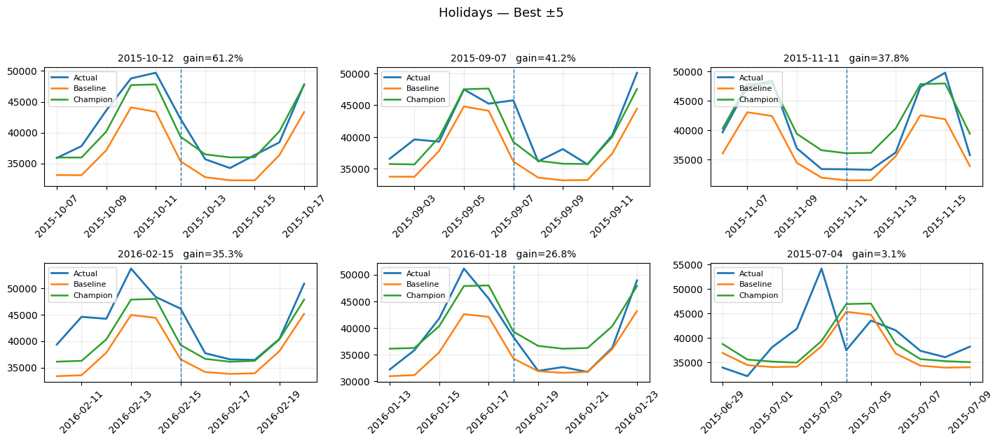

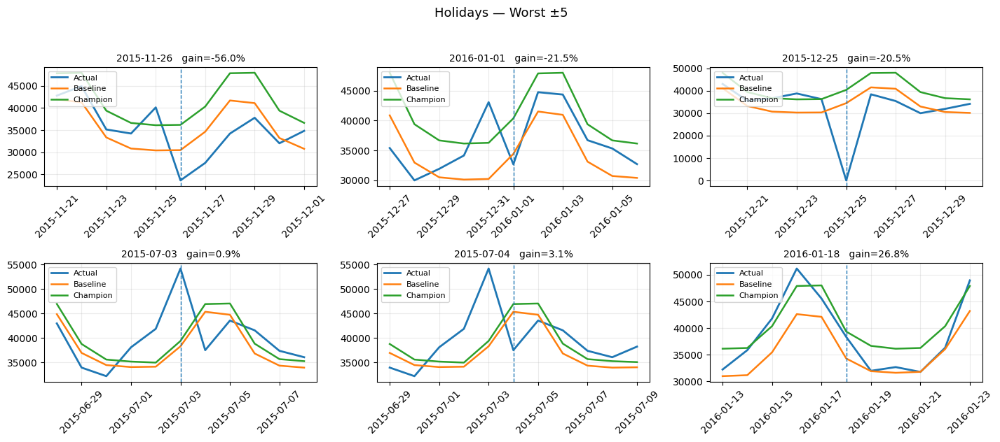

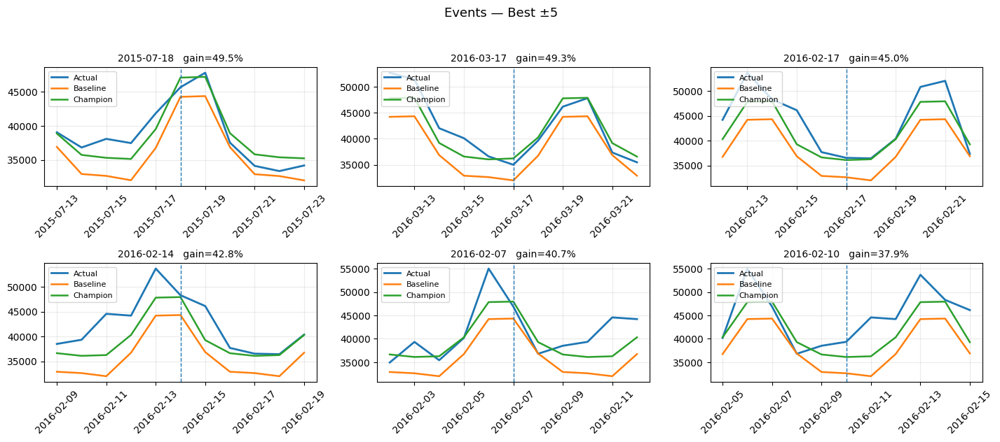

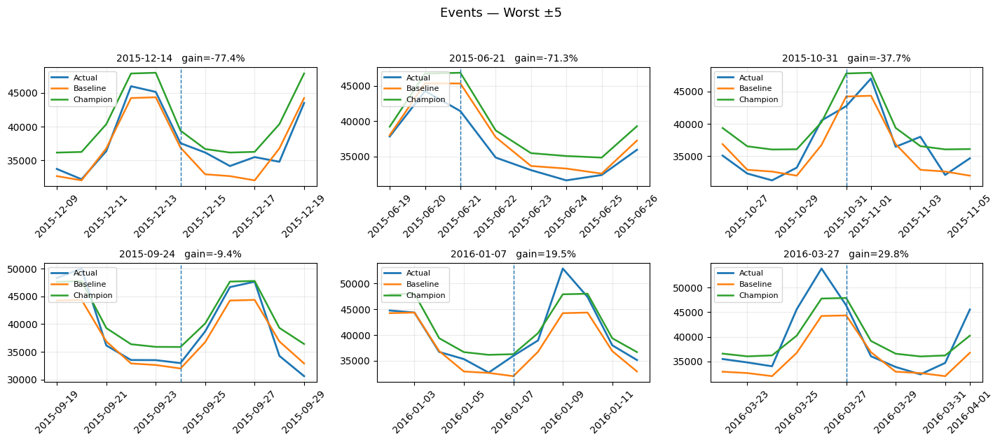


=== Best/Worst panels for ALL domains — K=7 ===


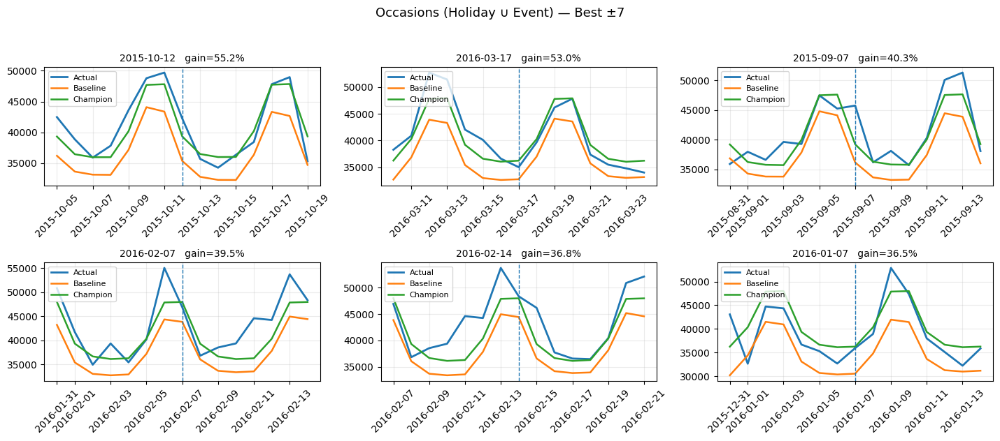

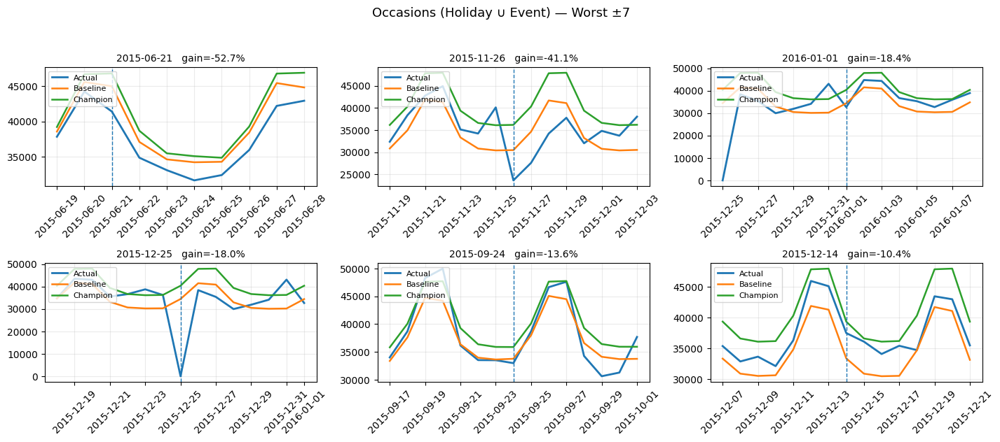

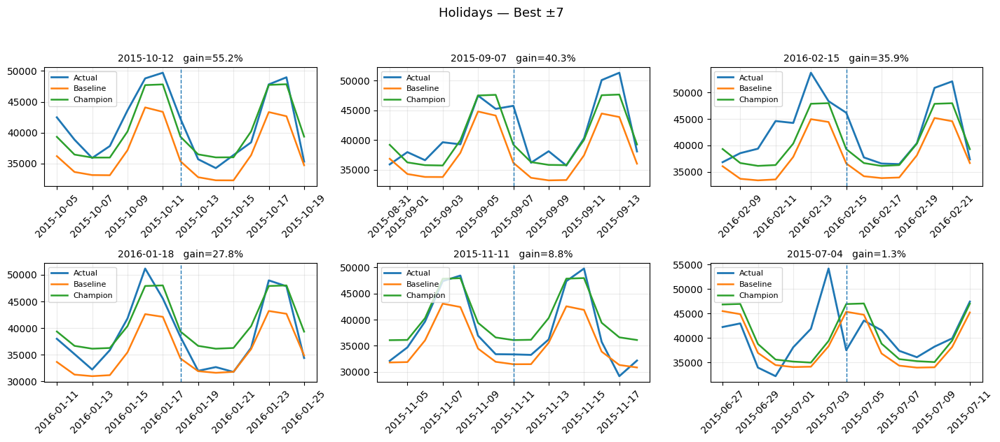

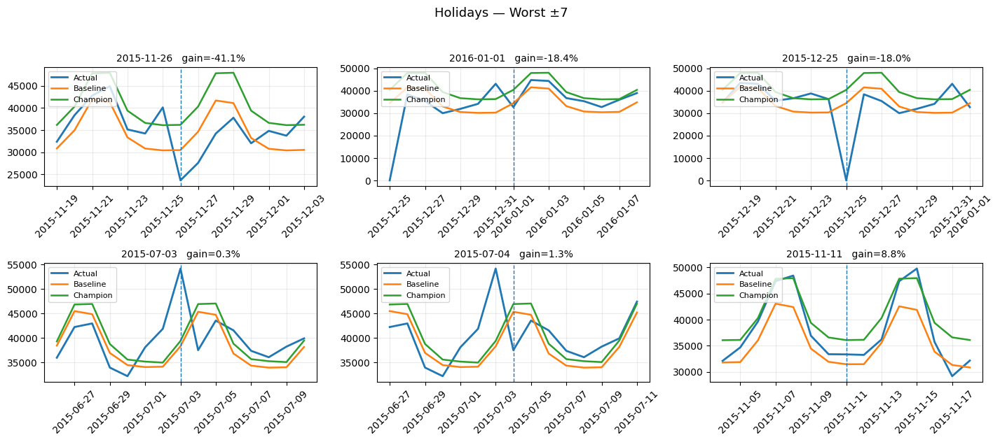

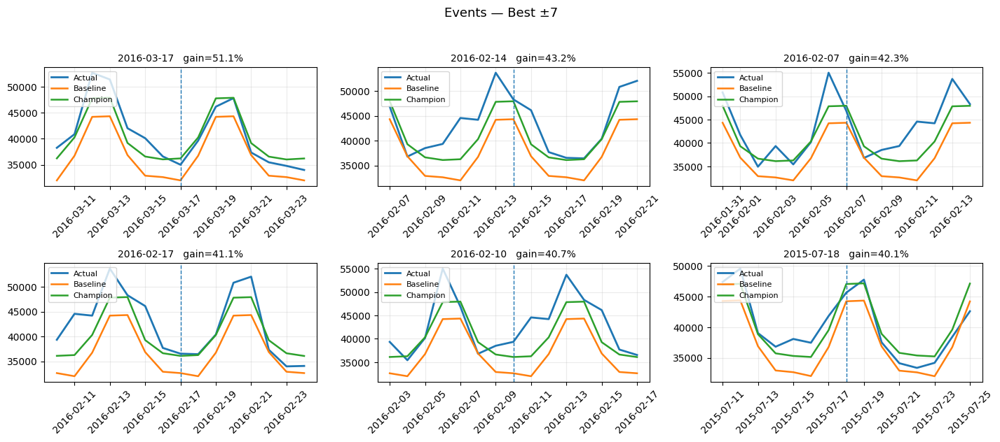

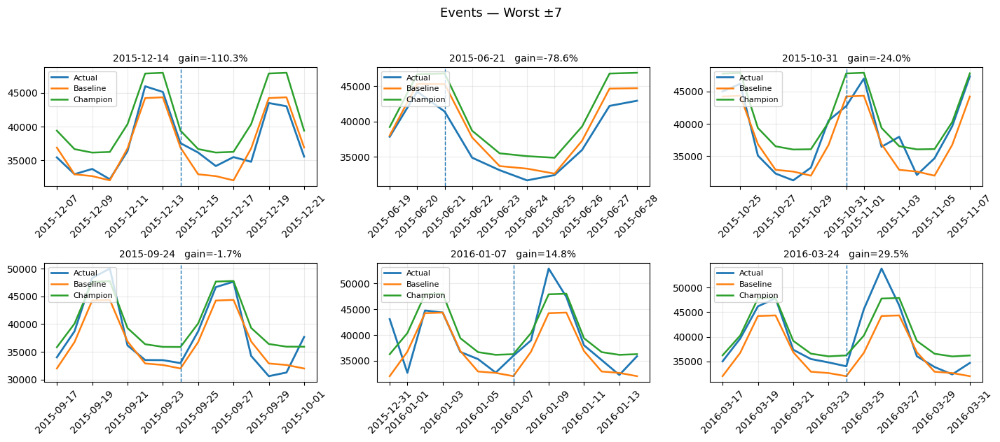


=== Rendering boxplots ===


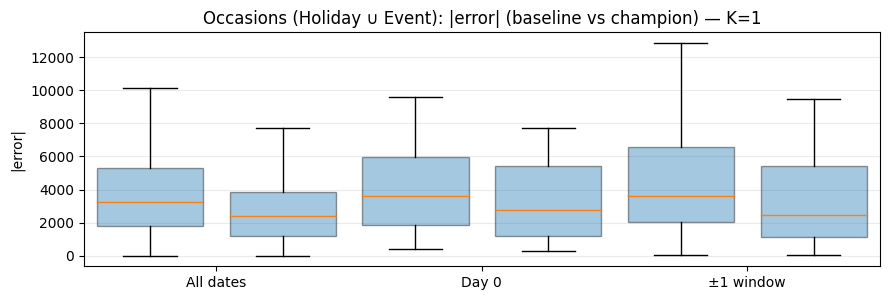

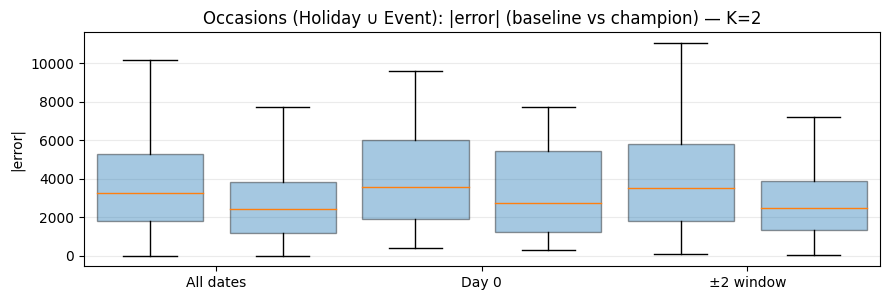

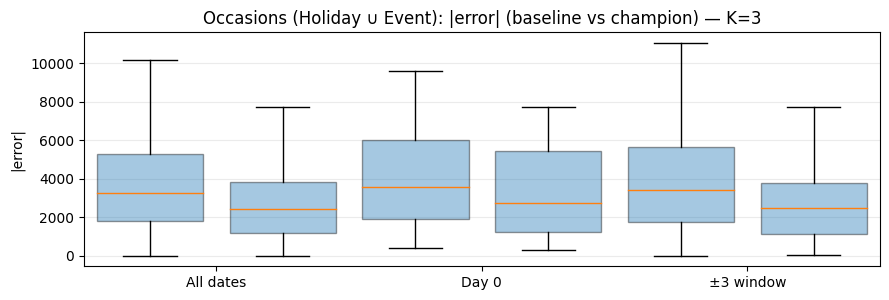

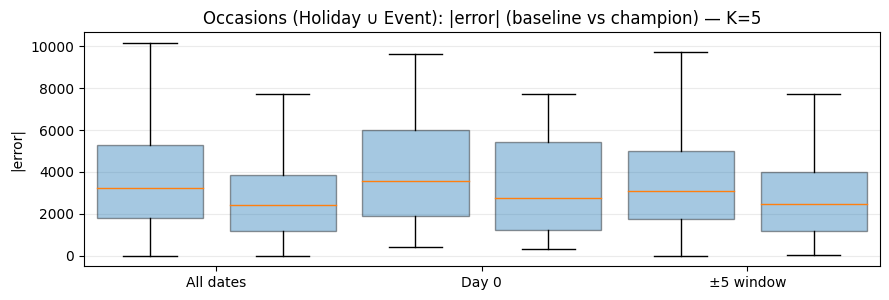

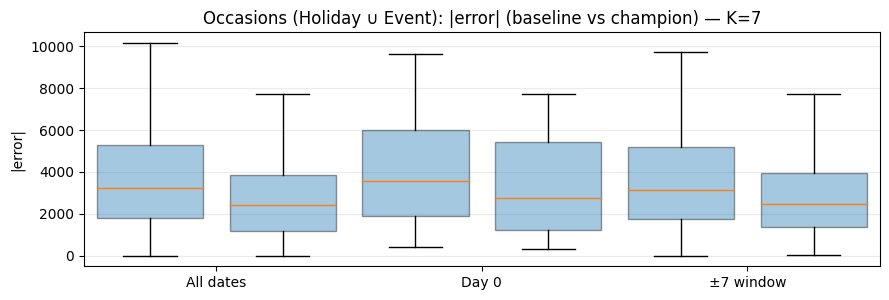

...

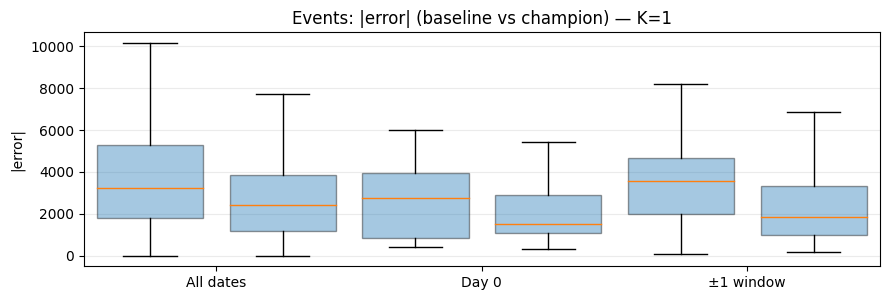

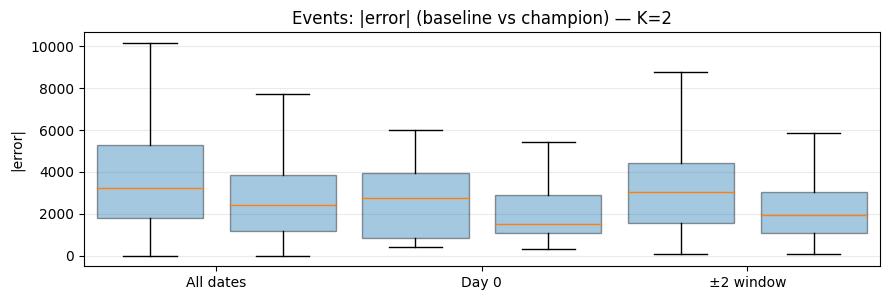

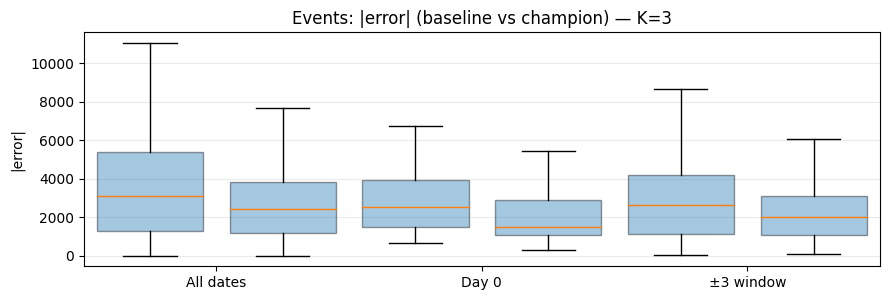

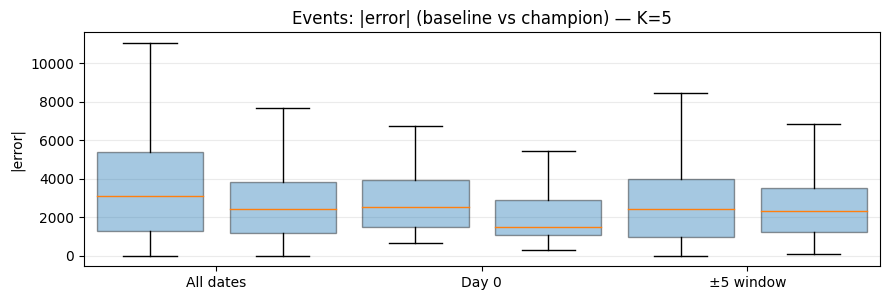

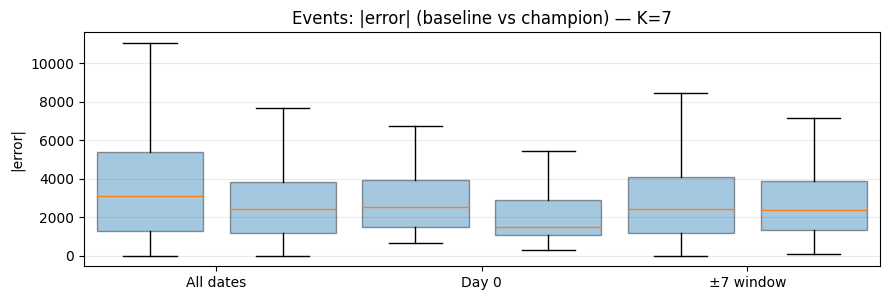


Best hyperparameters discovered (EXP):


,value
SARIMA → baseline_K1 → order,"(1, 0, 1)"
SARIMA → baseline_K1 → seasonal_order,"(0, 1, 1, 7)"
SARIMA → baseline_TRV_K1 → order,"(1, 0, 1)"
SARIMA → baseline_TRV_K1 → seasonal_order,"(0, 1, 1, 7)"
SARIMA → baseline_K2 → order,"(1, 0, 1)"
...,...
SARIMAX_FE → trapezoid_TRV_K7 → seasonal_order,"(1, 0, 1, 7)"
TBATS → VAL → seasonal_periods,"[7, 365.25]"
TBATS → VAL → AIC,28704.792903
TBATS → TEST → seasonal_periods,"[7, 365.25]"



Retail INSIGHT complete (ALL-K where available).


In [17]:
# ============================================================
# RETAIL — INSIGHT (tourism-style, chronological) — ALL-K READY
# Change: force K_LIST = [1,2,3,5,7] and only use Ks that exist in ARTIFACTS
# (so it works whether your experiment actually produced some/all K results).
# ============================================================
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.metrics import r2_score
plt.close('all')

# ------------------- CONFIG -------------------
BOXPLOTS_MODE = "all_k"     # "all_k" or "best_k"
TOP_N_PANELS  = 6
# ----------------------------------------------

# ---------- guards ----------
need = ["DF","train","val","test","ARTIFACTS","TARGET"]
for v in need:
    assert v in globals(), f"{v} missing — run PRE & EXPERIMENT first."
DF, train, val, test = globals()["DF"], globals()["train"], globals()["val"], globals()["test"]
ARTIFACTS  = globals()["ARTIFACTS"]
TARGET     = str(globals()["TARGET"])
BEST_PARAMS= globals().get("BEST_PARAMS", {})

# ---------- K LIST (UPDATED) ----------
K_LIST = [1, 2, 3, 5, 7]

# Only keep Ks that actually exist in ARTIFACTS (prevents NAN/empty leaderboards)
K_PRESENT = sorted([k for k in ARTIFACTS.keys() if isinstance(k, int)])
K_LIST    = [k for k in K_LIST if k in K_PRESENT] if K_PRESENT else K_LIST
globals()["K_LIST"] = K_LIST  # keep consistent for downstream cells
print(f"Using K_LIST={K_LIST} (present in ARTIFACTS={K_PRESENT})")

# ---------- helpers ----------
def _align(y, yhat):
    ys = pd.Series(y).astype(float)
    yh = pd.Series(yhat).astype(float).reindex(ys.index)
    m = ys.notna() & yh.notna()
    return ys[m], yh[m]

def _rmse(y, yhat):
    ys, yh = _align(y, yhat)
    if len(ys) == 0: return np.nan
    return float(np.sqrt(np.mean((ys - yh) ** 2)))

def _r2(y, yhat):
    ys, yh = _align(y, yhat)
    if len(ys) < 2: return np.nan
    return float(r2_score(ys, yh))

def _seg_masks(idx, centers, k):
    m0 = idx.isin(centers)
    if len(centers)==0:
        mK = pd.Series(False, index=idx); mN = ~mK
    else:
        mK = pd.Series(False, index=idx)
        for h in pd.DatetimeIndex(centers):
            mK |= (idx >= h - pd.Timedelta(days=k)) & (idx <= h + pd.Timedelta(days=k))
        mN = ~mK
    return m0, mK, mN

def _present_models(df):
    num_cols = [c for c in df.columns if np.issubdtype(df[c].dtype, np.number)]
    banned = {TARGET,"is_holiday","is_event","is_occasion"}
    banned |= {c for c in num_cols if str(c).startswith(("b_","cap_")) or str(c).endswith(("_ds","_trend"))}
    known = [
        # baselines
        "SARIMA_baseline","SARIMA_hol_flag","Prophet_linear_baseline","Prophet_logistic_baseline","TBATS_baseline",
        # FE (SARIMA)
        "SARIMA_median_stl","SARIMA_gaussian_stl","SARIMA_trapezoid_stl",
        "SARIMA_onehot_stl","SARIMA_days_interaction_stl",
        # FE (Prophet linear)
        "Prophet_lin_median_stl","Prophet_lin_gaussian_stl","Prophet_lin_trapezoid_stl",
        "Prophet_lin_onehot_stl","Prophet_lin_days_interaction_stl",
        # FE (Prophet logistic)
        "Prophet_logistic_median_stl","Prophet_logistic_gaussian_stl","Prophet_logistic_trapezoid_stl",
        "Prophet_logistic_onehot_stl","Prophet_logistic_days_interaction_stl"
    ]
    present = [c for c in known if c in df.columns and c not in banned]
    return present if present else [c for c in num_cols if c not in banned]

BASELINE_PREF = ["SARIMA_baseline","Prophet_linear_baseline","Prophet_logistic_baseline","TBATS_baseline"]

def _scores_table(df_like, models, centers, k, tag):
    y = df_like[TARGET].astype(float)
    m0,mK,mN = _seg_masks(df_like.index, centers, k)
    rows=[]
    for m in models:
        if m not in df_like: continue
        yp = df_like[m].astype(float)
        rows.append(dict(
            Model=m,
            **{"RMSE (all)":_rmse(y,yp), "R2 (all)":_r2(y,yp)},
            # NOTE: kept internally for analysis/boxplots; you can hide it in tables later
            **({f"RMSE ({tag}0)":_rmse(y[m0],yp[m0]), f"R2 ({tag}0)":_r2(y[m0],yp[m0])} if m0.any()
               else {f"RMSE ({tag}0)":np.nan, f"R2 ({tag}0)":np.nan}),
            **({f"RMSE (±{k}_{tag})":_rmse(y[mK],yp[mK]), f"R2 (±{k}_{tag})":_r2(y[mK],yp[mK])} if mK.any()
               else {f"RMSE (±{k}_{tag})":np.nan, f"R2 (±{k}_{tag})":np.nan}),
            **{f"RMSE (nonwin_{tag})":_rmse(y[mN],yp[mN]), f"R2 (nonwin_{tag})":_r2(y[mN],yp[mN])}
        ))
    return pd.DataFrame(rows)

def _pick_best_baseline(scores_tbl, tag, k):
    if scores_tbl.empty: return None
    cand=[b for b in BASELINE_PREF if b in set(scores_tbl["Model"])]
    win=f"RMSE (±{k}_{tag})"
    if cand:
        sub=scores_tbl.set_index("Model").loc[cand]
        if win in sub and sub[win].notna().any(): return sub[win].astype(float).idxmin()
        return sub["RMSE (all)"].astype(float).idxmin()
    return scores_tbl.sort_values("RMSE (all)").iloc[0]["Model"]

def _pick_best_baseline_all(scores_tbl):
    if scores_tbl.empty: return None
    cand=[b for b in BASELINE_PREF if b in set(scores_tbl["Model"])]
    if cand:
        sub=scores_tbl.set_index("Model").loc[cand]
        return sub["RMSE (all)"].astype(float).idxmin()
    return scores_tbl.sort_values("RMSE (all)").iloc[0]["Model"]

def _build_improvements(scores_tbl, baseline_win_model, tag, k):
    df = scores_tbl.copy()
    idxed = df.set_index("Model")
    win_col = f"RMSE (±{k}_{tag})"
    if (win_col in idxed.columns) and baseline_win_model in idxed.index and pd.notna(idxed.at[baseline_win_model, win_col]):
        ref_win = float(idxed.at[baseline_win_model, win_col])
        df[f"ΔRMSE (±{k})%"] = np.where(df[win_col].notna(), 100.0*(1.0 - (df[win_col]/ref_win)), np.nan)
        imp_win = (df[["Model", win_col, f"ΔRMSE (±{k})%"]]
                   .rename(columns={win_col: f"RMSE(±{k})"})
                   .sort_values(f"ΔRMSE (±{k})%", ascending=False).reset_index(drop=True))
    else:
        imp_win = pd.DataFrame()
    baseline_all = _pick_best_baseline_all(scores_tbl)
    ref_all = float(idxed.at[baseline_all, "RMSE (all)"])
    df["ΔRMSE(all)%"] = 100.0*(1.0 - (df["RMSE (all)"]/ref_all))
    imp_all = (df[["Model","RMSE (all)","R2 (all)","ΔRMSE(all)%"]]
               .sort_values("ΔRMSE(all)%", ascending=False).reset_index(drop=True))
    return imp_win, imp_all, baseline_all

def _per_window(df_like, centers, k, base, champ, name_by_date=None, tag_label="Occasion"):
    rows=[]; idx=df_like.index
    y  = df_like[TARGET].astype(float)
    yb = pd.to_numeric(df_like[base], errors="coerce")
    yc = pd.to_numeric(df_like[champ], errors="coerce")
    for h in pd.DatetimeIndex(centers).intersection(idx):
        m=(idx >= h - pd.Timedelta(days=k)) & (idx <= h + pd.Timedelta(days=k))
        if m.sum()<2: continue
        rm_b=_rmse(y[m],yb[m]); rm_c=_rmse(y[m],yc[m])
        gain=100.0*(1.0 - rm_c/rm_b) if (rm_b and rm_b>0) else np.nan
        nm = name_by_date.get(pd.Timestamp(h.normalize())) if name_by_date is not None else None
        rows.append({"date":h, tag_label:nm, f"RMSE ({base})":rm_b, f"RMSE ({champ})":rm_c, f"ΔRMSE (±{k})%":gain})
    return (pd.DataFrame(rows)
            .assign(date=lambda d: d["date"].dt.date)
            .sort_values(f"ΔRMSE (±{k})%", ascending=False).reset_index(drop=True))

def _error_boxplots(df_like, centers, k, baseline, champion, title):
    if (baseline not in df_like) or (champion not in df_like):
        print("Boxplot skipped — missing model columns.")
        return
    y=df_like[TARGET].astype(float); idx=df_like.index
    m0,mK,_=_seg_masks(idx,centers,k)
    segs=[("All dates", pd.Series(True,index=idx))]
    if m0.any(): segs.append(("Day 0", pd.Series(m0,index=idx)))
    if mK.any(): segs.append((f"±{k} window", pd.Series(mK,index=idx)))
    yb=df_like[baseline].astype(float); yc=df_like[champion].astype(float)
    data_b=[(y-yb).abs()[m].dropna().values for _,m in segs]
    data_c=[(y-yc).abs()[m].dropna().values for _,m in segs]
    fig,ax=plt.subplots(figsize=(9,3.1))
    pos_b=np.arange(1,2*len(segs)+1,2); pos_c=pos_b+1
    bp_b=ax.boxplot(data_b,positions=pos_b,widths=0.8,patch_artist=True,showfliers=False)
    bp_c=ax.boxplot(data_c,positions=pos_c,widths=0.8,patch_artist=True,showfliers=False)
    for p in bp_b['boxes']: p.set_alpha(0.40)
    for p in bp_c['boxes']: p.set_alpha(0.40)
    ax.set_xticks((pos_b+pos_c)/2); ax.set_xticklabels([s for s,_ in segs])
    ax.set_ylabel("|error|"); ax.set_title(title); ax.grid(alpha=.25,axis='y')
    plt.tight_layout(); plt.show()

# ---------- context banner ----------
cnt_hol = int(DF.get("is_holiday", pd.Series(0, index=DF.index)).sum())
cnt_evt = int(DF.get("is_event",   pd.Series(0, index=DF.index)).sum())
print("="*72)
print(f" Context: RETAIL (M5-style)  |  Holidays flagged: {cnt_hol}  |  Events flagged: {cnt_evt}")
print(f" TARGET: {TARGET}")
print("="*72)

# ---------- centers & names ----------
name_by_date = ARTIFACTS.get("name_by_date", {})
name_by_date = {pd.Timestamp(k).normalize(): v for k, v in name_by_date.items()}

# Build centers (TEST)
idx_test    = test.index
centers_occ = pd.DatetimeIndex(ARTIFACTS.get("centers_all", [])).intersection(idx_test)
centers_hol = pd.DatetimeIndex(DF.index[DF.get("is_holiday",0)==1]).intersection(idx_test)
centers_evt = pd.DatetimeIndex(DF.index[(DF.get("is_event",0)==1) & (DF.get("is_holiday",0)==0)]).intersection(idx_test)

# ---------- choose K* (Occasions) using existing TOP_GAINS if present ----------
TOP_GAINS_BY_K = globals().get("TOP_GAINS_BY_K", {})
TOP_GAINS_ALLK = globals().get("TOP_GAINS_ALLK", pd.DataFrame())

def _merge_top_gains_by_k_dict(dct, K_LIST):
    frames=[]
    for K, dfk in dct.items():
        if int(K) not in K_LIST or dfk is None or len(dfk)==0: continue
        tmp=dfk.copy()
        if "Date" in tmp.columns:
            pass
        elif "date" in tmp.columns:
            tmp = tmp.rename(columns={"date":"Date"})
        else:
            continue
        if "Occasion" not in tmp.columns:
            tmp.insert(1,"Occasion",[name_by_date.get(pd.Timestamp(d).normalize()) if pd.notna(d) else None
                                     for d in pd.to_datetime(tmp["Date"])])
        gcol=f"Gain(±{int(K)})%"
        if gcol not in tmp.columns:
            cand=[c for c in tmp.columns if "Gain(" in c]
            if cand: tmp=tmp.rename(columns={cand[0]:gcol})
        frames.append(tmp[["Date","Occasion",gcol]])
    if not frames: return pd.DataFrame()
    out=frames[0]
    for fr in frames[1:]:
        out=out.merge(fr,on=["Date","Occasion"],how="outer")
    return out.sort_values("Date").reset_index(drop=True)

TOP_GAINS_WIDE = _merge_top_gains_by_k_dict(TOP_GAINS_BY_K, K_LIST)

def _avg_by_k(wide):
    if wide is None or len(wide)==0: return pd.DataFrame()
    long=wide.melt(id_vars=["Date","Occasion"],
                   value_vars=[c for c in wide.columns if c.startswith("Gain(±")],
                   var_name="Kc", value_name="Gain").dropna()
    long["K"]=long["Kc"].str.extract(r"±(\d+)", expand=False).astype(int)
    return (long.groupby("K",as_index=False)["Gain"].mean().sort_values("K"))

avgK = _avg_by_k(TOP_GAINS_WIDE)
Kstar = int(avgK.sort_values("Gain",ascending=False).iloc[0]["K"]) if (avgK is not None and len(avgK)) else (K_LIST[0] if K_LIST else 3)
print(f"Selected K* (Occasions): {Kstar}")

# ---------- run leaderboards & per-window tables ----------
def run_insight_for(tag, centers, pretty):
    MODELS = _present_models(test)
    if len(centers)==0:
        print(f"\n=== {pretty.upper()} — No centers to analyze ===")
        return
    print(f"\n=== {pretty.upper()} — K in {K_LIST} | centers in TEST: {len(pd.DatetimeIndex(centers).intersection(test.index))} ===")
    for K in K_LIST:
        scores = _scores_table(test, MODELS, centers, K, tag)
        if scores.empty:
            print(f"(K={K}) No model predictions found.")
            continue
        baseline = _pick_best_baseline(scores, tag, K)
        champion = scores.sort_values("RMSE (all)").iloc[0]["Model"]

        show_cols = [c for c in ["Model","RMSE (all)",f"RMSE (±{K}_{tag})","R2 (all)",f"R2 (±{K}_{tag})"] if c in scores.columns]
        print(f"\nLeaderboard — K={K} | baseline(±K)={baseline} | champion={champion}")
        try:
            display(scores[show_cols].sort_values("RMSE (all)").reset_index(drop=True))
        except:
            print(scores[show_cols].sort_values("RMSE (all)").to_string(index=False))

        imp_win, imp_all, base_all = _build_improvements(scores, baseline, tag, K)
        print(f"\nΔRMSE(±{K}) — vs best window baseline ({baseline})")
        try:
            display(imp_win if not imp_win.empty else pd.DataFrame({"note":[f"No strict ±{K} window metric available."]}))
        except:
            print((imp_win if not imp_win.empty else pd.DataFrame({"note":[f"No strict ±{K} window metric available."]})).to_string(index=False))

        print(f"\nΔRMSE(all) — vs best ALL baseline ({base_all})")
        try:
            display(imp_all)
        except:
            print(imp_all.to_string(index=False))

        comp = _per_window(test, centers, K, baseline, champion, name_by_date, tag_label="Occasion")
        if not comp.empty:
            pos = comp[comp[f"ΔRMSE (±{K})%"] > 0].sort_values(f"ΔRMSE (±{K})%", ascending=False)
            tough = comp[comp[f"ΔRMSE (±{K})%"] <= 0].sort_values(f"ΔRMSE (±{K})%")
            print(f"\nPer-window — top gains (±{K}):")
            try: display(pos.head(10))
            except: print(pos.head(10).to_string(index=False))
            if not tough.empty:
                print("\nPer-window — toughest windows:")
                try: display(tough.head(10))
                except: print(tough.head(10).to_string(index=False))

        if tag=="occ" and K == Kstar:
            _error_boxplots(test, centers, Kstar, baseline, champion,
                            title=f"Occasions: |error| (baseline vs champion) — K*={Kstar}")

run_insight_for("occ", centers_occ, "Occasions (Holiday ∪ Event)")
run_insight_for("hol", centers_hol, "Holidays")
run_insight_for("ev",  centers_evt, "Events")

# ---------- BEST/WORST window panels for EVERY K & domain ----------
def _choose_baseline_champion(models, centers, K, tag="occ"):
    scores = _scores_table(test, models, centers, K, tag)
    if scores.empty: return None, None, scores
    base = _pick_best_baseline(scores, tag, K)
    champ= scores.sort_values("RMSE (all)").iloc[0]["Model"]
    return base, champ, scores

def _rank_windows(test_df, centers, k, target, baseline, champion):
    rows=[]; idx=test_df.index
    for c in pd.DatetimeIndex(centers).intersection(idx):
        m=(idx >= c - pd.Timedelta(days=k)) & (idx <= c + pd.Timedelta(days=k))
        if m.sum()<3: continue
        y  = test_df.loc[m, target]
        yb = test_df.loc[m, baseline] if baseline in test_df else np.nan
        yc = test_df.loc[m, champion] if champion in test_df else np.nan
        rm_b=_rmse(y,yb); rm_c=_rmse(y,yc)
        if rm_b and rm_b>0 and np.isfinite(rm_c):
            rows.append({"Date": c.normalize(), "Gain": 100*(1 - rm_c/rm_b)})
    return pd.DataFrame(rows)

def _plot_grid(test_df, rows_df, k, target, base, champ, title, top=True, top_n=TOP_N_PANELS):
    if rows_df is None or rows_df.empty:
        print(f"[{title}] No rows to plot."); return
    dfp=(rows_df.sort_values("Gain", ascending=not top).head(top_n)).copy()
    n=len(dfp); cols=3; rws=int(np.ceil(n/cols))
    fig,axes=plt.subplots(rws, cols, figsize=(4.8*cols, 3.2*rws), squeeze=False); axes=axes.ravel()
    for ax, (_, r) in zip(axes, dfp.iterrows()):
        d=pd.Timestamp(r["Date"]).normalize()
        m=(test_df.index >= d - pd.Timedelta(days=k)) & (test_df.index <= d + pd.Timedelta(days=k))
        if not all(c in test_df.columns for c in [base, champ]):
            ax.set_title(f"{d.date()} — missing cols"); ax.axis("off"); continue
        seg=test_df.loc[m, [TARGET, base, champ]].astype(float)
        if seg.empty: ax.set_title(f"{d.date()} — no data"); ax.axis("off"); continue
        ax.plot(seg.index, seg[TARGET], label="Actual",   lw=2)
        ax.plot(seg.index, seg[base],   label="Baseline", lw=1.8)
        ax.plot(seg.index, seg[champ],  label="Champion", lw=1.8)
        ax.axvline(d, ls="--", lw=1)
        ax.legend(loc="upper left", fontsize=8, frameon=True)
        ax.set_title(f"{d.date()}   gain={r['Gain']:.1f}%", fontsize=10)
        ax.tick_params(axis="x", rotation=45); ax.grid(alpha=0.25)
    for j in range(n, len(axes)): axes[j].axis("off")
    fig.suptitle(title, fontsize=13); plt.tight_layout(rect=[0,0,1,0.95]); plt.show()

MODELS = _present_models(test)

for K in K_LIST:
    print(f"\n=== Best/Worst panels for ALL domains — K={K} ===")
    for tag, pretty, centers in [
        ("occ","Occasions (Holiday ∪ Event)", centers_occ),
        ("hol","Holidays", centers_hol),
        ("ev", "Events",   centers_evt),
    ]:
        if len(centers)==0:
            print(f"[{pretty}] No centers in TEST."); continue
        base, champ, scores = _choose_baseline_champion(MODELS, centers, K, tag)
        if base is None or champ is None:
            print(f"[{pretty}] No models for K={K}."); continue
        gains = _rank_windows(test, centers, K, TARGET, base, champ)
        if gains.empty:
            print(f"[{pretty}] No valid windows for K={K}."); continue
        _plot_grid(test, gains, K, TARGET, base, champ, f"{pretty} — Best ±{K}",  top=True)
        _plot_grid(test, gains, K, TARGET, base, champ, f"{pretty} — Worst ±{K}", top=False)

# ---------- BOX PLOTS ----------
def _boxplots_for_domain(pretty, tag, centers, mode):
    if len(centers)==0:
        print(f"[{pretty}] No centers for boxplots."); return
    if mode == "all_k":
        for K in K_LIST:
            base, champ, scores = _choose_baseline_champion(MODELS, centers, K, tag)
            if base and champ:
                _error_boxplots(test, centers, K, base, champ,
                                title=f"{pretty}: |error| (baseline vs champion) — K={K}")
    else:
        best_k, best_gain, best_pair = None, -np.inf, (None,None)
        for K in K_LIST:
            base, champ, scores = _choose_baseline_champion(MODELS, centers, K, tag)
            if base is None or champ is None: continue
            win_col=f"RMSE (±{K}_{tag})"
            try:
                ref = float(scores.set_index("Model").at[base, win_col])
                cur = float(scores.set_index("Model").at[champ, win_col])
                if np.isfinite(ref) and ref>0 and np.isfinite(cur):
                    gain = 100*(1 - cur/ref)
                    if gain > best_gain:
                        best_gain, best_k, best_pair = gain, K, (base, champ)
            except Exception:
                continue
        if best_k is None:
            print(f"[{pretty}] Could not determine best K for boxplot."); return
        base, champ = best_pair
        _error_boxplots(test, centers, best_k, base, champ,
                        title=f"{pretty}: |error| (baseline vs champion) — Best K={best_k} (Δ≈{best_gain:.1f}%)")

print("\n=== Rendering boxplots ===")
_boxplots_for_domain("Occasions (Holiday ∪ Event)", "occ", centers_occ, BOXPLOTS_MODE)
_boxplots_for_domain("Holidays",                    "hol", centers_hol, BOXPLOTS_MODE)
_boxplots_for_domain("Events",                      "ev",  centers_evt, BOXPLOTS_MODE)

# ---------- best hyperparameters ----------
print("\nBest hyperparameters discovered (EXP):")
if isinstance(BEST_PARAMS, dict) and BEST_PARAMS:
    try:
        display(pd.json_normalize(BEST_PARAMS, sep=" → ").T.rename(columns={0:"value"}))
    except Exception:
        import pprint; pprint.pprint(BEST_PARAMS)
else:
    print("  [No BEST_PARAMS captured]")

print("\nRetail INSIGHT complete (ALL-K where available).")



=== Line plots for K = 1 (Best / Median / Worst) ===


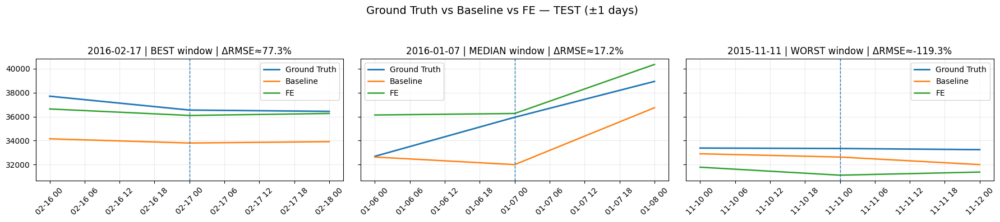


=== Line plots for K = 2 (Best / Median / Worst) ===


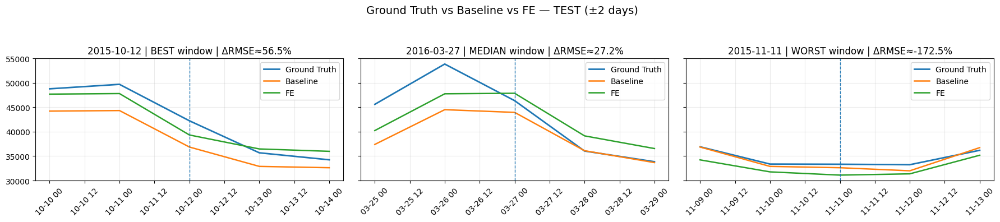


=== Line plots for K = 3 (Best / Median / Worst) ===


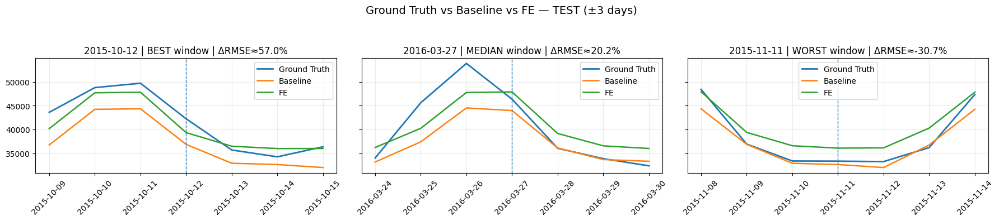


=== Line plots for K = 5 (Best / Median / Worst) ===


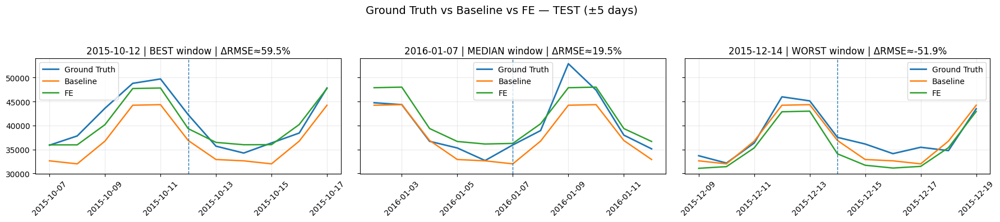


=== Line plots for K = 7 (Best / Median / Worst) ===


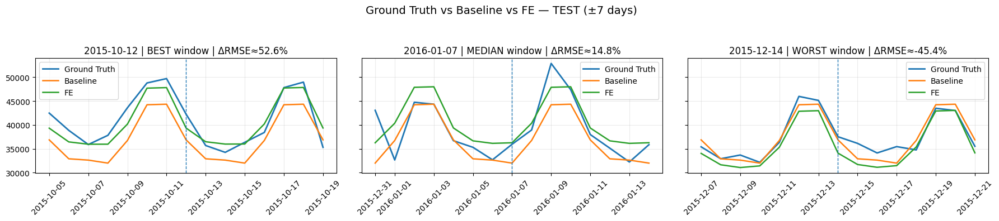

In [20]:
# ============================================================
# FEEDBACK ADD-ON: 3 line plots PER K (Best / Median / Worst)
# Ground Truth vs Baseline vs FE on TEST windows
# ============================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- guards ----------
need = ["test", "ARTIFACTS", "TARGET", "K_LIST"]
for v in need:
    assert v in globals(), f"{v} missing — run INSIGHT cell first."

test      = globals()["test"]
ARTIFACTS = globals()["ARTIFACTS"]
TARGET    = str(globals()["TARGET"])
K_LIST    = globals()["K_LIST"]

# ---------- helpers ----------
def _align(y, yhat):
    ys = pd.Series(y).astype(float)
    yh = pd.Series(yhat).astype(float).reindex(ys.index)
    m = ys.notna() & yh.notna()
    return ys[m], yh[m]

def _rmse(y, yhat):
    ys, yh = _align(y, yhat)
    if len(ys) == 0: return np.nan
    return float(np.sqrt(np.mean((ys - yh) ** 2)))

def _seg_mask(idx, center, k):
    c = pd.Timestamp(center).normalize()
    return (idx >= c - pd.Timedelta(days=k)) & (idx <= c + pd.Timedelta(days=k))

BASELINE_PREF = [
    "SARIMA_baseline",
    "Prophet_linear_baseline",
    "Prophet_logistic_baseline",
    "TBATS_baseline",
]

def _present_models(df):
    num_cols = [c for c in df.columns if np.issubdtype(df[c].dtype, np.number)]
    banned = {TARGET, "is_holiday", "is_event", "is_occasion"}
    banned |= {c for c in num_cols if str(c).startswith(("b_","cap_")) or str(c).endswith(("_ds","_trend"))}
    return [c for c in num_cols if c not in banned]

def _is_baseline(col):
    return col in BASELINE_PREF or col == "SARIMA_hol_flag"

def _best_baseline_and_fe(df, mask):
    models = _present_models(df)
    y = df.loc[mask, TARGET]

    baselines = [m for m in models if _is_baseline(m)]
    fe_models = [m for m in models if not _is_baseline(m)]

    if not baselines or not fe_models:
        return None, None, np.nan

    # best baseline
    b_rmse = {b: _rmse(y, df.loc[mask, b]) for b in baselines}
    b_best = min(b_rmse, key=b_rmse.get)

    # best FE
    f_rmse = {f: _rmse(y, df.loc[mask, f]) for f in fe_models}
    f_best = min(f_rmse, key=f_rmse.get)

    gain = 100 * (1 - f_rmse[f_best] / b_rmse[b_best]) if b_rmse[b_best] > 0 else np.nan
    return b_best, f_best, gain

def _rank_windows(df, centers, k):
    rows = []
    idx = df.index
    for c in pd.DatetimeIndex(centers).intersection(idx):
        m = _seg_mask(idx, c, k)
        if m.sum() < 3:
            continue
        base, fe, gain = _best_baseline_and_fe(df, m)
        if base is None:
            continue
        rows.append({"center": pd.Timestamp(c).normalize(), "gain": gain})
    return pd.DataFrame(rows).sort_values("gain", ascending=False).reset_index(drop=True)

def _plot_window(df, center, k, title_suffix):
    m = _seg_mask(df.index, center, k)
    seg = df.loc[m]
    base, fe, gain = _best_baseline_and_fe(df, m)

    plt.plot(seg.index, seg[TARGET], label="Ground Truth", lw=2)
    plt.plot(seg.index, seg[base],   label=f"Baseline", lw=1.8)
    plt.plot(seg.index, seg[fe],     label=f"FE", lw=1.8)
    plt.axvline(center, ls="--", lw=1)

    plt.title(f"{center.date()} | {title_suffix} | ΔRMSE≈{gain:.1f}%")
    plt.xticks(rotation=45)
    plt.grid(alpha=0.25)
    plt.legend(frameon=True)

# ---------- centers (Occasions = Holiday ∪ Event) ----------
centers_occ = pd.DatetimeIndex(ARTIFACTS.get("centers_all", [])).intersection(test.index)

# ---------- MAIN LOOP ----------
for K in K_LIST:
    print(f"\n=== Line plots for K = {K} (Best / Median / Worst) ===")

    ranked = _rank_windows(test, centers_occ, K)
    if ranked.empty or len(ranked) < 3:
        print("Not enough valid windows for this K.")
        continue

    best   = ranked.iloc[0]["center"]
    worst  = ranked.iloc[-1]["center"]
    median = ranked.iloc[len(ranked)//2]["center"]

    fig, axes = plt.subplots(1, 3, figsize=(18, 4), sharey=True)

    plt.sca(axes[0])
    _plot_window(test, best, K, "BEST window")

    plt.sca(axes[1])
    _plot_window(test, median, K, "MEDIAN window")

    plt.sca(axes[2])
    _plot_window(test, worst, K, "WORST window")

    fig.suptitle(f"Ground Truth vs Baseline vs FE — TEST (±{K} days)", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()


Selection (per domain, K=5):
  OCC  → baseline: Prophet_linear_baseline | champion: SARIMA_median_stl
  HOL  → baseline: Prophet_linear_baseline | champion: SARIMA_median_stl
  EVT  → baseline: SARIMA_baseline | champion: SARIMA_median_stl


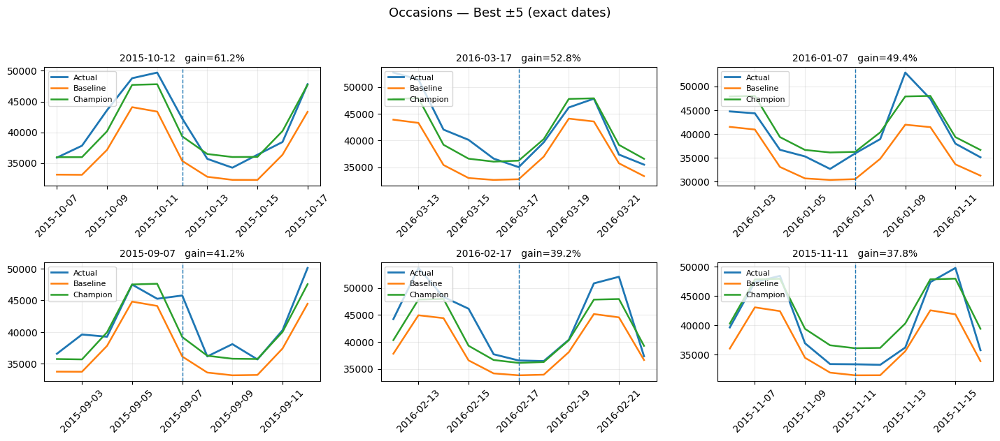

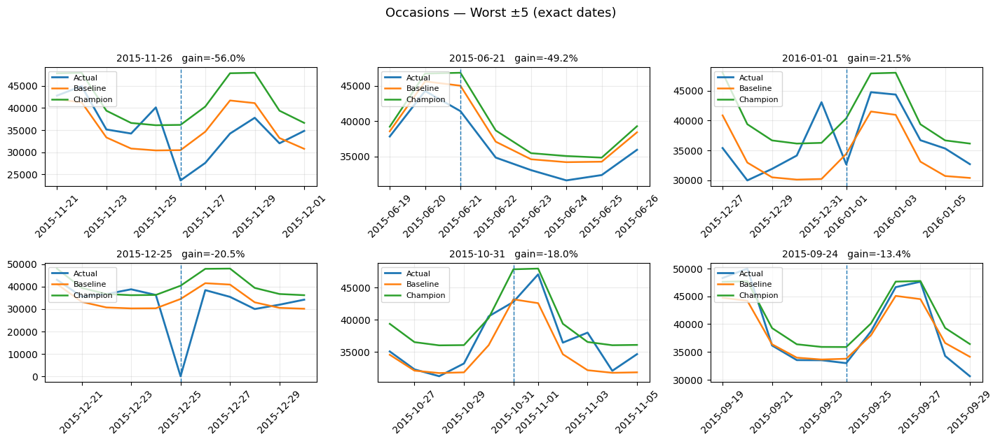

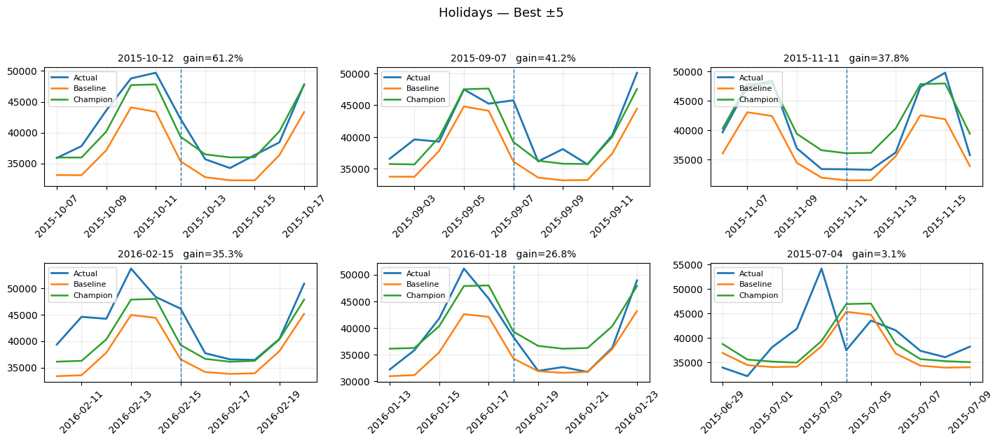

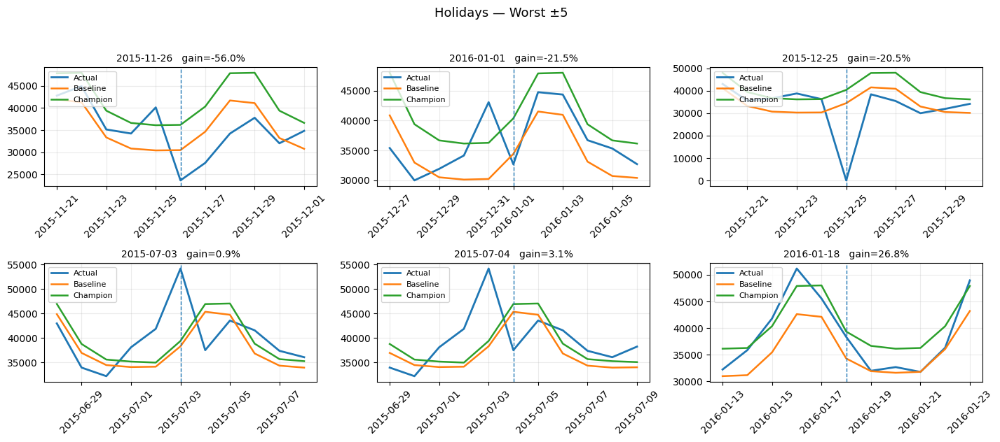

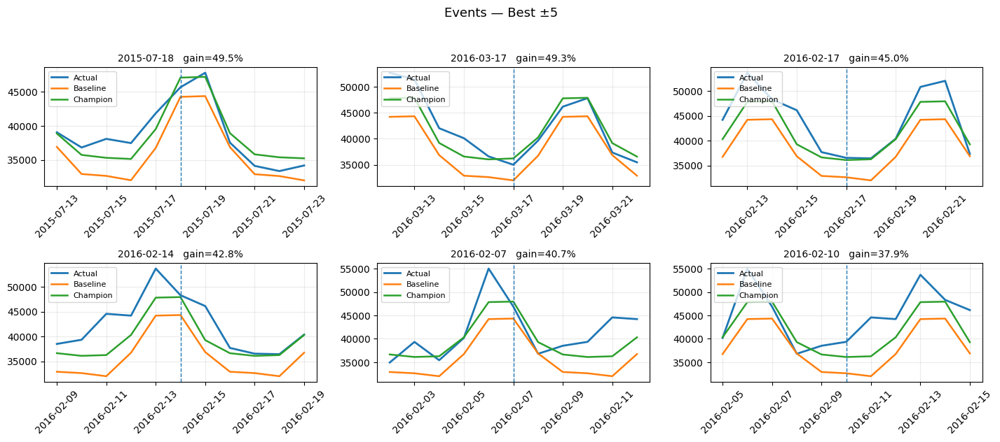

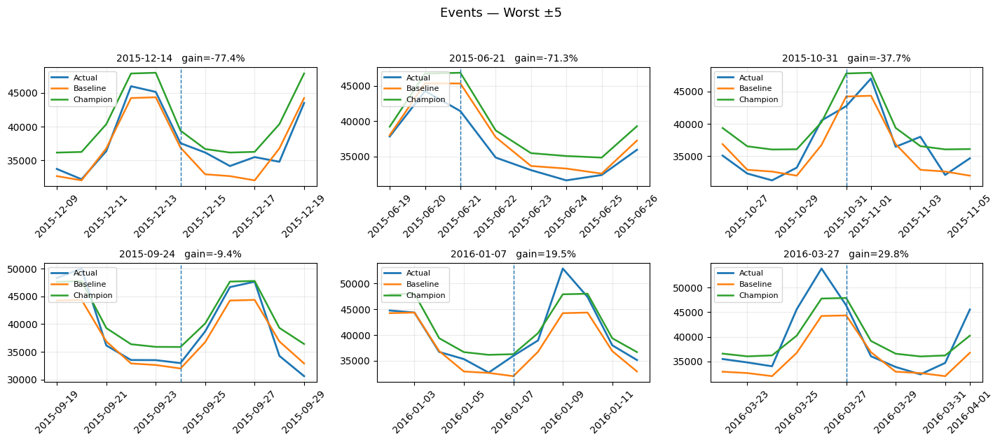

In [15]:
# ===================== 6 PLOTS: Best & Worst ±K for OCC / HOL / EV =====================
# Uses INSIGHT-like logic to choose baseline/champion per domain.
# For OCC (Occasions), if TOP_GAINS_BY_K[K] exists, uses EXACT dates from that table.
# Legends are inside each subplot.
# ========================================================================================

import numpy as np, pandas as pd, matplotlib.pyplot as plt

# -------- config --------
K       = 5           # same K you inspected
TOP_N   = 6           # how many windows per figure
TARGET  = str(globals().get("TARGET","y"))
BASELINE_PREF = ["SARIMA_baseline","Prophet_linear_baseline","Prophet_logistic_baseline","TBATS_baseline"]

# -------- guards --------
assert "DF" in globals() and "test" in globals(), "Run PRE/EXP/INSIGHT first — need DF & test."
DF   = globals()["DF"]
test = globals()["test"]
TGK  = globals().get("TOP_GAINS_BY_K", {}).get(int(K), None)  # occasions table, if present

# -------- helpers --------
def _rmse(y, yhat):
    y, yhat = pd.Series(y).astype(float), pd.Series(yhat).astype(float).reindex_like(pd.Series(y))
    m = y.notna() & yhat.notna()
    if not m.any(): return np.nan
    return float(np.sqrt(np.mean((y[m]-yhat[m])**2)))

def _present_models(df):
    num_cols = [c for c in df.columns if np.issubdtype(df[c].dtype, np.number)]
    banned = {TARGET,"is_holiday","is_event","is_occasion"}
    banned |= {c for c in num_cols if str(c).startswith(("b_","cap_")) or str(c).endswith(("_ds","_trend"))}
    return [c for c in num_cols if c not in banned]

def _scores_table(df_like, models, centers, k, tag):
    y = df_like[TARGET].astype(float)
    # masks
    idx = df_like.index
    m0 = idx.isin(centers)
    mK = pd.Series(False, index=idx)
    for h in pd.DatetimeIndex(centers):
        mK |= (idx >= h - pd.Timedelta(days=k)) & (idx <= h + pd.Timedelta(days=k))
    rows=[]
    for m in models:
        if m not in df_like.columns: continue
        yp = df_like[m].astype(float)
        rows.append(dict(
            Model=m,
            **{"RMSE (all)":_rmse(y,yp)},
            **({f"RMSE (±{k}_occ)":_rmse(y[mK],yp[mK])} if mK.any() else {f"RMSE (±{k}_occ)":np.nan})
        ))
    return pd.DataFrame(rows)

def _pick_best_baseline(scores_tbl, k):
    if scores_tbl.empty: return None
    cand=[b for b in BASELINE_PREF if b in set(scores_tbl["Model"])]
    win=f"RMSE (±{k}_occ)"
    if cand:
        sub=scores_tbl.set_index("Model").loc[cand]
        if win in sub and sub[win].notna().any(): return sub[win].astype(float).idxmin()
        return sub["RMSE (all)"].astype(float).idxmin()
    return scores_tbl.sort_values("RMSE (all)").iloc[0]["Model"]

def _rank_windows_exact_dates(test_df, dates, k, target, base, champ):
    rows=[]
    for d in pd.to_datetime(dates).dt.normalize():
        m=(test_df.index >= d - pd.Timedelta(days=k)) & (test_df.index <= d + pd.Timedelta(days=k))
        if m.sum()<3 or base not in test_df or champ not in test_df: continue
        rm_b=_rmse(test_df.loc[m,target], test_df.loc[m,base])
        rm_c=_rmse(test_df.loc[m,target], test_df.loc[m,champ])
        if rm_b and rm_b>0 and np.isfinite(rm_c):
            rows.append({"Date":d,"Gain":100*(1-rm_c/rm_b)})
    return pd.DataFrame(rows)

def _rank_windows_recompute(test_df, centers, k, target, base, champ):
    rows=[]
    for c in pd.DatetimeIndex(centers).intersection(test_df.index):
        m=(test_df.index >= c - pd.Timedelta(days=k)) & (test_df.index <= c + pd.Timedelta(days=k))
        if m.sum()<3: continue
        rm_b=_rmse(test_df.loc[m,target], test_df.loc[m,base])
        rm_c=_rmse(test_df.loc[m,target], test_df.loc[m,champ])
        if rm_b and rm_b>0 and np.isfinite(rm_c):
            rows.append({"Date":c.normalize(),"Gain":100*(1-rm_c/rm_b)})
    return pd.DataFrame(rows)

def _plot_grid(test_df, rows_df, k, target, base, champ, title, top=True, top_n=TOP_N, save_png=None):
    if rows_df is None or rows_df.empty:
        print(f"[{title}] No rows to plot.")
        return
    dfp = (rows_df.sort_values("Gain", ascending=not top).head(top_n)).copy()
    n=len(dfp); cols=3; rws=int(np.ceil(n/cols))
    fig,axes=plt.subplots(rws, cols, figsize=(4.8*cols, 3.2*rws), squeeze=False); axes=axes.ravel()
    for ax, (_, r) in zip(axes, dfp.iterrows()):
        d = pd.Timestamp(r["Date"]).normalize()
        m=(test_df.index >= d - pd.Timedelta(days=k)) & (test_df.index <= d + pd.Timedelta(days=k))
        seg=test_df.loc[m, [target, base, champ]].astype(float)
        if seg.empty: ax.set_title(f"{d.date()} — no data", fontsize=10); ax.axis("off"); continue
        ax.plot(seg.index, seg[target], label="Actual",   lw=2)
        ax.plot(seg.index, seg[base],   label="Baseline", lw=1.8)
        ax.plot(seg.index, seg[champ],  label="Champion", lw=1.8)
        ax.axvline(d, color="tab:blue", ls="--", lw=1)
        ax.legend(loc="upper left", fontsize=8, frameon=True)  # inside
        ax.set_title(f"{d.date()}   gain={r['Gain']:.1f}%", fontsize=10)
        ax.tick_params(axis="x", rotation=45)
        ax.grid(alpha=0.25)
    for j in range(n, len(axes)): axes[j].axis("off")
    fig.suptitle(title, fontsize=13)
    plt.tight_layout(rect=[0,0,1,0.95])
    if save_png: fig.savefig(save_png, dpi=140)
    plt.show()

# -------- centers for each domain (restricted to TEST) --------
idx_test = test.index
centers_occ = pd.DatetimeIndex(globals().get("ARTIFACTS", {}).get("centers_all", [])).intersection(idx_test)
centers_hol = pd.DatetimeIndex(DF.index[DF.get("is_holiday",0)==1]).intersection(idx_test)
centers_evt = pd.DatetimeIndex(DF.index[(DF.get("is_event",0)==1) & (DF.get("is_holiday",0)==0)]).intersection(idx_test)

# -------- choose baseline & champion per domain (INSIGHT-style) --------
MODELS = _present_models(test)
def _choose_bc(centers):
    scores=_scores_table(test, MODELS, centers, K, tag="occ")
    if scores.empty: return None, None
    base=_pick_best_baseline(scores, K)
    champ=scores.sort_values("RMSE (all)").iloc[0]["Model"]
    return base, champ

base_occ, champ_occ = _choose_bc(centers_occ)
base_hol, champ_hol = _choose_bc(centers_hol)
base_evt, champ_evt = _choose_bc(centers_evt)

print("Selection (per domain, K={}):".format(K))
print("  OCC  → baseline:", base_occ, "| champion:", champ_occ)
print("  HOL  → baseline:", base_hol, "| champion:", champ_hol)
print("  EVT  → baseline:", base_evt, "| champion:", champ_evt)

# -------- build ranked windows for each domain --------
# OCCASIONS: prefer exact dates from TOP_GAINS_BY_K[K] if available
def _gain_col_name(df, K):
    for c in df.columns:
        if "Gain(" in str(c) and f"±{int(K)}" in str(c): return c
    for c in df.columns:
        if str(c).lower().startswith("gain"): return c
    return None

if TGK is not None and len(TGK):
    dfo = TGK.copy()
    if "date" in dfo.columns and "Date" not in dfo.columns: dfo = dfo.rename(columns={"date":"Date"})
    gcol = _gain_col_name(dfo, K)
    dfo = dfo.dropna(subset=["Date", "Baseline", "Champion"])
    dfo["Date"]=pd.to_datetime(dfo["Date"]).dt.normalize()
    # Use the baseline/champion FROM THE TABLE (to match your per-window table)
    occ_best = dfo[["Date", gcol, "Baseline", "Champion"]].rename(columns={gcol:"Gain"}).sort_values("Gain", ascending=False)
    occ_worst= dfo[["Date", gcol, "Baseline", "Champion"]].rename(columns={gcol:"Gain"}).sort_values("Gain", ascending=True)
    # Titles will still use the live-picked base/champ for plotting; if you want strict table cols, use them:
    base_occ_tbl = occ_best.iloc[0]["Baseline"] if len(occ_best) else base_occ
    champ_occ_tbl= occ_best.iloc[0]["Champion"] if len(occ_best) else champ_occ
    base_use_occ, champ_use_occ = base_occ_tbl, champ_occ_tbl
else:
    # If the TOP_GAINS table isn’t there, recompute with chosen base/champ
    gains_occ = _rank_windows_recompute(test, centers_occ, K, TARGET, base_occ, champ_occ)
    occ_best  = gains_occ.sort_values("Gain", ascending=False)
    occ_worst = gains_occ.sort_values("Gain", ascending=True)
    base_use_occ, champ_use_occ = base_occ, champ_occ

# HOLIDAY & EVENT — recompute with their chosen base/champ
gains_hol = _rank_windows_recompute(test, centers_hol, K, TARGET, base_hol, champ_hol)
gains_evt = _rank_windows_recompute(test, centers_evt, K, TARGET, base_evt, champ_evt)
hol_best  = gains_hol.sort_values("Gain", ascending=False)
hol_worst = gains_hol.sort_values("Gain", ascending=True)
evt_best  = gains_evt.sort_values("Gain", ascending=False)
evt_worst = gains_evt.sort_values("Gain", ascending=True)

# -------- make the SIX plots --------
_plot_grid(test, occ_best,  K, TARGET, base_use_occ, champ_use_occ, f"Occasions — Best ±{K} (exact dates)",  top=True)
_plot_grid(test, occ_worst, K, TARGET, base_use_occ, champ_use_occ, f"Occasions — Worst ±{K} (exact dates)", top=False)

_plot_grid(test, hol_best,  K, TARGET, base_hol, champ_hol, "Holidays — Best ±{}".format(K), top=True)
_plot_grid(test, hol_worst, K, TARGET, base_hol, champ_hol, "Holidays — Worst ±{}".format(K), top=False)

_plot_grid(test, evt_best,  K, TARGET, base_evt, champ_evt, "Events — Best ±{}".format(K), top=True)
_plot_grid(test, evt_worst, K, TARGET, base_evt, champ_evt, "Events — Worst ±{}".format(K), top=False)


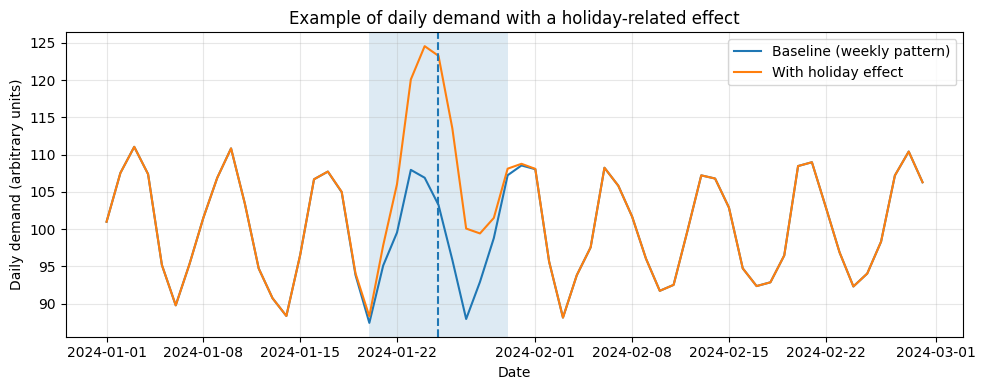

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------------------------------
# 1. Create a fake daily demand series with a weekly pattern
# -------------------------------------------------
np.random.seed(42)

n_days = 60
dates = pd.date_range("2024-01-01", periods=n_days, freq="D")

# base weekly cycle (e.g. higher on weekends)
day_of_week = dates.weekday  # 0=Mon, ..., 6=Sun
weekly_pattern = 100 + 10 * np.sin(2 * np.pi * day_of_week / 7.0)

# small random noise
noise = np.random.normal(0, 2, size=n_days)

base_demand = weekly_pattern + noise

# -------------------------------------------------
# 2. Add a "holiday bump" around a chosen day
# -------------------------------------------------
holiday_center = pd.Timestamp("2024-01-25")
K = 5  # window half-width: ±5 days

# distance from holiday center in days
dist = (dates - holiday_center).days.values

# smooth bump (Gaussian-like)
sigma = 2.0
bump_shape = np.exp(-0.5 * (dist / sigma) ** 2)

# scale of the holiday effect
bump_amplitude = 20
holiday_effect = bump_amplitude * bump_shape

demand_with_holiday = base_demand + holiday_effect

# -------------------------------------------------
# 3. Plot: base vs holiday-affected demand
# -------------------------------------------------
plt.close("all")
fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(dates, base_demand, label="Baseline (weekly pattern)")
ax.plot(dates, demand_with_holiday, label="With holiday effect")

# shade the holiday window ±K days
window_mask = (dates >= holiday_center - pd.Timedelta(days=K)) & \
              (dates <= holiday_center + pd.Timedelta(days=K))
ax.axvspan(dates[window_mask][0],
           dates[window_mask][-1],
           alpha=0.15)

# mark the holiday centre
ax.axvline(holiday_center, linestyle="--")

ax.set_xlabel("Date")
ax.set_ylabel("Daily demand (arbitrary units)")
ax.set_title("Example of daily demand with a holiday-related effect")
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Optionally save for LaTeX
fig.savefig("fig_holiday_effect_example.png", dpi=300)
fig.savefig("fig_holiday_effect_example.pdf")


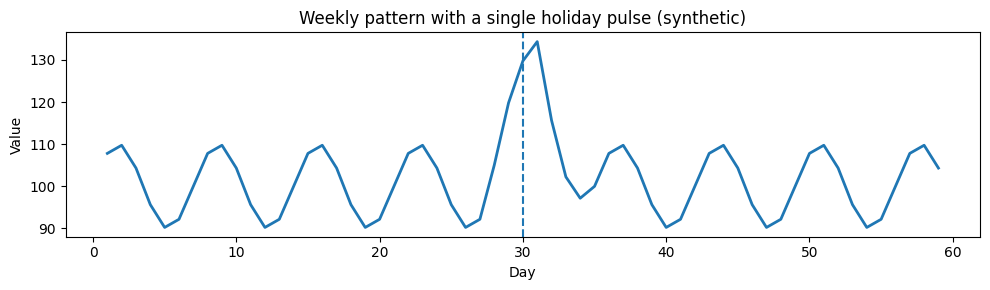

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# synthetic weekly pattern
days = np.arange(1, 60)
weekly = 100 + 10 * np.sin(2 * np.pi * days / 7)

# add one holiday pulse on day 30
holiday_effect = np.zeros_like(days, dtype=float)
holiday_effect[27:34] = [5, 12, 20, 30, 20, 12, 5]  # simple rise-peak-decay

series = weekly + holiday_effect

plt.figure(figsize=(10, 3))
plt.plot(days, series, linewidth=2)
plt.axvline(30, linestyle='--')
plt.title("Weekly pattern with a single holiday pulse (synthetic)")
plt.xlabel("Day")
plt.ylabel("Value")
plt.tight_layout()
plt.show()


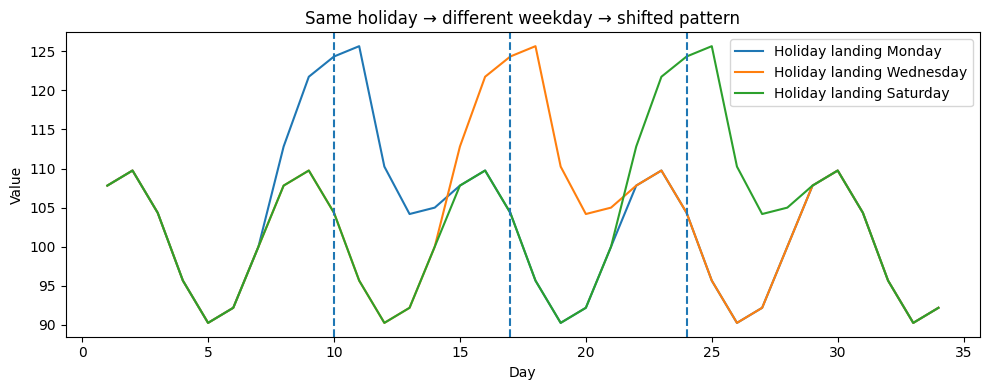

In [2]:
import numpy as np
import matplotlib.pyplot as plt

days = np.arange(1, 35)
baseline = 100 + 10 * np.sin(2 * np.pi * days / 7)

# create 3 holidays with same shape but different weekday positions
def pulse(center):
    effect = np.zeros_like(days, dtype=float)
    idx = center
    effect[idx-3:idx+4] = [5, 12, 20, 30, 20, 12, 5]
    return effect

series1 = baseline + pulse(10)
series2 = baseline + pulse(17)
series3 = baseline + pulse(24)

plt.figure(figsize=(10,4))
plt.plot(days, series1, label="Holiday landing Monday")
plt.plot(days, series2, label="Holiday landing Wednesday")
plt.plot(days, series3, label="Holiday landing Saturday")

plt.axvline(10, linestyle='--')
plt.axvline(17, linestyle='--')
plt.axvline(24, linestyle='--')

plt.legend()
plt.title("Same holiday → different weekday → shifted pattern")
plt.xlabel("Day")
plt.ylabel("Value")
plt.tight_layout()
plt.show()


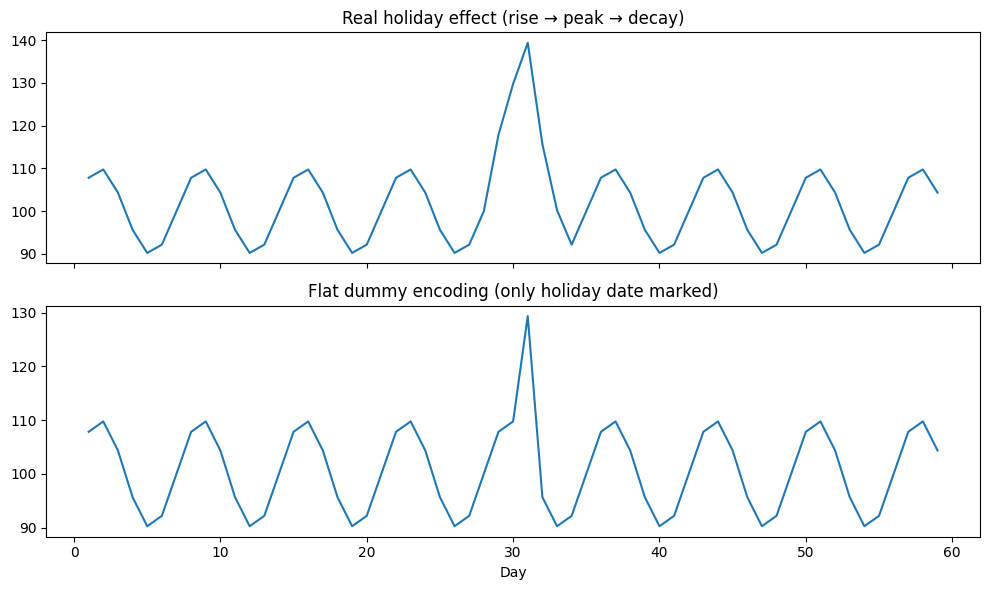

In [3]:
import numpy as np
import matplotlib.pyplot as plt

days = np.arange(1, 60)
baseline = 100 + 10 * np.sin(2 * np.pi * days / 7)

# true holiday pulse
holiday = np.zeros_like(days)
holiday[28:33] = [10, 20, 35, 20, 10]

# flat dummy encoding (what SARIMA/Prophet typically use)
dummy = np.zeros_like(days)
dummy[30] = 25  # only the central day marked

fig, ax = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

ax[0].plot(days, baseline + holiday)
ax[0].set_title("Real holiday effect (rise → peak → decay)")

ax[1].plot(days, baseline + dummy)
ax[1].set_title("Flat dummy encoding (only holiday date marked)")

plt.xlabel("Day")
plt.tight_layout()
plt.show()


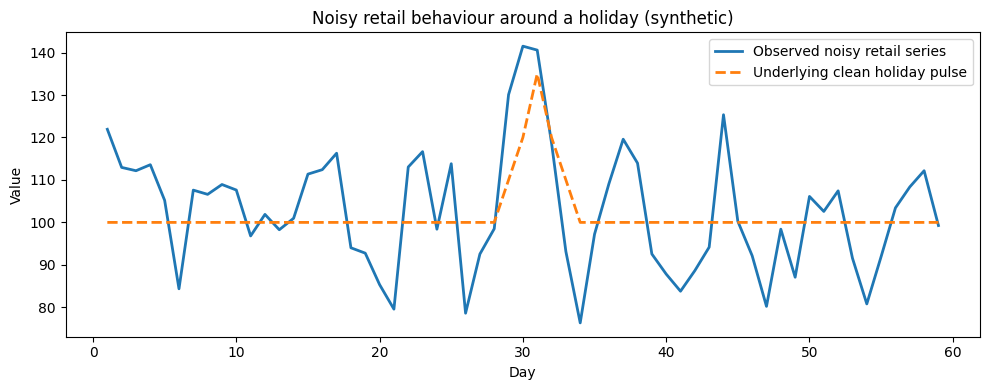

In [4]:
import numpy as np
import matplotlib.pyplot as plt

days = np.arange(1, 60)

# clean ideal pulse
ideal = np.zeros_like(days)
ideal[28:33] = [10, 20, 35, 20, 10]

# noisy retail-like behaviour
np.random.seed(0)
noise = np.random.normal(0, 8, size=len(days))
retail = ideal + noise + 100 + 10*np.sin(2*np.pi*days/7)

plt.figure(figsize=(10,4))
plt.plot(days, retail, linewidth=2, label="Observed noisy retail series")
plt.plot(days, 100 + ideal, linewidth=2, linestyle='--', label="Underlying clean holiday pulse")

plt.legend()
plt.title("Noisy retail behaviour around a holiday (synthetic)")
plt.xlabel("Day")
plt.ylabel("Value")
plt.tight_layout()
plt.show()


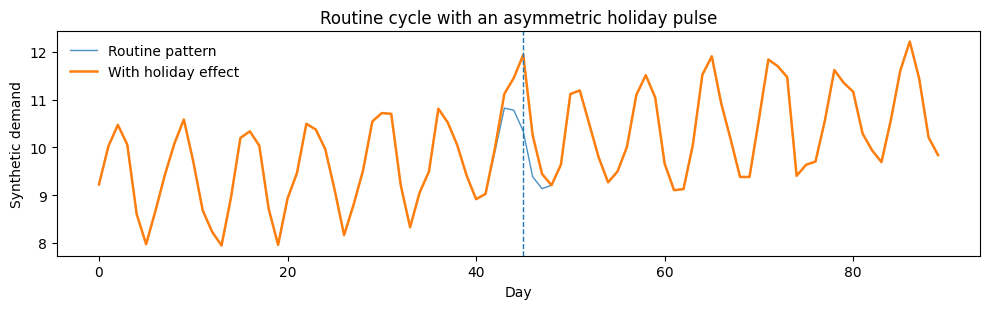

Saved: figures/intro_holiday_pulse.png
Saved: figures/intro_holiday_pulse.pdf

LaTeX snippet:
\begin{figure}[htbp]
  \centering
  \includegraphics[width=\textwidth]{figures/intro_holiday_pulse.pdf}
  \caption{Illustrative daily series: routine pattern (thin) and the same series with an added, asymmetric holiday pulse. The vertical dashed line marks the focal day.}
  \label{fig:intro-example}
\end{figure}



In [1]:
# --- Intro figure: routine cycle + asymmetric holiday pulse (synthetic) ---
import numpy as np, matplotlib.pyplot as plt, os

np.random.seed(42)
n_days = 90
t = np.arange(n_days)

# Routine pattern: slow trend + weekly cycle + mild noise
trend  = 0.02 * (t - n_days/2)
weekly = 1.2  * np.sin(2*np.pi * t / 7.0)
noise  = 0.25 * np.random.randn(n_days)
baseline = 10 + trend + weekly + noise

# Holiday pulse: asymmetric rise–peak–decay around a chosen center day
center = 45   # focal day (change this to move the holiday)
left   = 4    # days of pre-holiday build-up
right  = 3    # days of post-holiday decay

pulse = np.zeros(n_days)

# pre-holiday build-up (quadratic rise)
for d in range(center-left, center):
    if 0 <= d < n_days:
        x = (d - (center-left)) / max(1, left)   # 0..1
        pulse[d] = 1.2 * (x**2)

# peak day
if 0 <= center < n_days:
    pulse[center] = 1.6

# post-holiday decay (faster fall)
for d in range(center+1, center+right+1):
    if 0 <= d < n_days:
        x = (d - center) / max(1, right)         # 0..1
        pulse[d] = 1.6 * (1 - x)**1.5

series = baseline + pulse

# Save locations
out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)
png_path = os.path.join(out_dir, "intro_holiday_pulse.png")
pdf_path = os.path.join(out_dir, "intro_holiday_pulse.pdf")

# Plot (simple, publication-friendly; no custom colors/styles)
plt.figure(figsize=(10, 3.2))
plt.plot(t, baseline, linewidth=1.0, alpha=0.8, label="Routine pattern")
plt.plot(t, series,   linewidth=1.8,              label="With holiday effect")
plt.axvline(center, linestyle="--", linewidth=1.0)
plt.xlabel("Day"); plt.ylabel("Synthetic demand")
plt.title("Routine cycle with an asymmetric holiday pulse")
plt.legend(loc="upper left", frameon=False)
plt.tight_layout()
plt.savefig(png_path, dpi=300)
plt.savefig(pdf_path)
plt.show()

print("Saved:", png_path)
print("Saved:", pdf_path)

print(r"""
LaTeX snippet:
\begin{figure}[htbp]
  \centering
  \includegraphics[width=\textwidth]{figures/intro_holiday_pulse.pdf}
  \caption{Illustrative daily series: routine pattern (thin) and the same series with an added, asymmetric holiday pulse. The vertical dashed line marks the focal day.}
  \label{fig:intro-example}
\end{figure}
""")


In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

series = DF_sorted[TARGET].dropna()

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plot_acf(series, lags=60, ax=plt.gca())
plt.title("ACF of Tourism Daily Arrivals")

plt.subplot(1, 2, 2)
plot_pacf(series, lags=60, ax=plt.gca(), method="ywm")
plt.title("PACF of Tourism Daily Arrivals")

plt.tight_layout()
plt.savefig("acf_pacf_tourism.png", dpi=300)
plt.show()


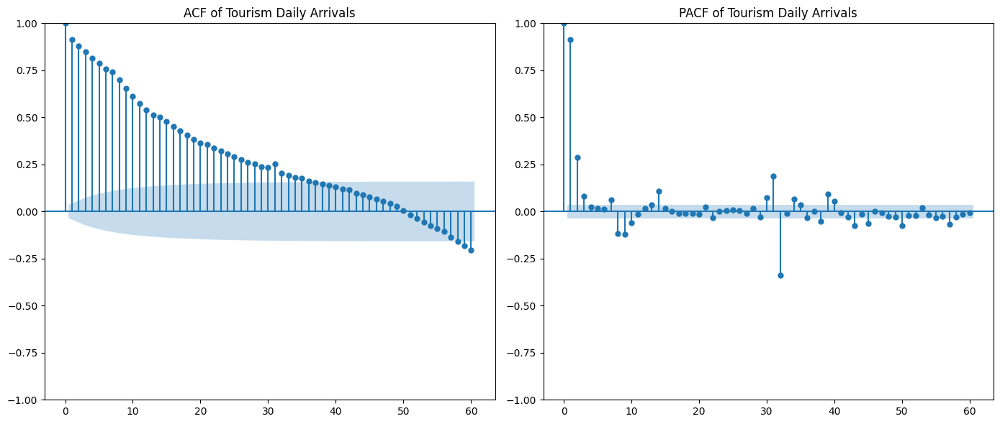

In [13]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

series = DF_sorted[TARGET].dropna()

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plot_acf(series, lags=60, ax=plt.gca())
plt.title("ACF of Tourism Daily Arrivals")

plt.subplot(1, 2, 2)
plot_pacf(series, lags=60, ax=plt.gca(), method="ywm")
plt.title("PACF of Tourism Daily Arrivals")

plt.tight_layout()
plt.savefig("acf_pacf_tourism.png", dpi=300)
plt.show()


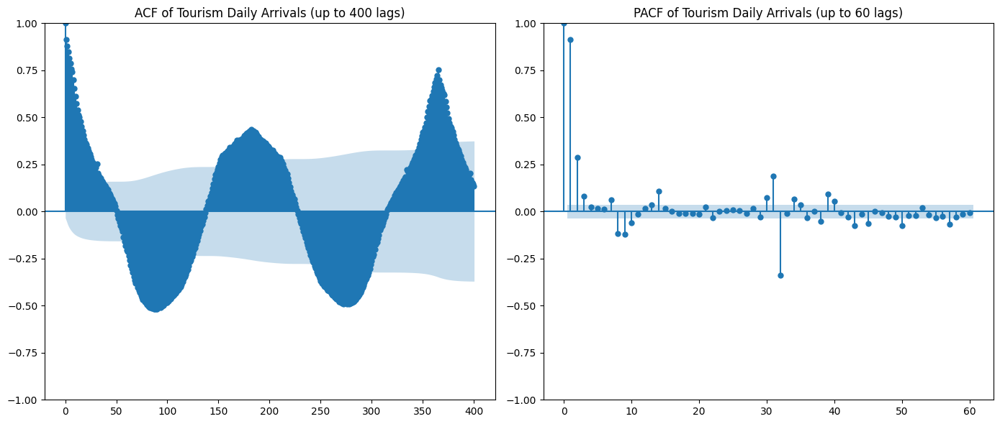

In [21]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

series = DF_sorted[TARGET].dropna()

plt.figure(figsize=(14, 6))

# ---- ACF: long lags (annual) ----
plt.subplot(1, 2, 1)
plot_acf(series, lags=400, ax=plt.gca())
plt.title("ACF of Tourism Daily Arrivals (up to 400 lags)")

# ---- PACF: short lags only ----
plt.subplot(1, 2, 2)
plot_pacf(series, lags=60, ax=plt.gca(), method="ywm")
plt.title("PACF of Tourism Daily Arrivals (up to 60 lags)")

plt.tight_layout()
plt.savefig("acf_pacf_tourism_long.png", dpi=300)
plt.show()


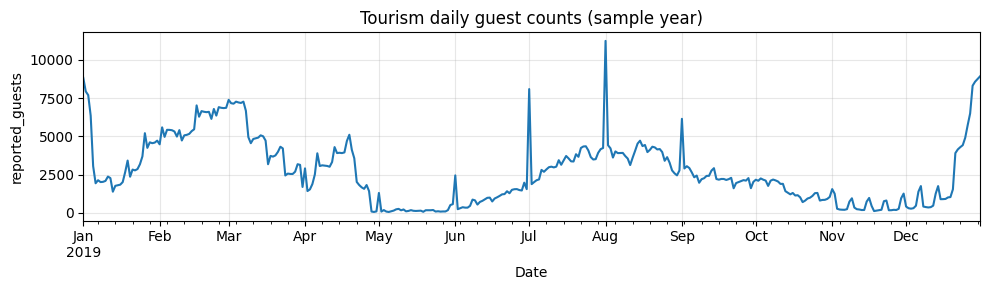

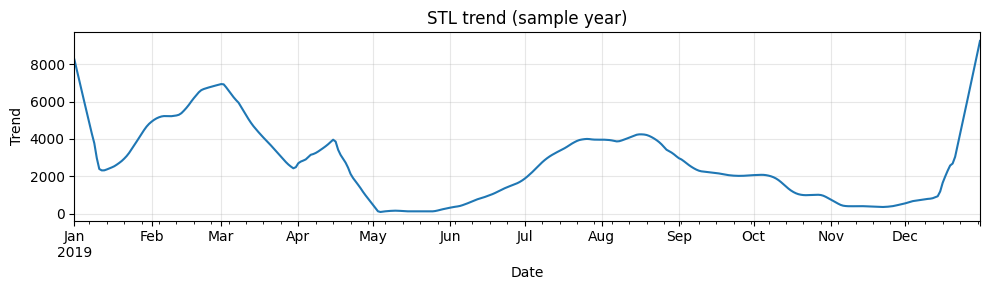

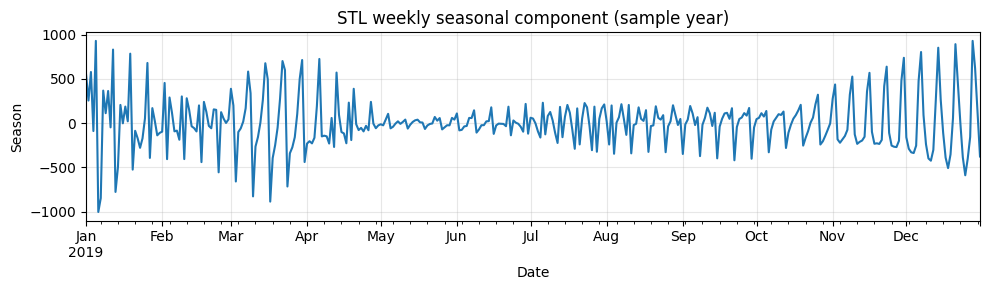

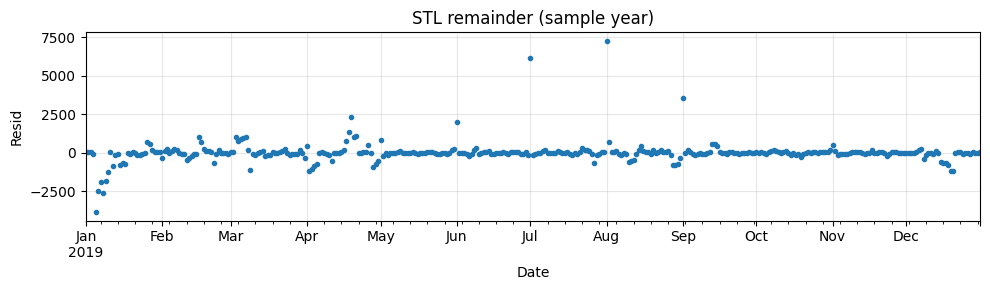

In [18]:
import os
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)

# --- 1) STL on a single representative year (2019) ---
sample = DF_sorted.loc["2019", TARGET].dropna()

stl = STL(sample, period=7, robust=True)
res = stl.fit()

def style_ax(ax, ylabel):
    ax.set_xlabel("Date")
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)
    ax.tick_params(labelsize=10)
    plt.tight_layout()

# -------- 1) Original series --------
fig, ax = plt.subplots(figsize=(10, 3))
sample.plot(ax=ax)
ax.set_title("Tourism daily guest counts (sample year)")
style_ax(ax, TARGET)
plt.savefig(os.path.join(out_dir, "stl_original.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 2) Trend component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.trend.plot(ax=ax)
ax.set_title("STL trend (sample year)")
style_ax(ax, "Trend")
plt.savefig(os.path.join(out_dir, "stl_trend.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 3) Weekly seasonal component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.seasonal.plot(ax=ax)
ax.set_title("STL weekly seasonal component (sample year)")
style_ax(ax, "Season")
plt.savefig(os.path.join(out_dir, "stl_seasonality_weekly.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 4) Remainder component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.resid.plot(ax=ax, style="o", markersize=3)
ax.set_title("STL remainder (sample year)")
style_ax(ax, "Resid")
plt.savefig(os.path.join(out_dir, "stl_residual.png"), dpi=300)
plt.show()
plt.close(fig)




In [10]:
# ============================================
# MSTL DECOMPOSITION (Compatible with new pipeline)
# Generates 5 plots:
# - mstl_original.png
# - mstl_seasonal_weekly.png
# - mstl_seasonal_yearly.png
# - mstl_trend.png
# - mstl_residual.png
# ============================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# -------------------------------------------------------
# 1) Use DF_sorted + TARGET from your new pipeline
# -------------------------------------------------------
df_tourism = DF_sorted.copy()        # old code expected df_tourism
assert TARGET in df_tourism.columns, f"Column '{TARGET}' not found"

# -------------------------------------------------------
# 2) Prepare continuous daily index (same as old code)
# -------------------------------------------------------
y_raw = df_tourism[TARGET].astype(float)

full_idx = pd.date_range(
    y_raw.index.min().normalize(),
    y_raw.index.max().normalize(),
    freq='D'
)

# interpolate small gaps (does NOT overwrite original DF)
y = y_raw.reindex(full_idx).interpolate(limit_direction='both')

date_span = f"{y.index.min().date()} – {y.index.max().date()}"

# -------------------------------------------------------
# 3) Create output folder (LaTeX uses 'figures/')
# -------------------------------------------------------
out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)

# Common function for saving plots
def save_plot(series, title, fname, ylabel=TARGET):
    fig, ax = plt.subplots(figsize=(10, 3.4))
    ax.plot(series.index, series.values, linewidth=1.2)
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()

    path = os.path.join(out_dir, fname)
    fig.savefig(path, dpi=300)
    plt.close(fig)
    return path

# -------------------------------------------------------
# 4) MSTL approximation using two-pass STL (same as old)
# -------------------------------------------------------

# --- Pass 1: Weekly seasonality (m=7)
stl_weekly = STL(y, period=7, robust=True).fit()
S7 = pd.Series(stl_weekly.seasonal, index=full_idx)

# --- Remove weekly
y_no_weekly = y - S7

# --- Pass 2: Yearly seasonality (m=365)
stl_yearly = STL(y_no_weekly, period=365, robust=True).fit()
S365 = pd.Series(stl_yearly.seasonal, index=full_idx)
Trend = pd.Series(stl_yearly.trend, index=full_idx)

# Final residual
Resid = y - (S7 + S365 + Trend)

# -------------------------------------------------------
# 5) Save all MSTL figures
# -------------------------------------------------------
paths = []
paths.append(save_plot(y,     f"MSTL: original series (daily) [{date_span}]",           "mstl_original.png"))
paths.append(save_plot(S7,    f"MSTL weekly seasonal component (m = 7)",                "mstl_seasonal_weekly.png"))
paths.append(save_plot(S365,  f"MSTL yearly seasonal component (m ≈ 365)",              "mstl_seasonal_yearly.png"))
paths.append(save_plot(Trend, f"MSTL trend (after removing weekly + yearly)",           "mstl_trend.png"))
paths.append(save_plot(Resid, f"MSTL residual (after trend + weekly + yearly removed)", "mstl_residual.png"))

# -------------------------------------------------------
# 6) Summary
# -------------------------------------------------------
print("Saved MSTL figures:")
for p in paths:
    print(" -", os.path.abspath(p))

print("\nFigure mapping:")
print("  mstl_original         -> MSTL original")
print("  mstl_seasonal_weekly  -> Weekly seasonal")
print("  mstl_seasonal_yearly  -> Yearly seasonal")
print("  mstl_trend            -> Trend")
print("  mstl_residual         -> Residual")


NameError: name 'DF_sorted' is not defined

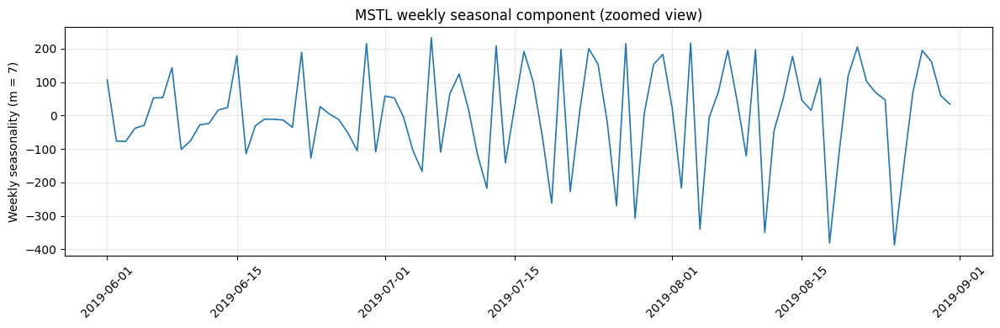

In [3]:
# ============================================
# MSTL WEEKLY COMPONENT — ZOOMED VIEW
# Compatible with your new pipeline + MSTL code
# Saves to: figures/MSTL_weekly_zoomed.png
# ============================================

import matplotlib.pyplot as plt
import pandas as pd
import os

# -------------------------------------------------------
# 1) Get the weekly seasonal component S7
# (Already computed in MSTL section)
# -------------------------------------------------------
# S7 must already exist from the MSTL code:
# S7 = pd.Series(stl_weekly.seasonal, index=full_idx)

if "S7" not in globals():
    raise RuntimeError("S7 not found. Run the main MSTL decomposition first.")

# -------------------------------------------------------
# 2) Select zoom range (change if needed)
# -------------------------------------------------------
zoom_start = "2019-06-01"
zoom_end   = "2019-08-31"

S7_zoom = S7.loc[zoom_start:zoom_end]

# -------------------------------------------------------
# 3) Plot + Save
# -------------------------------------------------------
plt.figure(figsize=(12, 4))
plt.plot(S7_zoom.index, S7_zoom.values, linewidth=1.2)

plt.title("MSTL weekly seasonal component (zoomed view)")
plt.ylabel("Weekly seasonality (m = 7)")
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()

os.makedirs("figures", exist_ok=True)
plt.savefig("figures/MSTL_weekly_zoomed.png", dpi=300)
plt.show()


-----------------------------------------
# FIGURE 1 — STL WEEKLY SEASONAL MAP
-----------------------------------------

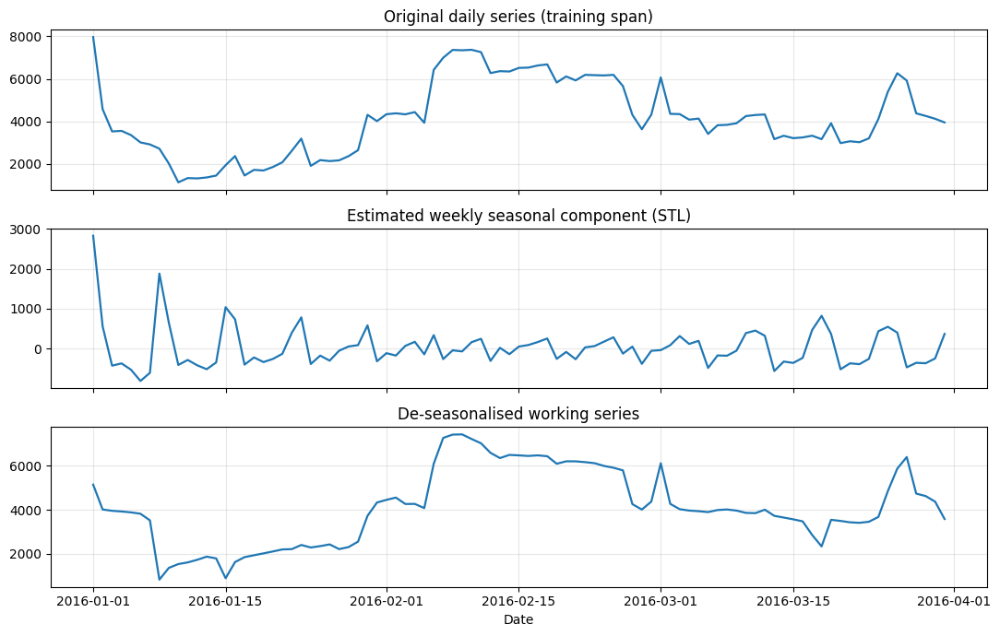

In [63]:
# ==========================================================
# APPENDIX FIGURE — Weekly de-seasonalisation using STL
# (training span only, exactly as used in experiments)
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# ----------------------------
# safety checks
# ----------------------------
if "train" not in globals() or len(train) == 0:
    raise RuntimeError("Training split not available")

if TARGET not in train.columns:
    raise RuntimeError("Target column missing in training data")

# ----------------------------
# STL on training data ONLY
# ----------------------------
y_train = train[TARGET].astype(float)

stl = STL(
    y_train,
    period=7,
    seasonal=7,
    robust=True
).fit()

weekly_seasonal = stl.seasonal
y_deseasonalised = y_train - weekly_seasonal

# ----------------------------
# plotting window (zoomed for readability)
# ----------------------------
PLOT_START = y_train.index.min()
PLOT_END   = PLOT_START + pd.Timedelta(days=90)

mask = (y_train.index >= PLOT_START) & (y_train.index <= PLOT_END)

# ----------------------------
# plot
# ----------------------------
fig, axes = plt.subplots(
    3, 1,
    figsize=(11, 7),
    sharex=True
)

axes[0].plot(y_train.index[mask], y_train.loc[mask], lw=1.6)
axes[0].set_title("Original daily series (training span)")
axes[0].grid(alpha=0.3)

axes[1].plot(weekly_seasonal.index[mask], weekly_seasonal.loc[mask], lw=1.6)
axes[1].set_title("Estimated weekly seasonal component (STL)")
axes[1].grid(alpha=0.3)

axes[2].plot(y_deseasonalised.index[mask], y_deseasonalised.loc[mask], lw=1.6)
axes[2].set_title("De-seasonalised working series")
axes[2].grid(alpha=0.3)

axes[2].set_xlabel("Date")

plt.tight_layout()
plt.savefig("fig_stl_deseasonalisation.png", dpi=300)
plt.show()


-----------------------------------------
# FIGURE 2 — HOLIDAY CENTRE TIMELINE DIAGRAM
-----------------------------------------

Retail holiday centres in TRAIN: 96


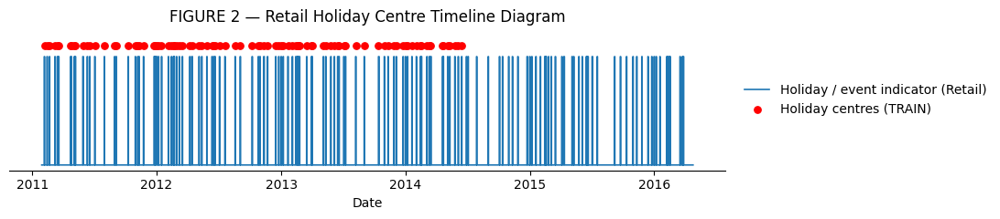

In [30]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ----------------------------
# Retail data
# ----------------------------
idx = DF.index
occasion_flag = DF["is_occasion"].astype(int)

# Centre computation (same logic as before)
def _cluster_centers(idx, flag):
    flag = pd.Series(flag, index=idx).fillna(0).astype(bool)
    days = idx[flag.values]
    if len(days) == 0:
        return pd.DatetimeIndex([])
    d = pd.DatetimeIndex(sorted(pd.to_datetime(days).normalize().unique()))
    blocks, s, e = [], d[0], d[0]
    for nd in d[1:]:
        if (nd - e).days == 1:
            e = nd
        else:
            blocks.append((s, e))
            s = e = nd
    blocks.append((s, e))
    return pd.DatetimeIndex(
        [s + pd.Timedelta(days=((e - s).days)//2) for s, e in blocks]
    )

# Retail TRAIN centres (this WILL exist)
centers_train = _cluster_centers(train.index, train["is_occasion"])

print("Retail holiday centres in TRAIN:", len(centers_train))

# ----------------------------
# Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(13, 2.5))

# Occasion indicator
ax.plot(
    idx,
    occasion_flag,
    drawstyle="steps-mid",
    linewidth=1.2,
    color="#1f77b4",
    label="Holiday / event indicator (Retail)"
)

# Holiday centres — visible here
ax.scatter(
    centers_train,
    np.full(len(centers_train), 1.1),
    color="red",
    s=28,
    zorder=5,
    label="Holiday centres (TRAIN)"
)

# ----------------------------
# Formatting
# ----------------------------
ax.set_ylim(-0.05, 1.25)
ax.set_yticks([])
ax.set_xlabel("Date")
ax.set_title("FIGURE 2 — Retail Holiday Centre Timeline Diagram", fontsize=12)

for spine in ["top", "right", "left"]:
    ax.spines[spine].set_visible(False)

ax.legend(
    loc="center left",
    bbox_to_anchor=(1.01, 0.5),
    frameon=False
)

plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()


In [40]:
print(DF.columns.tolist())


['reported_occupancy', 'reported_capacity', 'reported_guests', 'weekday_name', 'dayofweek', 'month', 'year', 'is_holiday', 'holiday_name', 'is_occasion', 'occasion_name']


 -----------------------------------------
# FIGURE 3 — WINDOW EXTRACTION ILLUSTRATION
-----------------------------------------

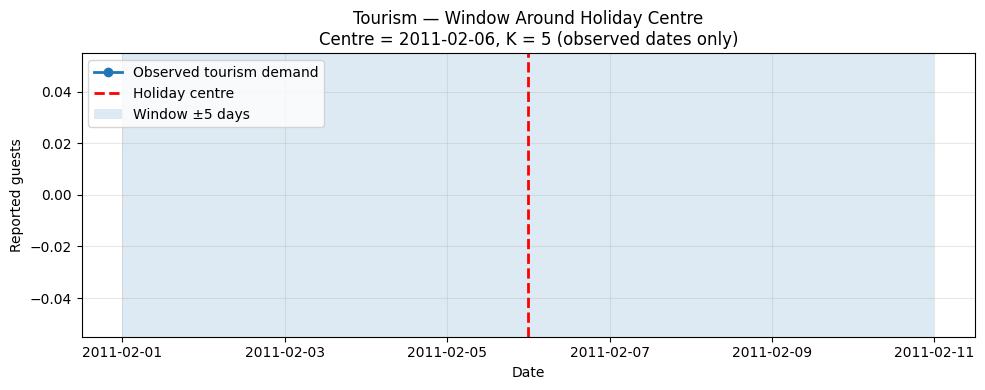

In [62]:
import pandas as pd
import matplotlib.pyplot as plt

# ----------------------------
# Config
# ----------------------------
K = 5
TARGET_COL = "reported_guests"

# Use TRAIN-only holiday centres (experiment-safe)
centers = pd.DatetimeIndex(ARTIFACTS["centers_trainonly"])
if len(centers) == 0:
    raise ValueError("No holiday centres found.")

# Pick one centre to illustrate
c = centers[0]

# ✅ USE ONLY OBSERVED DATES (key fix)
win_idx = DF.loc[
    (DF.index >= c - pd.Timedelta(days=K)) &
    (DF.index <= c + pd.Timedelta(days=K))
].index

y = DF[TARGET_COL].astype(float)

# ----------------------------
# Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(
    win_idx,
    y.loc[win_idx],
    marker="o",
    linewidth=2,
    label="Observed tourism demand"
)

# Holiday centre
ax.axvline(
    c,
    color="red",
    linestyle="--",
    linewidth=2,
    label="Holiday centre"
)

# Window shading (calendar-based)
ax.axvspan(
    c - pd.Timedelta(days=K),
    c + pd.Timedelta(days=K),
    alpha=0.15,
    label=f"Window ±{K} days"
)

ax.set_title(
    "Tourism — Window Around Holiday Centre\n"
    f"Centre = {c.date()}, K = {K} (observed dates only)"
)
ax.set_xlabel("Date")
ax.set_ylabel("Reported guests")
ax.grid(alpha=0.3)
ax.legend(loc="upper left")

plt.tight_layout()
plt.savefig("fig_window_extraction_tourism_observed.png", dpi=300)
plt.show()


# ==========================================================
# APPENDIX FIGURE 4 — Template learning diagnostic (FINAL)
# ==========================================================

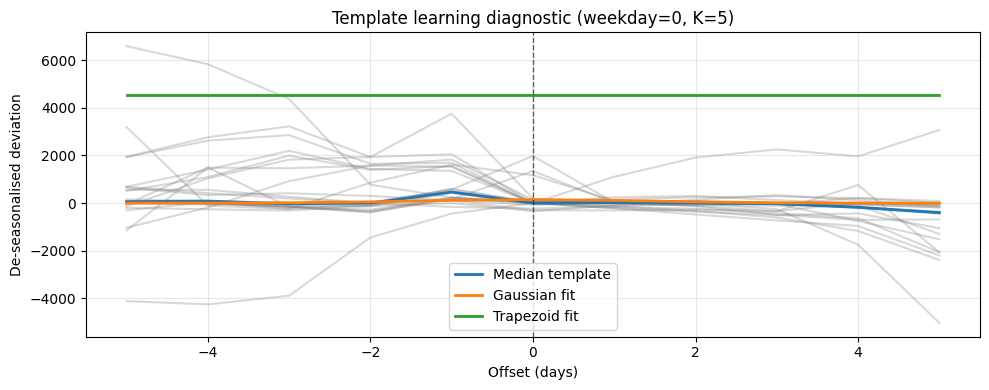

Appendix figure saved → fig_template_learning.png


In [64]:


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# ----------------------------
# Guards
# ----------------------------
required = [
    "train", "val", "TARGET",
    "compute_local_grouped",
    "fit_gaussian_to_median",
    "fit_trapezoid"
]
for name in required:
    if name not in globals():
        raise RuntimeError(f"{name} not found — run EXPERIMENT notebook first")

if "is_holiday" not in train.columns:
    raise RuntimeError("train['is_holiday'] missing — cannot build holiday centres")

# ----------------------------
# Settings
# ----------------------------
K = 5
w = 0   # weekday: Monday
FIG_PATH = "fig_template_learning.png"

# ----------------------------
# Combine TRAIN + VAL (allowed for diagnostics)
# ----------------------------
trval = pd.concat([train, val]).sort_index()

if len(trval) < 30:
    raise RuntimeError("Not enough observations for appendix diagnostic")

# ----------------------------
# Rebuild holiday centres (calendar-only)
# ----------------------------
def _cluster_centers(idx, flag):
    flag = pd.Series(flag, index=idx).fillna(0).astype(bool)
    days = idx[flag.values]
    if len(days) == 0:
        return pd.DatetimeIndex([])
    d = pd.DatetimeIndex(sorted(days.normalize().unique()))
    blocks = []
    s = e = d[0]
    for nd in d[1:]:
        if (nd - e).days == 1:
            e = nd
        else:
            blocks.append((s, e))
            s = e = nd
    blocks.append((s, e))
    return pd.DatetimeIndex([
        s + pd.Timedelta(days=(e - s).days // 2) for s, e in blocks
    ])

centers_all = _cluster_centers(trval.index, trval["is_holiday"])

if len(centers_all) == 0:
    raise RuntimeError("No holiday centres available — cannot plot templates")

# ----------------------------
# Rebuild de-seasonalised series (STL, WEEKLY ONLY)
# ----------------------------
stl = STL(trval[TARGET].astype(float), period=7, seasonal=7, robust=True).fit()

# weekday-mean seasonal map (same as experiment)
seasonal_by_dow = stl.seasonal.groupby(stl.seasonal.index.weekday).mean()

def addback(idx):
    return pd.Series(
        [seasonal_by_dow[d] for d in pd.Index(idx).weekday],
        index=idx,
        dtype=float
    )

trval = trval.copy()
trval["y_ds"] = trval[TARGET].astype(float) - addback(trval.index)

# ----------------------------
# Window extraction (EXACT same function)
# ----------------------------
offs, by_dow, med_by_dow = compute_local_grouped(
    trval,
    "y_ds",
    centers_all,
    K
)

if w not in by_dow or len(by_dow[w]) == 0:
    raise RuntimeError(f"No windows available for weekday={w}")

stack = np.vstack(by_dow[w])
median_u = med_by_dow[w]

# ----------------------------
# Smooth template fits (same logic)
# ----------------------------
gauss_curves = fit_gaussian_to_median(med_by_dow, offs)
trap_curves  = fit_trapezoid(by_dow, K)

gauss_u = gauss_curves[w]
trap_u  = trap_curves[w]

u = np.arange(-K, K + 1)

# ----------------------------
# Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(10, 4))

for row in stack:
    ax.plot(u, row, color="gray", alpha=0.3)

ax.plot(u, median_u, label="Median template", lw=2)
ax.plot(u, gauss_u, label="Gaussian fit", lw=2)
ax.plot(u, trap_u,  label="Trapezoid fit", lw=2)

ax.axvline(0, ls="--", lw=1, color="black", alpha=0.6)

ax.set_xlabel("Offset (days)")
ax.set_ylabel("De-seasonalised deviation")
ax.set_title(f"Template learning diagnostic (weekday={w}, K={K})")
ax.grid(alpha=0.3)
ax.legend()

plt.tight_layout()
plt.savefig(FIG_PATH, dpi=300)
plt.show()

print(f"Appendix figure saved → {FIG_PATH}")


-----------------------------------------
# FIGURE 5 — ROLLING-ORIGIN SCHEMATIC
-----------------------------------------

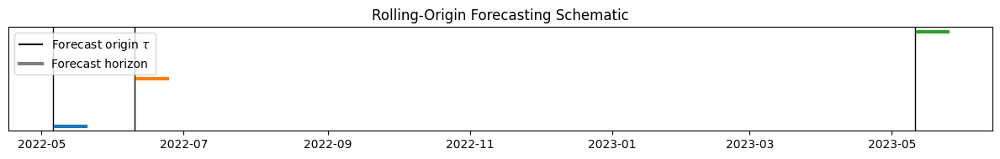

In [66]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

fig, ax = plt.subplots(figsize=(12, 2))

taus = [
    val.index[5],
    val.index[40],
    test.index[10]
]

for i, tau in enumerate(taus):
    ax.axvline(tau, color="black", lw=1)
    ax.annotate(f"$\\tau_{i+1}$", xy=(tau, 0.8), xytext=(tau, 1.0),
                arrowprops=dict(arrowstyle="->"))

    h = 14
    horizon = pd.date_range(tau + pd.Timedelta(days=1),
                            tau + pd.Timedelta(days=h))
    ax.plot(horizon, [i+1]*len(horizon), lw=3)

# ----- Legend (semantic, not colour-specific) -----
origin_line = mlines.Line2D([], [], color='black', label='Forecast origin $\\tau$')
horizon_line = mlines.Line2D([], [], color='gray', lw=3, label='Forecast horizon')

ax.legend(handles=[origin_line, horizon_line], loc="upper left")

ax.set_yticks([])
ax.set_title("Rolling-Origin Forecasting Schematic")
plt.tight_layout()
plt.savefig("fig_rolling_origin.png", dpi=300)
plt.show()


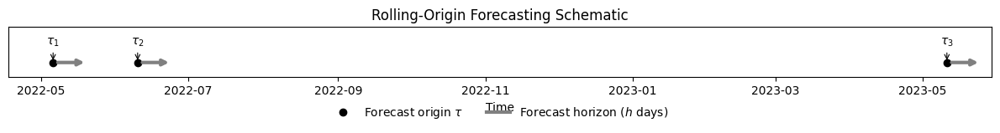

In [9]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import pandas as pd

fig, ax = plt.subplots(figsize=(12, 2.8))

taus = [
    val.index[5],
    val.index[40],
    test.index[10]
]

h = 14
y0 = 0.5  # single baseline

for i, tau in enumerate(taus):
    # Forecast origin: point + arrow
    ax.plot(tau, y0, marker="o", color="black")
    ax.annotate(
        rf"$\tau_{i+1}$",
        xy=(tau, y0),
        xytext=(tau, y0 + 0.25),
        arrowprops=dict(arrowstyle="->", lw=0.8),
        ha="center",
        fontsize=10
    )

    # Forecast horizon: arrow
    ax.annotate(
        "",
        xy=(tau + pd.Timedelta(days=h), y0),
        xytext=(tau + pd.Timedelta(days=1), y0),
        arrowprops=dict(arrowstyle="->", lw=3, color="gray")
    )

# ---- Legend (semantic, minimal) ----
origin_handle = mlines.Line2D([], [], color="black", marker="o",
                              linestyle="None", label="Forecast origin $\\tau$")
horizon_handle = mlines.Line2D([], [], color="gray", lw=3,
                               label="Forecast horizon ($h$ days)")

ax.legend(
    handles=[origin_handle, horizon_handle],
    loc="upper center",
    bbox_to_anchor=(0.5, -0.35),
    ncol=2,
    frameon=False
)

# ---- Formatting ----
ax.set_yticks([])
ax.set_ylim(0.3, 1.0)
ax.set_xlabel("Time")
ax.set_title("Rolling-Origin Forecasting Schematic")

plt.tight_layout(rect=[0, 0.2, 1, 1])
plt.savefig("fig_rolling_origin.png", dpi=300, bbox_inches="tight")
plt.show()


Using baseline : Prophet_logistic_baseline
Using champion: Prophet_lin_trapezoid_stl


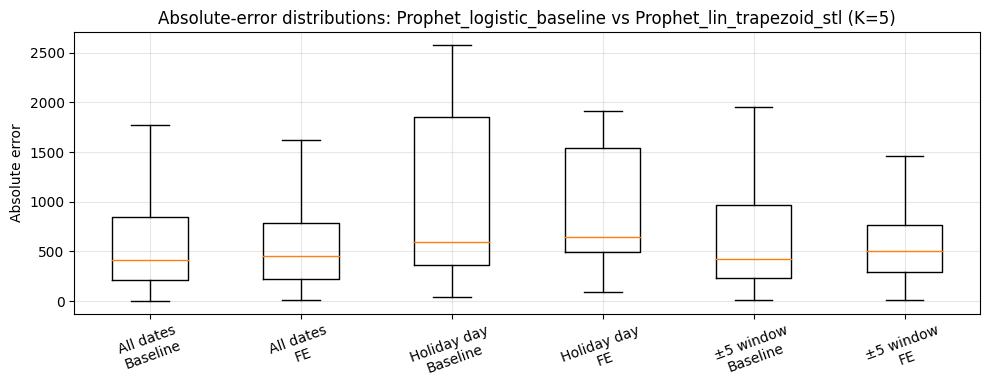

In [11]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ----------------------------
# Configuration
# ----------------------------
TARGET = "reported_guests"
K = 5

# ----------------------------
# Safety checks
# ----------------------------
assert isinstance(test, pd.DataFrame), "test DataFrame missing."
assert K in ARTIFACTS, f"K={K} not found in ARTIFACTS."

baseline = ARTIFACTS[K].get("best_baseline_test", None)
champion = ARTIFACTS[K].get("champion_test", None)

assert baseline is not None, "Baseline not recorded in ARTIFACTS."
assert champion is not None, "Champion not recorded in ARTIFACTS."
assert baseline in test.columns, f"{baseline} not in test columns."
assert champion in test.columns, f"{champion} not in test columns."

print(f"Using baseline : {baseline}")
print(f"Using champion: {champion}")

# ----------------------------
# Series
# ----------------------------
y_true = test[TARGET].astype(float)
y_base = test[baseline].astype(float)
y_fe   = test[champion].astype(float)

# ----------------------------
# Holiday centres
# ----------------------------
centres = pd.DatetimeIndex(ARTIFACTS.get("centers_test", []))
assert len(centres) > 0, "No holiday centres found."

idx = y_true.index

# ----------------------------
# Masks
# ----------------------------
mask_all = pd.Series(True, index=idx)
mask_centre = idx.isin(centres)

mask_window = pd.Series(False, index=idx)
for c in centres:
    mask_window |= (idx >= c - pd.Timedelta(days=K)) & (idx <= c + pd.Timedelta(days=K))

# ----------------------------
# Absolute errors
# ----------------------------
err_base = (y_true - y_base).abs()
err_fe   = (y_true - y_fe).abs()

data = [
    err_base[mask_all],    err_fe[mask_all],
    err_base[mask_centre], err_fe[mask_centre],
    err_base[mask_window], err_fe[mask_window],
]

labels = [
    "All dates\nBaseline", "All dates\nFE",
    "Holiday day\nBaseline", "Holiday day\nFE",
    f"±{K} window\nBaseline", f"±{K} window\nFE"
]

# ----------------------------
# Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(10, 4))
ax.boxplot(data, showfliers=False)
ax.set_xticklabels(labels, rotation=20)
ax.set_ylabel("Absolute error")
ax.set_title(f"Absolute-error distributions: {baseline} vs {champion} (K={K})")
ax.grid(alpha=0.3)

os.makedirs("figures", exist_ok=True)
plt.tight_layout()
plt.savefig("figures/appendix_error_boxplot.png", dpi=300)
plt.show()


In [8]:
print(DF.columns.tolist())


['reported_occupancy', 'reported_capacity', 'reported_guests', 'weekday_name', 'dayofweek', 'month', 'year', 'is_holiday', 'holiday_name', 'is_occasion', 'occasion_name']


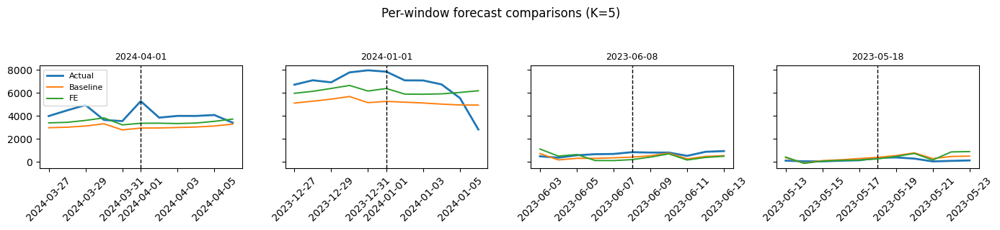

In [12]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ----------------------------
# Configuration
# ----------------------------
TARGET = "reported_guests"
K = 5

assert K in ARTIFACTS, f"K={K} not found in ARTIFACTS."
assert isinstance(test, pd.DataFrame), "test DataFrame missing."

baseline = ARTIFACTS[K]["best_baseline_test"]
champion = ARTIFACTS[K]["champion_test"]

assert baseline in test.columns
assert champion in test.columns

# ----------------------------
# Holiday centres
# ----------------------------
centres = pd.DatetimeIndex(ARTIFACTS.get("centers_test", []))
assert len(centres) > 0

# ----------------------------
# Build per-window comparison table
# ----------------------------
def per_window_comp(df, centers, k, baseline, champion):
    y  = df[TARGET].astype(float)
    yb = df[baseline].astype(float)
    yc = df[champion].astype(float)

    rows = []
    for h in centers:
        m = (df.index >= h - pd.Timedelta(days=k)) & (df.index <= h + pd.Timedelta(days=k))
        if m.sum() < 2:
            continue
        rm_b = np.sqrt(np.mean((y[m] - yb[m])**2))
        rm_c = np.sqrt(np.mean((y[m] - yc[m])**2))
        gain = 100 * (1 - rm_c / rm_b) if rm_b > 0 else np.nan
        rows.append({"Date": h, "Gain": gain})
    return pd.DataFrame(rows).dropna()

pw = per_window_comp(test, centres, K, baseline, champion)
assert not pw.empty, "No valid holiday windows."

# ----------------------------
# Select representative windows
# ----------------------------
good_centres = pw.sort_values("Gain", ascending=False).head(2)["Date"]
bad_centres  = pw.sort_values("Gain", ascending=True).head(2)["Date"]

selected = pd.to_datetime(list(good_centres) + list(bad_centres))

# ----------------------------
# Plot panels
# ----------------------------
fig, axes = plt.subplots(
    1, len(selected), figsize=(14, 3), sharey=True
)

for ax, c in zip(axes, selected):
    idx = test.loc[c - pd.Timedelta(days=K): c + pd.Timedelta(days=K)].index

    ax.plot(idx, test[TARGET].loc[idx], label="Actual", lw=2)
    ax.plot(idx, test[baseline].loc[idx], label="Baseline", lw=1.4)
    ax.plot(idx, test[champion].loc[idx], label="FE", lw=1.4)

    ax.axvline(c, color="black", ls="--", lw=1)
    ax.set_title(c.date(), fontsize=9)
    ax.tick_params(axis="x", rotation=45)

axes[0].legend(loc="upper left", fontsize=8)
plt.suptitle(f"Per-window forecast comparisons (K={K})", y=1.05)

os.makedirs("figures", exist_ok=True)
plt.tight_layout()
plt.savefig("figures/appendix_per_window_examples.png", dpi=300)
plt.show()


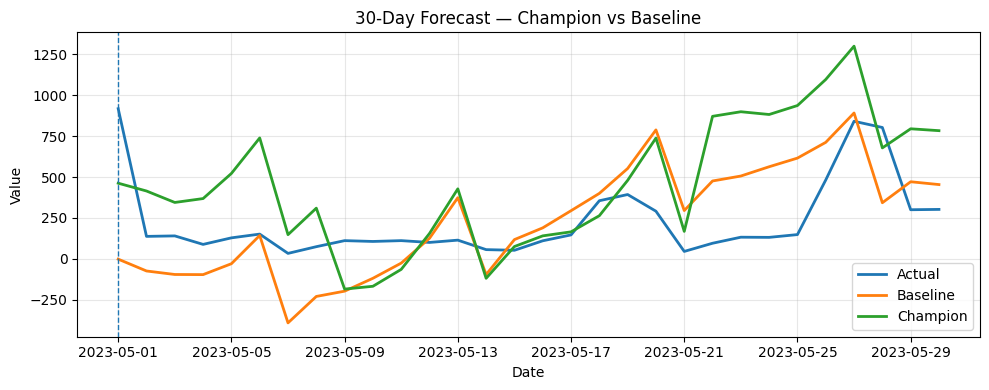

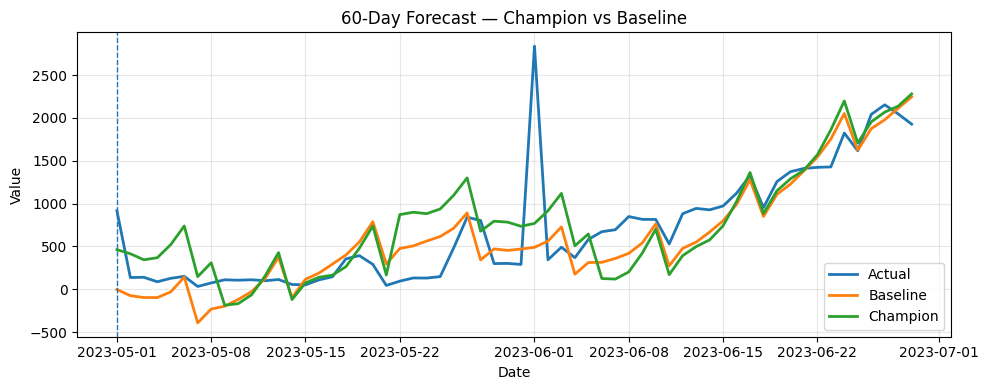

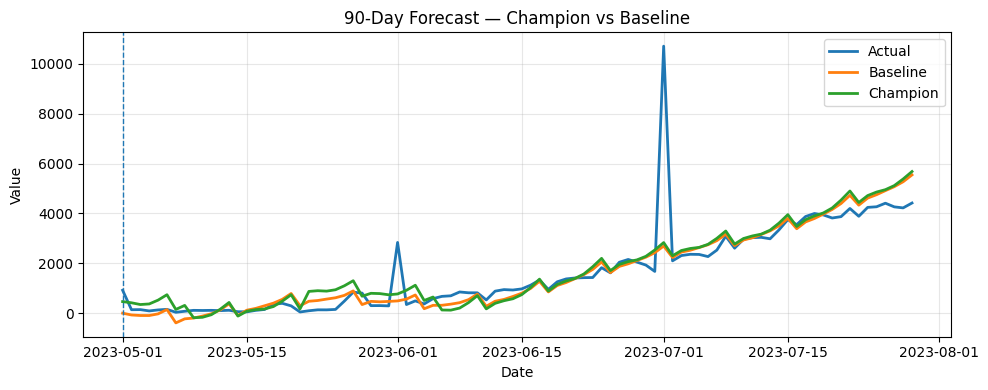

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------
# CONFIG
# -----------------------
HORIZONS = [30, 60, 90]
best_model = champion
base_model = baseline

# -----------------------
# DATA
# -----------------------
df = test.copy().sort_index()
start = df.index.min()

# -----------------------
# PLOTS
# -----------------------
for H in HORIZONS:
    end = start + pd.Timedelta(days=H-1)
    span = df.loc[start:end]

    plt.figure(figsize=(10, 4))
    plt.plot(span.index, span[TARGET], label="Actual", linewidth=2)
    plt.plot(span.index, span[base_model], label="Baseline", linewidth=2)
    plt.plot(span.index, span[best_model], label="Champion", linewidth=2)

    plt.axvline(start, linestyle="--", linewidth=1)
    plt.title(f"{H}-Day Forecast — Champion vs Baseline")
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


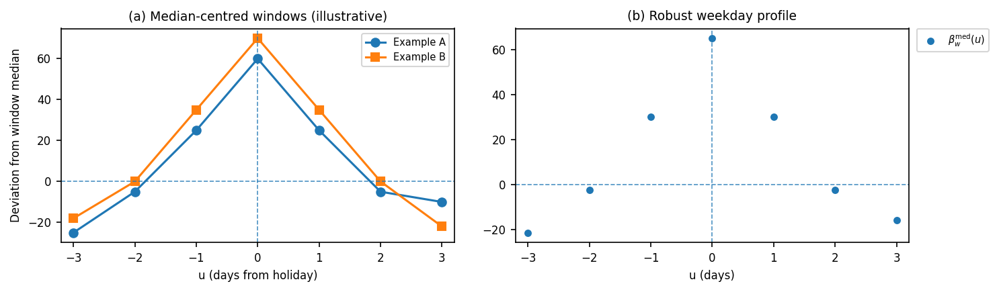

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# --- Data (reconstructed from your figure) ---
u = np.array([-3, -2, -1, 0, 1, 2, 3])

# Example A/B aligned, median-centered windows (illustrative)
ex_a = np.array([-25, -5, 25, 60, 25, -5, -10])
ex_b = np.array([-18,  0, 35, 70, 35,  0, -22])

# Robust weekday profile points (pointwise median of ex_a and ex_b)
beta_med = np.median(np.vstack([ex_a, ex_b]), axis=0)

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(10, 3), dpi=150)

# Panel (a)
ax = axes[0]
ax.plot(u, ex_a, marker='o', linewidth=1.5, label='Example A')
ax.plot(u, ex_b, marker='s', linewidth=1.5, label='Example B')
ax.axhline(0, linestyle='--', linewidth=0.8, alpha=0.8)
ax.axvline(0, linestyle='--', linewidth=0.8, alpha=0.8)
ax.set_title('(a) Median-centred windows (illustrative)', fontsize=9)
ax.set_xlabel('u (days from holiday)', fontsize=8)
ax.set_ylabel('Deviation from window median', fontsize=8)
ax.set_xlim(-3.2, 3.2)
ax.set_xticks(u)
ax.tick_params(labelsize=8)
ax.legend(loc='upper right', fontsize=7, frameon=True)

# Panel (b)
ax = axes[1]
ax.scatter(u, beta_med, s=18, label=r'$\beta^{\mathrm{med}}_w(u)$')
ax.axhline(0, linestyle='--', linewidth=0.8, alpha=0.8)
ax.axvline(0, linestyle='--', linewidth=0.8, alpha=0.8)
ax.set_title('(b) Robust weekday profile', fontsize=9)
ax.set_xlabel('u (days)', fontsize=8)
ax.set_xlim(-3.2, 3.2)
ax.set_xticks(u)
ax.tick_params(labelsize=8)

# Fix overlap: put legend outside the right subplot
ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1.0), fontsize=7,
          frameon=True, borderaxespad=0.)

plt.tight_layout(w_pad=2.0)
plt.savefig("median_demo_fixed.png", bbox_inches="tight", dpi=300)
plt.show()


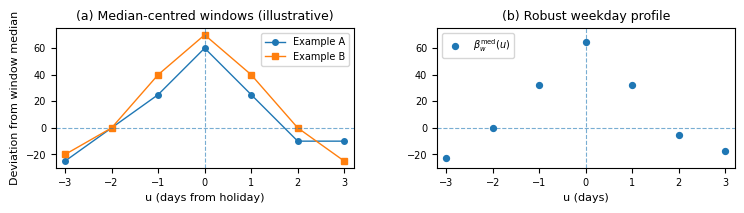

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# x-axis (offset days)
u = np.array([-3, -2, -1, 0, 1, 2, 3])

# Example aligned windows (EDIT these 2 arrays if your original values differ)
A = np.array([-25, 0, 25, 60, 25, -10, -10])   # Example A
B = np.array([-20, 0, 40, 70, 40,   0, -25])   # Example B

# Robust weekday profile (median across occurrences)
beta_med = np.median(np.vstack([A, B]), axis=0)

# ---- IMPORTANT: force exact pixel size 730x232 ----
dpi = 100
fig_w_in = 7.30
fig_h_in = 2.325  # 2.325*100 = 232 px
fig, axes = plt.subplots(1, 2, figsize=(fig_w_in, fig_h_in), dpi=dpi)

# ---------------- Left panel ----------------
ax = axes[0]
ax.plot(u, A, marker="o", linewidth=1.0, markersize=4, label="Example A")
ax.plot(u, B, marker="s", linewidth=1.0, markersize=4, label="Example B")
ax.axhline(0, linestyle="--", linewidth=0.8, alpha=0.6)
ax.axvline(0, linestyle="--", linewidth=0.8, alpha=0.6)
ax.set_title("(a) Median-centred windows (illustrative)", fontsize=9)
ax.set_xlabel("u (days from holiday)", fontsize=8)
ax.set_ylabel("Deviation from window median", fontsize=8)
ax.set_xlim(-3.2, 3.2)
ax.set_ylim(-30, 75)
ax.tick_params(labelsize=7)
ax.legend(loc="upper right", fontsize=7, frameon=True)

# ---------------- Right panel ----------------
ax = axes[1]
ax.scatter(u, beta_med, s=18, label=r"$\beta^{\mathrm{med}}_w(u)$")
ax.axhline(0, linestyle="--", linewidth=0.8, alpha=0.6)
ax.axvline(0, linestyle="--", linewidth=0.8, alpha=0.6)
ax.set_title("(b) Robust weekday profile", fontsize=9)
ax.set_xlabel("u (days)", fontsize=8)
ax.set_xlim(-3.2, 3.2)
ax.set_ylim(-30, 75)
ax.tick_params(labelsize=7)

# FIX: move legend away from the points (no overlap)
ax.legend(loc="upper left", fontsize=7, frameon=True)

# manual spacing (avoids bbox/tight_layout changing pixel size)
fig.subplots_adjust(left=0.06, right=0.99, bottom=0.22, top=0.82, wspace=0.28)

plt.savefig("median_demo_fixed.png", dpi=dpi)
plt.show()


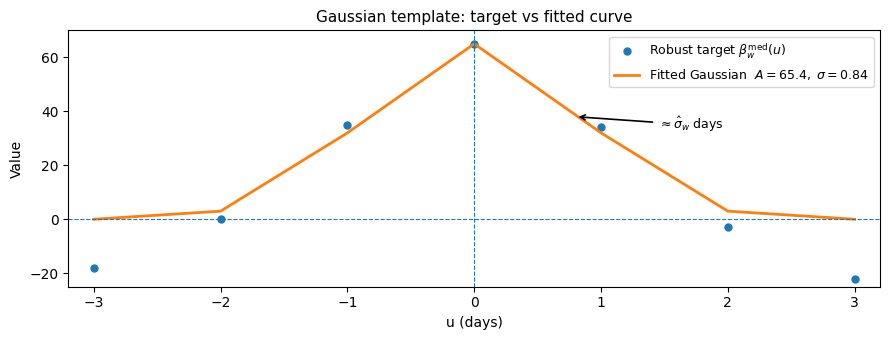

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------
# Data (from your figure)
# ----------------------------
u = np.array([-3, -2, -1, 0, 1, 2, 3])

# Robust target points (β_w^med(u))
beta_med = np.array([-18, 0, 35, 65, 34, -3, -22])

# Fitted "Gaussian" (actually piecewise line as in your plot)
fitted = np.array([0, 3, 32, 65, 32, 3, 0])

# ----------------------------
# Plot
# ----------------------------
fig, ax = plt.subplots(figsize=(9, 3.5))

# Robust target (points)
ax.plot(
    u, beta_med,
    linestyle="none",
    marker="o",
    markersize=5,
    label=r"Robust target $\beta^{\mathrm{med}}_w(u)$"
)

# Fitted curve (orange line)
ax.plot(
    u, fitted,
    linewidth=2,
    label=r"Fitted Gaussian  $A = 65.4,\ \sigma = 0.84$"
)

# Zero reference lines
ax.axhline(0, linestyle="--", linewidth=0.8)
ax.axvline(0, linestyle="--", linewidth=0.8)

# ----------------------------
# Annotation for sigma_w
# ----------------------------
ax.annotate(
    r"$\approx \hat{\sigma}_w$ days",
    xy=(0.8, 38),        # point ON descending slope
    xytext=(1.45, 35),  # text clearly away from curve
    arrowprops=dict(
        arrowstyle="->",
        linewidth=1.2
    ),
    fontsize=9,
    ha="left",
    va="center"
)

# ----------------------------
# Labels & title
# ----------------------------
ax.set_title("Gaussian template: target vs fitted curve", fontsize=11)
ax.set_xlabel("u (days)")
ax.set_ylabel("Value")

# ----------------------------
# Legend (FIXED placement)
# ----------------------------
ax.legend(
    loc="upper right",
    fontsize=9,
    frameon=True
)

# ----------------------------
# Axes limits (match original)
# ----------------------------
ax.set_xlim(-3.2, 3.2)
ax.set_ylim(-25, 70)

plt.tight_layout()
plt.show()


# retail EDA

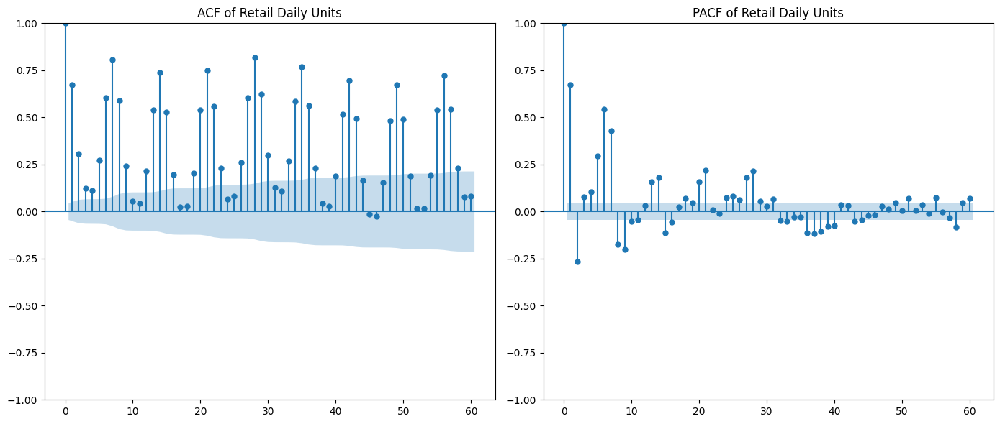

In [2]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

series = DF_sorted[TARGET].dropna()

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plot_acf(series, lags=60, ax=plt.gca())
plt.title("ACF of Retail Daily Units")

plt.subplot(1, 2, 2)
plot_pacf(series, lags=60, ax=plt.gca(), method="ywm")
plt.title("PACF of Retail Daily Units")

plt.tight_layout()
plt.savefig("acf_pacf_retail.png", dpi=300)
plt.show()


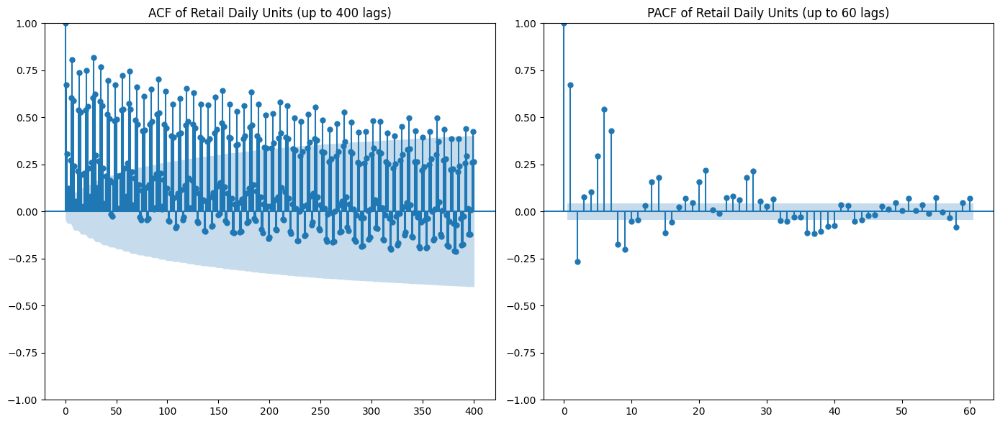

In [3]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

series = DF_sorted[TARGET].dropna()

plt.figure(figsize=(14, 6))

# ---- ACF: long lags (annual-ish) ----
plt.subplot(1, 2, 1)
plot_acf(series, lags=400, ax=plt.gca())
plt.title("ACF of Retail Daily Units (up to 400 lags)")

# ---- PACF: short lags only ----
plt.subplot(1, 2, 2)
plot_pacf(series, lags=60, ax=plt.gca(), method="ywm")
plt.title("PACF of Retail Daily Units (up to 60 lags)")

plt.tight_layout()
plt.savefig("acf_pacf_retail_long.png", dpi=300)
plt.show()


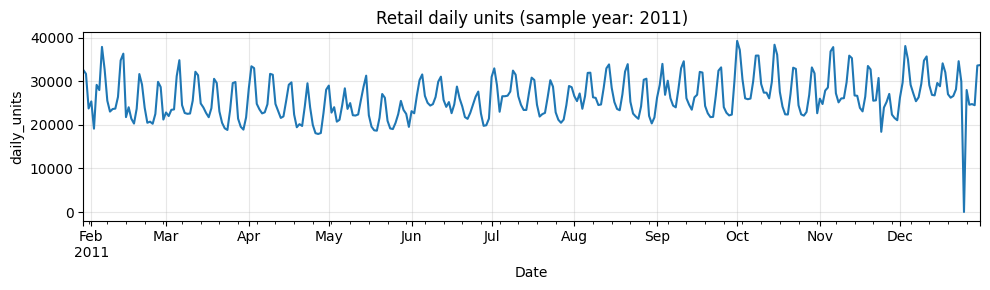

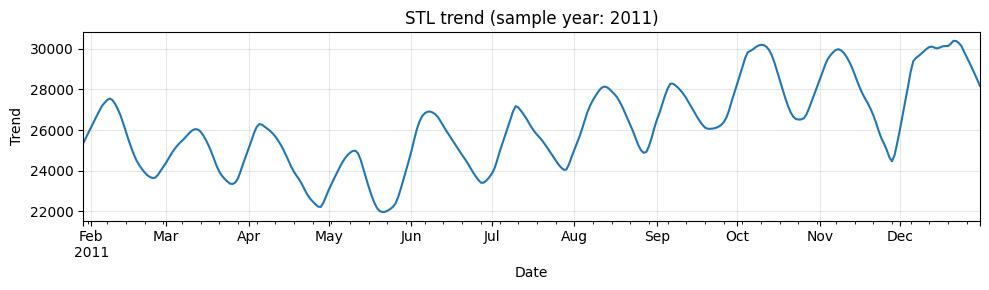

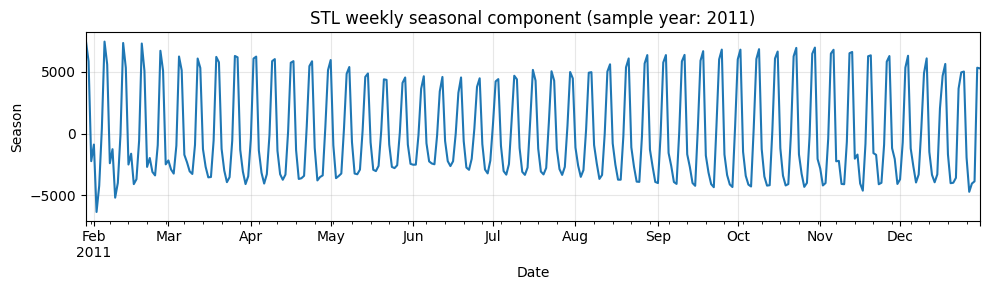

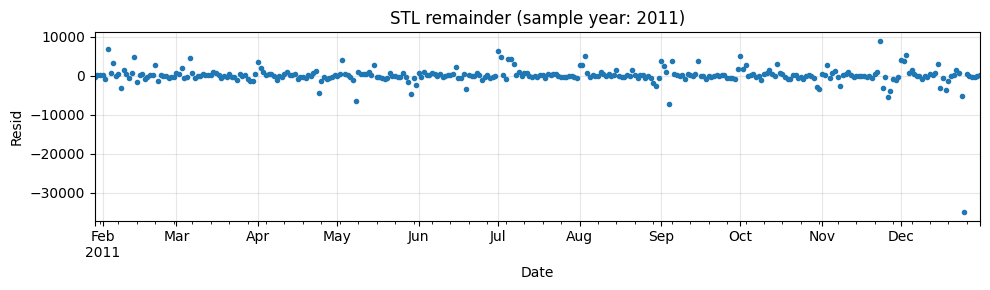

In [4]:
# ============================================
# RETAIL — STL on a single representative year
# (mirrors your tourism STL plotting style)
# ============================================

import os
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# ensure DF_sorted exists
if "DF_sorted" not in globals():
    DF_sorted = DF.sort_index()

out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)

# --- 1) pick one representative year (auto: first full year available) ---
years = sorted(DF_sorted.index.year.unique())
rep_year = years[0]
for y in years:
    # choose first year with most observations (near full year)
    n = DF_sorted.loc[str(y), TARGET].dropna().shape[0]
    if n >= 330:
        rep_year = y
        break

sample = DF_sorted.loc[str(rep_year), TARGET].dropna()

stl = STL(sample, period=7, robust=True)
res = stl.fit()

def style_ax(ax, ylabel):
    ax.set_xlabel("Date")
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)
    ax.tick_params(labelsize=10)
    plt.tight_layout()

# -------- 1) Original series --------
fig, ax = plt.subplots(figsize=(10, 3))
sample.plot(ax=ax)
ax.set_title(f"Retail daily units (sample year: {rep_year})")
style_ax(ax, TARGET)
plt.savefig(os.path.join(out_dir, f"stl_retail_original_{rep_year}.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 2) Trend component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.trend.plot(ax=ax)
ax.set_title(f"STL trend (sample year: {rep_year})")
style_ax(ax, "Trend")
plt.savefig(os.path.join(out_dir, f"stl_retail_trend_{rep_year}.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 3) Weekly seasonal component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.seasonal.plot(ax=ax)
ax.set_title(f"STL weekly seasonal component (sample year: {rep_year})")
style_ax(ax, "Season")
plt.savefig(os.path.join(out_dir, f"stl_retail_seasonality_weekly_{rep_year}.png"), dpi=300)
plt.show()
plt.close(fig)

# -------- 4) Remainder component --------
fig, ax = plt.subplots(figsize=(10, 3))
res.resid.plot(ax=ax, style="o", markersize=3)
ax.set_title(f"STL remainder (sample year: {rep_year})")
style_ax(ax, "Resid")
plt.savefig(os.path.join(out_dir, f"stl_retail_residual_{rep_year}.png"), dpi=300)
plt.show()
plt.close(fig)


In [5]:
# ============================================
# RETAIL — MSTL DECOMPOSITION (same style as tourism code)
# Generates 5 plots in figures/:
# - mstl_retail_original.png
# - mstl_retail_seasonal_weekly.png
# - mstl_retail_seasonal_yearly.png
# - mstl_retail_trend.png
# - mstl_retail_residual.png
# ============================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# -------------------------------------------------------
# 1) Use DF_sorted + TARGET from your retail pipeline
# -------------------------------------------------------
df_retail = DF_sorted.copy()
assert TARGET in df_retail.columns, f"Column '{TARGET}' not found"

# -------------------------------------------------------
# 2) Prepare continuous daily index (same as tourism code)
# -------------------------------------------------------
y_raw = df_retail[TARGET].astype(float)

full_idx = pd.date_range(
    y_raw.index.min().normalize(),
    y_raw.index.max().normalize(),
    freq="D"
)

# interpolate small gaps (does NOT overwrite original DF)
y = y_raw.reindex(full_idx).interpolate(limit_direction="both")

date_span = f"{y.index.min().date()} – {y.index.max().date()}"

# -------------------------------------------------------
# 3) Create output folder (LaTeX uses 'figures/')
# -------------------------------------------------------
out_dir = "figures"
os.makedirs(out_dir, exist_ok=True)

def save_plot(series, title, fname, ylabel=TARGET):
    fig, ax = plt.subplots(figsize=(10, 3.4))
    ax.plot(series.index, series.values, linewidth=1.2)
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()

    path = os.path.join(out_dir, fname)
    fig.savefig(path, dpi=300)
    plt.close(fig)
    return path

# -------------------------------------------------------
# 4) MSTL approximation using two-pass STL (same as tourism)
# -------------------------------------------------------

# --- Pass 1: Weekly seasonality (m=7)
stl_weekly = STL(y, period=7, robust=True).fit()
S7 = pd.Series(stl_weekly.seasonal, index=full_idx)

# --- Remove weekly
y_no_weekly = y - S7

# --- Pass 2: Yearly seasonality (m=365)
stl_yearly = STL(y_no_weekly, period=365, robust=True).fit()
S365  = pd.Series(stl_yearly.seasonal, index=full_idx)
Trend = pd.Series(stl_yearly.trend, index=full_idx)

# Final residual
Resid = y - (S7 + S365 + Trend)

# -------------------------------------------------------
# 5) Save all MSTL figures
# -------------------------------------------------------
paths = []
paths.append(save_plot(y,     f"MSTL: original series (daily) [{date_span}]",           "mstl_retail_original.png"))
paths.append(save_plot(S7,    f"MSTL weekly seasonal component (m = 7)",                "mstl_retail_seasonal_weekly.png"))
paths.append(save_plot(S365,  f"MSTL yearly seasonal component (m ≈ 365)",              "mstl_retail_seasonal_yearly.png"))
paths.append(save_plot(Trend, f"MSTL trend (after removing weekly + yearly)",           "mstl_retail_trend.png"))
paths.append(save_plot(Resid, f"MSTL residual (after trend + weekly + yearly removed)", "mstl_retail_residual.png"))

# -------------------------------------------------------
# 6) Summary
# -------------------------------------------------------
print("Saved Retail MSTL figures:")
for p in paths:
    print(" -", os.path.abspath(p))

print("\nFigure mapping:")
print("  mstl_retail_original         -> MSTL original")
print("  mstl_retail_seasonal_weekly  -> Weekly seasonal")
print("  mstl_retail_seasonal_yearly  -> Yearly seasonal")
print("  mstl_retail_trend            -> Trend")
print("  mstl_retail_residual         -> Residual")


Saved Retail MSTL figures:
 - /kaggle/working/figures/mstl_retail_original.png
 - /kaggle/working/figures/mstl_retail_seasonal_weekly.png
 - /kaggle/working/figures/mstl_retail_seasonal_yearly.png
 - /kaggle/working/figures/mstl_retail_trend.png
 - /kaggle/working/figures/mstl_retail_residual.png

Figure mapping:
  mstl_retail_original         -> MSTL original
  mstl_retail_seasonal_weekly  -> Weekly seasonal
  mstl_retail_seasonal_yearly  -> Yearly seasonal
  mstl_retail_trend            -> Trend
  mstl_retail_residual         -> Residual
